<a href="https://colab.research.google.com/github/Dazhou2000/Msc-Project/blob/master/select_features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 12.4 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import plot_importance,plot_tree
from sklearn.model_selection import train_test_split
import numpy as np
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, classification_report, accuracy_score
import optuna
import json
import os
from sklearn.feature_selection import SelectFromModel
from numpy import sort

def load_data(patient_id, window_size):
    data_path = f'/content/drive/My Drive/Msc Project/features_and_labels_detection/P{patient_id} features and seizure labels with window_{window_size}.csv'
    data = pd.read_csv(data_path)
    data = data.dropna()
    return data

def save_best_params(patient_id, window_size, best_params):
    if not os.path.exists(f'/content/drive/My Drive/Msc Project/best_params_xgb_all_features'):
        os.makedirs(f'/content/drive/My Drive/Msc Project/best_params_xgb_all_features')

    params_file = f'/content/drive/My Drive/Msc Project/best_params_xgb_all_features/params_patient_{patient_id}_window_{window_size}.json'
    with open(params_file, 'w') as file:
        json.dump(best_params, file)

def load_best_params(patient_id, window_size):
    params_file = f'/content/drive/My Drive/Msc Project/best_params_xgb_all_features/params_patient_{patient_id}_window_{window_size}.json'
    if os.path.exists(params_file):
        with open(params_file, 'r') as file:
            best_params = json.load(file)
        return best_params
    else:
        return None

def save_best_scores(patient_id, window_size, best_scores):
    if not os.path.exists(f'/content/drive/My Drive/Msc Project/best_scores_xgb_all_features'):
        os.makedirs(f'/content/drive/My Drive/Msc Project/best_scores_xgb_all_features')
    scores_file = f'/content/drive/My Drive/Msc Project/best_scores_xgb_all_features/best_scores_more.csv'
    row_name = f'{patient_id}_window_{window_size}'
    scores_df = pd.DataFrame(best_scores, index=[row_name])
    if os.path.exists(scores_file):
        existing_df = pd.read_csv(scores_file, index_col=0)
        if row_name in existing_df.index:
            existing_df.loc[row_name] = scores_df.loc[row_name]
            existing_df.to_csv(scores_file)
        else:
            updated_df = pd.concat([existing_df, scores_df])
            updated_df.to_csv(scores_file)
    else:
        scores_df.to_csv(scores_file)
# Patient id:'1_','3_','4_','5_','10','13','19','23','27','29','30','31'. Window_size: 24,72,144,288
patient_id = '31'
window_size = 288

data = load_data(patient_id, window_size)

X = data.drop(columns=['label', 'timestamp', 'seizure_event', 'Unnamed: 0'])
y = data['label']

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, shuffle=False, random_state=42)
smote = SMOTE(random_state=42, n_jobs=-1)
X_train, y_train = smote.fit_resample(X_train, y_train)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False, random_state=42)

def objective(trial):
    params = {
        'verbosity': 1,
        'lambda': trial.suggest_float('lambda', 1.0, 2.0,log=True),
        'alpha': trial.suggest_float('alpha', 1e-5, 100.0,log=True),
        'max_depth':trial.suggest_int('max_depth', 3, 10),
        'eta': trial.suggest_float('eta', 1e-5, 1.0,log=True),
        'gamma': trial.suggest_float('gamma', 0.1, 0.2,log=True),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'grow_policy':trial.suggest_categorical('grow_policy', ['depthwise', 'lossguide']),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
    }


    xgb_model = XGBClassifier(**params, use_label_encoder=False,eval_metric='auc', tree_method='hist', random_state=42,device='gpu',booster='gbtree',objective='binary:logistic')
    xgb_model.fit(X_train, y_train)
    y_pred_val = xgb_model.predict(X_val)
    y_pred_val_scores = xgb_model.predict_proba(X_val)[:,1]
    auc_val = roc_auc_score(y_val, y_pred_val_scores)
    return auc_val

study = optuna.create_study(direction='maximize')

best_params = load_best_params(patient_id, window_size)
if best_params:
    study.enqueue_trial(best_params)

study.optimize(objective, n_trials=1)

best_params = study.best_params
print("Best parameters found by Optuna:", best_params)

save_best_params(patient_id, window_size, best_params)

xgb_model = XGBClassifier(**best_params,use_label_encoder=False,eval_metric='auc', tree_method='hist', random_state=42,device='gpu',booster='gbtree',objective='binary:logistic')
xgb_model.fit(X_train, y_train)

y_pred_train = xgb_model.predict(X_train)
y_pred_val = xgb_model.predict(X_val)
y_pred_test = xgb_model.predict(X_test)


# Calculate roc_auc_score
y_pred_train_scores = xgb_model.predict_proba(X_train)[:,1]
auc_train = roc_auc_score(y_train, y_pred_train)
y_pred_val_scores = xgb_model.predict_proba(X_val)[:,1]
auc_val = roc_auc_score(y_val, y_pred_val_scores)
y_pred_test_scores = xgb_model.predict_proba(X_test)[:,1]
auc_test = roc_auc_score(y_test, y_pred_test_scores)

print("Train classification report:")
print(classification_report(y_train, y_pred_train))

print("Validation classification report:")
print(classification_report(y_val, y_pred_val))

print("Test classification report:")
print(classification_report(y_test, y_pred_test))

print("Train accuracy:", accuracy_score(y_train, y_pred_train))
print("Validation accuracy:", accuracy_score(y_val, y_pred_val))
print("Test accuracy:", accuracy_score(y_test, y_pred_test))

print("Val auc:", auc_val)
print("Test auc:", auc_test)
print("Train auc:", auc_train)

best_scores = {
    "sensitivity": classification_report(y_test, y_pred_test, output_dict=True)['1']['recall'],
    "auc": auc_test,
    "specificity": classification_report(y_test, y_pred_test, output_dict=True)['0']['recall'],
    "accuracy": accuracy_score(y_test, y_pred_test)
}

save_best_scores(patient_id, window_size, best_scores)

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-11 23:10:13,401] A new study created in memory with name: no-name-3f997d5f-8a4a-4983-96a4-f07382e2a418
[I 2024-07-11 23:10:14,532] Trial 0 finished with value: 0.7638945096726331 and parameters: {'lambda': 1.036918328391306, 'alpha': 0.0001522309491507912, 'max_depth': 7, 'eta': 0.011687956888259913, 'gamma': 0.15334770118325552, 'subsample': 0.568970414904262, 'colsample_bytree': 0.7262853391803051, 'grow_policy': 'lossguide', 'min_child_weight': 7}. Best is trial 0 with value: 0.7638945096726331.
[I 2024-07-11 23:10:15,459] Trial 1 finished with value: 0.7233767692146013 and parameters: {'lambda': 1.065980849518435, 'alpha': 0.014707313123608278, 'max_depth': 10, 'eta': 0.03795806507563016, 'gamma': 

Best parameters found by Optuna: {'lambda': 1.036918328391306, 'alpha': 0.0001522309491507912, 'max_depth': 7, 'eta': 0.011687956888259913, 'gamma': 0.15334770118325552, 'subsample': 0.568970414904262, 'colsample_bytree': 0.7262853391803051, 'grow_policy': 'lossguide', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

           0       0.88      0.89      0.88     81314
           1       0.89      0.88      0.88     81314

    accuracy                           0.88    162628
   macro avg       0.88      0.88      0.88    162628
weighted avg       0.88      0.88      0.88    162628

Validation classification report:
              precision    recall  f1-score   support

           0       0.77      0.87      0.82      9623
           1       0.62      0.46      0.53      4602

    accuracy                           0.73     14225
   macro avg       0.70      0.66      0.67     14225
weighted avg       0.72      0.73      0.72  

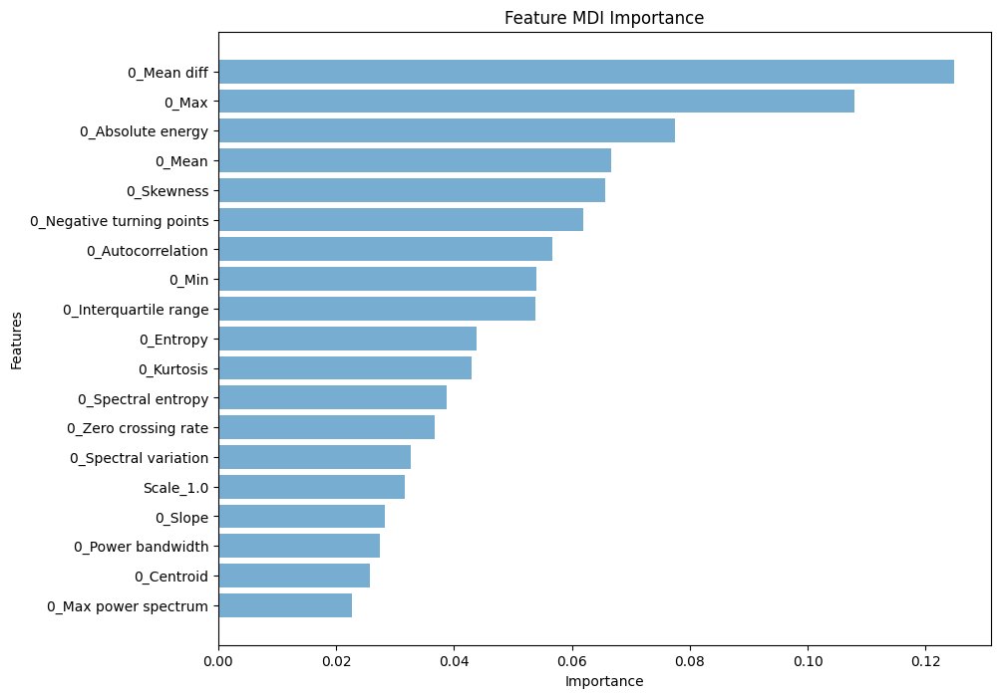

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=19, Auc: 76.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=18, Auc: 75.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=17, Auc: 75.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=16, Auc: 75.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=15, Auc: 74.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=14, Auc: 74.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=13, Auc: 73.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=12, Auc: 74.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=11, Auc: 73.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=10, Auc: 74.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=9, Auc: 74.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=8, Auc: 72.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=7, Auc: 73.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=6, Auc: 73.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=5, Auc: 73.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.067, n=4, Auc: 72.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.078, n=3, Auc: 69.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.108, n=2, Auc: 66.56%
Thresh=0.125, n=1, Auc: 65.63%
    Threshold  Num Features       AUC
0    0.022745            19  0.763895
1    0.025749            18  0.755960
2    0.027476            17  0.758156
3    0.028227            16  0.753726
4    0.031675            15  0.746877
5    0.032615            14  0.747592
6    0.036769            13  0.738859
7    0.038808            12  0.745706
8    0.042979            11  0.732735
9    0.043822            10  0.740132
10   0.053832             9  0.740947
11   0.053972             8  0.726074
12   0.056656             7  0.737087
13   0.061976             6  0.738125
14   0.065723             5  0.738743
15   0.066640             4  0.720758
16   0.077522             3  0.692980
17   0.107971             2  0.665552
18   0.124844             1  0.656293


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


In [ ]:
feature_names = X.columns
importances_MDI = xgb_model.feature_importances_
sorted_idx = importances_MDI.argsort()
importance_df_MDI = pd.DataFrame({'Importance': importances_MDI[sorted_idx]},index=feature_names[sorted_idx])
importance_df_MDI.to_csv(f'/content/drive/My Drive/Msc Project/importance_feature/P{patient_id}MDI_importance with window_{window_size}.csv')
# plot
plt.figure(figsize=(10, 8))
plt.barh(importance_df_MDI.index, importance_df_MDI['Importance'],align='center', alpha=0.6, ecolor='black', capsize=10)
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature MDI Importance')
plt.show()

# Fit model using each importance as a threshold
thresholds = sort(xgb_model.feature_importances_)
results = []
for thresh in thresholds:
 # select features using threshold
 selection = SelectFromModel(xgb_model, threshold=thresh, prefit=True)
 select_X_train = selection.transform(X_train)
 # train model
 selection_model = XGBClassifier(**best_params,use_label_encoder=False,eval_metric='auc', tree_method='hist', random_state=42,device='gpu',booster='gbtree',objective='binary:logistic')
 selection_model.fit(select_X_train, y_train)
 # eval model
 select_X_val = selection.transform(X_val)
 predictions = selection_model.predict_proba(select_X_val)[:,1]
 auc = roc_auc_score(y_val, predictions)
 print("Thresh=%.3f, n=%d, Auc: %.2f%%" % (thresh, select_X_train.shape[1], auc*100.0))
 results.append((thresh, select_X_train.shape[1], auc))

# Convert results to DataFrame for easier handling
results_df = pd.DataFrame(results, columns=['Threshold', 'Num Features', 'AUC'])
results_df.to_csv(f'/content/drive/My Drive/Msc Project/select_feature/P{patient_id}_selected_features_with_window_{window_size}.csv')
print(results_df)

Processing patient 1_ with window size 24 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:24:48,670] A new study created in memory with name: no-name-233d9efe-5d86-4a9f-87bd-e740780719ff


14282
14282
14258
14258


[I 2024-07-18 17:24:49,272] Trial 0 finished with value: 0.7067737737916577 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7067737737916577.
[I 2024-07-18 17:24:49,986] Trial 1 finished with value: 0.7115845869363253 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.7115845869363253.
[I 2024-07-18 17:24:50,567] Trial 2 finished with value: 0.7119461268332579 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.4896873812430733, 'alpha': 0.058823682085930785, 'max_depth': 3, 'eta': 0.09839158236471567, 'gamma': 0.19825953841542293, 'subsample': 0.7330650279897961, 'colsample_bytree': 0.6000399978581875, 'grow_policy': 'lossguide', 'min_child_weight': 4}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.88      0.96      0.92    112280
         1.0       0.95      0.87      0.91    112280

    accuracy                           0.91    224560
   macro avg       0.92      0.91      0.91    224560
weighted avg       0.92      0.91      0.91    224560

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97     13993
         1.0       0.07      0.15      0.09       288

    accuracy                           0.94     14281
   macro avg       0.52      0.55      0.53     14281
weighted avg       0.96      0.94      0.95  

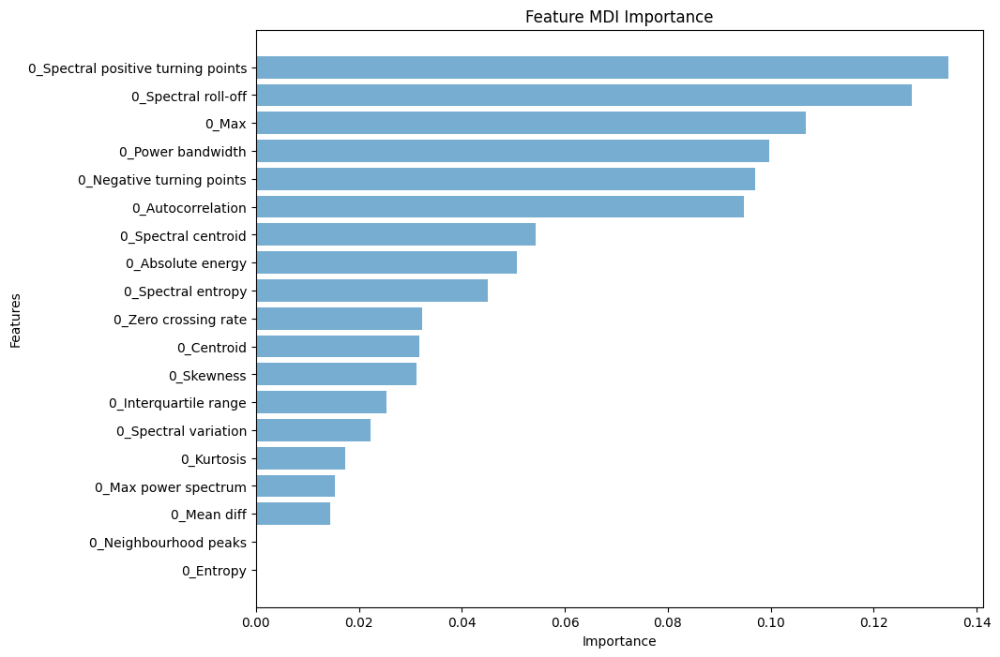

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=19, Auc: 75.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=19, Auc: 75.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=17, Auc: 74.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=16, Auc: 75.06%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=15, Auc: 74.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=14, Auc: 73.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=13, Auc: 73.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=12, Auc: 72.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=11, Auc: 72.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=10, Auc: 72.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=9, Auc: 71.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=8, Auc: 69.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=7, Auc: 70.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.095, n=6, Auc: 69.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.097, n=5, Auc: 68.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.100, n=4, Auc: 69.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.107, n=3, Auc: 69.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.127, n=2, Auc: 52.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.134, n=1, Auc: 53.46%
    Threshold  Num Features       AUC
0    0.000000            19  0.755645
1    0.000000            19  0.755645
2    0.014413            17  0.742108
3    0.015352            16  0.750559
4    0.017354            15  0.745589
5    0.022265            14  0.730705
6    0.025306            13  0.734265
7    0.031201            12  0.729585
8    0.031725            11  0.720820
9    0.032317            10  0.725246
10   0.044975             9  0.718975
11   0.050763             8  0.695182
12   0.054266             7  0.709093
13   0.094763             6  0.697462
14   0.096992             5  0.680899
15   0.099744             4  0.699141
16   0.106783             3  0.697680
17   0.127306             2  0.527763
18   0.134477             1  0.534552
Processing patient 1_ with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:25:44,450] A new study created in memory with name: no-name-6fea92c4-f65a-4a8d-9853-c70aee367604


14282
14282
14162
14162


[I 2024-07-18 17:25:45,011] Trial 0 finished with value: 0.5684794282061666 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5684794282061666.
[I 2024-07-18 17:25:45,745] Trial 1 finished with value: 0.5718027664625964 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5718027664625964.
[I 2024-07-18 17:25:46,378] Trial 2 finished with value: 0.582316703986914 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, '

Best parameters found by Optuna: {'lambda': 1.0249777006145986, 'alpha': 0.22893768768585743, 'max_depth': 4, 'eta': 0.08419914955486767, 'gamma': 0.18117423080784012, 'subsample': 0.8401091514926825, 'colsample_bytree': 0.9033681103034018, 'grow_policy': 'depthwise', 'min_child_weight': 8}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.99      0.94    112280
         1.0       0.99      0.89      0.94    112280

    accuracy                           0.94    224560
   macro avg       0.95      0.94      0.94    224560
weighted avg       0.95      0.94      0.94    224560

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99     13993
         1.0       0.09      0.02      0.04       288

    accuracy                           0.98     14281
   macro avg       0.53      0.51      0.51     14281
weighted avg       0.96      0.98      0.97   

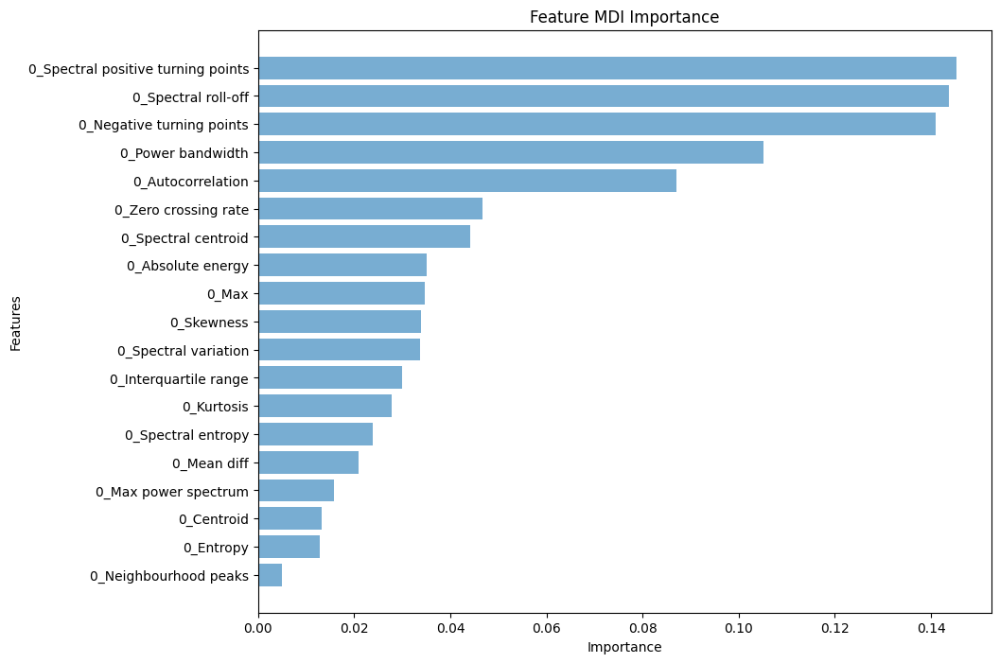

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.005, n=19, Auc: 66.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=18, Auc: 63.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=17, Auc: 62.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=16, Auc: 62.40%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=15, Auc: 64.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=14, Auc: 61.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=13, Auc: 61.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=12, Auc: 60.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=11, Auc: 61.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=10, Auc: 61.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=9, Auc: 62.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=8, Auc: 62.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=7, Auc: 57.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=6, Auc: 52.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=5, Auc: 52.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.105, n=4, Auc: 47.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.141, n=3, Auc: 49.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.144, n=2, Auc: 48.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.145, n=1, Auc: 48.25%
    Threshold  Num Features       AUC
0    0.004995            19  0.665943
1    0.012887            18  0.631553
2    0.013216            17  0.621888
3    0.015879            16  0.623953
4    0.020899            15  0.649383
5    0.023903            14  0.616944
6    0.027723            13  0.612593
7    0.029869            12  0.604183
8    0.033778            11  0.612734
9    0.033829            10  0.611128
10   0.034713             9  0.627259
11   0.035156             8  0.624680
12   0.044171             7  0.573618
13   0.046742             6  0.528832
14   0.087041             5  0.524874
15   0.105091             4  0.479389
16   0.141017             3  0.499337
17   0.143807             2  0.489366
18   0.145284             1  0.482547
Processing patient 1_ with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:27:41,075] A new study created in memory with name: no-name-82dc373a-b4a0-4e84-9d81-8cfe0dd40d19


14277
14277
14253
14253


[I 2024-07-18 17:27:41,735] Trial 0 finished with value: 0.7414478806246795 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7414478806246795.
[I 2024-07-18 17:27:42,554] Trial 1 finished with value: 0.7398847716434588 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.7414478806246795.
[I 2024-07-18 17:27:43,119] Trial 2 finished with value: 0.7469689948761107 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.0597647574754334, 'alpha': 98.49841404455445, 'max_depth': 3, 'eta': 0.0024317861611224704, 'gamma': 0.13818645706601443, 'subsample': 0.5849535815294508, 'colsample_bytree': 0.6317211766929347, 'grow_policy': 'depthwise', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.75      0.60      0.67    108671
         1.0       0.67      0.80      0.73    108671

    accuracy                           0.70    217342
   macro avg       0.71      0.70      0.70    217342
weighted avg       0.71      0.70      0.70    217342

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.58      0.73     13494
         1.0       0.11      0.87      0.19       783

    accuracy                           0.59     14277
   macro avg       0.55      0.72      0.46     14277
weighted avg       0.94      0.59      0.70   

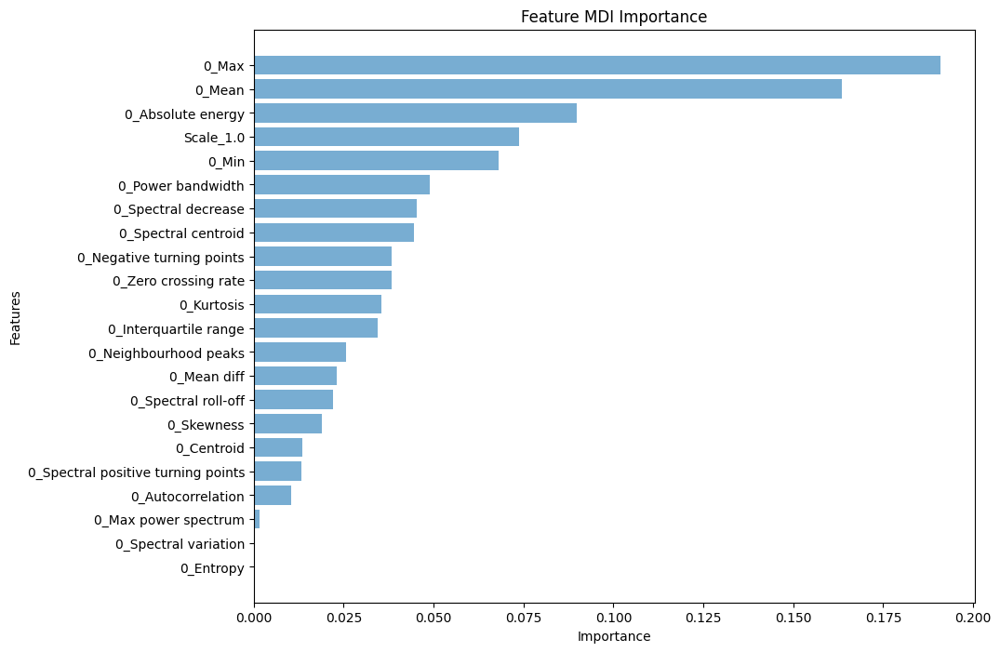

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 77.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 77.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.002, n=20, Auc: 76.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=19, Auc: 76.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=18, Auc: 76.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=17, Auc: 77.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=16, Auc: 76.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=15, Auc: 76.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=14, Auc: 76.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=13, Auc: 75.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=12, Auc: 76.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=11, Auc: 76.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=10, Auc: 76.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=9, Auc: 75.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=8, Auc: 75.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=7, Auc: 75.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=6, Auc: 75.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=5, Auc: 76.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=4, Auc: 74.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.090, n=3, Auc: 77.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.163, n=2, Auc: 77.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.191, n=1, Auc: 77.97%
    Threshold  Num Features       AUC
0    0.000000            22  0.774825
1    0.000000            22  0.774825
2    0.001737            20  0.765293
3    0.010311            19  0.767955
4    0.013340            18  0.766747
5    0.013414            17  0.774531
6    0.018990            16  0.767081
7    0.021981            15  0.766036
8    0.023138            14  0.763719
9    0.025700            13  0.759752
10   0.034552            12  0.762155
11   0.035436            11  0.764425
12   0.038306            10  0.761747
13   0.038361             9  0.759440
14   0.044457             8  0.751872
15   0.045230             7  0.754776
16   0.048929             6  0.756245
17   0.068197             5  0.764866
18   0.073761             4  0.746953
19   0.089776             3  0.774419
20   0.163485             2  0.775098
21   0.190898             1  0.779655
Processing patient 1_ with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:28:43,678] A new study created in memory with name: no-name-5e54bc3b-d133-47ba-b092-510cc4e40fc2


14277
14277
14157
14157


[I 2024-07-18 17:28:44,300] Trial 0 finished with value: 0.6665600964318658 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6665600964318658.
[I 2024-07-18 17:28:45,066] Trial 1 finished with value: 0.678679384678986 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.678679384678986.
[I 2024-07-18 17:28:45,612] Trial 2 finished with value: 0.6281100100115448 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'g

Best parameters found by Optuna: {'lambda': 1.2949728289782128, 'alpha': 34.71977050182904, 'max_depth': 8, 'eta': 0.00018420279373604023, 'gamma': 0.10232326101034325, 'subsample': 0.9485887150062807, 'colsample_bytree': 0.7098868529833243, 'grow_policy': 'lossguide', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.86      0.90      0.88    108671
         1.0       0.90      0.85      0.87    108671

    accuracy                           0.88    217342
   macro avg       0.88      0.88      0.88    217342
weighted avg       0.88      0.88      0.88    217342

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.89      0.92     13494
         1.0       0.14      0.31      0.19       783

    accuracy                           0.86     14277
   macro avg       0.55      0.60      0.56     14277
weighted avg       0.91      0.86      0.88  

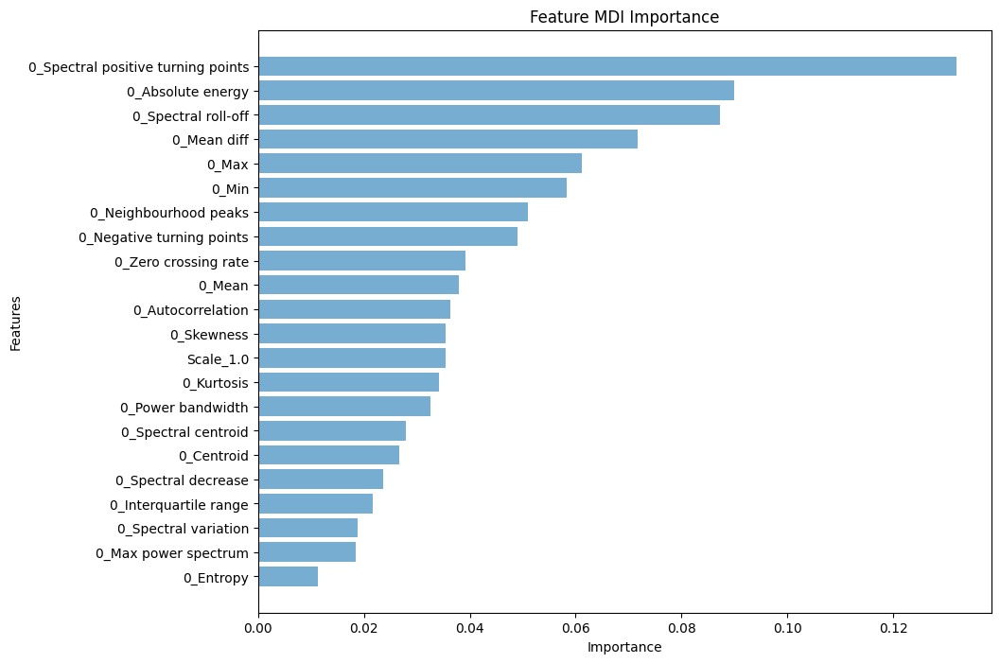

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=22, Auc: 69.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=21, Auc: 68.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=20, Auc: 69.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=19, Auc: 67.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=18, Auc: 68.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=17, Auc: 68.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=16, Auc: 68.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=15, Auc: 67.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=14, Auc: 66.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=13, Auc: 66.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=12, Auc: 66.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=11, Auc: 67.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=10, Auc: 65.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=9, Auc: 64.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=8, Auc: 62.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=7, Auc: 61.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=6, Auc: 62.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=5, Auc: 55.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.072, n=4, Auc: 61.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=3, Auc: 58.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.090, n=2, Auc: 54.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.132, n=1, Auc: 51.82%
    Threshold  Num Features       AUC
0    0.011314            22  0.696532
1    0.018460            21  0.680833
2    0.018897            20  0.690662
3    0.021750            19  0.678340
4    0.023620            18  0.680065
5    0.026615            17  0.684269
6    0.027969            16  0.680073
7    0.032568            15  0.673671
8    0.034248            14  0.660877
9    0.035347            13  0.669719
10   0.035389            12  0.662197
11   0.036360            11  0.676296
12   0.037970            10  0.655788
13   0.039237             9  0.647514
14   0.049035             8  0.627069
15   0.050980             7  0.616854
16   0.058370             6  0.629097
17   0.061116             5  0.557628
18   0.071675             4  0.619637
19   0.087218             3  0.581588
20   0.089926             2  0.541862
21   0.131937             1  0.518170
Processing patient 1_ with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:31:09,948] A new study created in memory with name: no-name-6da3c463-c767-4c34-b931-faa868b49b71


14270
14270
14246
14246


[I 2024-07-18 17:31:10,632] Trial 0 finished with value: 0.6442411432702847 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6442411432702847.
[I 2024-07-18 17:31:11,448] Trial 1 finished with value: 0.6706507276628495 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6706507276628495.
[I 2024-07-18 17:31:11,984] Trial 2 finished with value: 0.6736965914126454 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.405634012600604, 'alpha': 24.030392960898045, 'max_depth': 3, 'eta': 5.826152426887221e-05, 'gamma': 0.16240901436321287, 'subsample': 0.8746878693054215, 'colsample_bytree': 0.5852927120110339, 'grow_policy': 'depthwise', 'min_child_weight': 10}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.67      0.70      0.68    103775
         1.0       0.68      0.66      0.67    103775

    accuracy                           0.68    207550
   macro avg       0.68      0.68      0.68    207550
weighted avg       0.68      0.68      0.68    207550

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.95      0.68      0.79     12944
         1.0       0.17      0.63      0.26      1325

    accuracy                           0.67     14269
   macro avg       0.56      0.65      0.53     14269
weighted avg       0.87      0.67      0.74  

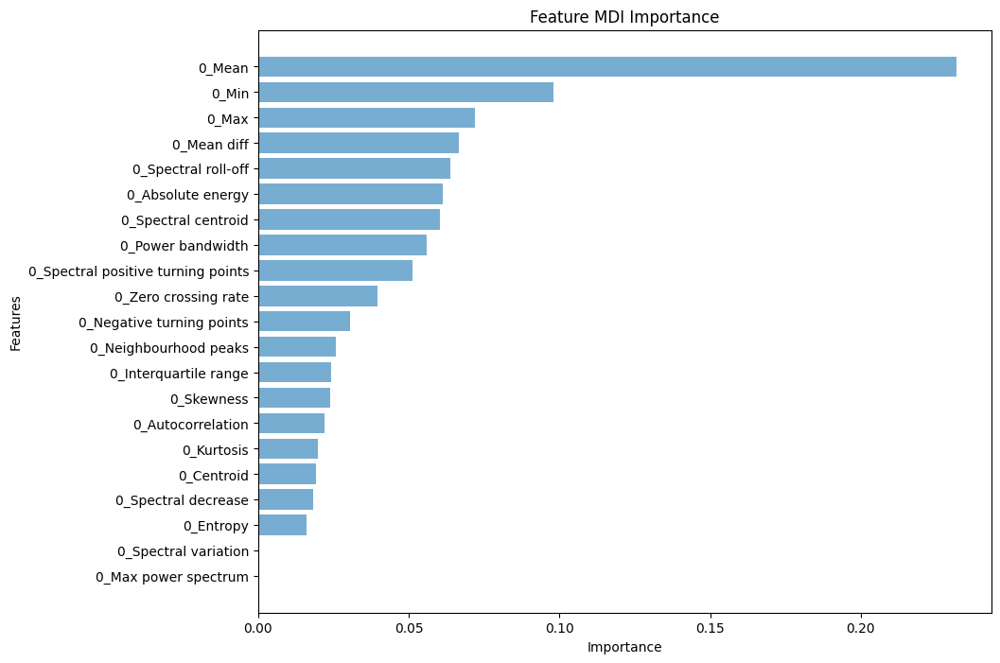

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=21, Auc: 70.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=21, Auc: 70.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=19, Auc: 70.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=18, Auc: 69.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=17, Auc: 69.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=16, Auc: 69.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=15, Auc: 70.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=14, Auc: 70.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=13, Auc: 69.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=12, Auc: 68.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=11, Auc: 69.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=10, Auc: 69.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=9, Auc: 69.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=8, Auc: 71.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=7, Auc: 70.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=6, Auc: 72.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.064, n=5, Auc: 74.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.067, n=4, Auc: 73.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.072, n=3, Auc: 72.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.098, n=2, Auc: 71.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.232, n=1, Auc: 72.56%
    Threshold  Num Features       AUC
0    0.000000            21  0.705186
1    0.000000            21  0.705186
2    0.016072            19  0.706896
3    0.018131            18  0.693596
4    0.019093            17  0.697170
5    0.019708            16  0.696491
6    0.022047            15  0.706702
7    0.024083            14  0.704311
8    0.024249            13  0.693102
9    0.025879            12  0.689726
10   0.030369            11  0.691449
11   0.039733            10  0.698318
12   0.051140             9  0.698261
13   0.055812             8  0.716292
14   0.060321             7  0.708614
15   0.061376             6  0.727583
16   0.063728             5  0.742250
17   0.066598             4  0.739325
18   0.071954             3  0.729442
19   0.098015             2  0.712665
20   0.231690             1  0.725609
Processing patient 1_ with window size 144 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:32:30,668] A new study created in memory with name: no-name-87ce52cf-a326-4f27-ace8-6d6a703a2c7a


14270
14270
14150
14150


[I 2024-07-18 17:32:31,319] Trial 0 finished with value: 0.6547595155911095 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6547595155911095.
[I 2024-07-18 17:32:32,143] Trial 1 finished with value: 0.6510154919887119 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.6547595155911095.
[I 2024-07-18 17:32:32,676] Trial 2 finished with value: 0.6384366909998367 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.1360561843787615, 'alpha': 24.444216826656483, 'max_depth': 10, 'eta': 2.368538922818397e-05, 'gamma': 0.10828446021552056, 'subsample': 0.5174330986095135, 'colsample_bytree': 0.5144938529825119, 'grow_policy': 'depthwise', 'min_child_weight': 10}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.94      0.95      0.95    103775
         1.0       0.95      0.94      0.94    103775

    accuracy                           0.95    207550
   macro avg       0.95      0.95      0.95    207550
weighted avg       0.95      0.95      0.95    207550

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.92      0.89      0.91     12944
         1.0       0.21      0.29      0.24      1325

    accuracy                           0.83     14269
   macro avg       0.57      0.59      0.57     14269
weighted avg       0.86      0.83      0.84

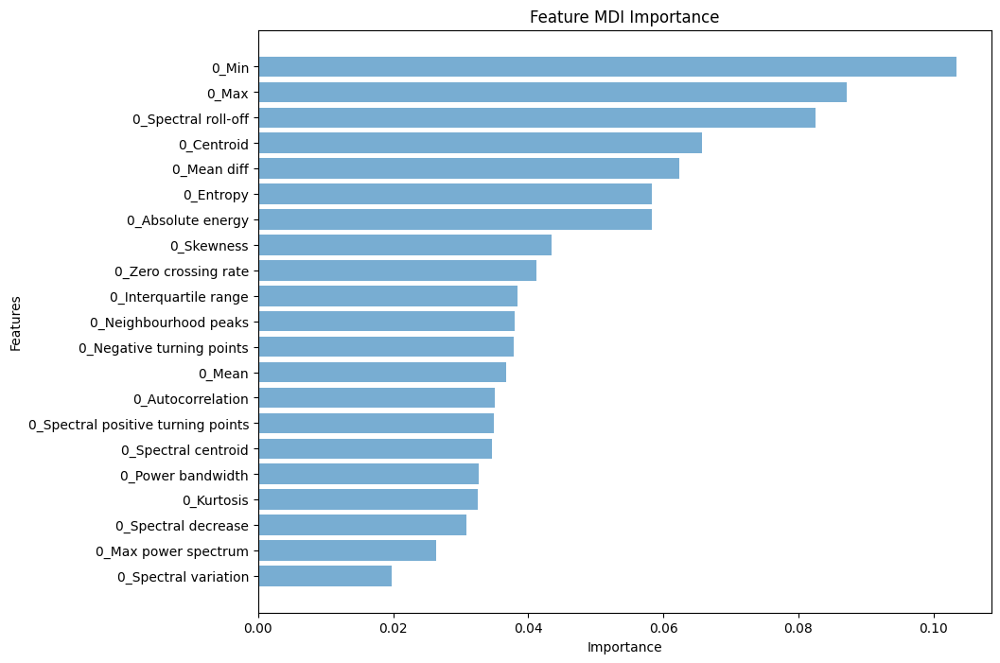

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=21, Auc: 68.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=20, Auc: 67.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=19, Auc: 67.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=18, Auc: 67.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=17, Auc: 67.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=16, Auc: 66.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=15, Auc: 66.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=14, Auc: 66.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=13, Auc: 65.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=12, Auc: 64.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=11, Auc: 65.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=10, Auc: 64.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=9, Auc: 64.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=8, Auc: 61.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=7, Auc: 58.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=6, Auc: 56.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=5, Auc: 54.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=4, Auc: 53.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.083, n=3, Auc: 59.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=2, Auc: 59.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.103, n=1, Auc: 59.57%
    Threshold  Num Features       AUC
0    0.019822            21  0.685281
1    0.026307            20  0.674445
2    0.030822            19  0.671770
3    0.032492            18  0.676985
4    0.032647            17  0.676045
5    0.034632            16  0.663516
6    0.034847            15  0.667513
7    0.035012            14  0.663525
8    0.036667            13  0.652633
9    0.037853            12  0.640849
10   0.037924            11  0.659069
11   0.038370            10  0.641659
12   0.041277             9  0.647555
13   0.043499             8  0.618861
14   0.058348             7  0.586761
15   0.058371             6  0.562394
16   0.062369             5  0.549703
17   0.065672             4  0.534361
18   0.082522             3  0.596770
19   0.087157             2  0.597520
20   0.103390             1  0.595735
Processing patient 1_ with window size 288 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:34:47,973] A new study created in memory with name: no-name-0882c58e-b251-4a4e-886a-6fedc1c1cd72


14255
14255
14231
14231


[I 2024-07-18 17:34:48,575] Trial 0 finished with value: 0.7322516693428853 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7322516693428853.
[I 2024-07-18 17:34:49,268] Trial 1 finished with value: 0.7281072865362006 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.7322516693428853.
[I 2024-07-18 17:34:49,792] Trial 2 finished with value: 0.7209039563370901 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.5297870547336236, 'alpha': 0.0005115033521294626, 'max_depth': 6, 'eta': 6.000480468650514e-05, 'gamma': 0.11174244073432105, 'subsample': 0.9991439219805054, 'colsample_bytree': 0.5591070977094638, 'grow_policy': 'lossguide', 'min_child_weight': 9}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.80      0.92      0.86     95507
         1.0       0.91      0.78      0.84     95507

    accuracy                           0.85    191014
   macro avg       0.86      0.85      0.85    191014
weighted avg       0.86      0.85      0.85    191014

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.88      0.89     12094
         1.0       0.40      0.46      0.43      2161

    accuracy                           0.81     14255
   macro avg       0.65      0.67      0.66     14255
weighted avg       0.83      0.81      0.8

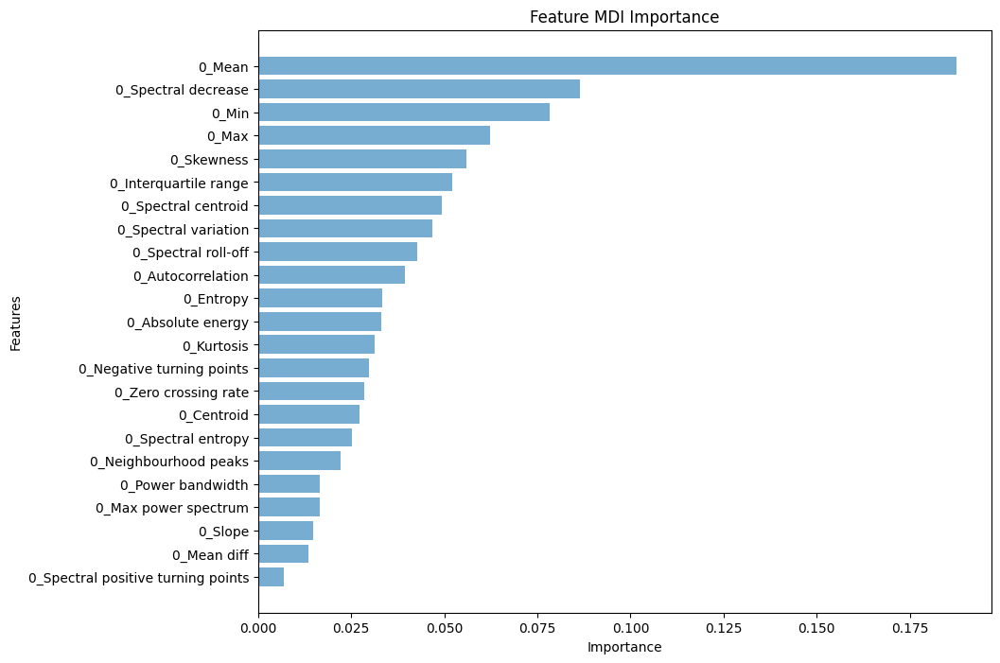

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.007, n=23, Auc: 75.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=22, Auc: 72.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=21, Auc: 74.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=20, Auc: 73.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=19, Auc: 74.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=18, Auc: 75.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=17, Auc: 74.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=16, Auc: 74.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=15, Auc: 74.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=14, Auc: 74.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=13, Auc: 76.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=12, Auc: 74.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=11, Auc: 74.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=10, Auc: 74.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=9, Auc: 74.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=8, Auc: 74.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=7, Auc: 73.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=6, Auc: 69.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=5, Auc: 68.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=4, Auc: 68.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.078, n=3, Auc: 75.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.086, n=2, Auc: 75.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.187, n=1, Auc: 77.08%
    Threshold  Num Features       AUC
0    0.007009            23  0.750326
1    0.013491            22  0.724931
2    0.014834            21  0.742471
3    0.016582            20  0.732437
4    0.016683            19  0.745301
5    0.022195            18  0.757604
6    0.025198            17  0.749674
7    0.027342            16  0.749501
8    0.028447            15  0.749797
9    0.029725            14  0.743551
10   0.031216            13  0.765436
11   0.033159            12  0.744244
12   0.033265            11  0.742604
13   0.039531            10  0.748288
14   0.042695             9  0.746986
15   0.046899             8  0.748739
16   0.049372             7  0.738863
17   0.052090             6  0.691097
18   0.055994             5  0.686043
19   0.062215             4  0.688274
20   0.078216             3  0.756687
21   0.086346             2  0.750023
22   0.187495             1  0.770833
Processing patient 1_ with window size 288 with forecasti

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:36:57,440] A new study created in memory with name: no-name-ec42f908-8f4d-4a68-8bbe-bdac50029e4e


14255
14255
14135
14135


[I 2024-07-18 17:36:58,113] Trial 0 finished with value: 0.7072040265796992 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7072040265796992.
[I 2024-07-18 17:36:58,841] Trial 1 finished with value: 0.6911271241234118 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.7072040265796992.
[I 2024-07-18 17:36:59,360] Trial 2 finished with value: 0.7035537296269458 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.5218492451043986, 'alpha': 0.00015731072545869601, 'max_depth': 7, 'eta': 0.005533892669672558, 'gamma': 0.17967679897103864, 'subsample': 0.8351264215883542, 'colsample_bytree': 0.5332926285983666, 'grow_policy': 'depthwise', 'min_child_weight': 4}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.89      0.95      0.92     95507
         1.0       0.94      0.88      0.91     95507

    accuracy                           0.91    191014
   macro avg       0.91      0.91      0.91    191014
weighted avg       0.91      0.91      0.91    191014

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.85      0.87     12094
         1.0       0.36      0.49      0.42      2161

    accuracy                           0.79     14255
   macro avg       0.63      0.67      0.65     14255
weighted avg       0.82      0.79      0.8

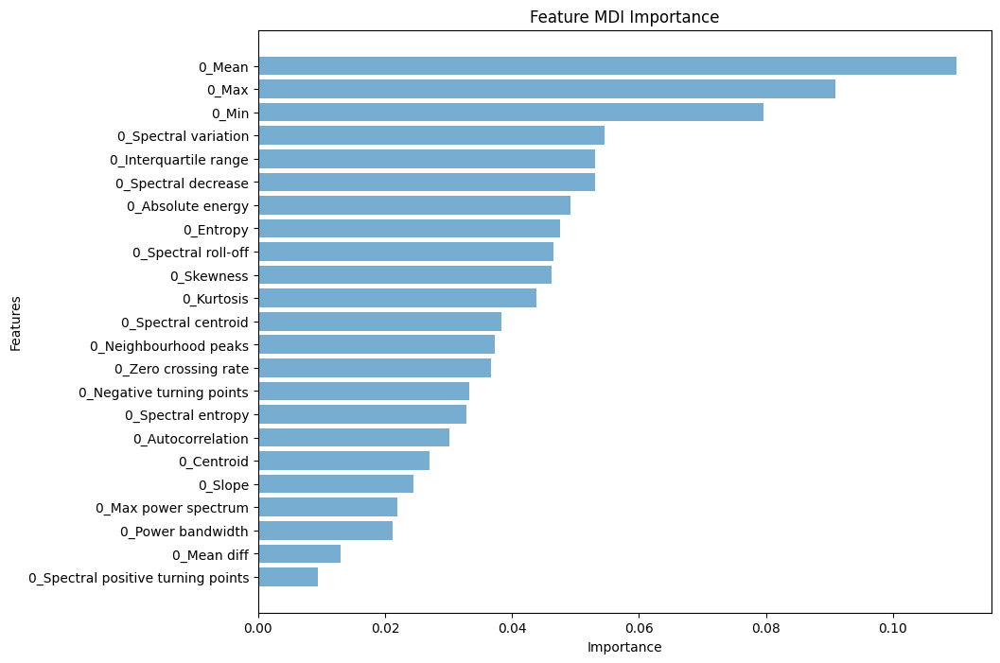

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.009, n=23, Auc: 75.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=22, Auc: 71.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=21, Auc: 73.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=20, Auc: 73.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=19, Auc: 73.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=18, Auc: 70.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=17, Auc: 70.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=16, Auc: 68.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=15, Auc: 71.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=14, Auc: 71.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=13, Auc: 70.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=12, Auc: 71.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=11, Auc: 66.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=10, Auc: 67.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=9, Auc: 70.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=8, Auc: 69.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=7, Auc: 71.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=6, Auc: 72.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=5, Auc: 70.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=4, Auc: 76.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.080, n=3, Auc: 62.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.091, n=2, Auc: 62.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.110, n=1, Auc: 71.21%
    Threshold  Num Features       AUC
0    0.009433            23  0.751402
1    0.012940            22  0.711093
2    0.021167            21  0.731288
3    0.021869            20  0.735596
4    0.024426            19  0.734556
5    0.026940            18  0.702350
6    0.030120            17  0.707435
7    0.032766            16  0.685964
8    0.033314            15  0.715699
9    0.036742            14  0.710330
10   0.037275            13  0.707765
11   0.038366            12  0.711529
12   0.043915            11  0.666282
13   0.046177            10  0.671493
14   0.046584             9  0.708433
15   0.047626             8  0.698496
16   0.049225             7  0.710862
17   0.053008             6  0.723642
18   0.053077             5  0.701134
19   0.054531             4  0.767925
20   0.079547             3  0.625205
21   0.090964             2  0.623222
22   0.109986             1  0.712069
Processing patient 3_ with window size 24 with forecastin

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:39:17,800] A new study created in memory with name: no-name-3f91da13-4f46-49fe-9558-9b39b3d4ca07


12483
12483
12459
12459


[I 2024-07-18 17:39:18,364] Trial 0 finished with value: 0.5383283575681275 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5383283575681275.
[I 2024-07-18 17:39:18,967] Trial 1 finished with value: 0.5442101021760638 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5442101021760638.
[I 2024-07-18 17:39:19,432] Trial 2 finished with value: 0.4927548482489662 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.096561389515097, 'alpha': 5.7618406755883644e-05, 'max_depth': 4, 'eta': 0.9924914125460337, 'gamma': 0.1103363481366543, 'subsample': 0.5566027764910059, 'colsample_bytree': 0.5649832665399321, 'grow_policy': 'depthwise', 'min_child_weight': 1}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98     96902
         1.0       0.99      0.97      0.98     96902

    accuracy                           0.98    193804
   macro avg       0.98      0.98      0.98    193804
weighted avg       0.98      0.98      0.98    193804

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.98     12081
         1.0       0.08      0.04      0.06       401

    accuracy                           0.95     12482
   macro avg       0.53      0.51      0.52     12482
weighted avg       0.94      0.95      0.95   

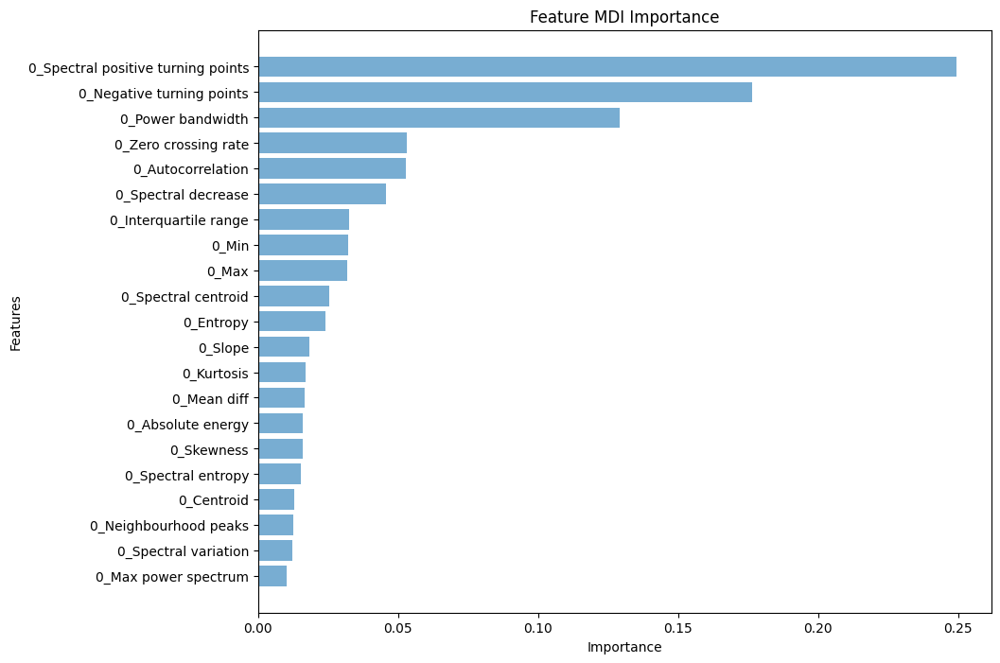

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=21, Auc: 62.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=20, Auc: 50.66%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=19, Auc: 55.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=18, Auc: 50.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=17, Auc: 52.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=16, Auc: 52.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=15, Auc: 61.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=14, Auc: 53.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=13, Auc: 48.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=12, Auc: 57.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=11, Auc: 57.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=10, Auc: 52.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=9, Auc: 52.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=8, Auc: 57.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=7, Auc: 66.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=6, Auc: 60.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=5, Auc: 58.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=4, Auc: 58.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.129, n=3, Auc: 55.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.176, n=2, Auc: 56.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.249, n=1, Auc: 58.16%
    Threshold  Num Features       AUC
0    0.010122            21  0.626130
1    0.012386            20  0.506585
2    0.012501            19  0.550468
3    0.013043            18  0.503602
4    0.015432            17  0.521897
5    0.015912            16  0.520199
6    0.015956            15  0.617113
7    0.016491            14  0.539281
8    0.017039            13  0.488998
9    0.018192            12  0.575088
10   0.023952            11  0.570115
11   0.025458            10  0.522808
12   0.031870             9  0.521489
13   0.032206             8  0.577351
14   0.032650             7  0.669732
15   0.045784             6  0.600874
16   0.052853             5  0.589358
17   0.053100             4  0.588251
18   0.129225             3  0.552292
19   0.176427             2  0.569632
20   0.249400             1  0.581627
Processing patient 3_ with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:40:37,948] A new study created in memory with name: no-name-23cff096-80fc-4387-b44a-f9f316397c45


12483
12483
12363
12363


[I 2024-07-18 17:40:38,499] Trial 0 finished with value: 0.5442137145341266 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5442137145341266.
[I 2024-07-18 17:40:39,149] Trial 1 finished with value: 0.5142825413083465 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5442137145341266.
[I 2024-07-18 17:40:39,713] Trial 2 finished with value: 0.6122582584181876 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'gamma': 0.13717998321122307, 'subsample': 0.8925879806965068, 'colsample_bytree': 0.5998368910791798, 'grow_policy': 'lossguide', 'min_child_weight': 1}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.76      0.88      0.81     96902
         1.0       0.86      0.72      0.78     96902

    accuracy                           0.80    193804
   macro avg       0.81      0.80      0.80    193804
weighted avg       0.81      0.80      0.80    193804

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.97      0.96      0.96     12081
         1.0       0.01      0.01      0.01       401

    accuracy                           0.93     12482
   macro avg       0.49      0.49      0.49     12482
weighted avg       0.94      0.93      0.9

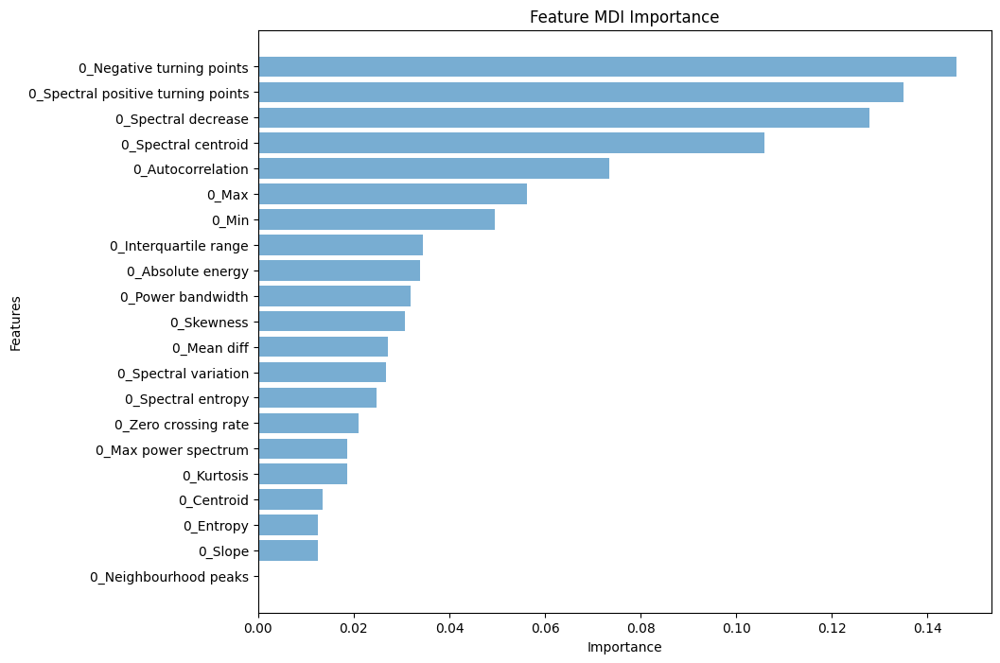

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=21, Auc: 61.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=20, Auc: 60.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=19, Auc: 59.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=18, Auc: 60.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=17, Auc: 60.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=16, Auc: 60.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=15, Auc: 60.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=14, Auc: 60.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=13, Auc: 60.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=12, Auc: 61.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=11, Auc: 59.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=10, Auc: 60.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=9, Auc: 61.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=8, Auc: 58.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=7, Auc: 58.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=6, Auc: 61.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=5, Auc: 60.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.106, n=4, Auc: 60.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.128, n=3, Auc: 60.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.135, n=2, Auc: 52.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.146, n=1, Auc: 52.48%
    Threshold  Num Features       AUC
0    0.000000            21  0.612258
1    0.012459            20  0.608578
2    0.012561            19  0.598342
3    0.013465            18  0.609750
4    0.018599            17  0.600828
5    0.018660            16  0.605932
6    0.020936            15  0.602223
7    0.024791            14  0.608495
8    0.026657            13  0.609387
9    0.027142            12  0.614422
10   0.030629            11  0.596352
11   0.031946            10  0.602103
12   0.033789             9  0.612183
13   0.034525             8  0.589326
14   0.049513             7  0.588206
15   0.056174             6  0.611538
16   0.073515             5  0.609017
17   0.105806             4  0.606242
18   0.127789             3  0.605566
19   0.135006             2  0.529409
20   0.146036             1  0.524774
Processing patient 3_ with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:41:19,516] A new study created in memory with name: no-name-e2078fd4-4330-44bf-8eff-e4cb81d22b87


12483
12483
12459
12459


[I 2024-07-18 17:41:20,070] Trial 0 finished with value: 0.4943742777974269 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.4943742777974269.
[I 2024-07-18 17:41:20,768] Trial 1 finished with value: 0.49800818962984944 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.49800818962984944.
[I 2024-07-18 17:41:21,401] Trial 2 finished with value: 0.5015510538001686 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484

Best parameters found by Optuna: {'lambda': 1.9582766985396303, 'alpha': 2.6664274004676862, 'max_depth': 10, 'eta': 0.29794544625913616, 'gamma': 0.15135118584553503, 'subsample': 0.9609371175115584, 'colsample_bytree': 0.5442462510259598, 'grow_policy': 'depthwise', 'min_child_weight': 4}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     93127
         1.0       1.00      1.00      1.00     93127

    accuracy                           1.00    186254
   macro avg       1.00      1.00      1.00    186254
weighted avg       1.00      1.00      1.00    186254

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.92      0.99      0.96     11533
         1.0       0.01      0.00      0.00       949

    accuracy                           0.92     12482
   macro avg       0.47      0.50      0.48     12482
weighted avg       0.85      0.92      0.88   

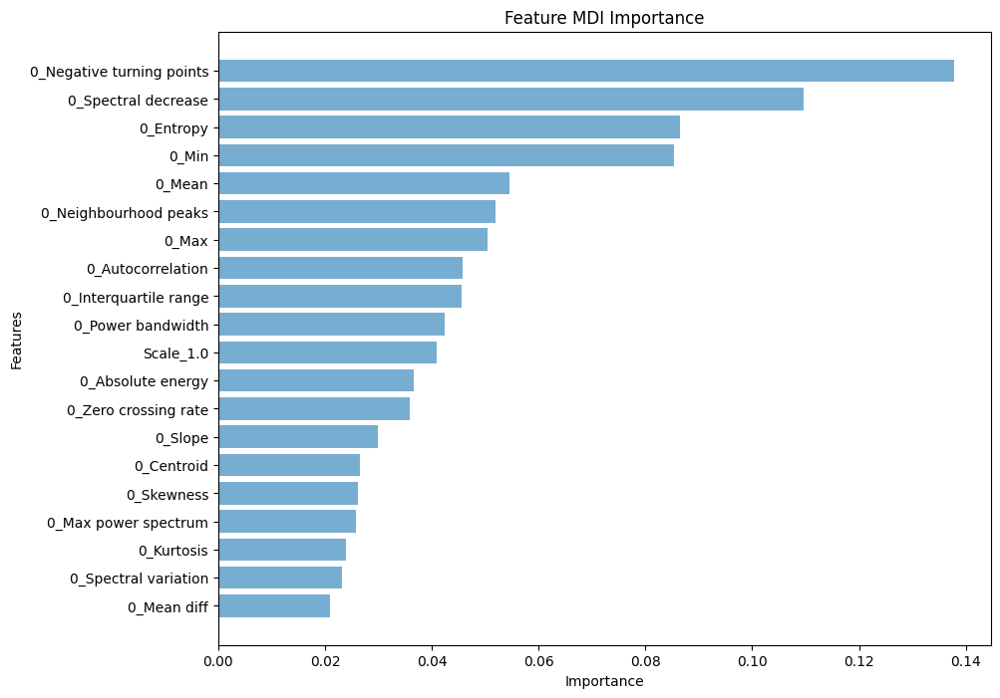

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=20, Auc: 53.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=19, Auc: 52.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=18, Auc: 52.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=17, Auc: 52.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=16, Auc: 50.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=15, Auc: 50.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=14, Auc: 50.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=13, Auc: 50.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=12, Auc: 49.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=11, Auc: 52.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=10, Auc: 54.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=9, Auc: 54.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=8, Auc: 51.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=7, Auc: 46.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=6, Auc: 47.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=5, Auc: 46.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.085, n=4, Auc: 47.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=3, Auc: 47.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.110, n=2, Auc: 49.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.138, n=1, Auc: 52.08%
    Threshold  Num Features       AUC
0    0.021013            20  0.539437
1    0.023211            19  0.521936
2    0.023942            18  0.529528
3    0.025726            17  0.529449
4    0.026223            16  0.508690
5    0.026573            15  0.500907
6    0.029979            14  0.508059
7    0.035819            13  0.508224
8    0.036686            12  0.496074
9    0.040866            11  0.526533
10   0.042414            10  0.543159
11   0.045621             9  0.541531
12   0.045725             8  0.516989
13   0.050411             7  0.460016
14   0.052013             6  0.474222
15   0.054568             5  0.462856
16   0.085273             4  0.473903
17   0.086566             3  0.475781
18   0.109540             2  0.499686
19   0.137830             1  0.520771
Processing patient 3_ with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:42:03,990] A new study created in memory with name: no-name-fe906c38-15a9-499b-bbb9-d8d7f0383416


12483
12483
12363
12363


[I 2024-07-18 17:42:04,503] Trial 0 finished with value: 0.49026767647188624 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.49026767647188624.
[I 2024-07-18 17:42:05,137] Trial 1 finished with value: 0.5043490448492651 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5043490448492651.
[I 2024-07-18 17:42:05,752] Trial 2 finished with value: 0.5095191632715285 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484

Best parameters found by Optuna: {'lambda': 1.5162937648019972, 'alpha': 0.0009841367551906028, 'max_depth': 6, 'eta': 2.2415642752661677e-05, 'gamma': 0.19169669288140798, 'subsample': 0.9990121868109165, 'colsample_bytree': 0.9999332415124196, 'grow_policy': 'depthwise', 'min_child_weight': 3}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.65      0.79      0.71     93127
         1.0       0.73      0.56      0.64     93127

    accuracy                           0.68    186254
   macro avg       0.69      0.68      0.67    186254
weighted avg       0.69      0.68      0.67    186254

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.92      0.93      0.92     11533
         1.0       0.01      0.01      0.01       949

    accuracy                           0.86     12482
   macro avg       0.47      0.47      0.47     12482
weighted avg       0.85      0.86      0.

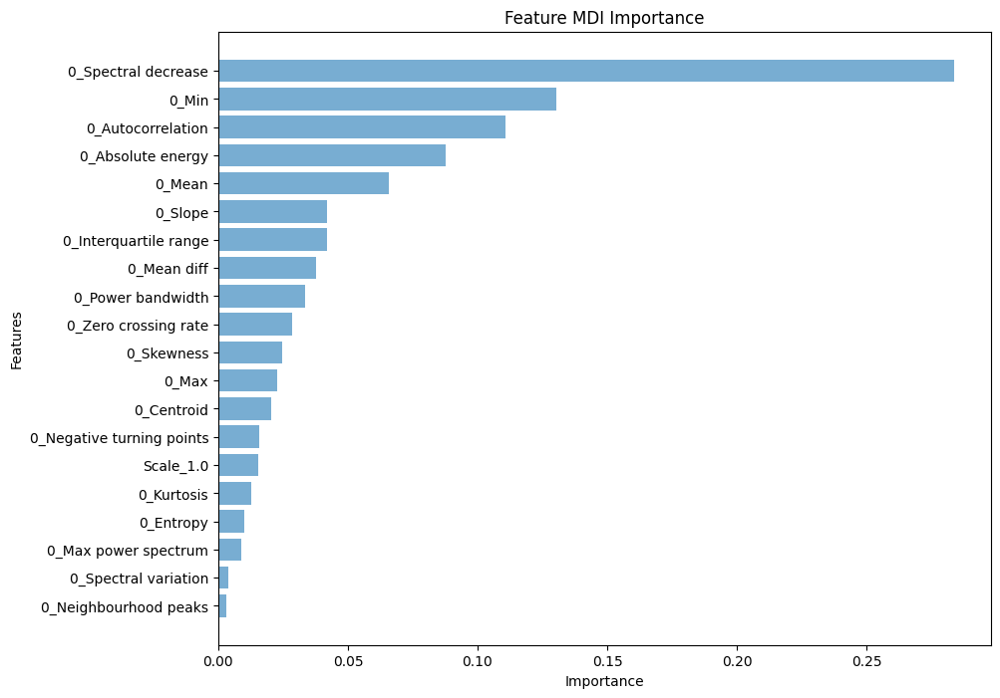

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.003, n=20, Auc: 57.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.004, n=19, Auc: 56.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.009, n=18, Auc: 54.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=17, Auc: 54.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=16, Auc: 58.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=15, Auc: 53.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=14, Auc: 55.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=13, Auc: 56.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=12, Auc: 54.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=11, Auc: 56.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=10, Auc: 56.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=9, Auc: 54.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=8, Auc: 54.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=7, Auc: 55.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=6, Auc: 55.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=5, Auc: 55.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.088, n=4, Auc: 49.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.111, n=3, Auc: 58.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.130, n=2, Auc: 55.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.284, n=1, Auc: 49.28%
    Threshold  Num Features       AUC
0    0.003033            20  0.577678
1    0.004011            19  0.562548
2    0.009027            18  0.542089
3    0.010209            17  0.540497
4    0.012747            16  0.581999
5    0.015451            15  0.536194
6    0.015955            14  0.555312
7    0.020549            13  0.560987
8    0.022628            12  0.548687
9    0.024704            11  0.566656
10   0.028617            10  0.562033
11   0.033453             9  0.549101
12   0.037625             8  0.548853
13   0.041761             7  0.557434
14   0.041946             6  0.554906
15   0.065799             5  0.552743
16   0.087640             4  0.495262
17   0.110852             3  0.583796
18   0.130200             2  0.555879
19   0.283794             1  0.492798
Processing patient 3_ with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:43:59,130] A new study created in memory with name: no-name-cddb195d-6b2e-4baa-be18-66ea95a56fd8


12476
12476
12452
12452


[I 2024-07-18 17:43:59,809] Trial 0 finished with value: 0.4833081746995864 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.4833081746995864.
[I 2024-07-18 17:44:00,448] Trial 1 finished with value: 0.4815899731677586 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.4833081746995864.
[I 2024-07-18 17:44:00,921] Trial 2 finished with value: 0.5098651468770962 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.4265958624605988, 'alpha': 0.0005501107279223996, 'max_depth': 4, 'eta': 4.644348161292293e-05, 'gamma': 0.1790307709145098, 'subsample': 0.7897964652439213, 'colsample_bytree': 0.858694538277313, 'grow_policy': 'lossguide', 'min_child_weight': 4}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.71      0.67      0.69     88959
         1.0       0.69      0.72      0.70     88959

    accuracy                           0.70    177918
   macro avg       0.70      0.70      0.70    177918
weighted avg       0.70      0.70      0.70    177918

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.86      0.83      0.85     10807
         1.0       0.12      0.15      0.13      1669

    accuracy                           0.74     12476
   macro avg       0.49      0.49      0.49     12476
weighted avg       0.76      0.74      0.75 

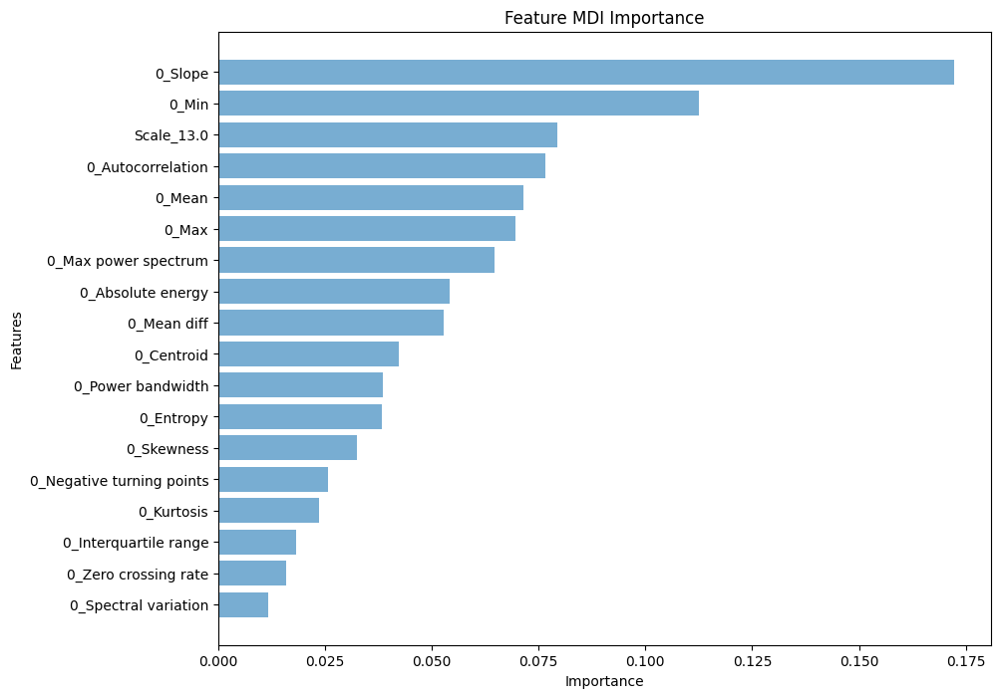

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=18, Auc: 52.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=17, Auc: 52.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=16, Auc: 51.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=15, Auc: 52.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=14, Auc: 52.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=13, Auc: 50.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=12, Auc: 50.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=11, Auc: 49.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=10, Auc: 50.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=9, Auc: 51.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=8, Auc: 51.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=7, Auc: 50.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=6, Auc: 49.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.071, n=5, Auc: 51.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=4, Auc: 51.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.079, n=3, Auc: 41.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.113, n=2, Auc: 39.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.172, n=1, Auc: 55.51%
    Threshold  Num Features       AUC
0    0.011582            18  0.526933
1    0.015805            17  0.520090
2    0.018206            16  0.516830
3    0.023712            15  0.520356
4    0.025773            14  0.521840
5    0.032369            13  0.502799
6    0.038266            12  0.505660
7    0.038506            11  0.494937
8    0.042374            10  0.502010
9    0.052693             9  0.519823
10   0.054250             8  0.518993
11   0.064742             7  0.506148
12   0.069599             6  0.498376
13   0.071452             5  0.515444
14   0.076524             4  0.519561
15   0.079352             3  0.414962
16   0.112518             2  0.396030
17   0.172277             1  0.555074
Processing patient 3_ with window size 144 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:44:49,449] A new study created in memory with name: no-name-f090f1d4-8d2d-4940-8921-f6feb3d34d97


12476
12476
12356
12356


[I 2024-07-18 17:44:49,998] Trial 0 finished with value: 0.543221436874653 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.543221436874653.
[I 2024-07-18 17:44:50,625] Trial 1 finished with value: 0.5368629657352659 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.543221436874653.
[I 2024-07-18 17:44:51,068] Trial 2 finished with value: 0.5399226961776046 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'ga

Best parameters found by Optuna: {'lambda': 1.2570813072099476, 'alpha': 0.00020431128474699675, 'max_depth': 6, 'eta': 3.104653952662621e-05, 'gamma': 0.10243921724252117, 'subsample': 0.7089050558649026, 'colsample_bytree': 0.9548254122362178, 'grow_policy': 'lossguide', 'min_child_weight': 6}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.66      0.85      0.74     88959
         1.0       0.79      0.57      0.66     88959

    accuracy                           0.71    177918
   macro avg       0.73      0.71      0.70    177918
weighted avg       0.73      0.71      0.70    177918

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.88      0.96      0.92     10807
         1.0       0.37      0.14      0.21      1669

    accuracy                           0.85     12476
   macro avg       0.62      0.55      0.56     12476
weighted avg       0.81      0.85      0.

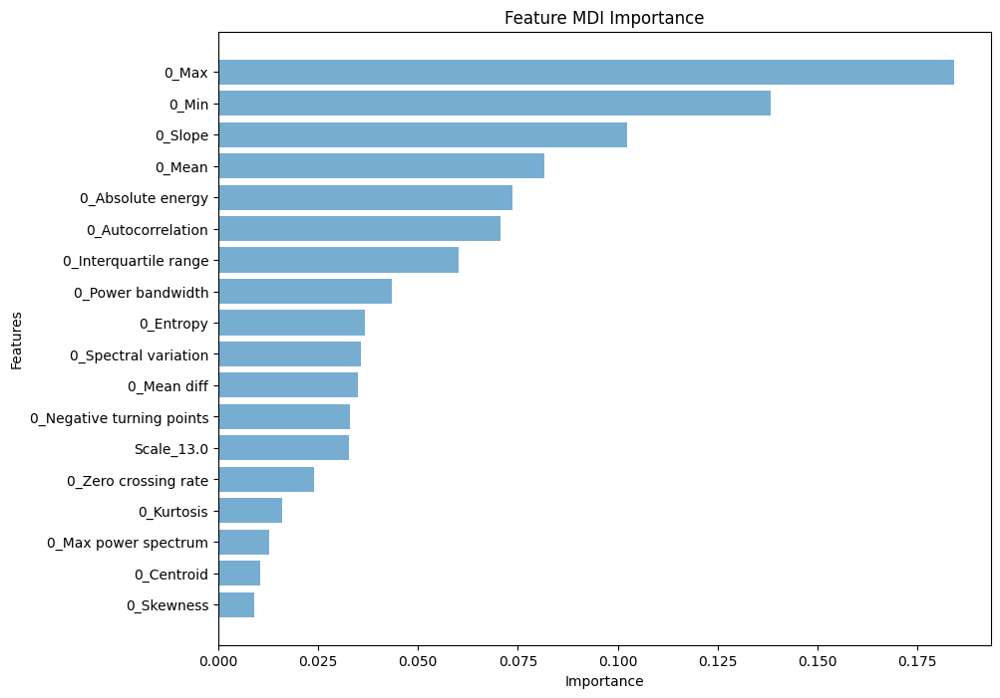

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.009, n=18, Auc: 58.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=17, Auc: 58.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=16, Auc: 58.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=15, Auc: 58.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=14, Auc: 57.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=13, Auc: 58.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=12, Auc: 57.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=11, Auc: 57.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=10, Auc: 57.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=9, Auc: 57.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=8, Auc: 56.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=7, Auc: 56.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.071, n=6, Auc: 50.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=5, Auc: 50.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=4, Auc: 50.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.102, n=3, Auc: 48.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.138, n=2, Auc: 55.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.184, n=1, Auc: 51.27%
    Threshold  Num Features       AUC
0    0.008949            18  0.587079
1    0.010465            17  0.580960
2    0.012764            16  0.582641
3    0.015990            15  0.583449
4    0.024007            14  0.576071
5    0.032737            13  0.585430
6    0.032898            12  0.577488
7    0.035064            11  0.579395
8    0.035696            10  0.577584
9    0.036819             9  0.571625
10   0.043492             8  0.567732
11   0.060232             7  0.565179
12   0.070662             6  0.505363
13   0.073764             5  0.503175
14   0.081651             4  0.508101
15   0.102294             3  0.484969
16   0.138296             2  0.552156
17   0.184218             1  0.512734
Processing patient 3_ with window size 288 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:46:19,191] A new study created in memory with name: no-name-01a65f40-898d-4e23-b4be-440ec3dc8b53


12462
12462
12438
12438


[I 2024-07-18 17:46:19,843] Trial 0 finished with value: 0.49488261509149245 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.49488261509149245.
[I 2024-07-18 17:46:20,632] Trial 1 finished with value: 0.4817505414633352 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.49488261509149245.
[I 2024-07-18 17:46:21,083] Trial 2 finished with value: 0.5087332019708 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.6114702607259277, 'alpha': 89.67488010651574, 'max_depth': 3, 'eta': 9.310375811869868e-05, 'gamma': 0.1096526311571408, 'subsample': 0.8220496023669331, 'colsample_bytree': 0.7079582198942294, 'grow_policy': 'depthwise', 'min_child_weight': 3}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.65      0.80      0.72     83211
         1.0       0.74      0.57      0.65     83211

    accuracy                           0.68    166422
   macro avg       0.69      0.68      0.68    166422
weighted avg       0.69      0.68      0.68    166422

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.79      0.91      0.85      9575
         1.0       0.43      0.22      0.29      2886

    accuracy                           0.75     12461
   macro avg       0.61      0.56      0.57     12461
weighted avg       0.71      0.75      0.72    

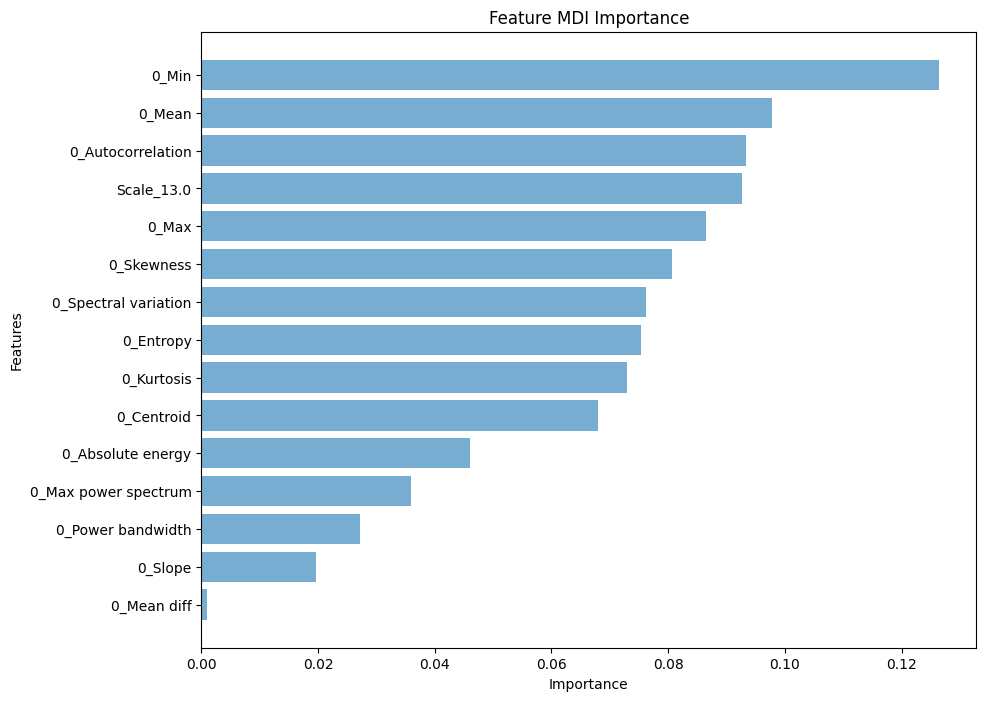

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.001, n=15, Auc: 53.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=14, Auc: 53.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=13, Auc: 53.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=12, Auc: 52.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=11, Auc: 52.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=10, Auc: 54.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.073, n=9, Auc: 53.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.075, n=8, Auc: 54.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=7, Auc: 54.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.081, n=6, Auc: 48.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.086, n=5, Auc: 51.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.093, n=4, Auc: 48.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.093, n=3, Auc: 46.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.098, n=2, Auc: 44.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.126, n=1, Auc: 50.79%
    Threshold  Num Features       AUC
0    0.001049            15  0.539001
1    0.019575            14  0.539742
2    0.027217            13  0.532583
3    0.035975            12  0.527617
4    0.045968            11  0.528873
5    0.068052            10  0.543170
6    0.073014             9  0.536337
7    0.075410             8  0.545216
8    0.076253             7  0.545658
9    0.080665             6  0.485249
10   0.086465             5  0.519109
11   0.092688             4  0.487418
12   0.093402             3  0.463876
13   0.097806             2  0.446813
14   0.126460             1  0.507869
Processing patient 3_ with window size 288 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:47:01,490] A new study created in memory with name: no-name-6d831093-a1c7-4864-abea-d071015735ac


12462
12462
12342
12342


[I 2024-07-18 17:47:01,980] Trial 0 finished with value: 0.5376629048232024 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5376629048232024.
[I 2024-07-18 17:47:02,552] Trial 1 finished with value: 0.5628565557690045 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5628565557690045.
[I 2024-07-18 17:47:03,038] Trial 2 finished with value: 0.5806650926845598 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.6256256185582443, 'alpha': 0.05104631228129706, 'max_depth': 5, 'eta': 0.0004033121792025902, 'gamma': 0.18171533772990892, 'subsample': 0.8374983972308196, 'colsample_bytree': 0.7812457440866372, 'grow_policy': 'lossguide', 'min_child_weight': 10}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.68      0.89      0.77     83283
         1.0       0.84      0.57      0.68     83283

    accuracy                           0.73    166566
   macro avg       0.76      0.73      0.73    166566
weighted avg       0.76      0.73      0.73    166566

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.81      0.93      0.87      9526
         1.0       0.58      0.31      0.40      2935

    accuracy                           0.78     12461
   macro avg       0.70      0.62      0.64     12461
weighted avg       0.76      0.78      0.76

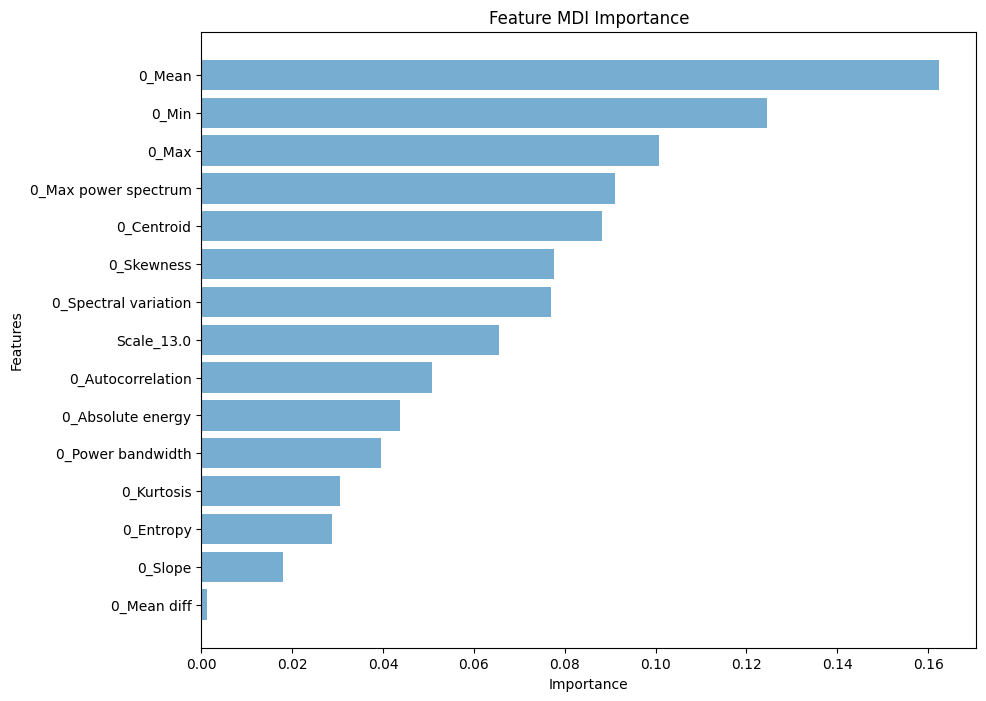

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.001, n=15, Auc: 61.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=14, Auc: 59.92%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=13, Auc: 59.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=12, Auc: 57.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=11, Auc: 60.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=10, Auc: 60.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=9, Auc: 58.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=8, Auc: 60.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=7, Auc: 61.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.078, n=6, Auc: 62.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.088, n=5, Auc: 62.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.091, n=4, Auc: 62.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.101, n=3, Auc: 60.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.125, n=2, Auc: 54.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.162, n=1, Auc: 43.86%
    Threshold  Num Features       AUC
0    0.001361            15  0.618355
1    0.017970            14  0.599159
2    0.028752            13  0.595377
3    0.030571            12  0.576540
4    0.039660            11  0.601038
5    0.043690            10  0.605035
6    0.050821             9  0.583736
7    0.065590             8  0.607000
8    0.077003             7  0.610543
9    0.077627             6  0.621302
10   0.088181             5  0.625291
11   0.091010             4  0.625315
12   0.100763             3  0.609936
13   0.124525             2  0.541590
14   0.162476             1  0.438595
Processing patient 4_ with window size 24 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:48:46,279] A new study created in memory with name: no-name-bcf055db-44d1-478b-b1e6-5919b5b2f533


4167
4167
4143
4143


[I 2024-07-18 17:48:46,709] Trial 0 finished with value: 0.7129699347441283 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7129699347441283.
[I 2024-07-18 17:48:47,213] Trial 1 finished with value: 0.7055130643840322 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.7129699347441283.
[I 2024-07-18 17:48:47,597] Trial 2 finished with value: 0.7466794140181237 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.4828605549577252, 'alpha': 5.3192618333319796e-05, 'max_depth': 10, 'eta': 0.00010859724148064566, 'gamma': 0.11733226415463051, 'subsample': 0.7891817632445929, 'colsample_bytree': 0.5462171874447547, 'grow_policy': 'lossguide', 'min_child_weight': 4}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.98     32446
         1.0       0.98      0.99      0.98     32446

    accuracy                           0.98     64892
   macro avg       0.98      0.98      0.98     64892
weighted avg       0.98      0.98      0.98     64892

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.97      0.98      4092
         1.0       0.05      0.07      0.05        74

    accuracy                           0.96      4166
   macro avg       0.51      0.52      0.52      4166
weighted avg       0.97      0.96      

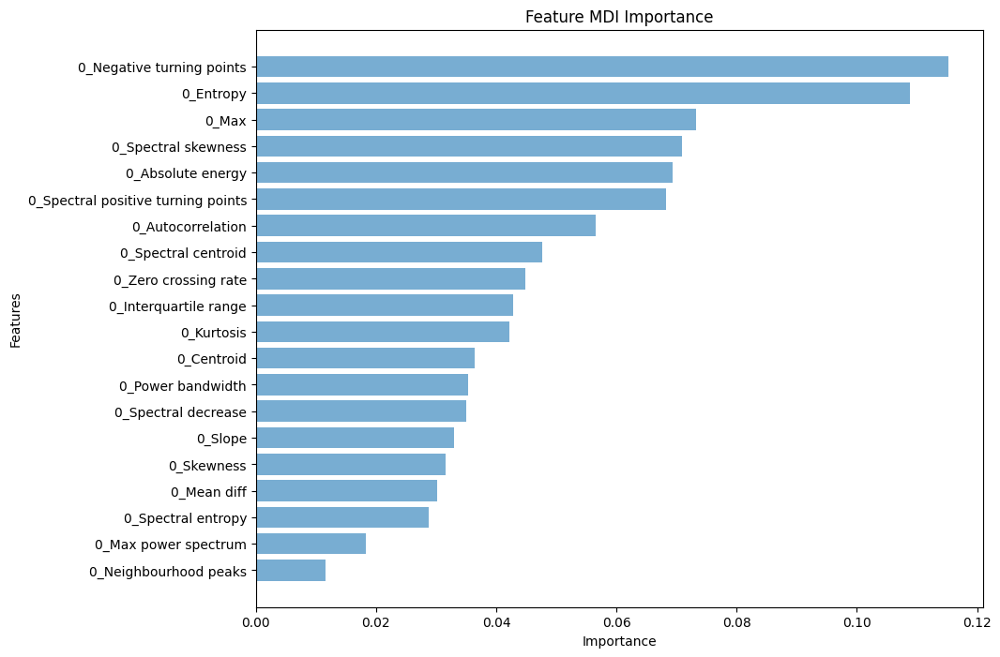

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=20, Auc: 77.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=19, Auc: 75.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=18, Auc: 77.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=17, Auc: 76.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=16, Auc: 77.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=15, Auc: 76.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=14, Auc: 74.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=13, Auc: 77.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=12, Auc: 75.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=11, Auc: 73.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=10, Auc: 76.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=9, Auc: 77.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=8, Auc: 78.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=7, Auc: 78.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=6, Auc: 77.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=5, Auc: 80.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.071, n=4, Auc: 77.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.073, n=3, Auc: 71.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.109, n=2, Auc: 42.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.115, n=1, Auc: 42.01%
    Threshold  Num Features       AUC
0    0.011662            20  0.774923
1    0.018371            19  0.753791
2    0.028800            18  0.772366
3    0.030234            17  0.761998
4    0.031572            16  0.770828
5    0.032927            15  0.765992
6    0.035040            14  0.746957
7    0.035255            13  0.772805
8    0.036423            12  0.755489
9    0.042218            11  0.735709
10   0.042797            10  0.769460
11   0.044854             9  0.777945
12   0.047610             8  0.784119
13   0.056553             7  0.785329
14   0.068224             6  0.778437
15   0.069342             5  0.806173
16   0.070926             4  0.772389
17   0.073215             3  0.713589
18   0.108777             2  0.429457
19   0.115202             1  0.420078
Processing patient 4_ with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:50:31,135] A new study created in memory with name: no-name-ebf39835-9215-4015-ac49-0afadc085487


4167
4167
4047
4047


[I 2024-07-18 17:50:31,530] Trial 0 finished with value: 0.5869494861430345 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5869494861430345.
[I 2024-07-18 17:50:32,053] Trial 1 finished with value: 0.5855789807402711 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5869494861430345.
[I 2024-07-18 17:50:32,551] Trial 2 finished with value: 0.5876908800295897 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.416455634752244, 'alpha': 0.37102655865187395, 'max_depth': 10, 'eta': 0.011304159169390563, 'gamma': 0.12109797162679804, 'subsample': 0.975361835585708, 'colsample_bytree': 0.6501769843405493, 'grow_policy': 'lossguide', 'min_child_weight': 1}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99     32446
         1.0       0.99      0.99      0.99     32446

    accuracy                           0.99     64892
   macro avg       0.99      0.99      0.99     64892
weighted avg       0.99      0.99      0.99     64892

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      4092
         1.0       0.11      0.11      0.11        74

    accuracy                           0.97      4166
   macro avg       0.55      0.55      0.55      4166
weighted avg       0.97      0.97      0.97   

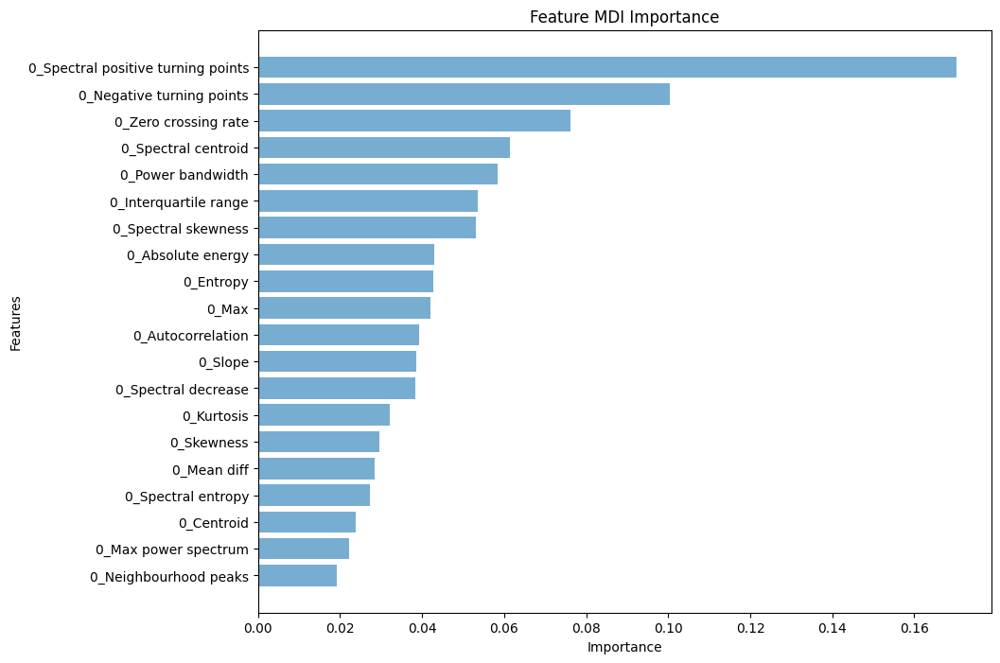

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=20, Auc: 63.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=19, Auc: 62.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=18, Auc: 64.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=17, Auc: 61.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=16, Auc: 62.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=15, Auc: 62.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=14, Auc: 61.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=13, Auc: 61.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=12, Auc: 64.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=11, Auc: 61.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=10, Auc: 62.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=9, Auc: 61.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=8, Auc: 62.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=7, Auc: 56.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=6, Auc: 54.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=5, Auc: 56.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=4, Auc: 55.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=3, Auc: 55.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.100, n=2, Auc: 49.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.170, n=1, Auc: 49.83%
    Threshold  Num Features       AUC
0    0.019258            20  0.637344
1    0.022263            19  0.628058
2    0.023920            18  0.648160
3    0.027231            17  0.618319
4    0.028343            16  0.625783
5    0.029559            15  0.629919
6    0.032212            14  0.612627
7    0.038396            13  0.617859
8    0.038458            12  0.641274
9    0.039375            11  0.617669
10   0.042099            10  0.620704
11   0.042765             9  0.619495
12   0.043019             8  0.626498
13   0.053049             7  0.560249
14   0.053479             6  0.544900
15   0.058307             5  0.563440
16   0.061501             4  0.551067
17   0.076117             3  0.556655
18   0.100404             2  0.493014
19   0.170245             1  0.498291
Processing patient 4_ with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:53:27,765] A new study created in memory with name: no-name-82868595-b47b-450d-bed2-58bec54b2df2


4328
4328
4304
4304


[I 2024-07-18 17:53:28,164] Trial 0 finished with value: 0.75263041556145 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.75263041556145.
[I 2024-07-18 17:53:28,630] Trial 1 finished with value: 0.7422232939474318 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.75263041556145.
[I 2024-07-18 17:53:29,000] Trial 2 finished with value: 0.7926272003858211 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'gamma

Best parameters found by Optuna: {'lambda': 1.9164283264972541, 'alpha': 0.00012816042044078594, 'max_depth': 9, 'eta': 0.0018677236949738761, 'gamma': 0.19785375691707896, 'subsample': 0.883971719262829, 'colsample_bytree': 0.5846506386124923, 'grow_policy': 'lossguide', 'min_child_weight': 3}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.94      0.96     31997
         1.0       0.94      0.99      0.97     31997

    accuracy                           0.96     63994
   macro avg       0.97      0.96      0.96     63994
weighted avg       0.97      0.96      0.96     63994

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.85      0.91      4147
         1.0       0.16      0.63      0.25       180

    accuracy                           0.84      4327
   macro avg       0.57      0.74      0.58      4327
weighted avg       0.95      0.84      0.8

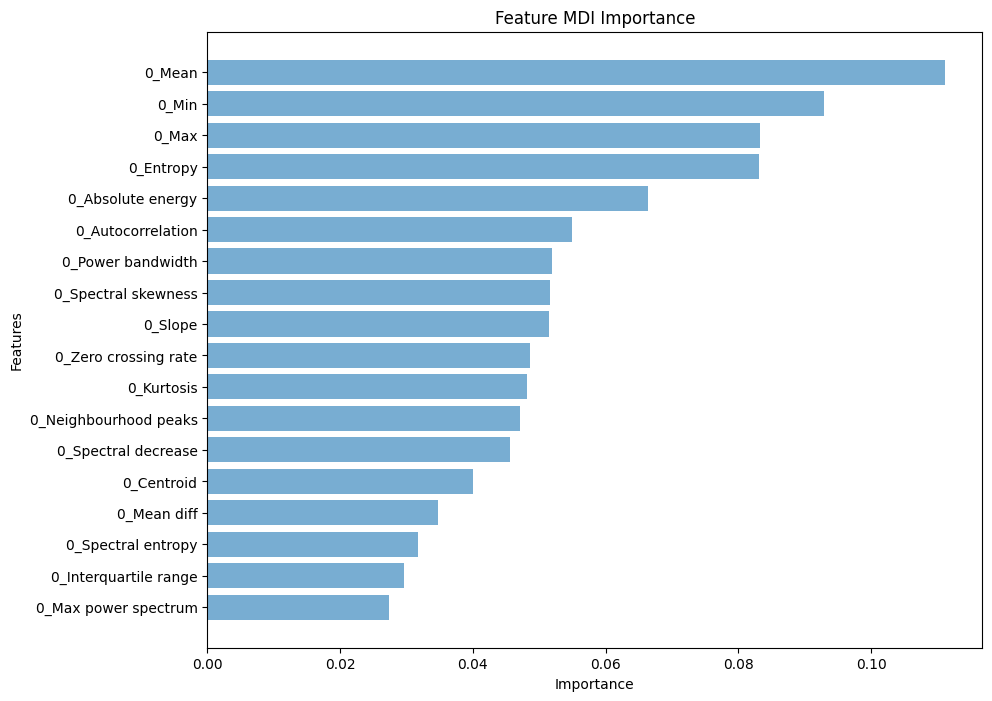

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=18, Auc: 82.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=17, Auc: 79.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=16, Auc: 79.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=15, Auc: 80.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=14, Auc: 77.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=13, Auc: 78.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=12, Auc: 80.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=11, Auc: 69.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=10, Auc: 72.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=9, Auc: 72.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=8, Auc: 70.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=7, Auc: 65.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=6, Auc: 60.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=5, Auc: 55.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.083, n=4, Auc: 47.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.083, n=3, Auc: 53.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.093, n=2, Auc: 64.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.111, n=1, Auc: 62.72%
    Threshold  Num Features       AUC
0    0.027429            18  0.820262
1    0.029581            17  0.792631
2    0.031755            16  0.795774
3    0.034762            15  0.804755
4    0.040032            14  0.772094
5    0.045615            13  0.783515
6    0.047060            12  0.803904
7    0.048186            11  0.697673
8    0.048679            10  0.727137
9    0.051550             9  0.727238
10   0.051650             8  0.702757
11   0.051916             7  0.650393
12   0.054963             6  0.608136
13   0.066379             5  0.558935
14   0.083145             4  0.474455
15   0.083214             3  0.538712
16   0.092893             2  0.648283
17   0.111191             1  0.627214
Processing patient 4_ with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:55:24,203] A new study created in memory with name: no-name-04628258-7834-4137-bd1c-6cebeb60349d


4328
4328
4208
4208


[I 2024-07-18 17:55:24,622] Trial 0 finished with value: 0.5957358733220802 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5957358733220802.
[I 2024-07-18 17:55:25,113] Trial 1 finished with value: 0.5450539881574366 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5957358733220802.
[I 2024-07-18 17:55:25,486] Trial 2 finished with value: 0.5828209147174664 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.2308534699519587, 'alpha': 9.8654704939556e-05, 'max_depth': 8, 'eta': 0.11679090118066536, 'gamma': 0.10978526776324751, 'subsample': 0.713362650029003, 'colsample_bytree': 0.9268029950034047, 'grow_policy': 'lossguide', 'min_child_weight': 10}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00     31997
         1.0       0.99      1.00      1.00     31997

    accuracy                           1.00     63994
   macro avg       1.00      1.00      1.00     63994
weighted avg       1.00      1.00      1.00     63994

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96      4147
         1.0       0.16      0.16      0.16       180

    accuracy                           0.93      4327
   macro avg       0.56      0.56      0.56      4327
weighted avg       0.93      0.93      0.93   

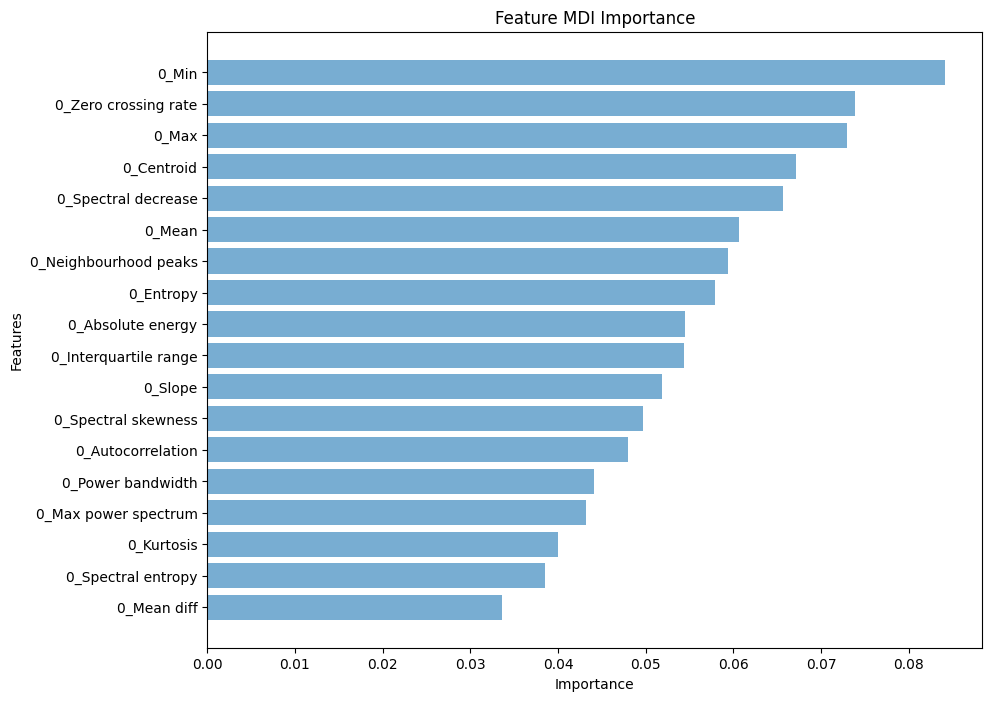

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=18, Auc: 73.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=17, Auc: 71.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=16, Auc: 74.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=15, Auc: 69.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=14, Auc: 75.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=13, Auc: 78.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=12, Auc: 74.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=11, Auc: 75.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=10, Auc: 74.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=9, Auc: 73.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=8, Auc: 73.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=7, Auc: 70.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=6, Auc: 71.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=5, Auc: 80.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.067, n=4, Auc: 75.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.073, n=3, Auc: 82.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=2, Auc: 66.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.084, n=1, Auc: 65.21%
    Threshold  Num Features       AUC
0    0.033658            18  0.738488
1    0.038535            17  0.716799
2    0.040056            16  0.740249
3    0.043205            15  0.694550
4    0.044159            14  0.750935
5    0.048025            13  0.788643
6    0.049696            12  0.748390
7    0.051837            11  0.754350
8    0.054415            10  0.740529
9    0.054460             9  0.735162
10   0.057935             8  0.739884
11   0.059420             7  0.702426
12   0.060608             6  0.716434
13   0.065724             5  0.805898
14   0.067198             4  0.751652
15   0.073015             3  0.824737
16   0.073859             2  0.664319
17   0.084193             1  0.652099
Processing patient 4_ with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:58:07,363] A new study created in memory with name: no-name-1f8ed022-15a4-43de-8ecb-e4487ce377c0


4491
4491
4467
4467


[I 2024-07-18 17:58:07,782] Trial 0 finished with value: 0.6508183049059779 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6508183049059779.
[I 2024-07-18 17:58:08,262] Trial 1 finished with value: 0.6567874570034397 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6567874570034397.
[I 2024-07-18 17:58:08,637] Trial 2 finished with value: 0.7689236712914819 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.508261325545869, 'alpha': 0.00025594788380397935, 'max_depth': 4, 'eta': 4.1320905273229335e-05, 'gamma': 0.18224522695539694, 'subsample': 0.7890182902341254, 'colsample_bytree': 0.5131360145459635, 'grow_policy': 'depthwise', 'min_child_weight': 1}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.80      0.69      0.74     30685
         1.0       0.73      0.83      0.78     30685

    accuracy                           0.76     61370
   macro avg       0.77      0.76      0.76     61370
weighted avg       0.77      0.76      0.76     61370

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.97      0.75      0.84      4167
         1.0       0.18      0.73      0.29       324

    accuracy                           0.74      4491
   macro avg       0.58      0.74      0.57      4491
weighted avg       0.92      0.74      0.

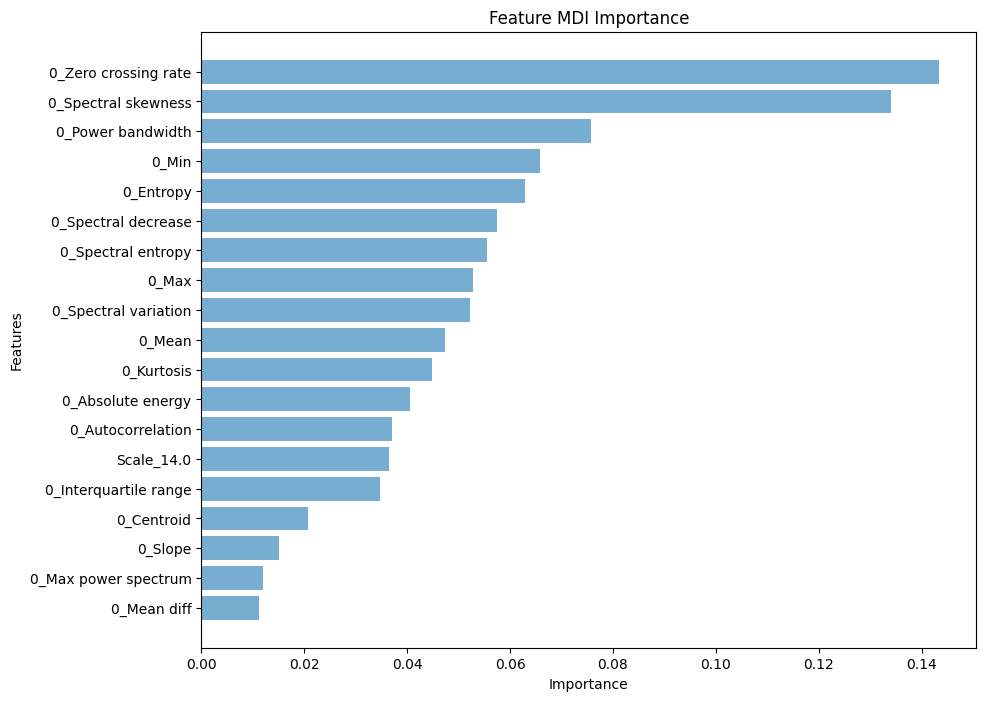

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=19, Auc: 80.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=18, Auc: 79.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=17, Auc: 80.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=16, Auc: 81.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=15, Auc: 78.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=14, Auc: 78.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=13, Auc: 79.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=12, Auc: 78.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=11, Auc: 77.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=10, Auc: 79.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=9, Auc: 72.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=8, Auc: 76.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=7, Auc: 77.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=6, Auc: 80.32%
Thresh=0.063, n=5, Auc: 80.21%
Thresh=0.066, n=4, Auc: 77.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local

Thresh=0.076, n=3, Auc: 73.20%
Thresh=0.134, n=2, Auc: 73.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.143, n=1, Auc: 73.54%
    Threshold  Num Features       AUC
0    0.011183            19  0.802024
1    0.011932            18  0.799065
2    0.015131            17  0.802586
3    0.020708            16  0.816246
4    0.034645            15  0.782178
5    0.036563            14  0.786087
6    0.037154            13  0.795595
7    0.040620            12  0.787701
8    0.044737            11  0.779290
9    0.047426            10  0.792263
10   0.052127             9  0.725014
11   0.052867             8  0.766185
12   0.055568             7  0.779277
13   0.057518             6  0.803176
14   0.062821             5  0.802129
15   0.065915             4  0.773690
16   0.075687             3  0.732011
17   0.133976             2  0.735634
18   0.143422             1  0.735354
Processing patient 4_ with window size 144 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 17:59:00,753] A new study created in memory with name: no-name-1d68163b-c6da-4c18-aa5e-3e706f28dfc0


4491
4491
4371
4371


[I 2024-07-18 17:59:01,184] Trial 0 finished with value: 0.7053787548847944 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7053787548847944.
[I 2024-07-18 17:59:01,698] Trial 1 finished with value: 0.6297618412749202 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.7053787548847944.
[I 2024-07-18 17:59:02,079] Trial 2 finished with value: 0.7124578181893597 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.9096838475487266, 'alpha': 1.1987277215989773, 'max_depth': 10, 'eta': 0.1483456299282318, 'gamma': 0.1718077069243025, 'subsample': 0.8551821646190673, 'colsample_bytree': 0.7333051970967747, 'grow_policy': 'lossguide', 'min_child_weight': 8}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     30685
         1.0       1.00      1.00      1.00     30685

    accuracy                           1.00     61370
   macro avg       1.00      1.00      1.00     61370
weighted avg       1.00      1.00      1.00     61370

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.92      0.94      0.93      4167
         1.0       0.02      0.01      0.01       324

    accuracy                           0.88      4491
   macro avg       0.47      0.48      0.47      4491
weighted avg       0.86      0.88      0.87     

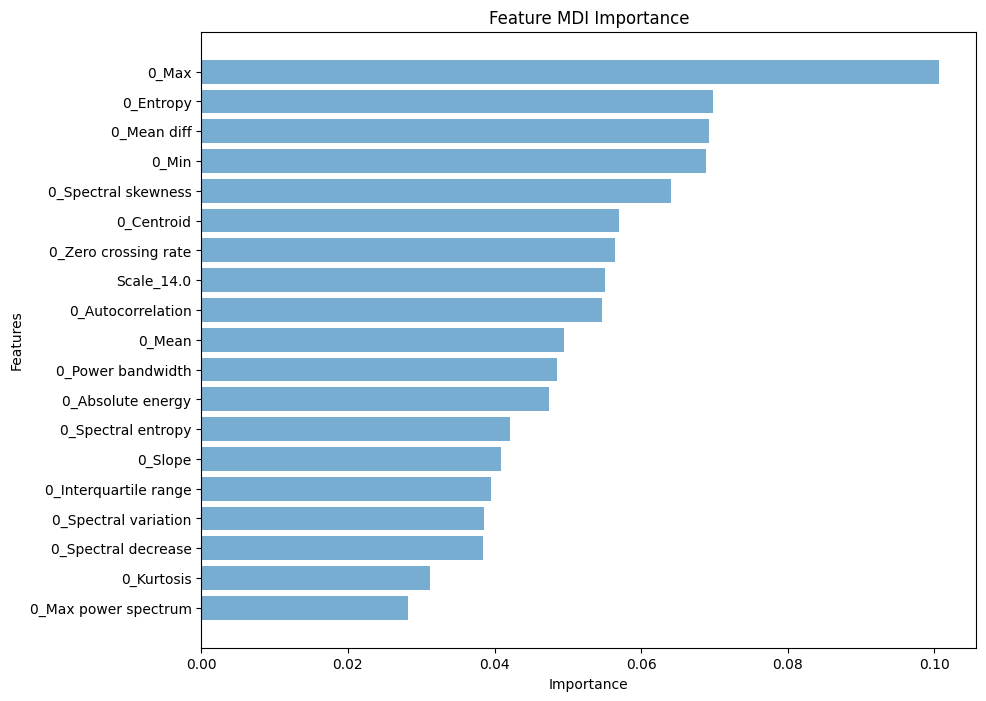

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=19, Auc: 79.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=18, Auc: 77.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=17, Auc: 75.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=16, Auc: 70.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=15, Auc: 73.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=14, Auc: 73.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=13, Auc: 73.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=12, Auc: 69.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=11, Auc: 70.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=10, Auc: 77.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=9, Auc: 75.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=8, Auc: 71.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=7, Auc: 68.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=6, Auc: 73.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.064, n=5, Auc: 68.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=4, Auc: 62.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=3, Auc: 46.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=2, Auc: 33.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.101, n=1, Auc: 31.80%
    Threshold  Num Features       AUC
0    0.028230            19  0.791183
1    0.031257            18  0.773264
2    0.038368            17  0.756268
3    0.038530            16  0.705560
4    0.039530            15  0.735589
5    0.040817            14  0.735720
6    0.042102            13  0.739590
7    0.047465            12  0.690020
8    0.048461            11  0.706501
9    0.049504            10  0.772886
10   0.054683             9  0.759623
11   0.055054             8  0.710465
12   0.056465             7  0.685800
13   0.056963             6  0.738336
14   0.064112             5  0.684703
15   0.068776             4  0.629717
16   0.069234             3  0.463736
17   0.069779             2  0.337289
18   0.100671             1  0.318022
Processing patient 4_ with window size 288 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:00:42,008] A new study created in memory with name: no-name-cef7e882-41e4-4cbb-b53c-bec39b011746


4618
4618
4594
4594


[I 2024-07-18 18:00:42,411] Trial 0 finished with value: 0.7888896731288035 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7888896731288035.
[I 2024-07-18 18:00:42,852] Trial 1 finished with value: 0.7486694062781019 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.7888896731288035.
[I 2024-07-18 18:00:43,202] Trial 2 finished with value: 0.7870514147688061 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.0504444537244346, 'alpha': 0.02025686111766241, 'max_depth': 7, 'eta': 0.022303640565096105, 'gamma': 0.16029650340574422, 'subsample': 0.8502633482292452, 'colsample_bytree': 0.8615297484976316, 'grow_policy': 'depthwise', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97     27395
         1.0       0.96      0.99      0.98     27395

    accuracy                           0.97     54790
   macro avg       0.98      0.97      0.97     54790
weighted avg       0.98      0.97      0.97     54790

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.95      0.96      4158
         1.0       0.61      0.69      0.64       460

    accuracy                           0.92      4618
   macro avg       0.79      0.82      0.80      4618
weighted avg       0.93      0.92      0.93  

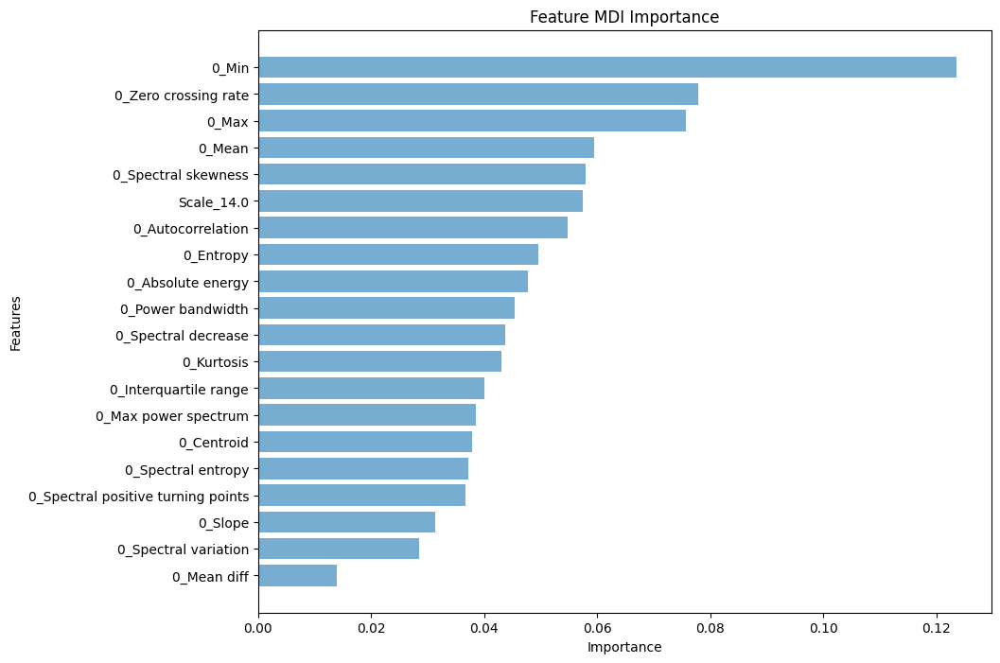

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=20, Auc: 85.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=19, Auc: 83.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=18, Auc: 84.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=17, Auc: 85.06%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=16, Auc: 83.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=15, Auc: 82.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=14, Auc: 83.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=13, Auc: 78.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=12, Auc: 78.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=11, Auc: 80.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=10, Auc: 80.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=9, Auc: 82.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=8, Auc: 80.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=7, Auc: 77.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=6, Auc: 72.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=5, Auc: 64.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=4, Auc: 57.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=3, Auc: 60.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.078, n=2, Auc: 71.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.124, n=1, Auc: 68.04%
    Threshold  Num Features       AUC
0    0.013983            20  0.853866
1    0.028419            19  0.837471
2    0.031339            18  0.841665
3    0.036727            17  0.850621
4    0.037268            16  0.832437
5    0.037872            15  0.828256
6    0.038454            14  0.833055
7    0.039986            13  0.788948
8    0.042977            12  0.781787
9    0.043745            11  0.802185
10   0.045320            10  0.801200
11   0.047787             9  0.822953
12   0.049623             8  0.806836
13   0.054818             7  0.779839
14   0.057351             6  0.725482
15   0.057904             5  0.649617
16   0.059369             4  0.576437
17   0.075699             3  0.604861
18   0.077848             2  0.711353
19   0.123512             1  0.680394
Processing patient 4_ with window size 288 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:01:22,573] A new study created in memory with name: no-name-8cbe0a63-7d09-4245-b5f8-6dc75a6c89ae


4618
4618
4498
4498


[I 2024-07-18 18:01:23,114] Trial 0 finished with value: 0.9289141414141414 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.9289141414141414.
[I 2024-07-18 18:01:23,665] Trial 1 finished with value: 0.909879593031767 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.9289141414141414.
[I 2024-07-18 18:01:24,061] Trial 2 finished with value: 0.8885963674007153 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, '

Best parameters found by Optuna: {'lambda': 1.509964073195015, 'alpha': 0.31755820327125656, 'max_depth': 4, 'eta': 0.0024982498896714196, 'gamma': 0.15072361599482476, 'subsample': 0.7771581392863046, 'colsample_bytree': 0.5646992564080207, 'grow_policy': 'depthwise', 'min_child_weight': 4}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.83      0.76      0.79     27299
         1.0       0.78      0.85      0.81     27299

    accuracy                           0.80     54598
   macro avg       0.80      0.80      0.80     54598
weighted avg       0.80      0.80      0.80     54598

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97      4158
         1.0       0.71      0.88      0.79       460

    accuracy                           0.95      4618
   macro avg       0.85      0.92      0.88      4618
weighted avg       0.96      0.95      0.95  

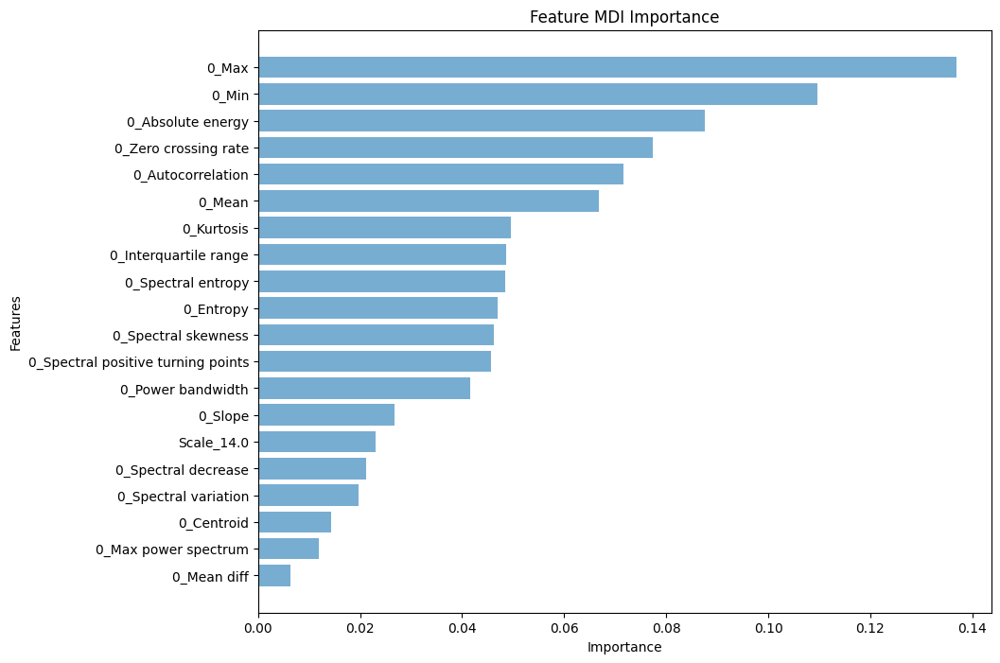

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.006, n=20, Auc: 97.96%
Thresh=0.012, n=19, Auc: 95.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=18, Auc: 95.34%
Thresh=0.020, n=17, Auc: 96.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=16, Auc: 95.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=15, Auc: 95.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=14, Auc: 94.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=13, Auc: 95.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=12, Auc: 93.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=11, Auc: 95.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=10, Auc: 90.18%
Thresh=0.048, n=9, Auc: 91.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=8, Auc: 90.59%
Thresh=0.050, n=7, Auc: 74.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.067, n=6, Auc: 92.90%
Thresh=0.072, n=5, Auc: 68.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=4, Auc: 67.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.088, n=3, Auc: 58.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.110, n=2, Auc: 35.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.137, n=1, Auc: 30.74%
    Threshold  Num Features       AUC
0    0.006407            20  0.979621
1    0.011841            19  0.957098
2    0.014262            18  0.953378
3    0.019678            17  0.962749
4    0.021092            16  0.958968
5    0.023038            15  0.953492
6    0.026814            14  0.941328
7    0.041652            13  0.958056
8    0.045601            12  0.937468
9    0.046197            11  0.954398
10   0.046929            10  0.901800
11   0.048433             9  0.910941
12   0.048717             8  0.905853
13   0.049504             7  0.741537
14   0.066832             6  0.929004
15   0.071567             5  0.685721
16   0.077338             4  0.670791
17   0.087602             3  0.589137
18   0.109628             2  0.358546
19   0.136869             1  0.307408
Processing patient 10 with window size 24 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:02:28,566] A new study created in memory with name: no-name-8677fdca-bd6d-4c22-85a3-42a50aabc03f


11592
11592
11568
11568


[I 2024-07-18 18:02:29,147] Trial 0 finished with value: 0.5858537872789654 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5858537872789654.
[I 2024-07-18 18:02:29,830] Trial 1 finished with value: 0.5909279297772303 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5909279297772303.
[I 2024-07-18 18:02:30,335] Trial 2 finished with value: 0.6047005464160387 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.5049266955446265, 'alpha': 1.1453486378923834e-05, 'max_depth': 6, 'eta': 0.0007357582804390127, 'gamma': 0.13840001501763025, 'subsample': 0.9963585670782804, 'colsample_bytree': 0.9721397091934684, 'grow_policy': 'lossguide', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.83      0.78      0.81     91651
         1.0       0.80      0.84      0.82     91651

    accuracy                           0.81    183302
   macro avg       0.81      0.81      0.81    183302
weighted avg       0.81      0.81      0.81    183302

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.79      0.88     11367
         1.0       0.03      0.28      0.05       225

    accuracy                           0.78     11592
   macro avg       0.50      0.54      0.46     11592
weighted avg       0.96      0.78      0.

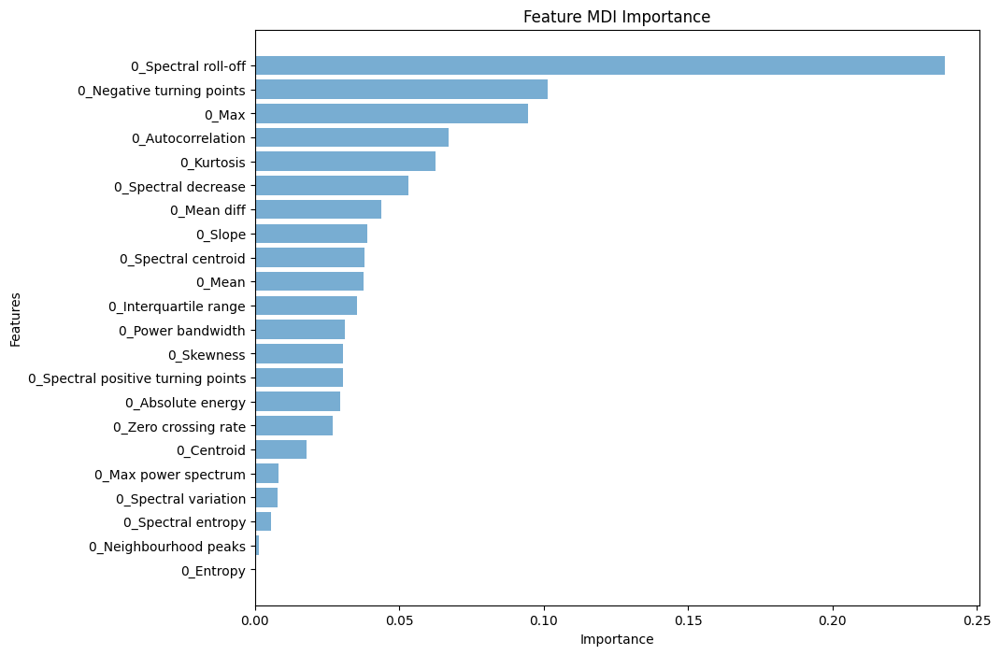

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 61.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.001, n=21, Auc: 60.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.005, n=20, Auc: 60.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.008, n=19, Auc: 60.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.008, n=18, Auc: 60.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=17, Auc: 59.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=16, Auc: 60.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=15, Auc: 61.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=14, Auc: 61.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=13, Auc: 60.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=12, Auc: 61.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=11, Auc: 59.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=10, Auc: 60.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=9, Auc: 60.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=8, Auc: 59.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=7, Auc: 59.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=6, Auc: 57.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=5, Auc: 56.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.067, n=4, Auc: 56.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.094, n=3, Auc: 57.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.102, n=2, Auc: 55.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.239, n=1, Auc: 55.75%
    Threshold  Num Features       AUC
0    0.000000            22  0.610336
1    0.001275            21  0.606177
2    0.005455            20  0.604173
3    0.007854            19  0.605480
4    0.008076            18  0.607188
5    0.017721            17  0.599777
6    0.026844            16  0.604684
7    0.029475            15  0.610899
8    0.030466            14  0.612095
9    0.030483            13  0.608188
10   0.031158            12  0.610992
11   0.035312            11  0.597043
12   0.037578            10  0.604845
13   0.037949             9  0.603695
14   0.039022             8  0.593454
15   0.043722             7  0.595422
16   0.053252             6  0.578869
17   0.062446             5  0.567227
18   0.067051             4  0.565760
19   0.094439             3  0.579849
20   0.101512             2  0.552627
21   0.238910             1  0.557522
Processing patient 10 with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:03:32,991] A new study created in memory with name: no-name-190dacea-6bef-4421-8362-f9dc68184690


11592
11592
11472
11472


[I 2024-07-18 18:03:33,610] Trial 0 finished with value: 0.6260831363624525 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6260831363624525.
[I 2024-07-18 18:03:34,356] Trial 1 finished with value: 0.6358087770875658 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6358087770875658.
[I 2024-07-18 18:03:34,870] Trial 2 finished with value: 0.635540994361098 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, '

Best parameters found by Optuna: {'lambda': 1.1072546142896391, 'alpha': 45.53745028984942, 'max_depth': 3, 'eta': 0.0002621437668030704, 'gamma': 0.16436334932761443, 'subsample': 0.5320230484929532, 'colsample_bytree': 0.9121722475378793, 'grow_policy': 'depthwise', 'min_child_weight': 6}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.70      0.65      0.67     91642
         1.0       0.67      0.73      0.70     91642

    accuracy                           0.69    183284
   macro avg       0.69      0.69      0.69    183284
weighted avg       0.69      0.69      0.69    183284

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.68      0.80     11376
         1.0       0.04      0.62      0.07       216

    accuracy                           0.68     11592
   macro avg       0.51      0.65      0.44     11592
weighted avg       0.97      0.68      0.79   

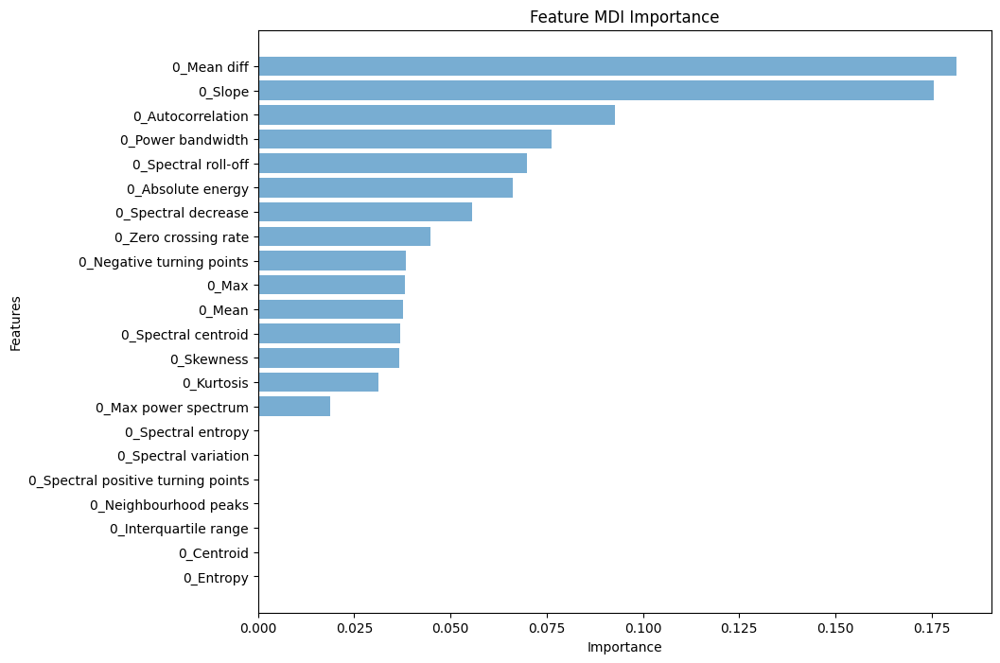

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 68.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 68.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 68.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 68.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 68.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 68.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 68.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=15, Auc: 67.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=14, Auc: 67.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=13, Auc: 67.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=12, Auc: 67.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=11, Auc: 67.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=10, Auc: 64.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=9, Auc: 66.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=8, Auc: 65.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=7, Auc: 65.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=6, Auc: 64.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=5, Auc: 65.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=4, Auc: 66.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.093, n=3, Auc: 67.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.175, n=2, Auc: 62.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.181, n=1, Auc: 61.23%
    Threshold  Num Features       AUC
0    0.000000            22  0.681452
1    0.000000            22  0.681452
2    0.000000            22  0.681452
3    0.000000            22  0.681452
4    0.000000            22  0.681452
5    0.000000            22  0.681452
6    0.000000            22  0.681452
7    0.018685            15  0.675921
8    0.031343            14  0.671756
9    0.036689            13  0.675887
10   0.036853            12  0.671157
11   0.037750            11  0.678169
12   0.038037            10  0.642440
13   0.038340             9  0.659977
14   0.044759             8  0.659756
15   0.055682             7  0.653903
16   0.066061             6  0.647052
17   0.069889             5  0.652294
18   0.076204             4  0.667147
19   0.092769             3  0.671240
20   0.175497             2  0.627670
21   0.181442             1  0.612347
Processing patient 10 with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:04:57,498] A new study created in memory with name: no-name-8ca37937-f077-49d7-ba7f-5810553d2c2f


11588
11588
11564
11564


[I 2024-07-18 18:04:58,120] Trial 0 finished with value: 0.6297940425763006 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6297940425763006.
[I 2024-07-18 18:04:58,857] Trial 1 finished with value: 0.6275078065602259 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.6297940425763006.
[I 2024-07-18 18:04:59,370] Trial 2 finished with value: 0.6351285706527643 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.1464188664146338, 'alpha': 68.86152909492044, 'max_depth': 3, 'eta': 0.0005788259018829013, 'gamma': 0.10449442066650282, 'subsample': 0.6453260845320239, 'colsample_bytree': 0.5261494181751525, 'grow_policy': 'depthwise', 'min_child_weight': 2}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.81      0.61      0.70     89598
         1.0       0.69      0.86      0.77     89598

    accuracy                           0.74    179196
   macro avg       0.75      0.74      0.73    179196
weighted avg       0.75      0.74      0.73    179196

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.97      0.67      0.79     10912
         1.0       0.12      0.69      0.20       675

    accuracy                           0.67     11587
   macro avg       0.54      0.68      0.50     11587
weighted avg       0.92      0.67      0.76   

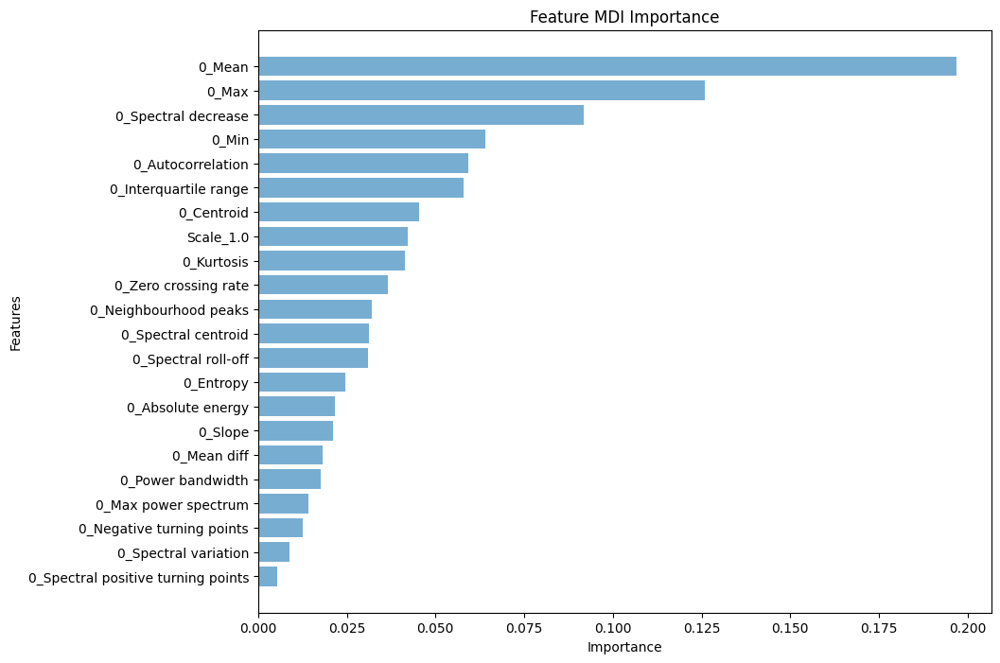

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.005, n=22, Auc: 72.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.009, n=21, Auc: 71.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=20, Auc: 73.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=19, Auc: 74.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=18, Auc: 73.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=17, Auc: 75.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=16, Auc: 75.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=15, Auc: 73.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=14, Auc: 72.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=13, Auc: 73.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=12, Auc: 71.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=11, Auc: 74.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=10, Auc: 74.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=9, Auc: 74.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=8, Auc: 73.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=7, Auc: 74.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=6, Auc: 73.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=5, Auc: 73.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.064, n=4, Auc: 73.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.092, n=3, Auc: 67.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.126, n=2, Auc: 65.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.197, n=1, Auc: 65.55%
    Threshold  Num Features       AUC
0    0.005290            22  0.728111
1    0.008755            21  0.711983
2    0.012715            20  0.732749
3    0.014280            19  0.745519
4    0.017597            18  0.735575
5    0.018324            17  0.750104
6    0.021095            16  0.753527
7    0.021748            15  0.735619
8    0.024519            14  0.724096
9    0.031038            13  0.735598
10   0.031289            12  0.713392
11   0.031949            11  0.745041
12   0.036640            10  0.740741
13   0.041416             9  0.745918
14   0.042102             8  0.733874
15   0.045471             7  0.748494
16   0.057874             6  0.731781
17   0.059154             5  0.730961
18   0.064147             4  0.737745
19   0.091915             3  0.678977
20   0.125856             2  0.658569
21   0.196825             1  0.655543
Processing patient 10 with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:05:51,277] A new study created in memory with name: no-name-6a88209a-380e-4bfe-9101-a5bf38cd9572


11588
11588
11468
11468


[I 2024-07-18 18:05:51,867] Trial 0 finished with value: 0.501904489574966 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.501904489574966.
[I 2024-07-18 18:05:52,553] Trial 1 finished with value: 0.4641718762732977 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.501904489574966.
[I 2024-07-18 18:05:53,063] Trial 2 finished with value: 0.4987995349189164 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'ga

Best parameters found by Optuna: {'lambda': 1.6259788810618787, 'alpha': 1.5050380469942668, 'max_depth': 3, 'eta': 9.999252654337534e-05, 'gamma': 0.10480460574165006, 'subsample': 0.9878983267406396, 'colsample_bytree': 0.974882410122976, 'grow_policy': 'depthwise', 'min_child_weight': 6}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.64      0.62      0.63     89550
         1.0       0.63      0.65      0.64     89550

    accuracy                           0.63    179100
   macro avg       0.63      0.63      0.63    179100
weighted avg       0.63      0.63      0.63    179100

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.75      0.84     10960
         1.0       0.09      0.42      0.15       627

    accuracy                           0.73     11587
   macro avg       0.52      0.59      0.49     11587
weighted avg       0.91      0.73      0.80   

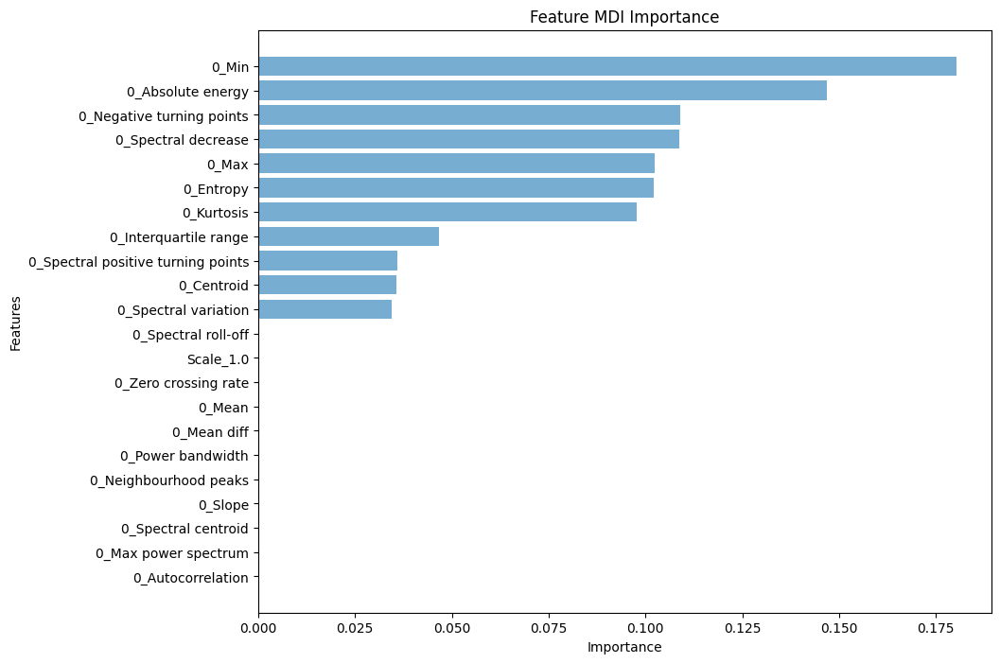

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=11, Auc: 56.06%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=10, Auc: 56.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=9, Auc: 55.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=8, Auc: 56.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.098, n=7, Auc: 57.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.102, n=6, Auc: 56.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.102, n=5, Auc: 57.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.109, n=4, Auc: 49.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.109, n=3, Auc: 49.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.147, n=2, Auc: 43.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.180, n=1, Auc: 42.74%
    Threshold  Num Features       AUC
0    0.000000            22  0.574428
1    0.000000            22  0.574428
2    0.000000            22  0.574428
3    0.000000            22  0.574428
4    0.000000            22  0.574428
5    0.000000            22  0.574428
6    0.000000            22  0.574428
7    0.000000            22  0.574428
8    0.000000            22  0.574428
9    0.000000            22  0.574428
10   0.000000            22  0.574428
11   0.034424            11  0.560581
12   0.035705            10  0.562519
13   0.036005             9  0.557980
14   0.046789             8  0.561071
15   0.097845             7  0.570186
16   0.102054             6  0.569256
17   0.102495             5  0.571190
18   0.108648             4  0.492346
19   0.109071             3  0.491011
20   0.146712             2  0.436209
21   0.180253             1  0.427416
Processing patient 10 with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:07:30,016] A new study created in memory with name: no-name-7ca441bb-f074-431f-87b1-c10dd8af2db0


11580
11580
11556
11556


[I 2024-07-18 18:07:30,663] Trial 0 finished with value: 0.5561338812491898 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5561338812491898.
[I 2024-07-18 18:07:31,416] Trial 1 finished with value: 0.5594152991747985 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5594152991747985.
[I 2024-07-18 18:07:31,984] Trial 2 finished with value: 0.525599053190751 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, '

Best parameters found by Optuna: {'lambda': 1.6380481919704988, 'alpha': 0.004227321962202868, 'max_depth': 3, 'eta': 0.052503693612188714, 'gamma': 0.179356009930499, 'subsample': 0.692167265593205, 'colsample_bytree': 0.7199031906998279, 'grow_policy': 'lossguide', 'min_child_weight': 3}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.91      0.82      0.86     86873
         1.0       0.83      0.92      0.87     86873

    accuracy                           0.87    173746
   macro avg       0.87      0.87      0.87    173746
weighted avg       0.87      0.87      0.87    173746

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.88      0.89     10362
         1.0       0.15      0.18      0.16      1218

    accuracy                           0.81     11580
   macro avg       0.53      0.53      0.53     11580
weighted avg       0.82      0.81      0.81    

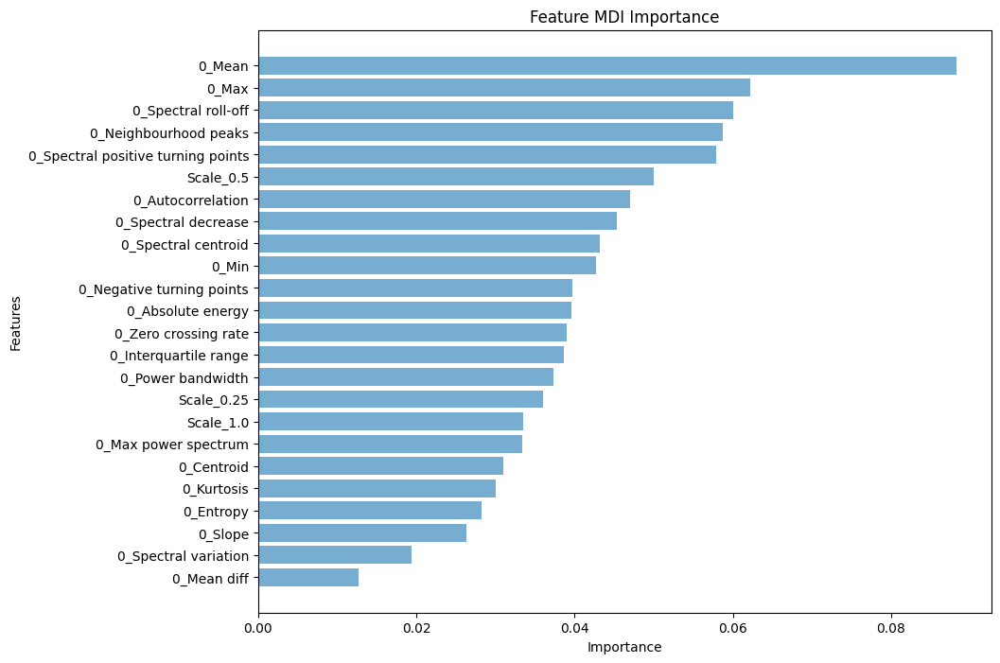

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=24, Auc: 65.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=23, Auc: 65.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=22, Auc: 63.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=21, Auc: 67.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=20, Auc: 67.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=19, Auc: 65.66%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=18, Auc: 67.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=17, Auc: 63.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=16, Auc: 67.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=15, Auc: 66.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=14, Auc: 66.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=13, Auc: 67.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=12, Auc: 62.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=11, Auc: 63.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=10, Auc: 63.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=9, Auc: 61.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=8, Auc: 61.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=7, Auc: 60.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=6, Auc: 53.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=5, Auc: 55.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=4, Auc: 54.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=3, Auc: 50.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=2, Auc: 55.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.088, n=1, Auc: 64.54%
    Threshold  Num Features       AUC
0    0.012652            24  0.659836
1    0.019359            23  0.651805
2    0.026281            22  0.633316
3    0.028239            21  0.671551
4    0.030067            20  0.672748
5    0.030997            19  0.656627
6    0.033441            18  0.675882
7    0.033454            17  0.633197
8    0.036010            16  0.679506
9    0.037285            15  0.666155
10   0.038665            14  0.664200
11   0.038980            13  0.670916
12   0.039563            12  0.620131
13   0.039768            11  0.630027
14   0.042669            10  0.635689
15   0.043216             9  0.616774
16   0.045368             8  0.614110
17   0.046972             7  0.600411
18   0.050005             6  0.531964
19   0.057895             5  0.555164
20   0.058713             4  0.548621
21   0.059984             3  0.505041
22   0.062176             2  0.555016
23   0.088241             1  0.645369
Processing patient 

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:08:15,738] A new study created in memory with name: no-name-1acdbfbd-134b-4547-b737-6f6641f34207


11580
11580
11460
11460


[I 2024-07-18 18:08:16,394] Trial 0 finished with value: 0.3952866895815159 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.3952866895815159.
[I 2024-07-18 18:08:17,178] Trial 1 finished with value: 0.3802199716444933 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.3952866895815159.
[I 2024-07-18 18:08:17,717] Trial 2 finished with value: 0.44516547643762383 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484,

Best parameters found by Optuna: {'lambda': 1.8780536235932948, 'alpha': 0.0011558263288045903, 'max_depth': 3, 'eta': 0.4955940831113144, 'gamma': 0.18449917739981125, 'subsample': 0.7313893874868909, 'colsample_bytree': 0.7663182559613755, 'grow_policy': 'depthwise', 'min_child_weight': 10}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99     86777
         1.0       0.98      0.99      0.99     86777

    accuracy                           0.99    173554
   macro avg       0.99      0.99      0.99    173554
weighted avg       0.99      0.99      0.99    173554

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.98      0.94     10458
         1.0       0.09      0.02      0.03      1122

    accuracy                           0.89     11580
   macro avg       0.50      0.50      0.48     11580
weighted avg       0.82      0.89      0.85 

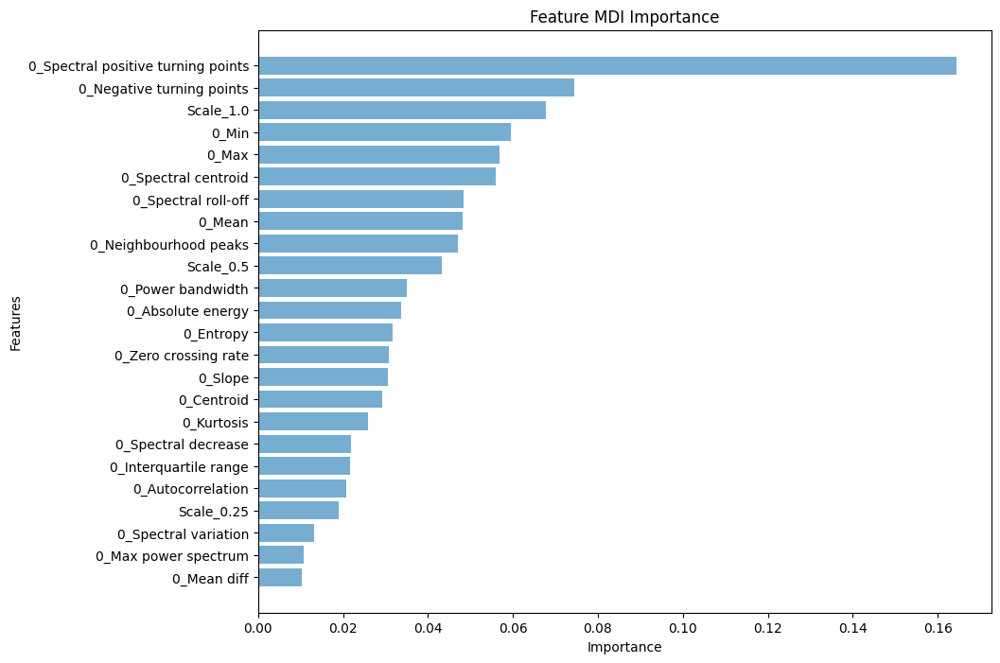

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=24, Auc: 56.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=23, Auc: 48.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=22, Auc: 47.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=21, Auc: 47.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=20, Auc: 53.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=19, Auc: 47.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=18, Auc: 50.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=17, Auc: 48.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=16, Auc: 46.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=15, Auc: 50.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=14, Auc: 46.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=13, Auc: 47.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=12, Auc: 41.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=11, Auc: 48.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=10, Auc: 49.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=9, Auc: 45.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=8, Auc: 48.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=7, Auc: 46.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=6, Auc: 50.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=5, Auc: 44.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=4, Auc: 46.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=3, Auc: 53.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=2, Auc: 48.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.164, n=1, Auc: 54.27%
    Threshold  Num Features       AUC
0    0.010188            24  0.565978
1    0.010673            23  0.486900
2    0.013270            22  0.476868
3    0.018984            21  0.472987
4    0.020853            20  0.539104
5    0.021553            19  0.475614
6    0.021867            18  0.508451
7    0.025834            17  0.487759
8    0.029163            16  0.467199
9    0.030666            15  0.504902
10   0.030697            14  0.461759
11   0.031571            13  0.474236
12   0.033688            12  0.419375
13   0.035058            11  0.487119
14   0.043358            10  0.492531
15   0.047141             9  0.452593
16   0.048148             8  0.482210
17   0.048477             7  0.468203
18   0.055971             6  0.508924
19   0.056879             5  0.444099
20   0.059505             4  0.467484
21   0.067742             3  0.538546
22   0.074330             2  0.483359
23   0.164385             1  0.542659
Processing patient 

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:09:34,047] A new study created in memory with name: no-name-99027b6e-5ec0-400f-9a25-69b0257db5ce


11566
11566
11542
11542


[I 2024-07-18 18:09:34,702] Trial 0 finished with value: 0.44471562346503635 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.44471562346503635.
[I 2024-07-18 18:09:35,455] Trial 1 finished with value: 0.47160184056541693 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.47160184056541693.
[I 2024-07-18 18:09:36,015] Trial 2 finished with value: 0.4018291588414615 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.00067890532716984

Best parameters found by Optuna: {'lambda': 1.4637371873657266, 'alpha': 0.13932120977637688, 'max_depth': 6, 'eta': 0.9585452577836632, 'gamma': 0.15930109458088776, 'subsample': 0.515810827673846, 'colsample_bytree': 0.6988175590828336, 'grow_policy': 'lossguide', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     82415
         1.0       1.00      1.00      1.00     82415

    accuracy                           1.00    164830
   macro avg       1.00      1.00      1.00    164830
weighted avg       1.00      1.00      1.00    164830

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.82      1.00      0.90      9489
         1.0       0.58      0.02      0.04      2076

    accuracy                           0.82     11565
   macro avg       0.70      0.51      0.47     11565
weighted avg       0.78      0.82      0.75     

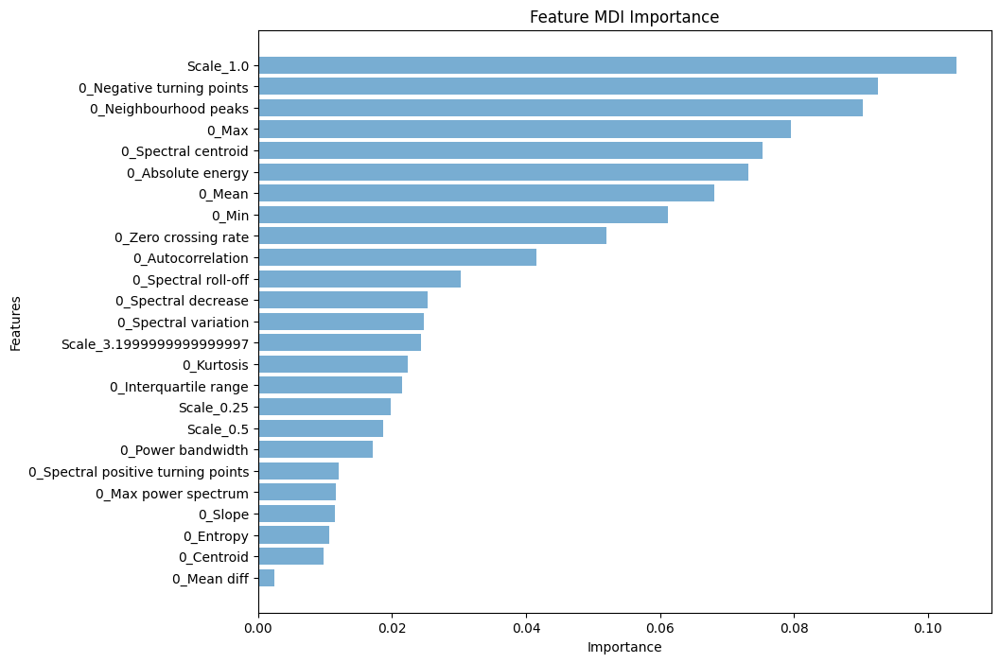

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.002, n=25, Auc: 59.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=24, Auc: 44.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=23, Auc: 54.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=22, Auc: 45.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=21, Auc: 55.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=20, Auc: 53.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=19, Auc: 47.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=18, Auc: 50.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=17, Auc: 51.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=16, Auc: 39.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=15, Auc: 52.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=14, Auc: 50.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=13, Auc: 50.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=12, Auc: 51.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=11, Auc: 48.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=10, Auc: 49.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=9, Auc: 47.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=8, Auc: 46.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=7, Auc: 48.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.073, n=6, Auc: 39.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.075, n=5, Auc: 30.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.080, n=4, Auc: 40.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.090, n=3, Auc: 51.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.092, n=2, Auc: 49.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.104, n=1, Auc: 52.40%
    Threshold  Num Features       AUC
0    0.002477            25  0.596134
1    0.009814            24  0.444578
2    0.010576            23  0.541879
3    0.011403            22  0.454832
4    0.011547            21  0.558444
5    0.012021            20  0.536380
6    0.017116            19  0.477243
7    0.018676            18  0.509254
8    0.019812            17  0.517288
9    0.021429            16  0.395443
10   0.022406            15  0.525958
11   0.024371            14  0.502902
12   0.024762            13  0.501164
13   0.025379            12  0.517353
14   0.030284            11  0.485045
15   0.041518            10  0.495682
16   0.051986             9  0.471952
17   0.061222             8  0.466455
18   0.068091             7  0.484404
19   0.073240             6  0.391947
20   0.075301             5  0.303525
21   0.079560             4  0.409890
22   0.090293             3  0.513438
23   0.092484             2  0.490289
24   0.104232      

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:10:38,838] A new study created in memory with name: no-name-7511bc92-d9b1-43c4-963c-3bf570a550e4


11566
11566
11446
11446


[I 2024-07-18 18:10:39,542] Trial 0 finished with value: 0.5100253183899507 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5100253183899507.
[I 2024-07-18 18:10:40,293] Trial 1 finished with value: 0.5243758924666593 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5243758924666593.
[I 2024-07-18 18:10:40,827] Trial 2 finished with value: 0.4860434812390994 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.8391428990445453, 'alpha': 0.00667501382485051, 'max_depth': 9, 'eta': 0.2877039226627185, 'gamma': 0.12368496593481831, 'subsample': 0.899713834328817, 'colsample_bytree': 0.5582403948266069, 'grow_policy': 'depthwise', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     82319
         1.0       1.00      1.00      1.00     82319

    accuracy                           1.00    164638
   macro avg       1.00      1.00      1.00    164638
weighted avg       1.00      1.00      1.00    164638

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90      9585
         1.0       0.30      0.02      0.03      1980

    accuracy                           0.83     11565
   macro avg       0.57      0.50      0.47     11565
weighted avg       0.74      0.83      0.75     

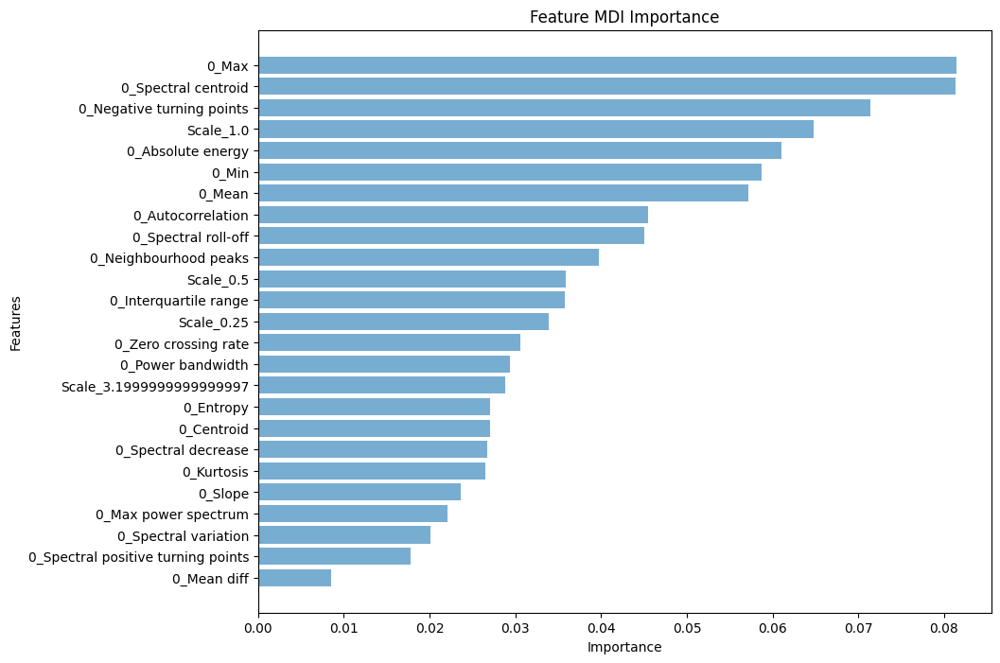

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.009, n=25, Auc: 59.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=24, Auc: 57.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=23, Auc: 56.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=22, Auc: 52.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=21, Auc: 52.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=20, Auc: 56.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=19, Auc: 53.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=18, Auc: 54.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=17, Auc: 57.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=16, Auc: 54.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=15, Auc: 54.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=14, Auc: 55.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=13, Auc: 48.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=12, Auc: 50.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=11, Auc: 51.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=10, Auc: 48.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=9, Auc: 48.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=8, Auc: 48.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=7, Auc: 50.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=6, Auc: 53.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=5, Auc: 50.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=4, Auc: 45.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.071, n=3, Auc: 36.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.081, n=2, Auc: 33.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.081, n=1, Auc: 31.00%
    Threshold  Num Features       AUC
0    0.008518            25  0.596735
1    0.017738            24  0.578019
2    0.020140            23  0.562985
3    0.022109            22  0.522118
4    0.023674            21  0.528707
5    0.026517            20  0.560662
6    0.026725            19  0.530251
7    0.027078            18  0.546711
8    0.027085            17  0.575679
9    0.028779            16  0.549710
10   0.029351            15  0.547133
11   0.030564            14  0.555365
12   0.033935            13  0.488817
13   0.035794            12  0.503140
14   0.035892            11  0.512533
15   0.039797            10  0.488388
16   0.045021             9  0.488916
17   0.045523             8  0.487584
18   0.057155             7  0.503915
19   0.058681             6  0.538914
20   0.061013             5  0.505926
21   0.064796             4  0.456485
22   0.071387             3  0.363326
23   0.081295             2  0.334671
24   0.081433      

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:11:54,217] A new study created in memory with name: no-name-cc840419-51c8-411a-990f-90e63e1f0826


5852
5852
5828
5828


[I 2024-07-18 18:11:54,688] Trial 0 finished with value: 0.6543751026615163 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6543751026615163.
[I 2024-07-18 18:11:55,232] Trial 1 finished with value: 0.7275403095476534 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.7275403095476534.
[I 2024-07-18 18:11:55,640] Trial 2 finished with value: 0.4300027288093383 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.1302208941972685, 'alpha': 99.05911841286131, 'max_depth': 7, 'eta': 5.273486499254428e-05, 'gamma': 0.10114918817589424, 'subsample': 0.5068038762218416, 'colsample_bytree': 0.8044263819726211, 'grow_policy': 'depthwise', 'min_child_weight': 6}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.74      0.96      0.84     44617
         1.0       0.95      0.66      0.78     44617

    accuracy                           0.81     89234
   macro avg       0.84      0.81      0.81     89234
weighted avg       0.84      0.81      0.81     89234

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.97      0.97      5719
         1.0       0.02      0.03      0.02       132

    accuracy                           0.95      5851
   macro avg       0.50      0.50      0.50      5851
weighted avg       0.96      0.95      0.95   

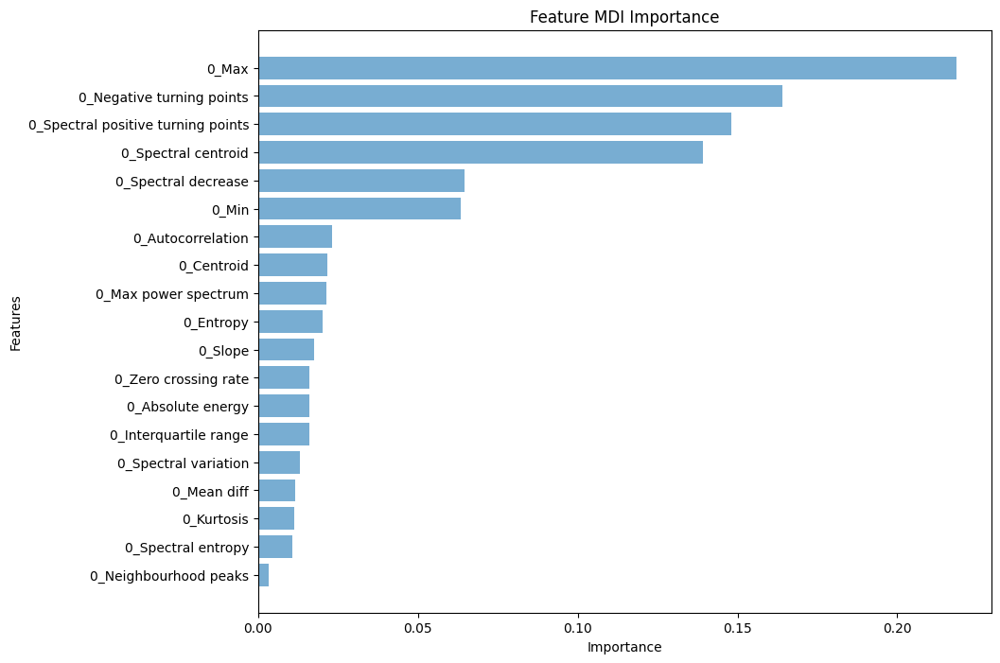

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.003, n=19, Auc: 82.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=18, Auc: 78.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=17, Auc: 79.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=16, Auc: 80.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=15, Auc: 80.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=14, Auc: 77.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=13, Auc: 80.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=12, Auc: 77.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=11, Auc: 80.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=10, Auc: 79.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=9, Auc: 78.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=8, Auc: 79.66%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=7, Auc: 78.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=6, Auc: 78.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=5, Auc: 76.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.139, n=4, Auc: 76.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.148, n=3, Auc: 60.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.164, n=2, Auc: 37.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.218, n=1, Auc: 40.83%
    Threshold  Num Features       AUC
0    0.003203            19  0.827804
1    0.010857            18  0.781962
2    0.011205            17  0.799274
3    0.011703            16  0.802843
4    0.012949            15  0.807441
5    0.015984            14  0.770907
6    0.016039            13  0.802698
7    0.016143            12  0.774160
8    0.017452            11  0.800322
9    0.020279            10  0.798150
10   0.021285             9  0.785475
11   0.021604             8  0.796649
12   0.023286             7  0.784863
13   0.063470             6  0.789701
14   0.064597             5  0.764477
15   0.139312             4  0.766498
16   0.148185             3  0.604510
17   0.163975             2  0.371299
18   0.218471             1  0.408260
Processing patient 13 with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:12:36,996] A new study created in memory with name: no-name-b094eb49-6138-409e-94fe-d5131bf2a1a5


5852
5852
5732
5732


[I 2024-07-18 18:12:37,458] Trial 0 finished with value: 0.6841151504554197 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6841151504554197.
[I 2024-07-18 18:12:37,991] Trial 1 finished with value: 0.660472534401543 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.6841151504554197.
[I 2024-07-18 18:12:38,394] Trial 2 finished with value: 0.5664551177097076 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, '

Best parameters found by Optuna: {'lambda': 1.1967364305109136, 'alpha': 4.425326766114996e-05, 'max_depth': 4, 'eta': 0.9354079593754814, 'gamma': 0.10767312653897554, 'subsample': 0.9311038854657412, 'colsample_bytree': 0.8168026007405206, 'grow_policy': 'lossguide', 'min_child_weight': 8}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98     44617
         1.0       0.99      0.98      0.98     44617

    accuracy                           0.98     89234
   macro avg       0.98      0.98      0.98     89234
weighted avg       0.98      0.98      0.98     89234

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      5719
         1.0       0.00      0.00      0.00       132

    accuracy                           0.95      5851
   macro avg       0.49      0.49      0.49      5851
weighted avg       0.95      0.95      0.95  

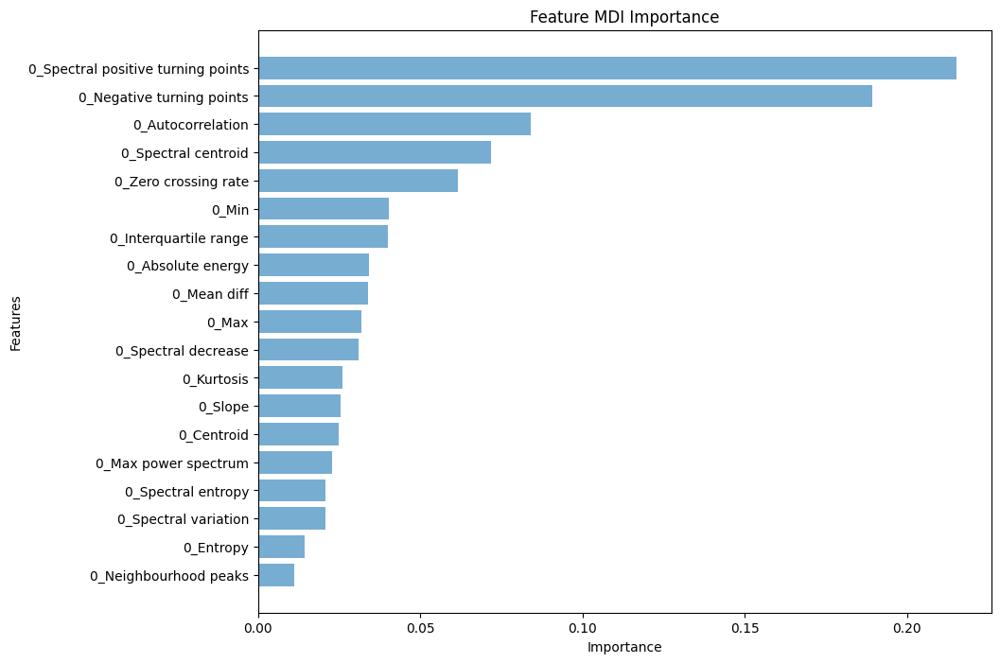

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=19, Auc: 81.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=18, Auc: 59.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=17, Auc: 65.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=16, Auc: 59.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=15, Auc: 53.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=14, Auc: 69.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=13, Auc: 65.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=12, Auc: 70.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=11, Auc: 61.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=10, Auc: 70.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=9, Auc: 68.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=8, Auc: 65.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=7, Auc: 62.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=6, Auc: 65.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=5, Auc: 72.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.072, n=4, Auc: 74.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.084, n=3, Auc: 59.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.189, n=2, Auc: 53.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.215, n=1, Auc: 57.48%
    Threshold  Num Features       AUC
0    0.011182            19  0.815939
1    0.014420            18  0.595604
2    0.020782            17  0.656693
3    0.020819            16  0.598828
4    0.022861            15  0.532113
5    0.024783            14  0.695337
6    0.025535            13  0.656169
7    0.026075            12  0.703282
8    0.030877            11  0.617996
9    0.031800            10  0.700934
10   0.034024             9  0.686442
11   0.034286             8  0.657503
12   0.040096             7  0.623926
13   0.040369             6  0.658648
14   0.061601             5  0.721798
15   0.071771             4  0.746262
16   0.084043             3  0.599512
17   0.189424             2  0.536985
18   0.215250             1  0.574820
Processing patient 13 with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:13:15,997] A new study created in memory with name: no-name-95219500-165c-47b2-a6c7-88b1f223f729


5910
5910
5886
5886


[I 2024-07-18 18:13:16,466] Trial 0 finished with value: 0.5092121205817962 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5092121205817962.
[I 2024-07-18 18:13:16,980] Trial 1 finished with value: 0.5097150936408142 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5097150936408142.
[I 2024-07-18 18:13:17,395] Trial 2 finished with value: 0.4981556691506198 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.9953018523402044, 'alpha': 0.014996630416209062, 'max_depth': 7, 'eta': 0.5862972650351168, 'gamma': 0.19908055287531043, 'subsample': 0.9965947967557767, 'colsample_bytree': 0.7209122732159111, 'grow_policy': 'depthwise', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     41507
         1.0       1.00      1.00      1.00     41507

    accuracy                           1.00     83014
   macro avg       1.00      1.00      1.00     83014
weighted avg       1.00      1.00      1.00     83014

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96      5601
         1.0       0.05      0.03      0.04       309

    accuracy                           0.92      5910
   macro avg       0.50      0.50      0.50      5910
weighted avg       0.90      0.92      0.91   

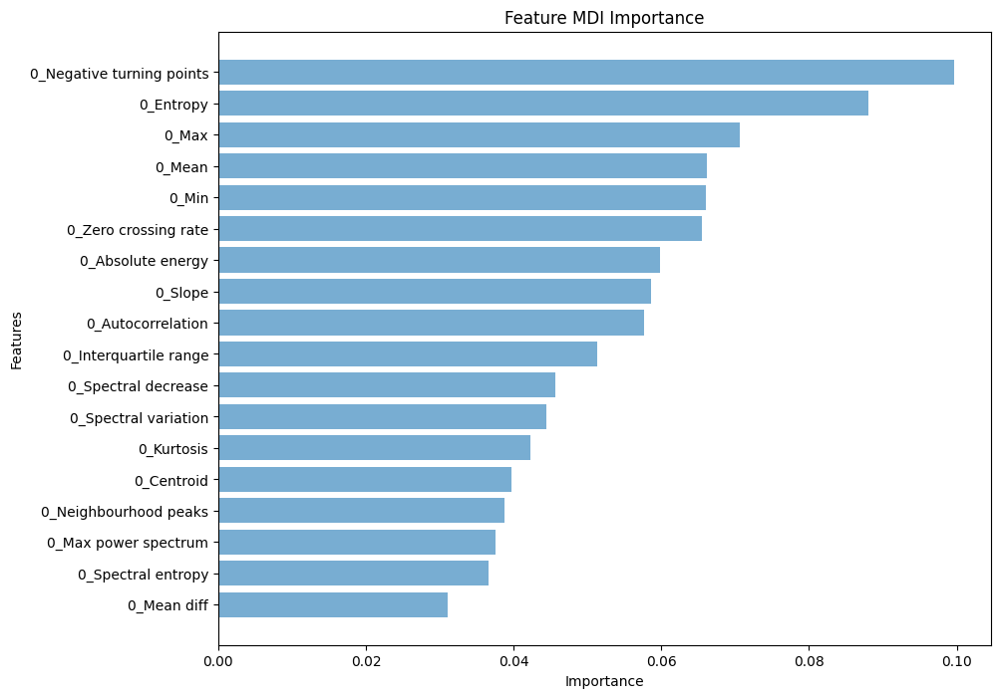

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=18, Auc: 78.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=17, Auc: 62.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=16, Auc: 63.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=15, Auc: 47.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=14, Auc: 65.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=13, Auc: 77.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=12, Auc: 70.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=11, Auc: 75.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=10, Auc: 59.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=9, Auc: 57.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=8, Auc: 54.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=7, Auc: 74.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=6, Auc: 73.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=5, Auc: 68.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=4, Auc: 74.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.071, n=3, Auc: 66.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.088, n=2, Auc: 51.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.100, n=1, Auc: 47.84%
    Threshold  Num Features       AUC
0    0.031106            18  0.783223
1    0.036665            17  0.627582
2    0.037582            16  0.636319
3    0.038793            15  0.479402
4    0.039716            14  0.652448
5    0.042335            13  0.771196
6    0.044491            12  0.708242
7    0.045695            11  0.750855
8    0.051336            10  0.591362
9    0.057732             9  0.579092
10   0.058677             8  0.540464
11   0.059822             7  0.747885
12   0.065469             6  0.734827
13   0.066071             5  0.681218
14   0.066156             4  0.744407
15   0.070582             3  0.667348
16   0.088113             2  0.516656
17   0.099660             1  0.478350
Processing patient 13 with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:13:50,285] A new study created in memory with name: no-name-3243d61a-3d81-4321-8608-39338312a218


5910
5910
5790
5790


[I 2024-07-18 18:13:50,796] Trial 0 finished with value: 0.5101001959312629 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5101001959312629.
[I 2024-07-18 18:13:51,378] Trial 1 finished with value: 0.5504379996868336 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5504379996868336.
[I 2024-07-18 18:13:51,794] Trial 2 finished with value: 0.5797566199748195 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.0882712830621097, 'alpha': 0.029257577949824417, 'max_depth': 3, 'eta': 0.3520481045526039, 'gamma': 0.11964664820356943, 'subsample': 0.831261142176991, 'colsample_bytree': 0.6558555380447055, 'grow_policy': 'lossguide', 'min_child_weight': 2}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.91      0.91     41507
         1.0       0.91      0.90      0.91     41507

    accuracy                           0.91     83014
   macro avg       0.91      0.91      0.91     83014
weighted avg       0.91      0.91      0.91     83014

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.95      0.88      0.92      5601
         1.0       0.10      0.23      0.14       309

    accuracy                           0.85      5910
   macro avg       0.53      0.56      0.53      5910
weighted avg       0.91      0.85      0.88    

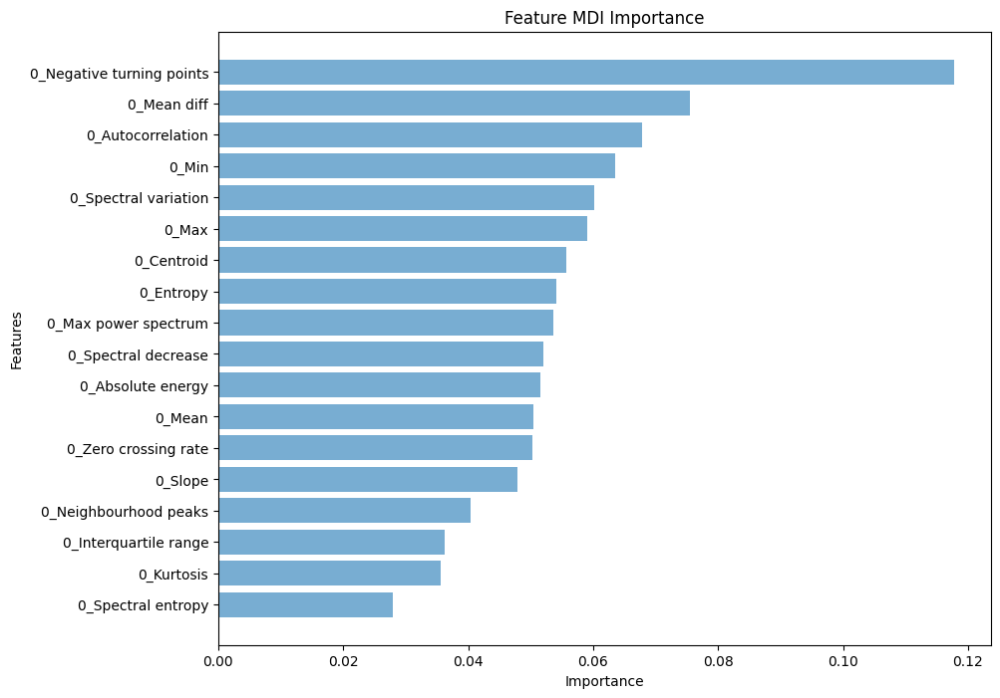

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=18, Auc: 72.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=17, Auc: 69.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=16, Auc: 59.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=15, Auc: 56.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=14, Auc: 61.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=13, Auc: 57.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=12, Auc: 68.06%
Thresh=0.052, n=11, Auc: 51.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=10, Auc: 59.50%
Thresh=0.054, n=9, Auc: 65.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=8, Auc: 68.86%
Thresh=0.056, n=7, Auc: 59.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=6, Auc: 65.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=5, Auc: 65.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=4, Auc: 52.54%
Thresh=0.068, n=3, Auc: 36.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=2, Auc: 19.29%
Thresh=0.118, n=1, Auc: 47.11%
    Threshold  Num Features       AUC
0    0.027886            18  0.727929
1    0.035601            17  0.697602
2    0.036275            16  0.599596
3    0.040419            15  0.562202
4    0.047970            14  0.618046
5    0.050265            13  0.574561
6    0.050457            12  0.680603
7    0.051570            11  0.513051
8    0.052086            10  0.594997
9    0.053648             9  0.652987
10   0.054096             8  0.688555
11   0.055673             7  0.598271
12   0.059068             6  0.656755
13   0.060242             5  0.656490
14   0.063462             4  0.525401
15   0.067920             3  0.361205
16   0.075570             2  0.192877
17   0.117793             1  0.471059
Processing patient 13 with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:14:46,617] A new study created in memory with name: no-name-c7362fbc-01e1-4ad9-82b5-a17803d6e2b4


5941
5941
5917
5917


[I 2024-07-18 18:14:47,079] Trial 0 finished with value: 0.445727865412958 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.445727865412958.
[I 2024-07-18 18:14:47,639] Trial 1 finished with value: 0.5117500997560803 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5117500997560803.
[I 2024-07-18 18:14:48,040] Trial 2 finished with value: 0.540198683541534 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'ga

Best parameters found by Optuna: {'lambda': 1.8746272508056585, 'alpha': 0.0010220253565422993, 'max_depth': 3, 'eta': 1.2035692295240244e-05, 'gamma': 0.1106383138077634, 'subsample': 0.9930766876447531, 'colsample_bytree': 0.9850852625038773, 'grow_policy': 'lossguide', 'min_child_weight': 4}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.58      0.79      0.67     37185
         1.0       0.67      0.42      0.52     37185

    accuracy                           0.61     74370
   macro avg       0.62      0.61      0.59     74370
weighted avg       0.62      0.61      0.59     74370

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.93      0.92      0.93      5488
         1.0       0.18      0.20      0.19       453

    accuracy                           0.87      5941
   macro avg       0.55      0.56      0.56      5941
weighted avg       0.88      0.87      0.8

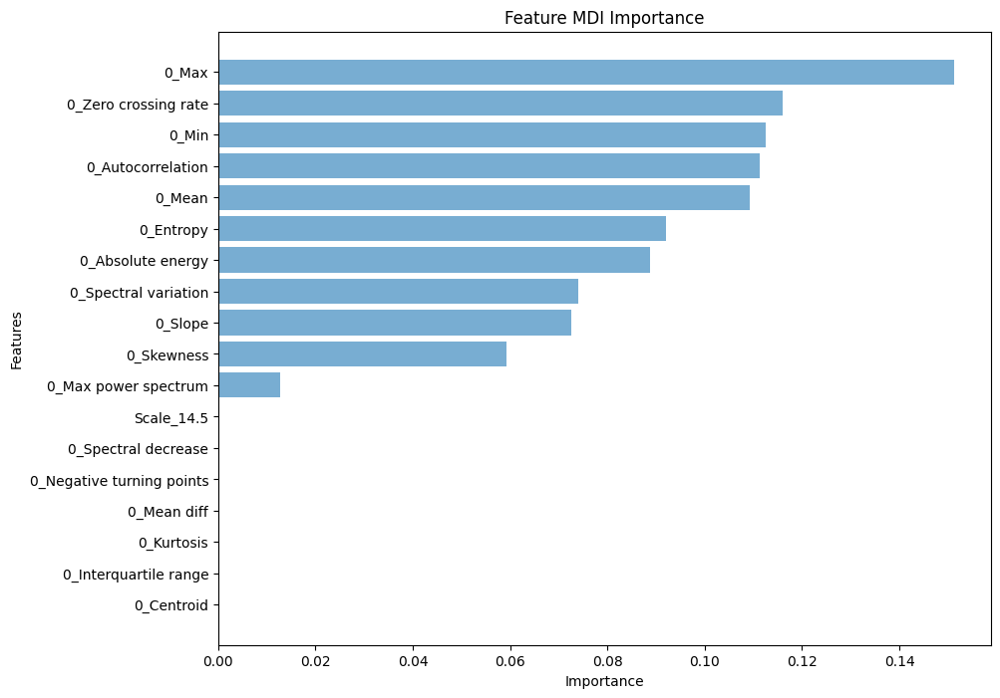

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 70.94%
Thresh=0.000, n=18, Auc: 70.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 70.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 70.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 70.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 70.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 70.94%
Thresh=0.013, n=11, Auc: 69.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=10, Auc: 70.36%
Thresh=0.073, n=9, Auc: 67.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=8, Auc: 71.31%
Thresh=0.089, n=7, Auc: 61.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.092, n=6, Auc: 65.53%
Thresh=0.109, n=5, Auc: 51.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.111, n=4, Auc: 51.93%
Thresh=0.113, n=3, Auc: 54.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.116, n=2, Auc: 55.91%
Thresh=0.151, n=1, Auc: 50.28%
    Threshold  Num Features       AUC
0    0.000000            18  0.709401
1    0.000000            18  0.709401
2    0.000000            18  0.709401
3    0.000000            18  0.709401
4    0.000000            18  0.709401
5    0.000000            18  0.709401
6    0.000000            18  0.709401
7    0.012663            11  0.692074
8    0.059340            10  0.703557
9    0.072595             9  0.676382
10   0.074031             8  0.713069
11   0.088850             7  0.613570
12   0.092077             6  0.655306
13   0.109193             5  0.510848
14   0.111368             4  0.519289
15   0.112518             3  0.541126
16   0.116103             2  0.559069
17   0.151263             1  0.502764
Processing patient 13 with window size 144 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:15:47,495] A new study created in memory with name: no-name-a1a75275-653f-4a8f-a452-6e3811cfb214


5941
5941
5821
5821


[I 2024-07-18 18:15:47,989] Trial 0 finished with value: 0.4907709536037689 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.4907709536037689.
[I 2024-07-18 18:15:48,560] Trial 1 finished with value: 0.502943206610932 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.502943206610932.
[I 2024-07-18 18:15:48,968] Trial 2 finished with value: 0.5082264575650506 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'g

Best parameters found by Optuna: {'lambda': 1.7655897969877827, 'alpha': 2.888853132036092e-05, 'max_depth': 4, 'eta': 0.401870212717962, 'gamma': 0.15228540131182658, 'subsample': 0.9009783123424249, 'colsample_bytree': 0.9760300462997944, 'grow_policy': 'lossguide', 'min_child_weight': 8}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.97      0.98     37185
         1.0       0.97      0.98      0.98     37185

    accuracy                           0.98     74370
   macro avg       0.98      0.98      0.98     74370
weighted avg       0.98      0.98      0.98     74370

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.94      0.86      0.90      5488
         1.0       0.16      0.32      0.21       453

    accuracy                           0.82      5941
   macro avg       0.55      0.59      0.56      5941
weighted avg       0.88      0.82      0.85   

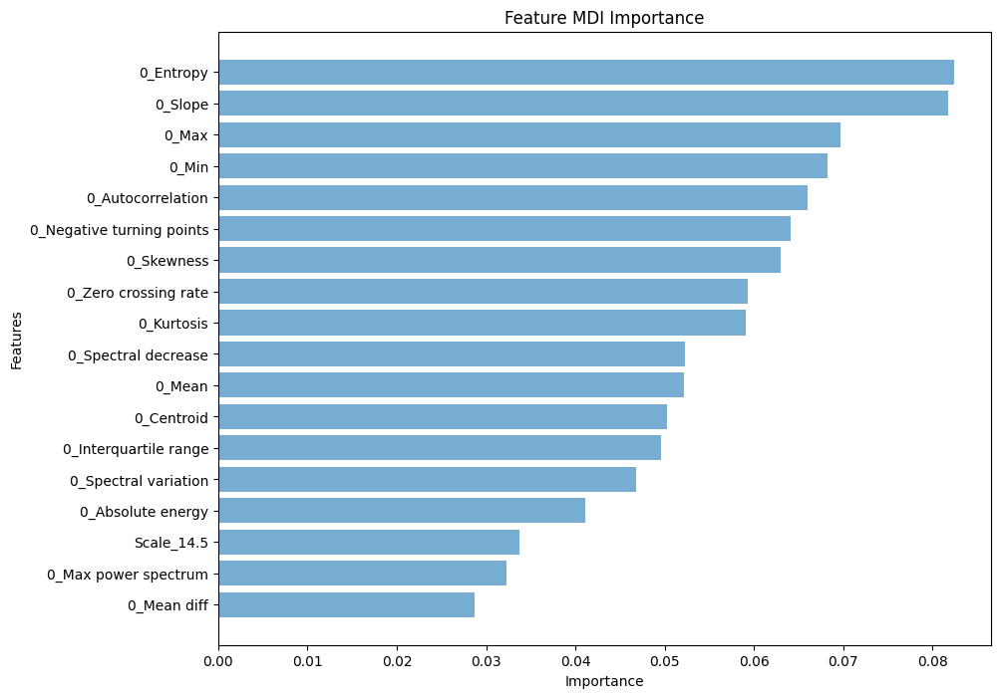

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=18, Auc: 70.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=17, Auc: 55.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=16, Auc: 56.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=15, Auc: 57.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=14, Auc: 61.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=13, Auc: 61.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=12, Auc: 49.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=11, Auc: 55.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=10, Auc: 57.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=9, Auc: 48.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=8, Auc: 47.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=7, Auc: 47.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.064, n=6, Auc: 41.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=5, Auc: 49.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=4, Auc: 49.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=3, Auc: 29.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=2, Auc: 29.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=1, Auc: 53.29%
    Threshold  Num Features       AUC
0    0.028662            18  0.706488
1    0.032242            17  0.557880
2    0.033722            16  0.565736
3    0.041078            15  0.574422
4    0.046767            14  0.615814
5    0.049577            13  0.619000
6    0.050253            12  0.497863
7    0.052162            11  0.553410
8    0.052227            10  0.571328
9    0.059033             9  0.484871
10   0.059263             8  0.475100
11   0.062985             7  0.477788
12   0.064097             6  0.419428
13   0.065938             5  0.491912
14   0.068177             4  0.494898
15   0.069681             3  0.292355
16   0.081734             2  0.295120
17   0.082405             1  0.532890
Processing patient 13 with window size 288 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:16:46,119] A new study created in memory with name: no-name-729f538b-8bba-43d2-bfd6-be9edaa46b7f


5949
5949
5925
5925


[I 2024-07-18 18:16:46,552] Trial 0 finished with value: 0.5216565886211 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5216565886211.
[I 2024-07-18 18:16:47,045] Trial 1 finished with value: 0.5004008151592881 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5216565886211.
[I 2024-07-18 18:16:47,436] Trial 2 finished with value: 0.5524344758573985 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'gamma': 

Best parameters found by Optuna: {'lambda': 1.3493448404889692, 'alpha': 78.30236168662509, 'max_depth': 3, 'eta': 0.00967958114461083, 'gamma': 0.11160531062792636, 'subsample': 0.7076810065441537, 'colsample_bytree': 0.8644220839252978, 'grow_policy': 'depthwise', 'min_child_weight': 9}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.78      0.55      0.64     29826
         1.0       0.65      0.85      0.74     29826

    accuracy                           0.70     59652
   macro avg       0.72      0.70      0.69     59652
weighted avg       0.72      0.70      0.69     59652

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.91      0.81      0.85      5207
         1.0       0.24      0.42      0.30       741

    accuracy                           0.76      5948
   macro avg       0.57      0.61      0.58      5948
weighted avg       0.82      0.76      0.79     

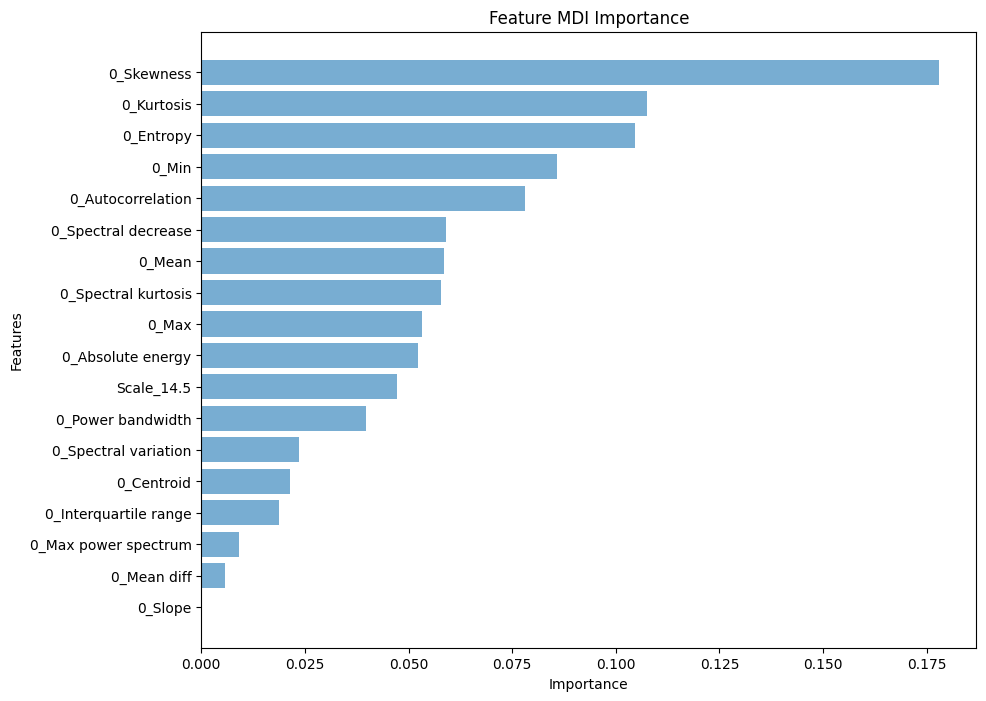

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 65.82%
Thresh=0.006, n=17, Auc: 65.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.009, n=16, Auc: 66.96%
Thresh=0.019, n=15, Auc: 66.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=14, Auc: 63.36%
Thresh=0.024, n=13, Auc: 63.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=12, Auc: 65.41%
Thresh=0.047, n=11, Auc: 64.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=10, Auc: 63.48%
Thresh=0.053, n=9, Auc: 67.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=8, Auc: 69.43%
Thresh=0.058, n=7, Auc: 70.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=6, Auc: 67.98%
Thresh=0.078, n=5, Auc: 66.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.086, n=4, Auc: 61.90%
Thresh=0.105, n=3, Auc: 70.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.108, n=2, Auc: 68.33%
Thresh=0.178, n=1, Auc: 64.44%
    Threshold  Num Features       AUC
0    0.000000            18  0.658171
1    0.005800            17  0.654149
2    0.009000            16  0.669631
3    0.018764            15  0.660325
4    0.021340            14  0.633596
5    0.023526            13  0.637418
6    0.039702            12  0.654115
7    0.047245            11  0.645277
8    0.052234            10  0.634782
9    0.053144             9  0.674913
10   0.057917             8  0.694252
11   0.058434             7  0.705755
12   0.058924             6  0.679824
13   0.078053             5  0.667981
14   0.085780             4  0.619012
15   0.104582             3  0.705936
16   0.107506             2  0.683303
17   0.178050             1  0.644375
Processing patient 13 with window size 288 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:17:24,415] A new study created in memory with name: no-name-74eb2be2-6aa8-43f5-99f1-8455556763bd


5949
5949
5829
5829


[I 2024-07-18 18:17:24,850] Trial 0 finished with value: 0.5860008340272761 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5860008340272761.
[I 2024-07-18 18:17:25,333] Trial 1 finished with value: 0.5817254723282035 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5860008340272761.
[I 2024-07-18 18:17:25,717] Trial 2 finished with value: 0.579929773762974 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, '

Best parameters found by Optuna: {'lambda': 1.530201721055592, 'alpha': 4.714632193667973e-05, 'max_depth': 4, 'eta': 0.00032287772149535815, 'gamma': 0.10594218751008688, 'subsample': 0.9111789320788957, 'colsample_bytree': 0.9852846214090719, 'grow_policy': 'lossguide', 'min_child_weight': 4}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.77      0.53      0.63     29826
         1.0       0.64      0.85      0.73     29826

    accuracy                           0.69     59652
   macro avg       0.71      0.69      0.68     59652
weighted avg       0.71      0.69      0.68     59652

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.93      0.80      0.86      5207
         1.0       0.28      0.56      0.37       741

    accuracy                           0.77      5948
   macro avg       0.60      0.68      0.61      5948
weighted avg       0.85      0.77      0.8

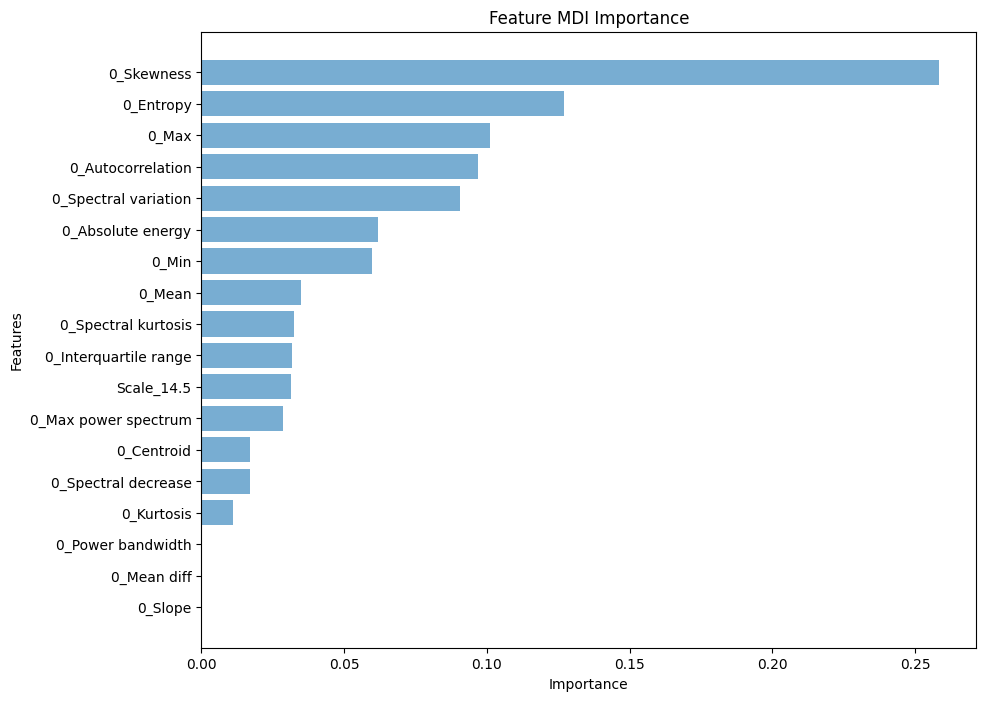

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 65.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 65.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=16, Auc: 65.06%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=15, Auc: 64.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=14, Auc: 62.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=13, Auc: 63.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=12, Auc: 61.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=11, Auc: 63.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=10, Auc: 61.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=9, Auc: 57.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=8, Auc: 57.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=7, Auc: 60.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=6, Auc: 62.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.091, n=5, Auc: 71.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.097, n=4, Auc: 69.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.101, n=3, Auc: 59.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.127, n=2, Auc: 61.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.258, n=1, Auc: 59.50%
    Threshold  Num Features       AUC
0    0.000000            18  0.658482
1    0.000000            18  0.658482
2    0.000239            16  0.650625
3    0.011228            15  0.643865
4    0.017082            14  0.623712
5    0.017097            13  0.637189
6    0.028535            12  0.614315
7    0.031385            11  0.637410
8    0.031600            10  0.617248
9    0.032576             9  0.572017
10   0.034761             8  0.574142
11   0.059747             7  0.600536
12   0.061862             6  0.624819
13   0.090678             5  0.712358
14   0.096761             4  0.692870
15   0.100965             3  0.596715
16   0.127028             2  0.611309
17   0.258455             1  0.594956
Processing patient 19 with window size 24 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:18:41,906] A new study created in memory with name: no-name-c7a6ac8b-adb0-4c77-8c28-7cc6500f5e66


16909
16909
16885
16885


[I 2024-07-18 18:18:42,586] Trial 0 finished with value: 0.5267279575110575 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5267279575110575.
[I 2024-07-18 18:18:43,365] Trial 1 finished with value: 0.5335707437469429 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5335707437469429.
[I 2024-07-18 18:18:43,991] Trial 2 finished with value: 0.5679747623665922 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.8432835226087583, 'alpha': 0.0003006765220466308, 'max_depth': 3, 'eta': 0.7367054173606724, 'gamma': 0.11115344198581606, 'subsample': 0.6551570059849342, 'colsample_bytree': 0.8511080701632443, 'grow_policy': 'lossguide', 'min_child_weight': 6}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99    134310
         1.0       0.98      0.99      0.99    134310

    accuracy                           0.99    268620
   macro avg       0.99      0.99      0.99    268620
weighted avg       0.99      0.99      0.99    268620

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.98     16659
         1.0       0.01      0.02      0.02       249

    accuracy                           0.96     16908
   macro avg       0.50      0.50      0.50     16908
weighted avg       0.97      0.96      0.97  

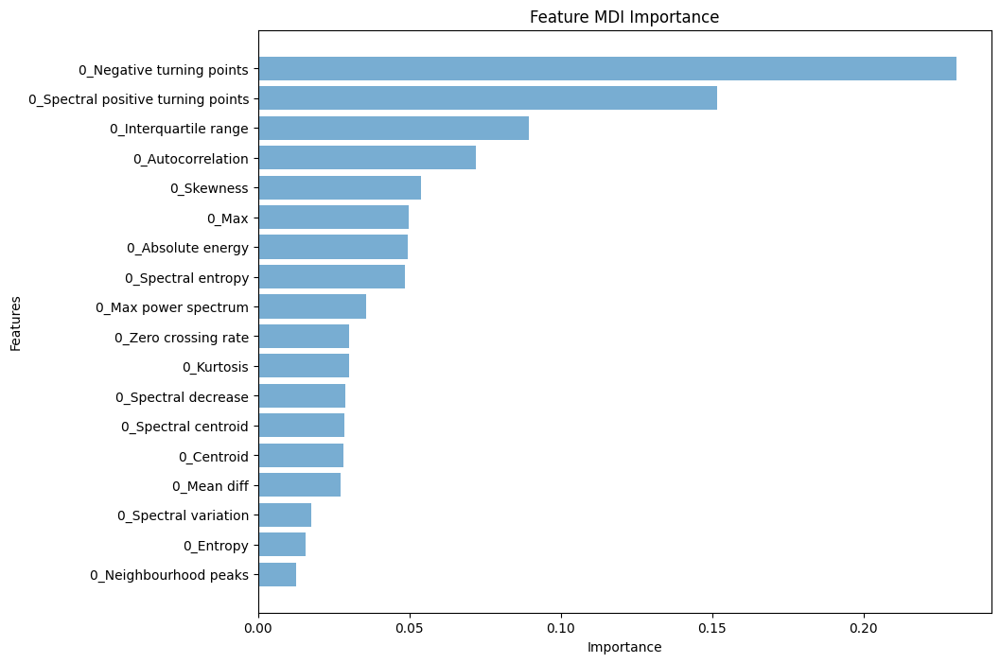

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=18, Auc: 60.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=17, Auc: 58.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=16, Auc: 57.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=15, Auc: 57.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=14, Auc: 53.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=13, Auc: 54.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=12, Auc: 50.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=11, Auc: 54.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=10, Auc: 51.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=9, Auc: 49.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=8, Auc: 53.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=7, Auc: 51.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=6, Auc: 54.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=5, Auc: 54.92%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.072, n=4, Auc: 53.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.089, n=3, Auc: 49.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.152, n=2, Auc: 56.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.231, n=1, Auc: 55.90%
    Threshold  Num Features       AUC
0    0.012705            18  0.603413
1    0.015700            17  0.585540
2    0.017595            16  0.576655
3    0.027165            15  0.572460
4    0.028161            14  0.531221
5    0.028632            13  0.540021
6    0.028720            12  0.509517
7    0.030085            11  0.544466
8    0.030129            10  0.513391
9    0.035827             9  0.499568
10   0.048622             8  0.535917
11   0.049347             7  0.512096
12   0.049764             6  0.546171
13   0.053962             5  0.549183
14   0.071803             4  0.533612
15   0.089484             3  0.493303
16   0.151623             2  0.567796
17   0.230677             1  0.558972
Processing patient 19 with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:20:03,128] A new study created in memory with name: no-name-47e04fe7-6939-4e6c-9f96-ff2c0a0c8b2d


16909
16909
16789
16789


[I 2024-07-18 18:20:03,802] Trial 0 finished with value: 0.5527960934318943 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5527960934318943.
[I 2024-07-18 18:20:04,538] Trial 1 finished with value: 0.5532503987979049 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5532503987979049.
[I 2024-07-18 18:20:05,143] Trial 2 finished with value: 0.5711330826638086 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.7466474119605133, 'alpha': 2.6067914246130478e-05, 'max_depth': 7, 'eta': 0.23913060118058196, 'gamma': 0.1716905866390041, 'subsample': 0.9955609712057941, 'colsample_bytree': 0.934712186392615, 'grow_policy': 'lossguide', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    134310
         1.0       1.00      1.00      1.00    134310

    accuracy                           1.00    268620
   macro avg       1.00      1.00      1.00    268620
weighted avg       1.00      1.00      1.00    268620

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99     16659
         1.0       0.04      0.02      0.03       249

    accuracy                           0.98     16908
   macro avg       0.51      0.51      0.51     16908
weighted avg       0.97      0.98      0.98  

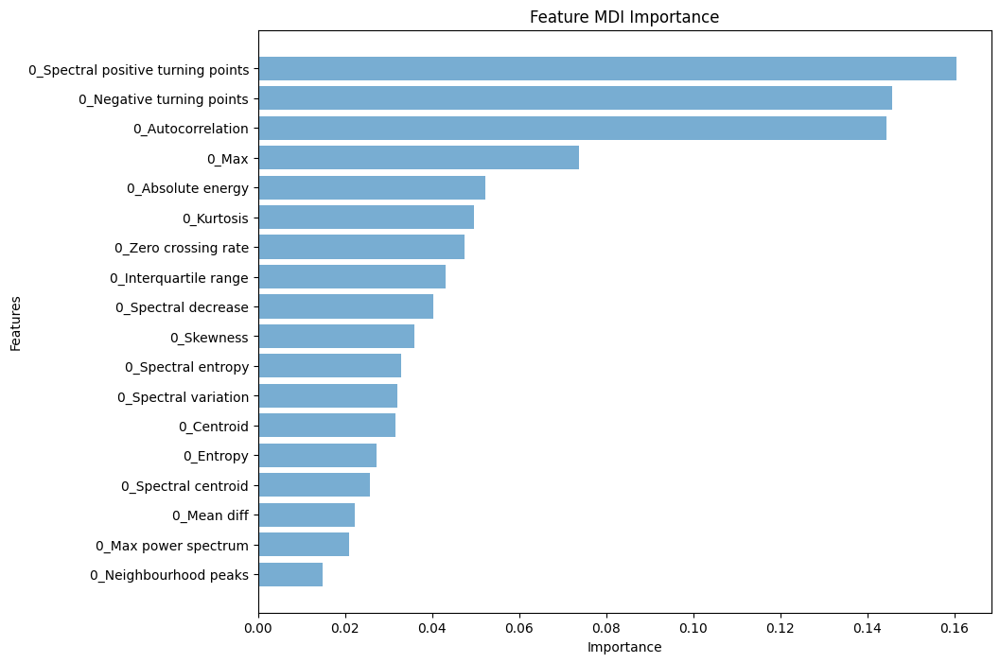

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=18, Auc: 62.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=17, Auc: 59.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=16, Auc: 60.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=15, Auc: 61.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=14, Auc: 59.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=13, Auc: 61.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=12, Auc: 62.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=11, Auc: 63.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=10, Auc: 62.40%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=9, Auc: 61.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=8, Auc: 61.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=7, Auc: 57.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=6, Auc: 56.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=5, Auc: 55.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=4, Auc: 62.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.144, n=3, Auc: 51.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.146, n=2, Auc: 50.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.160, n=1, Auc: 51.49%
    Threshold  Num Features       AUC
0    0.014800            18  0.625179
1    0.020894            17  0.595623
2    0.022246            16  0.604764
3    0.025613            15  0.619672
4    0.027154            14  0.593496
5    0.031504            13  0.617160
6    0.031917            12  0.629873
7    0.032770            11  0.631358
8    0.035933            10  0.623976
9    0.040356             9  0.617534
10   0.043185             8  0.616495
11   0.047503             7  0.576948
12   0.049540             6  0.568032
13   0.052267             5  0.556780
14   0.073727             4  0.625625
15   0.144431             3  0.516980
16   0.145742             2  0.507253
17   0.160419             1  0.514859
Processing patient 19 with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:21:52,682] A new study created in memory with name: no-name-91074b68-8143-484b-ae50-b4d55e9b7e41


17546
17546
17522
17522


[I 2024-07-18 18:21:53,519] Trial 0 finished with value: 0.5881528198929799 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5881528198929799.
[I 2024-07-18 18:21:54,346] Trial 1 finished with value: 0.5878851522108499 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5881528198929799.
[I 2024-07-18 18:21:54,978] Trial 2 finished with value: 0.5677783611748835 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.3090198926915693, 'alpha': 0.06588131628851508, 'max_depth': 10, 'eta': 0.5233882489454811, 'gamma': 0.10689737676743047, 'subsample': 0.8307345340670443, 'colsample_bytree': 0.7279254220528559, 'grow_policy': 'lossguide', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    138371
         1.0       1.00      1.00      1.00    138371

    accuracy                           1.00    276742
   macro avg       1.00      1.00      1.00    276742
weighted avg       1.00      1.00      1.00    276742

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     16942
         1.0       0.08      0.01      0.01       603

    accuracy                           0.96     17545
   macro avg       0.52      0.50      0.50     17545
weighted avg       0.94      0.96      0.95   

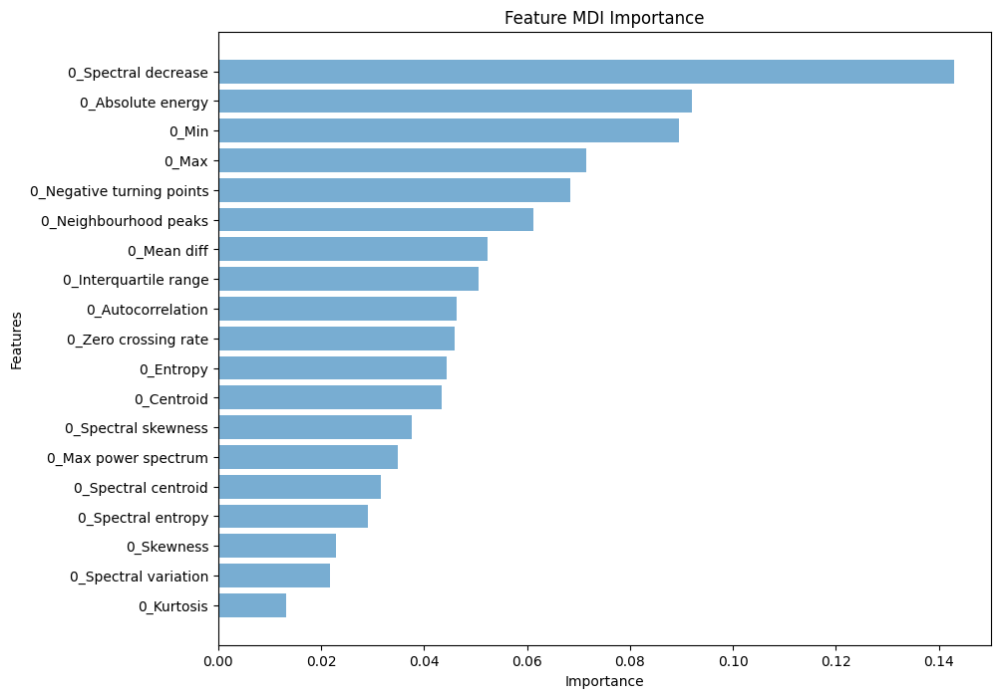

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=19, Auc: 70.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=18, Auc: 67.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=17, Auc: 65.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=16, Auc: 65.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=15, Auc: 65.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=14, Auc: 62.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=13, Auc: 61.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=12, Auc: 64.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=11, Auc: 63.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=10, Auc: 68.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=9, Auc: 63.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=8, Auc: 64.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=7, Auc: 64.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=6, Auc: 62.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=5, Auc: 64.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.072, n=4, Auc: 63.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.090, n=3, Auc: 58.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.092, n=2, Auc: 51.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.143, n=1, Auc: 53.44%
    Threshold  Num Features       AUC
0    0.013276            19  0.700241
1    0.021627            18  0.670422
2    0.022922            17  0.655591
3    0.029100            16  0.654421
4    0.031569            15  0.654106
5    0.034937            14  0.620433
6    0.037546            13  0.613033
7    0.043506            12  0.647285
8    0.044292            11  0.635632
9    0.045989            10  0.686079
10   0.046300             9  0.633142
11   0.050627             8  0.647595
12   0.052420             7  0.641469
13   0.061305             6  0.629689
14   0.068362             5  0.647982
15   0.071601             4  0.636818
16   0.089545             3  0.586062
17   0.092077             2  0.513731
18   0.142998             1  0.534373
Processing patient 19 with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:25:31,060] A new study created in memory with name: no-name-8bfcc7a5-a91d-4186-b28e-38c5ef90fc13


17546
17546
17426
17426


[I 2024-07-18 18:25:31,789] Trial 0 finished with value: 0.5410575501667674 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5410575501667674.
[I 2024-07-18 18:25:32,590] Trial 1 finished with value: 0.5472690163474525 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5472690163474525.
[I 2024-07-18 18:25:33,372] Trial 2 finished with value: 0.5406952762258044 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.4131931052214388, 'alpha': 0.42885908669337564, 'max_depth': 4, 'eta': 0.5674038375835697, 'gamma': 0.1831837415517765, 'subsample': 0.6446944674895204, 'colsample_bytree': 0.7868435380545838, 'grow_policy': 'depthwise', 'min_child_weight': 3}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00    138371
         1.0       0.99      1.00      1.00    138371

    accuracy                           1.00    276742
   macro avg       1.00      1.00      1.00    276742
weighted avg       1.00      1.00      1.00    276742

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97     16942
         1.0       0.07      0.04      0.05       603

    accuracy                           0.95     17545
   macro avg       0.52      0.51      0.51     17545
weighted avg       0.94      0.95      0.94     

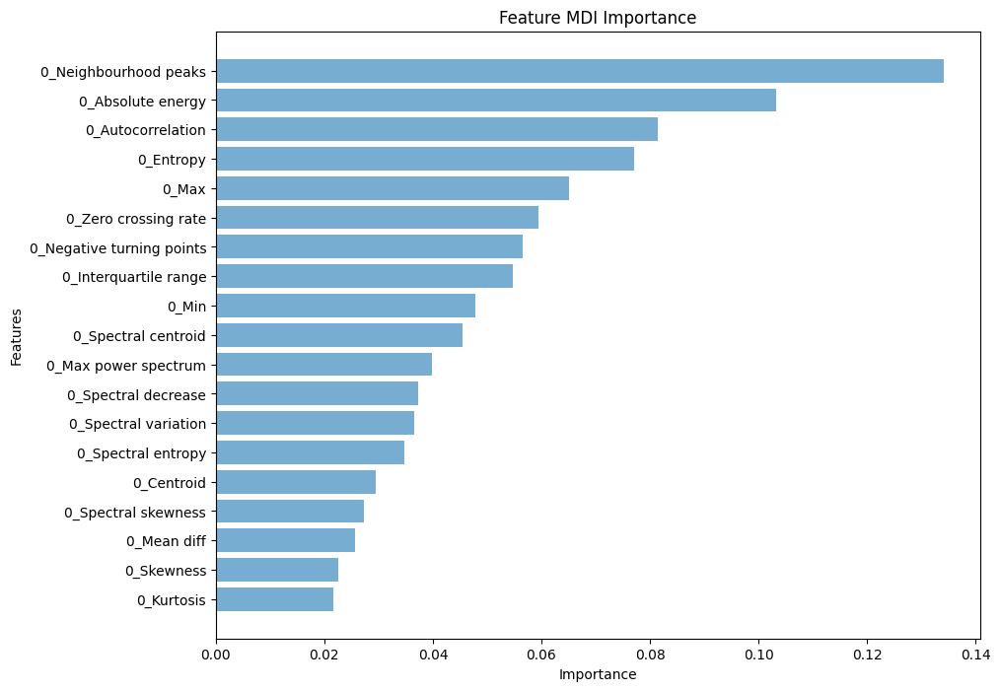

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=19, Auc: 59.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=18, Auc: 60.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=17, Auc: 57.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=16, Auc: 54.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=15, Auc: 56.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=14, Auc: 55.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=13, Auc: 56.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=12, Auc: 56.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=11, Auc: 53.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=10, Auc: 59.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=9, Auc: 57.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=8, Auc: 57.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=7, Auc: 58.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=6, Auc: 53.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=5, Auc: 48.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=4, Auc: 42.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.081, n=3, Auc: 41.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.103, n=2, Auc: 50.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.134, n=1, Auc: 53.46%
    Threshold  Num Features       AUC
0    0.021630            19  0.597532
1    0.022599            18  0.600993
2    0.025575            17  0.574162
3    0.027374            16  0.542004
4    0.029395            15  0.565613
5    0.034727            14  0.557733
6    0.036520            13  0.565696
7    0.037208            12  0.567915
8    0.039829            11  0.536165
9    0.045440            10  0.590904
10   0.047820             9  0.571607
11   0.054811             8  0.572896
12   0.056601             7  0.585382
13   0.059456             6  0.539345
14   0.065020             5  0.482421
15   0.077041             4  0.422144
16   0.081473             3  0.410178
17   0.103316             2  0.509413
18   0.134165             1  0.534597
Processing patient 19 with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:26:40,866] A new study created in memory with name: no-name-67bc105d-7a4b-4237-b658-e7b723667cf2


18263
18263
18239
18239


[I 2024-07-18 18:26:41,611] Trial 0 finished with value: 0.41351849160603704 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.41351849160603704.
[I 2024-07-18 18:26:42,400] Trial 1 finished with value: 0.41672745986133447 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.41672745986133447.
[I 2024-07-18 18:26:43,032] Trial 2 finished with value: 0.3981560468113902 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.00067890532716984

Best parameters found by Optuna: {'lambda': 1.59017046835376, 'alpha': 9.915166731845615e-05, 'max_depth': 9, 'eta': 0.9615140233848414, 'gamma': 0.1529144538136631, 'subsample': 0.7307213358429617, 'colsample_bytree': 0.852975780429655, 'grow_policy': 'lossguide', 'min_child_weight': 2}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    142831
         1.0       1.00      1.00      1.00    142831

    accuracy                           1.00    285662
   macro avg       1.00      1.00      1.00    285662
weighted avg       1.00      1.00      1.00    285662

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.95      0.99      0.97     17299
         1.0       0.00      0.00      0.00       963

    accuracy                           0.94     18262
   macro avg       0.47      0.50      0.49     18262
weighted avg       0.90      0.94      0.92     1

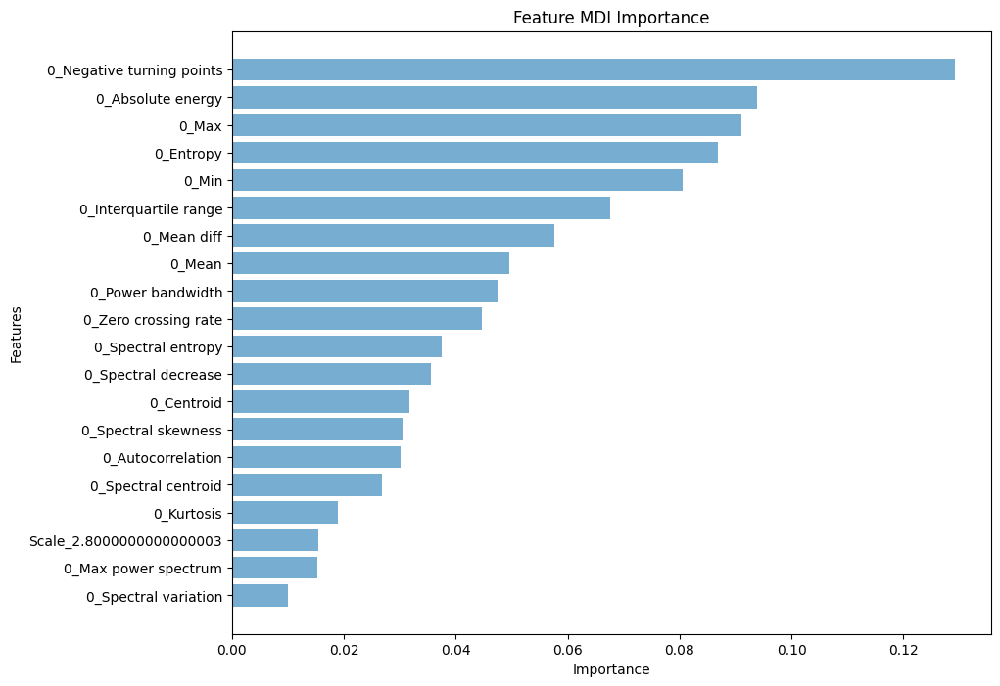

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=20, Auc: 59.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=19, Auc: 45.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=18, Auc: 48.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=17, Auc: 51.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=16, Auc: 50.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=15, Auc: 53.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=14, Auc: 51.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=13, Auc: 49.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=12, Auc: 49.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=11, Auc: 52.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=10, Auc: 46.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=9, Auc: 47.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=8, Auc: 49.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=7, Auc: 53.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=6, Auc: 51.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.081, n=5, Auc: 44.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=4, Auc: 50.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.091, n=3, Auc: 54.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.094, n=2, Auc: 41.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.129, n=1, Auc: 49.28%
    Threshold  Num Features       AUC
0    0.009977            20  0.590457
1    0.015196            19  0.451783
2    0.015494            18  0.485879
3    0.018876            17  0.516297
4    0.026756            16  0.508265
5    0.030124            15  0.530925
6    0.030522            14  0.515073
7    0.031703            13  0.490151
8    0.035626            12  0.498930
9    0.037486            11  0.527359
10   0.044581            10  0.464771
11   0.047414             9  0.471453
12   0.049495             8  0.496182
13   0.057578             7  0.539047
14   0.067552             6  0.512727
15   0.080577             5  0.447500
16   0.086915             4  0.504676
17   0.091010             3  0.542239
18   0.093876             2  0.416859
19   0.129241             1  0.492802
Processing patient 19 with window size 144 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:29:42,116] A new study created in memory with name: no-name-66a84f60-6c8a-4c55-8d54-13e530c1eefe


18263
18263
18143
18143


[I 2024-07-18 18:29:42,976] Trial 0 finished with value: 0.4291383357773668 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.4291383357773668.
[I 2024-07-18 18:29:43,767] Trial 1 finished with value: 0.4310834778953783 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.4310834778953783.
[I 2024-07-18 18:29:44,423] Trial 2 finished with value: 0.4228832547959092 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.1474699723649893, 'alpha': 27.861178823646046, 'max_depth': 10, 'eta': 0.7674696732279849, 'gamma': 0.1119287148408336, 'subsample': 0.9195473818442119, 'colsample_bytree': 0.6933059946147865, 'grow_policy': 'depthwise', 'min_child_weight': 2}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    142831
         1.0       1.00      1.00      1.00    142831

    accuracy                           1.00    285662
   macro avg       1.00      1.00      1.00    285662
weighted avg       1.00      1.00      1.00    285662

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.95      0.99      0.97     17299
         1.0       0.04      0.01      0.01       963

    accuracy                           0.94     18262
   macro avg       0.49      0.50      0.49     18262
weighted avg       0.90      0.94      0.92     

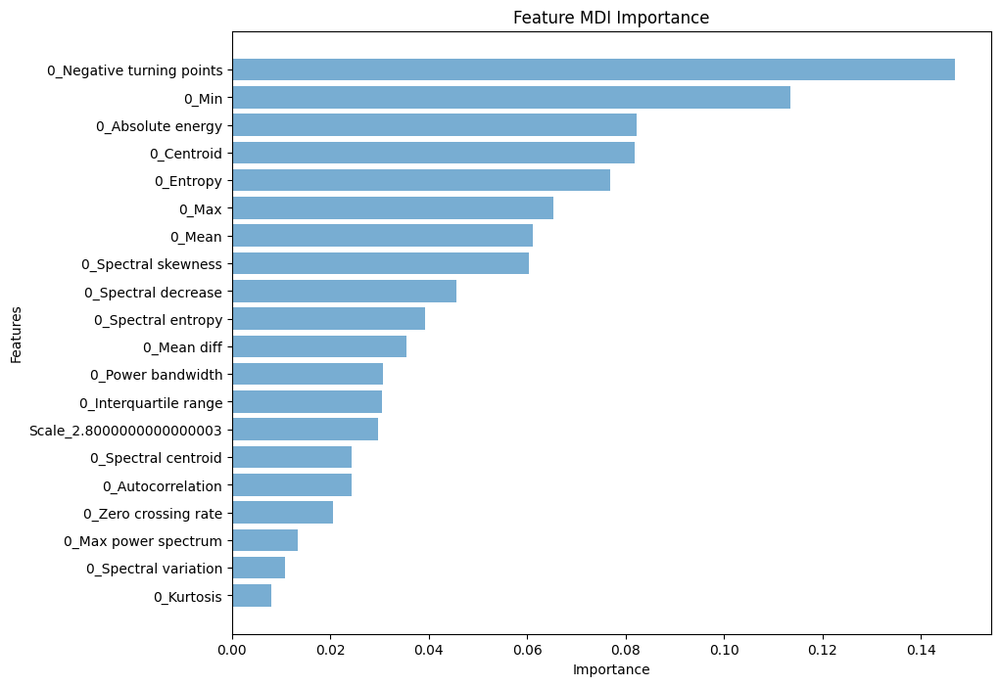

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.008, n=20, Auc: 60.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=19, Auc: 55.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=18, Auc: 53.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=17, Auc: 51.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=16, Auc: 53.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=15, Auc: 57.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=14, Auc: 49.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=13, Auc: 54.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=12, Auc: 53.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=11, Auc: 52.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=10, Auc: 58.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=9, Auc: 50.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=8, Auc: 54.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=7, Auc: 50.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=6, Auc: 47.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=5, Auc: 50.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=4, Auc: 44.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=3, Auc: 43.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.113, n=2, Auc: 36.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.147, n=1, Auc: 48.46%
    Threshold  Num Features       AUC
0    0.007932            20  0.607001
1    0.010682            19  0.558935
2    0.013391            18  0.532119
3    0.020452            17  0.518159
4    0.024272            16  0.537399
5    0.024350            15  0.573304
6    0.029754            14  0.497858
7    0.030453            13  0.545267
8    0.030599            12  0.533470
9    0.035487            11  0.528575
10   0.039149            10  0.589782
11   0.045661             9  0.508156
12   0.060307             8  0.541592
13   0.061054             7  0.505437
14   0.065314             6  0.473875
15   0.076812             5  0.507914
16   0.081803             4  0.440187
17   0.082175             3  0.439334
18   0.113487             2  0.369109
19   0.146867             1  0.484584
Processing patient 19 with window size 288 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:31:09,452] A new study created in memory with name: no-name-90d12e4f-1262-4a55-ba86-68f82f1255ee


18669
18669
18645
18645


[I 2024-07-18 18:31:10,231] Trial 0 finished with value: 0.41871393636445847 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.41871393636445847.
[I 2024-07-18 18:31:11,042] Trial 1 finished with value: 0.4179043023352016 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.41871393636445847.
[I 2024-07-18 18:31:11,722] Trial 2 finished with value: 0.47847184725399067 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.00067890532716984

Best parameters found by Optuna: {'lambda': 1.9124399469542315, 'alpha': 0.0020348956880930046, 'max_depth': 3, 'eta': 5.74948455046948e-05, 'gamma': 0.18406101937993688, 'subsample': 0.8002905145305614, 'colsample_bytree': 0.8795329734671377, 'grow_policy': 'lossguide', 'min_child_weight': 8}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.83      0.70      0.76    143890
         1.0       0.74      0.86      0.79    143890

    accuracy                           0.78    287780
   macro avg       0.78      0.78      0.77    287780
weighted avg       0.78      0.78      0.77    287780

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.91      0.50      0.64     16985
         1.0       0.09      0.51      0.16      1683

    accuracy                           0.50     18668
   macro avg       0.50      0.50      0.40     18668
weighted avg       0.84      0.50      0.60

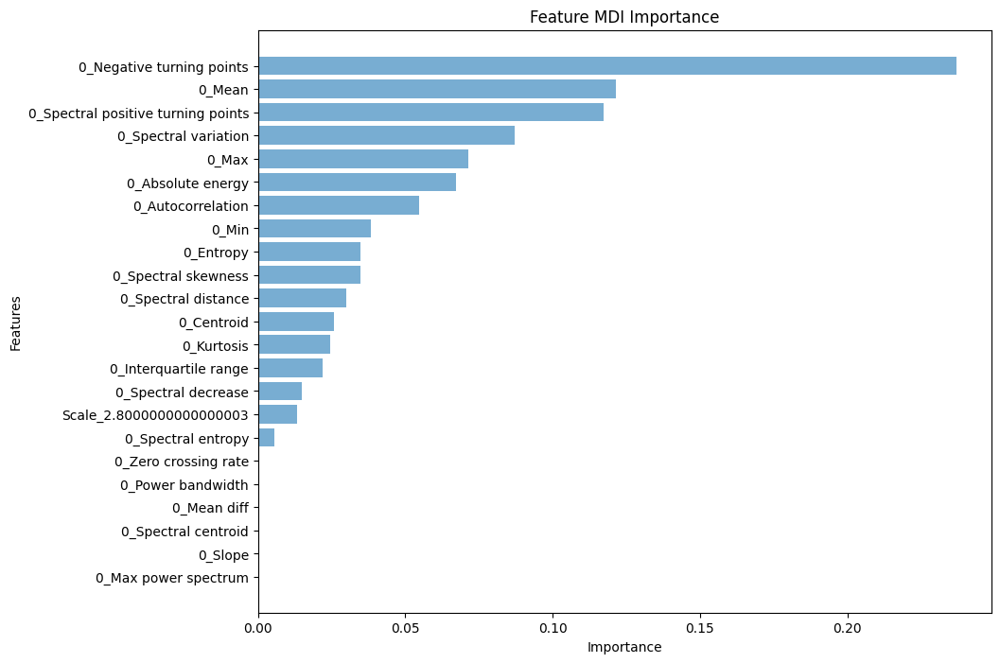

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=23, Auc: 54.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=23, Auc: 54.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=23, Auc: 54.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=23, Auc: 54.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=23, Auc: 54.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=23, Auc: 54.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.006, n=17, Auc: 54.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=16, Auc: 55.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=15, Auc: 55.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=14, Auc: 54.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=13, Auc: 54.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=12, Auc: 51.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=11, Auc: 50.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=10, Auc: 52.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=9, Auc: 51.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=8, Auc: 52.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=7, Auc: 50.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.067, n=6, Auc: 49.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.071, n=5, Auc: 48.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=4, Auc: 51.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.117, n=3, Auc: 45.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.122, n=2, Auc: 38.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.237, n=1, Auc: 42.18%
    Threshold  Num Features       AUC
0    0.000000            23  0.546197
1    0.000000            23  0.546197
2    0.000000            23  0.546197
3    0.000000            23  0.546197
4    0.000000            23  0.546197
5    0.000000            23  0.546197
6    0.005528            17  0.542649
7    0.013344            16  0.558654
8    0.014972            15  0.554806
9    0.022023            14  0.543220
10   0.024347            13  0.543909
11   0.025876            12  0.510883
12   0.030030            11  0.504414
13   0.034610            10  0.523444
14   0.034809             9  0.517985
15   0.038270             8  0.525055
16   0.054604             7  0.504477
17   0.067309             6  0.490038
18   0.071368             5  0.489455
19   0.087081             4  0.513799
20   0.117223             3  0.457555
21   0.121592             2  0.389572
22   0.237013             1  0.421846
Processing patient 19 with window size 288 with forecasti

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:32:13,530] A new study created in memory with name: no-name-86155c5e-5de3-476a-a32c-44d1bd646b3c


18669
18669
18549
18549


[I 2024-07-18 18:32:14,288] Trial 0 finished with value: 0.4241538661476669 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.4241538661476669.
[I 2024-07-18 18:32:15,073] Trial 1 finished with value: 0.45542888407180426 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.45542888407180426.
[I 2024-07-18 18:32:15,758] Trial 2 finished with value: 0.4279542555374171 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484

Best parameters found by Optuna: {'lambda': 1.029856852213946, 'alpha': 0.00011597496541036273, 'max_depth': 9, 'eta': 0.030748798184137477, 'gamma': 0.1386313534715487, 'subsample': 0.7380374953993994, 'colsample_bytree': 0.5123064066694569, 'grow_policy': 'depthwise', 'min_child_weight': 9}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99    143890
         1.0       0.99      1.00      0.99    143890

    accuracy                           0.99    287780
   macro avg       0.99      0.99      0.99    287780
weighted avg       0.99      0.99      0.99    287780

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.91      0.96      0.93     16985
         1.0       0.00      0.00      0.00      1683

    accuracy                           0.88     18668
   macro avg       0.45      0.48      0.47     18668
weighted avg       0.83      0.88      0.85 

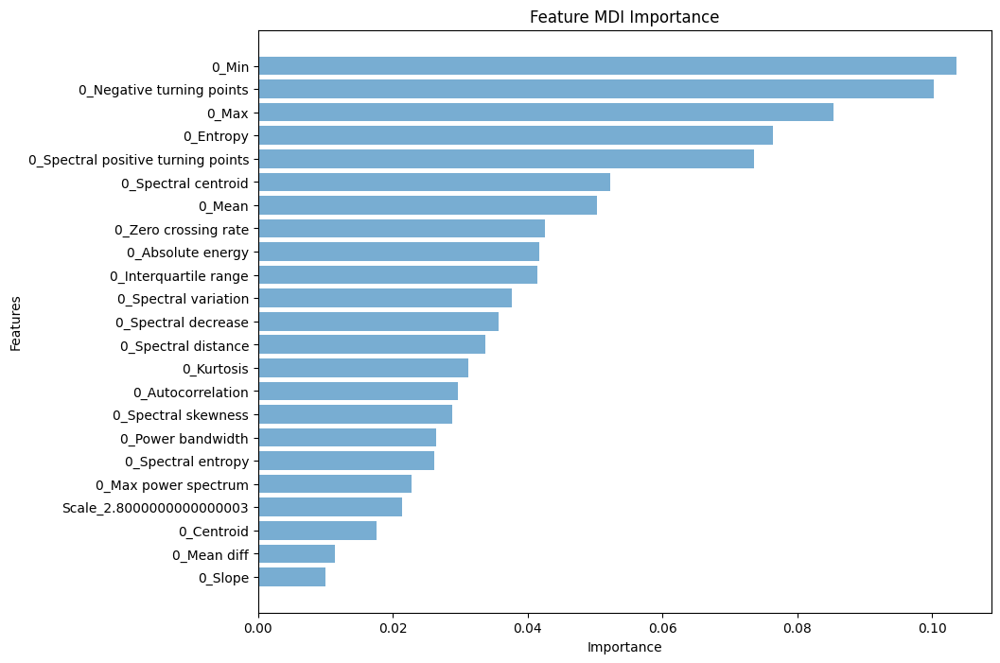

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=23, Auc: 49.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=22, Auc: 45.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=21, Auc: 47.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=20, Auc: 43.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=19, Auc: 48.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=18, Auc: 42.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=17, Auc: 48.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=16, Auc: 49.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=15, Auc: 47.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=14, Auc: 42.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=13, Auc: 44.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=12, Auc: 46.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=11, Auc: 43.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=10, Auc: 45.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=9, Auc: 47.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=8, Auc: 46.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=7, Auc: 50.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=6, Auc: 50.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=5, Auc: 57.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=4, Auc: 55.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.085, n=3, Auc: 59.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.100, n=2, Auc: 48.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.104, n=1, Auc: 44.79%
    Threshold  Num Features       AUC
0    0.010062            23  0.493364
1    0.011463            22  0.458654
2    0.017607            21  0.473697
3    0.021355            20  0.433523
4    0.022766            19  0.486835
5    0.026170            18  0.424774
6    0.026404            17  0.482178
7    0.028755            16  0.498154
8    0.029610            15  0.476892
9    0.031218            14  0.426396
10   0.033756            13  0.445892
11   0.035617            12  0.461020
12   0.037703            11  0.432084
13   0.041492            10  0.454378
14   0.041701             9  0.472195
15   0.042599             8  0.462346
16   0.050236             7  0.507244
17   0.052312             6  0.504975
18   0.073641             5  0.578353
19   0.076407             4  0.551494
20   0.085337             3  0.592569
21   0.100197             2  0.481206
22   0.103592             1  0.447944
Processing patient 23 with window size 24 with forecastin

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:34:05,289] A new study created in memory with name: no-name-73639a7a-2266-436f-bf3f-2c7ea7e90010


19238
19238
19214
19214


[I 2024-07-18 18:34:06,130] Trial 0 finished with value: 0.5412198829402729 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5412198829402729.
[I 2024-07-18 18:34:07,030] Trial 1 finished with value: 0.5416403116067456 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5416403116067456.
[I 2024-07-18 18:34:07,698] Trial 2 finished with value: 0.49685572181443033 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484,

Best parameters found by Optuna: {'lambda': 1.5236640619267394, 'alpha': 0.00015619562520792737, 'max_depth': 3, 'eta': 0.5551721685244719, 'gamma': 0.19529188922065532, 'subsample': 0.9041986740582306, 'colsample_bytree': 0.6523068845866853, 'grow_policy': 'lossguide', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.94    146931
         1.0       1.00      0.88      0.94    146931

    accuracy                           0.94    293862
   macro avg       0.95      0.94      0.94    293862
weighted avg       0.95      0.94      0.94    293862

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98     18769
         1.0       0.01      0.00      0.00       468

    accuracy                           0.97     19237
   macro avg       0.49      0.50      0.49     19237
weighted avg       0.95      0.97      0.96 

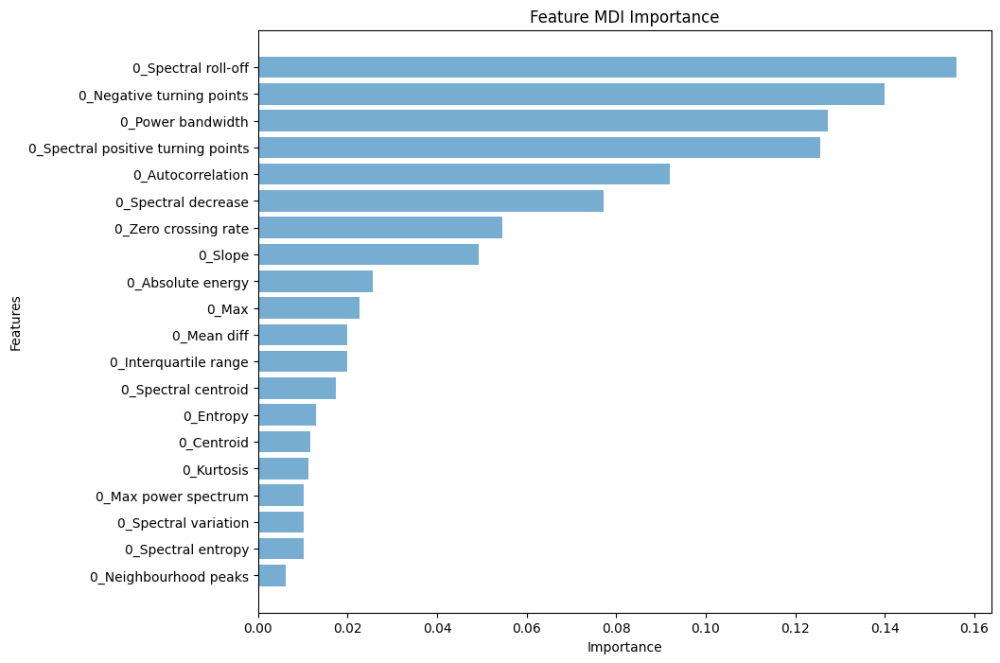

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.006, n=20, Auc: 57.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=19, Auc: 55.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=18, Auc: 58.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=17, Auc: 52.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=16, Auc: 54.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=15, Auc: 55.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=14, Auc: 56.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=13, Auc: 55.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=12, Auc: 56.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=11, Auc: 55.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=10, Auc: 57.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=9, Auc: 53.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=8, Auc: 58.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=7, Auc: 51.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=6, Auc: 50.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.092, n=5, Auc: 55.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.126, n=4, Auc: 54.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.127, n=3, Auc: 57.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.140, n=2, Auc: 57.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.156, n=1, Auc: 54.35%
    Threshold  Num Features       AUC
0    0.006147            20  0.579292
1    0.010133            19  0.559437
2    0.010272            18  0.583497
3    0.010294            17  0.525577
4    0.011153            16  0.542507
5    0.011588            15  0.551026
6    0.013029            14  0.568736
7    0.017315            13  0.554858
8    0.019817            12  0.565221
9    0.019896            11  0.557875
10   0.022563            10  0.575432
11   0.025535             9  0.538756
12   0.049389             8  0.581397
13   0.054669             7  0.511832
14   0.077166             6  0.508808
15   0.092038             5  0.555248
16   0.125585             4  0.547522
17   0.127383             3  0.578248
18   0.140026             2  0.579464
19   0.156002             1  0.543513
Processing patient 23 with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:34:55,653] A new study created in memory with name: no-name-6f0b0f96-0f89-4df4-b888-6b22f9f7a3ee


19238
19238
19118
19118


[I 2024-07-18 18:34:56,506] Trial 0 finished with value: 0.6043559051044799 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6043559051044799.
[I 2024-07-18 18:34:57,448] Trial 1 finished with value: 0.6040698132445161 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.6043559051044799.
[I 2024-07-18 18:34:58,131] Trial 2 finished with value: 0.6106758257045966 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.2523177233764966, 'alpha': 6.614382101854677, 'max_depth': 4, 'eta': 8.782608226028854e-05, 'gamma': 0.15214336952657595, 'subsample': 0.9773980004309795, 'colsample_bytree': 0.8135745036539425, 'grow_policy': 'depthwise', 'min_child_weight': 2}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.68      0.70      0.69    146931
         1.0       0.69      0.67      0.68    146931

    accuracy                           0.68    293862
   macro avg       0.68      0.68      0.68    293862
weighted avg       0.68      0.68      0.68    293862

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.76      0.86     18769
         1.0       0.04      0.35      0.07       468

    accuracy                           0.75     19237
   macro avg       0.51      0.56      0.46     19237
weighted avg       0.96      0.75      0.84   

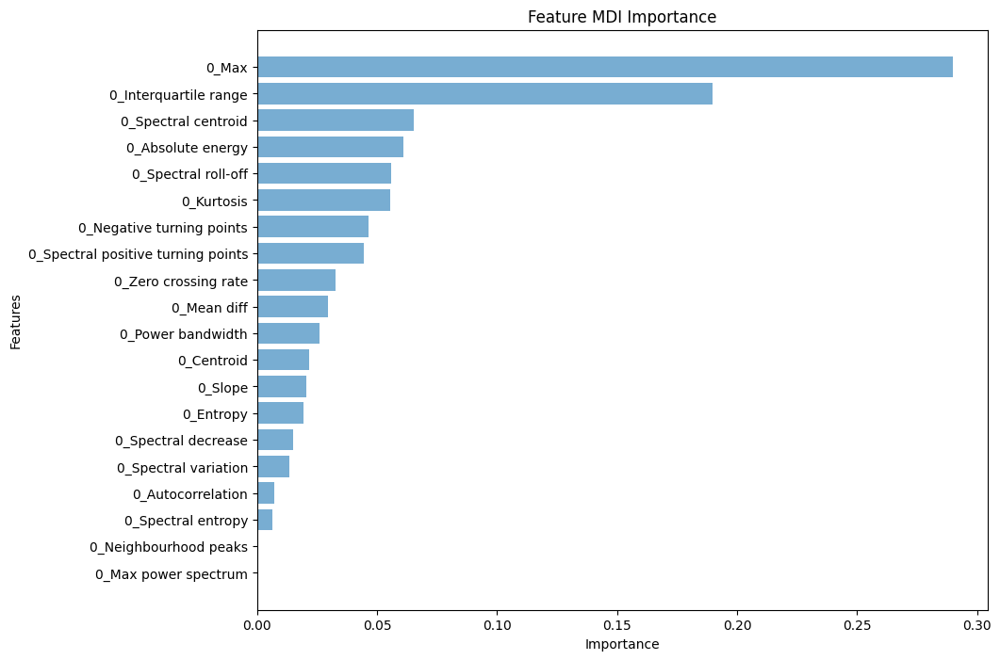

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 62.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 62.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.006, n=18, Auc: 62.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.007, n=17, Auc: 62.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=16, Auc: 61.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=15, Auc: 61.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=14, Auc: 61.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=13, Auc: 61.66%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=12, Auc: 61.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=11, Auc: 61.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=10, Auc: 61.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=9, Auc: 62.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=8, Auc: 62.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=7, Auc: 61.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=6, Auc: 61.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=5, Auc: 61.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=4, Auc: 61.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=3, Auc: 58.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.190, n=2, Auc: 56.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.290, n=1, Auc: 52.97%
    Threshold  Num Features       AUC
0    0.000000            20  0.620854
1    0.000000            20  0.620854
2    0.006419            18  0.620866
3    0.007136            17  0.620135
4    0.013509            16  0.618994
5    0.015192            15  0.619038
6    0.019268            14  0.619022
7    0.020655            13  0.616581
8    0.021869            12  0.614366
9    0.026140            11  0.618385
10   0.029481            10  0.618271
11   0.032530             9  0.620926
12   0.044508             8  0.621207
13   0.046382             7  0.612018
14   0.055288             6  0.619507
15   0.055804             5  0.616202
16   0.061057             4  0.619068
17   0.065208             3  0.587342
18   0.189672             2  0.567714
19   0.289878             1  0.529668
Processing patient 23 with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:37:22,443] A new study created in memory with name: no-name-2765b6fc-0d5c-43d5-8d1c-66886eb66e07


19242
19242
19218
19218


[I 2024-07-18 18:37:23,455] Trial 0 finished with value: 0.5786324954515197 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5786324954515197.
[I 2024-07-18 18:37:24,509] Trial 1 finished with value: 0.5749964175442537 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5786324954515197.
[I 2024-07-18 18:37:25,194] Trial 2 finished with value: 0.5737201275482682 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.0634992619065438, 'alpha': 0.3200991187246763, 'max_depth': 7, 'eta': 0.16494833409991502, 'gamma': 0.10154838928300919, 'subsample': 0.5041876334978967, 'colsample_bytree': 0.9048615128898012, 'grow_policy': 'depthwise', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.95      0.99      0.97    138518
         1.0       0.99      0.94      0.97    138518

    accuracy                           0.97    277036
   macro avg       0.97      0.97      0.97    277036
weighted avg       0.97      0.97      0.97    277036

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.94      0.95      0.94     18032
         1.0       0.09      0.07      0.08      1209

    accuracy                           0.90     19241
   macro avg       0.51      0.51      0.51     19241
weighted avg       0.89      0.90      0.89    

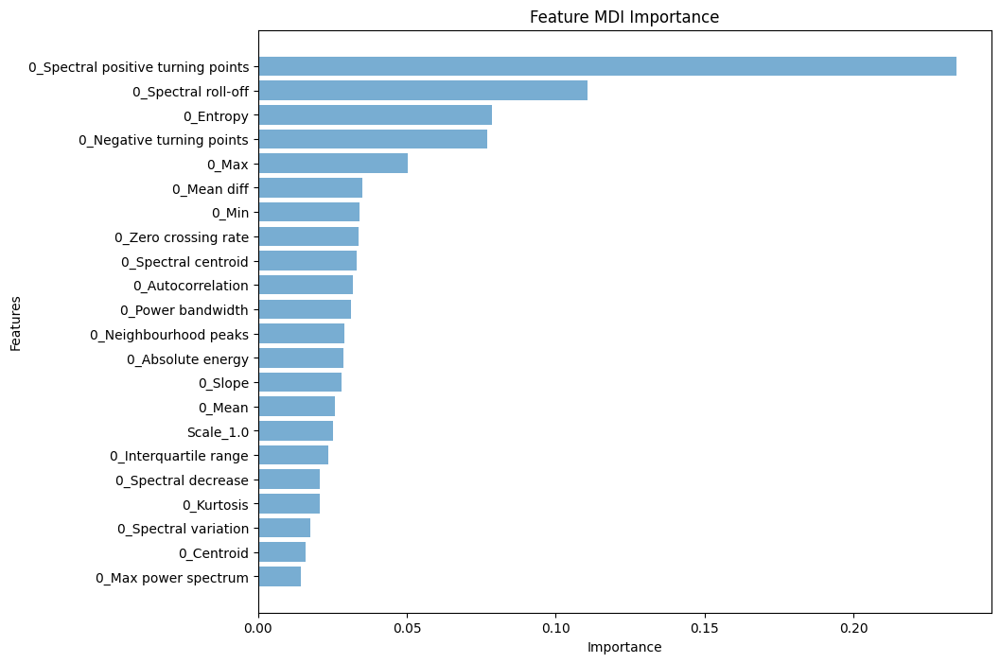

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=22, Auc: 64.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=21, Auc: 59.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=20, Auc: 60.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=19, Auc: 62.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=18, Auc: 60.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=17, Auc: 60.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=16, Auc: 60.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=15, Auc: 61.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=14, Auc: 61.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=13, Auc: 61.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=12, Auc: 60.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=11, Auc: 59.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=10, Auc: 59.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=9, Auc: 56.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=8, Auc: 57.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=7, Auc: 58.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=6, Auc: 52.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=5, Auc: 49.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=4, Auc: 54.40%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.078, n=3, Auc: 53.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.111, n=2, Auc: 51.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.235, n=1, Auc: 48.01%
    Threshold  Num Features       AUC
0    0.014473            22  0.641640
1    0.016099            21  0.597961
2    0.017625            20  0.607427
3    0.020811            19  0.622457
4    0.020817            18  0.609271
5    0.023452            17  0.602958
6    0.025238            16  0.604858
7    0.025783            15  0.611012
8    0.028011            14  0.616340
9    0.028681            13  0.612087
10   0.029141            12  0.600139
11   0.031095            11  0.592108
12   0.031769            10  0.596487
13   0.033251             9  0.568405
14   0.033659             8  0.571111
15   0.034112             7  0.583744
16   0.034934             6  0.529428
17   0.050307             5  0.498580
18   0.076970             4  0.543951
19   0.078411             3  0.531350
20   0.110808             2  0.518979
21   0.234554             1  0.480128
Processing patient 23 with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:40:26,677] A new study created in memory with name: no-name-7b0d4946-d5c3-4216-855d-bd2d0e118e2d


19242
19242
19122
19122


[I 2024-07-18 18:40:27,537] Trial 0 finished with value: 0.5621735882830854 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5621735882830854.
[I 2024-07-18 18:40:28,564] Trial 1 finished with value: 0.5598107041392455 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5621735882830854.
[I 2024-07-18 18:40:29,395] Trial 2 finished with value: 0.5740060818264084 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.1159594931530834, 'alpha': 0.023611604653561907, 'max_depth': 5, 'eta': 0.006321219710147623, 'gamma': 0.11138233388952824, 'subsample': 0.9867570492118438, 'colsample_bytree': 0.9644949612095611, 'grow_policy': 'depthwise', 'min_child_weight': 8}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.74      0.61      0.67    138518
         1.0       0.67      0.78      0.72    138518

    accuracy                           0.70    277036
   macro avg       0.70      0.70      0.69    277036
weighted avg       0.70      0.70      0.69    277036

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.95      0.64      0.76     18032
         1.0       0.09      0.52      0.15      1209

    accuracy                           0.63     19241
   macro avg       0.52      0.58      0.46     19241
weighted avg       0.90      0.63      0.72 

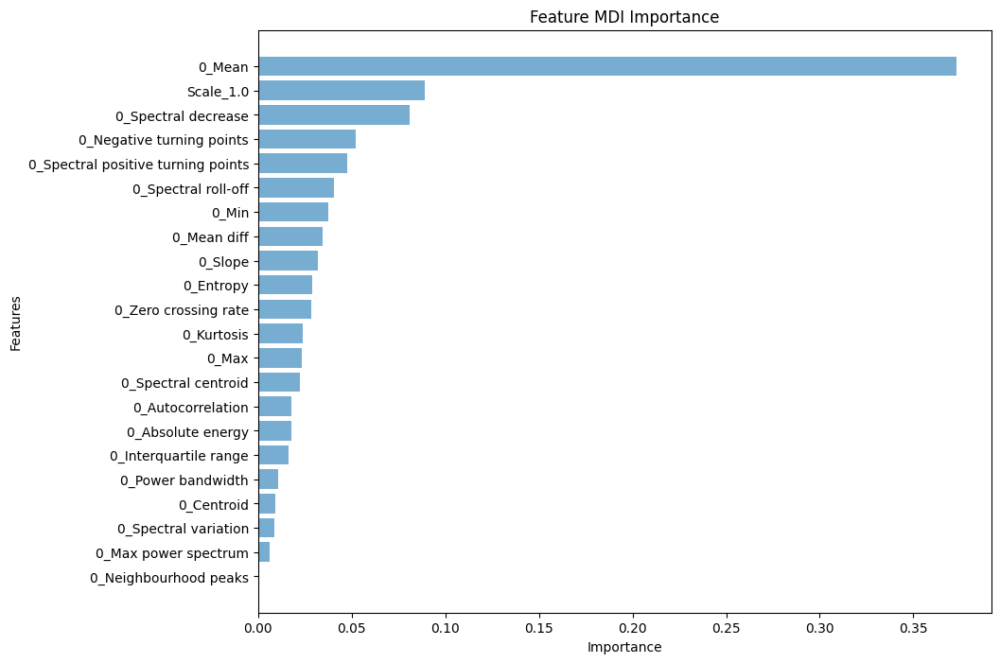

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=22, Auc: 59.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.006, n=21, Auc: 58.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.009, n=20, Auc: 58.92%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.009, n=19, Auc: 59.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=18, Auc: 58.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=17, Auc: 59.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=16, Auc: 59.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=15, Auc: 58.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=14, Auc: 58.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=13, Auc: 58.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=12, Auc: 57.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=11, Auc: 57.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=10, Auc: 57.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=9, Auc: 56.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=8, Auc: 56.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=7, Auc: 57.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=6, Auc: 58.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=5, Auc: 58.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=4, Auc: 58.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.081, n=3, Auc: 58.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.089, n=2, Auc: 56.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.373, n=1, Auc: 57.80%
    Threshold  Num Features       AUC
0    0.000000            22  0.590240
1    0.006057            21  0.588785
2    0.008679            20  0.589229
3    0.009133            19  0.591133
4    0.010782            18  0.588996
5    0.016325            17  0.590172
6    0.017771            16  0.590673
7    0.017961            15  0.585658
8    0.022156            14  0.586775
9    0.023109            13  0.588120
10   0.023932            12  0.575282
11   0.028607            11  0.574782
12   0.028964            10  0.572055
13   0.032044             9  0.564999
14   0.034366             8  0.564198
15   0.037475             7  0.572853
16   0.040408             6  0.584787
17   0.047577             5  0.586301
18   0.051929             4  0.583849
19   0.080862             3  0.583527
20   0.088903             2  0.569899
21   0.372961             1  0.578046
Processing patient 23 with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:42:55,430] A new study created in memory with name: no-name-70ac240a-3204-4aea-8570-70f645a13c30


19239
19239
19215
19215


[I 2024-07-18 18:42:56,224] Trial 0 finished with value: 0.5168701550448818 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5168701550448818.
[I 2024-07-18 18:42:57,161] Trial 1 finished with value: 0.5080597050522843 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5168701550448818.
[I 2024-07-18 18:42:57,856] Trial 2 finished with value: 0.5018848585208346 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.5236640619267394, 'alpha': 0.00015619562520792737, 'max_depth': 3, 'eta': 0.5551721685244719, 'gamma': 0.19529188922065532, 'subsample': 0.9041986740582306, 'colsample_bytree': 0.6523068845866853, 'grow_policy': 'lossguide', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.89      0.94      0.92    129735
         1.0       0.94      0.89      0.91    129735

    accuracy                           0.91    259470
   macro avg       0.91      0.91      0.91    259470
weighted avg       0.91      0.91      0.91    259470

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.89      0.87      0.88     17004
         1.0       0.14      0.16      0.15      2234

    accuracy                           0.79     19238
   macro avg       0.51      0.51      0.51     19238
weighted avg       0.80      0.79      0.79 

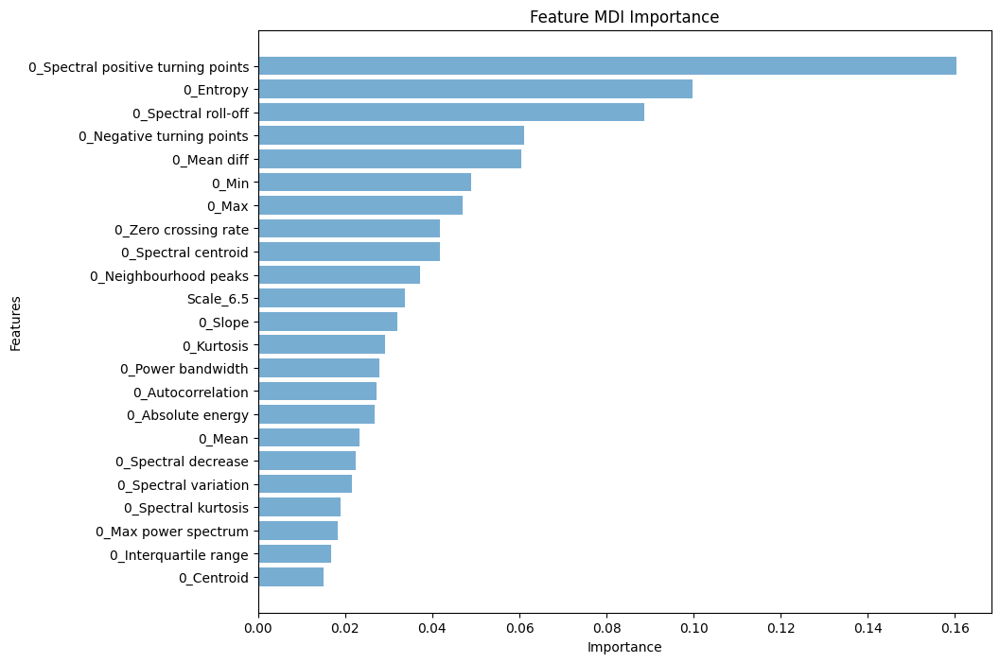

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=23, Auc: 55.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=22, Auc: 54.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=21, Auc: 48.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=20, Auc: 50.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=19, Auc: 50.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=18, Auc: 48.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=17, Auc: 52.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=16, Auc: 51.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=15, Auc: 53.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=14, Auc: 53.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=13, Auc: 56.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=12, Auc: 50.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=11, Auc: 50.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=10, Auc: 51.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=9, Auc: 53.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=8, Auc: 50.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=7, Auc: 50.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=6, Auc: 61.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=5, Auc: 53.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=4, Auc: 52.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.089, n=3, Auc: 50.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.100, n=2, Auc: 47.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.160, n=1, Auc: 51.63%
    Threshold  Num Features       AUC
0    0.014935            23  0.550428
1    0.016830            22  0.544515
2    0.018266            21  0.488279
3    0.018877            20  0.501607
4    0.021503            19  0.506501
5    0.022517            18  0.489798
6    0.023269            17  0.526031
7    0.026795            16  0.515205
8    0.027161            15  0.532540
9    0.027946            14  0.537812
10   0.029247            13  0.569924
11   0.032049            12  0.507720
12   0.033682            11  0.506078
13   0.037298            10  0.510793
14   0.041768             9  0.536016
15   0.041829             8  0.509280
16   0.047033             7  0.509091
17   0.048870             6  0.614297
18   0.060386             5  0.531390
19   0.061075             4  0.526315
20   0.088621             3  0.500815
21   0.099721             2  0.478233
22   0.160321             1  0.516342
Processing patient 23 with window size 144 with forecasti

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:43:47,998] A new study created in memory with name: no-name-487629a3-9dd6-4f83-a739-a65e1dc52013


19239
19239
19119
19119


[I 2024-07-18 18:43:48,892] Trial 0 finished with value: 0.5406459473330516 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5406459473330516.
[I 2024-07-18 18:43:49,885] Trial 1 finished with value: 0.5492997250423145 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5492997250423145.
[I 2024-07-18 18:43:50,534] Trial 2 finished with value: 0.5586414102995829 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.5789195437517107, 'alpha': 0.0015109465773119617, 'max_depth': 5, 'eta': 2.5736725586630217e-05, 'gamma': 0.13980808339396394, 'subsample': 0.5951865832168652, 'colsample_bytree': 0.9733310700041621, 'grow_policy': 'lossguide', 'min_child_weight': 8}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.76      0.38      0.50    129735
         1.0       0.59      0.88      0.70    129735

    accuracy                           0.63    259470
   macro avg       0.67      0.63      0.60    259470
weighted avg       0.67      0.63      0.60    259470

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.92      0.32      0.47     17004
         1.0       0.13      0.80      0.23      2234

    accuracy                           0.37     19238
   macro avg       0.53      0.56      0.35     19238
weighted avg       0.83      0.37      0.

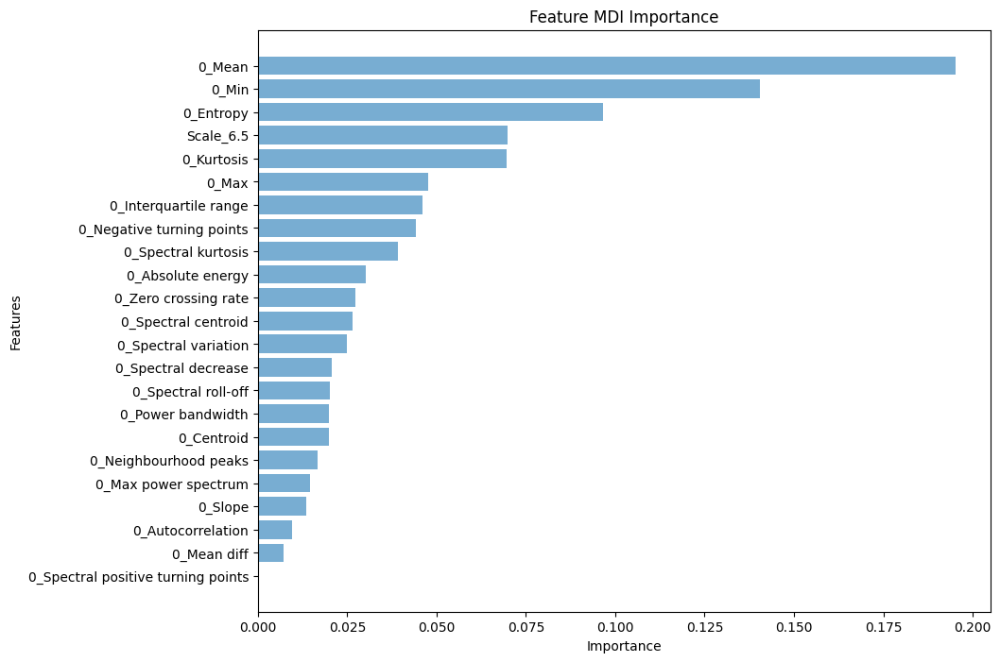

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=23, Auc: 56.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.007, n=22, Auc: 57.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=21, Auc: 55.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=20, Auc: 56.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=19, Auc: 56.92%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=18, Auc: 57.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=17, Auc: 56.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=16, Auc: 55.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=15, Auc: 57.06%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=14, Auc: 57.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=13, Auc: 57.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=12, Auc: 56.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=11, Auc: 56.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=10, Auc: 58.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=9, Auc: 56.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=8, Auc: 56.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=7, Auc: 54.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=6, Auc: 52.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=5, Auc: 53.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=4, Auc: 56.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.096, n=3, Auc: 54.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.141, n=2, Auc: 55.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.195, n=1, Auc: 57.17%
    Threshold  Num Features       AUC
0    0.000000            23  0.567365
1    0.007107            22  0.571359
2    0.009646            21  0.559849
3    0.013547            20  0.562950
4    0.014734            19  0.569247
5    0.016594            18  0.576263
6    0.019871            17  0.565438
7    0.019962            16  0.558379
8    0.020265            15  0.570564
9    0.020623            14  0.573304
10   0.024888            13  0.571519
11   0.026428            12  0.567273
12   0.027214            11  0.567781
13   0.030147            10  0.580499
14   0.039294             9  0.566030
15   0.044316             8  0.565625
16   0.046097             7  0.540351
17   0.047576             6  0.524922
18   0.069618             5  0.534277
19   0.069890             4  0.565570
20   0.096499             3  0.548232
21   0.140515             2  0.550119
22   0.195172             1  0.571674
Processing patient 23 with window size 288 with forecasti

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:45:20,894] A new study created in memory with name: no-name-aaedde8d-7b83-47a9-94f1-029fe4d2b478


19224
19224
19200
19200


[I 2024-07-18 18:45:21,686] Trial 0 finished with value: 0.47051662970943325 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.47051662970943325.
[I 2024-07-18 18:45:22,566] Trial 1 finished with value: 0.469152470283692 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.47051662970943325.
[I 2024-07-18 18:45:23,205] Trial 2 finished with value: 0.4814511436527618 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484

Best parameters found by Optuna: {'lambda': 1.9836630897206886, 'alpha': 2.222737483907923e-05, 'max_depth': 5, 'eta': 0.45603601794315785, 'gamma': 0.17797951264344608, 'subsample': 0.834411995589386, 'colsample_bytree': 0.7244887763256641, 'grow_policy': 'depthwise', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00    119533
         1.0       0.99      1.00      1.00    119533

    accuracy                           1.00    239066
   macro avg       1.00      1.00      1.00    239066
weighted avg       1.00      1.00      1.00    239066

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.78      0.84      0.81     15196
         1.0       0.17      0.13      0.15      4028

    accuracy                           0.69     19224
   macro avg       0.48      0.48      0.48     19224
weighted avg       0.66      0.69      0.67  

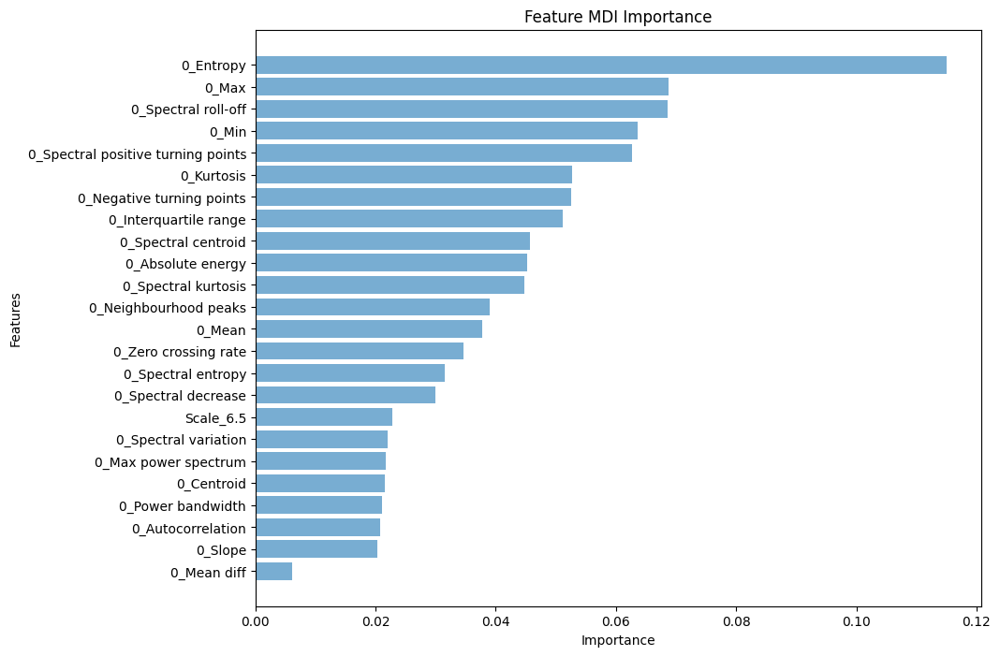

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.006, n=24, Auc: 52.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=23, Auc: 47.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=22, Auc: 46.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=21, Auc: 48.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=20, Auc: 45.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=19, Auc: 51.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=18, Auc: 47.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=17, Auc: 47.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=16, Auc: 46.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=15, Auc: 45.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=14, Auc: 43.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=13, Auc: 46.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=12, Auc: 45.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=11, Auc: 45.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=10, Auc: 47.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=9, Auc: 45.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=8, Auc: 43.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=7, Auc: 41.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=6, Auc: 42.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=5, Auc: 41.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.064, n=4, Auc: 41.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=3, Auc: 46.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=2, Auc: 46.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.115, n=1, Auc: 36.99%
    Threshold  Num Features       AUC
0    0.006140            24  0.528470
1    0.020370            23  0.470062
2    0.020743            22  0.469585
3    0.021076            21  0.484956
4    0.021546            20  0.452474
5    0.021642            19  0.517494
6    0.022033            18  0.477671
7    0.022765            17  0.478381
8    0.029997            16  0.463696
9    0.031456            15  0.458245
10   0.034600            14  0.431649
11   0.037730            13  0.467959
12   0.038981            12  0.457792
13   0.044752            11  0.452606
14   0.045214            10  0.475864
15   0.045736             9  0.452821
16   0.051196             8  0.431482
17   0.052512             7  0.415177
18   0.052662             6  0.424616
19   0.062707             5  0.419604
20   0.063681             4  0.412120
21   0.068667             3  0.460945
22   0.068776             2  0.461014
23   0.115017             1  0.369922
Processing patient 

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:46:53,069] A new study created in memory with name: no-name-614bea31-774f-49ae-a62e-f63d294ccb93


19224
19224
19104
19104


[I 2024-07-18 18:46:53,963] Trial 0 finished with value: 0.4580939232819592 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.4580939232819592.
[I 2024-07-18 18:46:54,960] Trial 1 finished with value: 0.4426429853489381 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.4580939232819592.
[I 2024-07-18 18:46:55,618] Trial 2 finished with value: 0.46982832138703723 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484,

Best parameters found by Optuna: {'lambda': 1.002212824545617, 'alpha': 31.315902511456805, 'max_depth': 3, 'eta': 0.6587983415935882, 'gamma': 0.15595832754143765, 'subsample': 0.7291137568818329, 'colsample_bytree': 0.9703069342489776, 'grow_policy': 'depthwise', 'min_child_weight': 1}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97    119533
         1.0       0.96      0.98      0.97    119533

    accuracy                           0.97    239066
   macro avg       0.97      0.97      0.97    239066
weighted avg       0.97      0.97      0.97    239066

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.79      0.76      0.77     15196
         1.0       0.20      0.23      0.22      4028

    accuracy                           0.65     19224
   macro avg       0.50      0.50      0.49     19224
weighted avg       0.67      0.65      0.66     1

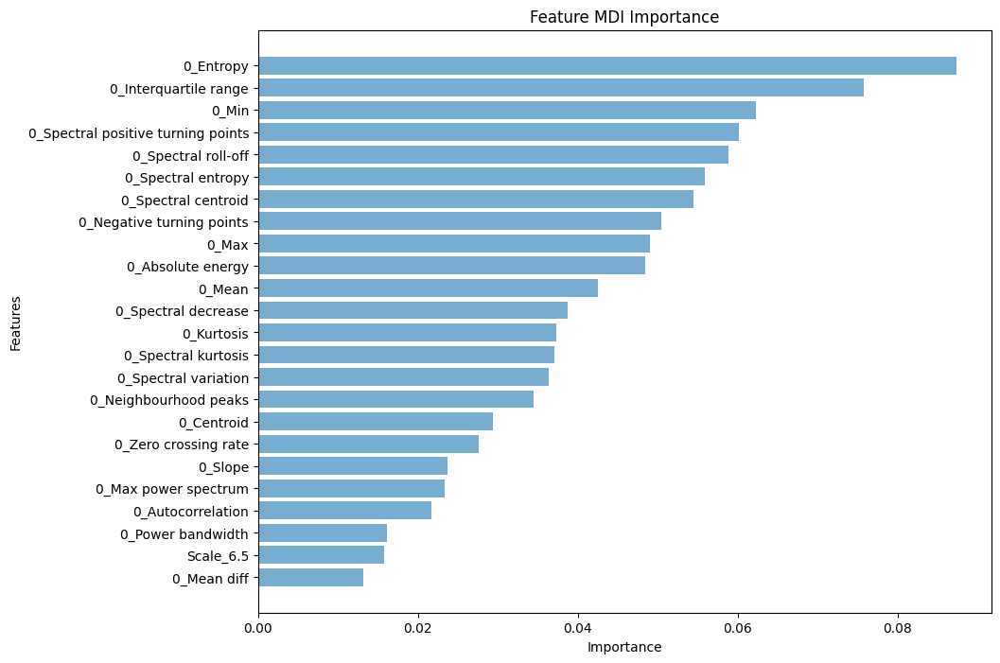

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=24, Auc: 50.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=23, Auc: 44.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=22, Auc: 43.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=21, Auc: 45.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=20, Auc: 43.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=19, Auc: 45.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=18, Auc: 44.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=17, Auc: 44.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=16, Auc: 42.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=15, Auc: 43.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=14, Auc: 41.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=13, Auc: 39.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=12, Auc: 45.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=11, Auc: 40.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=10, Auc: 35.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=9, Auc: 42.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=8, Auc: 43.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=7, Auc: 40.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=6, Auc: 37.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=5, Auc: 40.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=4, Auc: 44.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=3, Auc: 46.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=2, Auc: 43.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=1, Auc: 40.10%
    Threshold  Num Features       AUC
0    0.013222            24  0.501713
1    0.015755            23  0.443132
2    0.016179            22  0.433939
3    0.021722            21  0.450723
4    0.023371            20  0.432623
5    0.023663            19  0.454086
6    0.027646            18  0.443890
7    0.029348            17  0.444430
8    0.034455            16  0.421671
9    0.036331            15  0.438162
10   0.037039            14  0.417771
11   0.037342            13  0.398336
12   0.038710            12  0.455315
13   0.042538            11  0.403037
14   0.048471            10  0.359664
15   0.049047             9  0.420300
16   0.050392             8  0.436101
17   0.054445             7  0.409818
18   0.055908             6  0.372232
19   0.058854             5  0.407897
20   0.060100             4  0.442831
21   0.062271             3  0.462435
22   0.075831             2  0.437277
23   0.087360             1  0.401043
Processing patient 

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:48:30,184] A new study created in memory with name: no-name-6046be8e-cfd4-4b4d-807e-9f932271e344


11749
11749
11725
11725


[I 2024-07-18 18:48:30,774] Trial 0 finished with value: 0.6027657144084576 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6027657144084576.
[I 2024-07-18 18:48:31,448] Trial 1 finished with value: 0.5928006809187033 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.6027657144084576.
[I 2024-07-18 18:48:31,974] Trial 2 finished with value: 0.5660740848141167 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.2035830410865536, 'alpha': 1.007880111236629e-05, 'max_depth': 8, 'eta': 0.0266026058592059, 'gamma': 0.11027408312935984, 'subsample': 0.5995238347807516, 'colsample_bytree': 0.9865746707876613, 'grow_policy': 'lossguide', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.98      0.94     91369
         1.0       0.98      0.89      0.93     91369

    accuracy                           0.93    182738
   macro avg       0.94      0.93      0.93    182738
weighted avg       0.94      0.93      0.93    182738

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.95      0.96     11286
         1.0       0.02      0.03      0.03       462

    accuracy                           0.92     11748
   macro avg       0.49      0.49      0.49     11748
weighted avg       0.92      0.92      0.92  

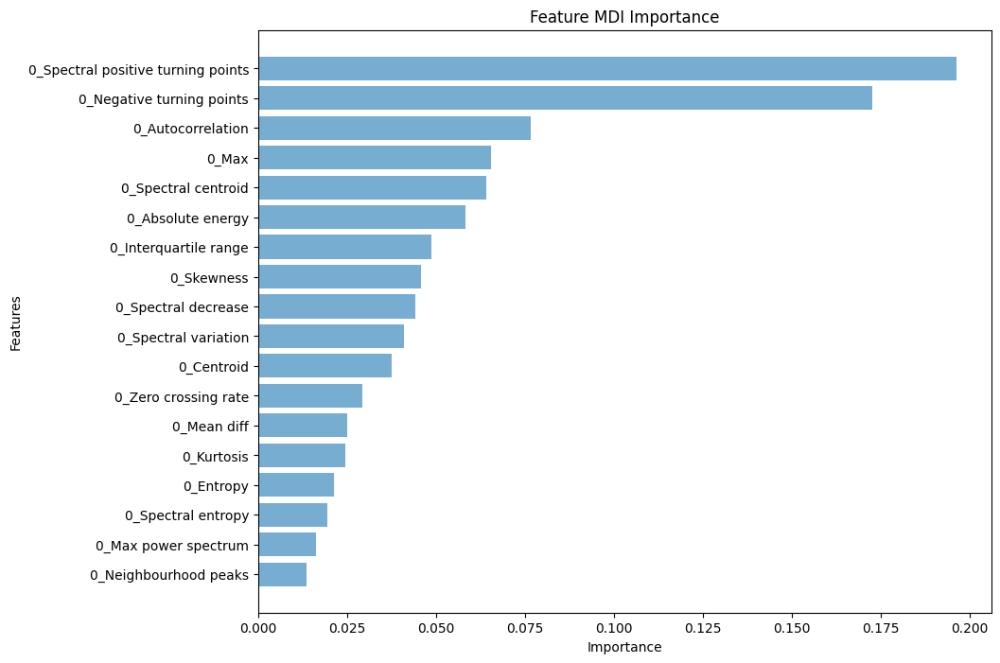

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=18, Auc: 61.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=17, Auc: 61.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=16, Auc: 60.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=15, Auc: 61.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=14, Auc: 60.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=13, Auc: 60.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=12, Auc: 60.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=11, Auc: 60.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=10, Auc: 59.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=9, Auc: 57.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=8, Auc: 58.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=7, Auc: 59.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=6, Auc: 57.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.064, n=5, Auc: 58.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=4, Auc: 57.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=3, Auc: 47.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.173, n=2, Auc: 48.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.196, n=1, Auc: 49.55%
    Threshold  Num Features       AUC
0    0.013713            18  0.617867
1    0.016298            17  0.612199
2    0.019343            16  0.608359
3    0.021344            15  0.611695
4    0.024450            14  0.604847
5    0.024992            13  0.605979
6    0.029373            12  0.607379
7    0.037439            11  0.603734
8    0.041082            10  0.590428
9    0.044126             9  0.579757
10   0.045709             8  0.583769
11   0.048685             7  0.597849
12   0.058333             6  0.577018
13   0.064214             5  0.585472
14   0.065541             4  0.578586
15   0.076511             3  0.473936
16   0.172574             2  0.484550
17   0.196271             1  0.495458
Processing patient 27 with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:51:29,335] A new study created in memory with name: no-name-c3f0c449-bb50-4f90-a074-8ecb3dccce91


11749
11749
11629
11629


[I 2024-07-18 18:51:29,923] Trial 0 finished with value: 0.48587981662144336 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.48587981662144336.
[I 2024-07-18 18:51:30,581] Trial 1 finished with value: 0.49836712994607735 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.49836712994607735.
[I 2024-07-18 18:51:31,060] Trial 2 finished with value: 0.4716800418554804 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.00067890532716984

Best parameters found by Optuna: {'lambda': 1.0202204181623555, 'alpha': 0.005022420836659062, 'max_depth': 4, 'eta': 0.6844383785375383, 'gamma': 0.18939058992294133, 'subsample': 0.8602739130405479, 'colsample_bytree': 0.691296965505026, 'grow_policy': 'lossguide', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97     91369
         1.0       0.98      0.95      0.97     91369

    accuracy                           0.97    182738
   macro avg       0.97      0.97      0.97    182738
weighted avg       0.97      0.97      0.97    182738

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97     11286
         1.0       0.06      0.04      0.05       462

    accuracy                           0.94     11748
   macro avg       0.51      0.51      0.51     11748
weighted avg       0.93      0.94      0.93    

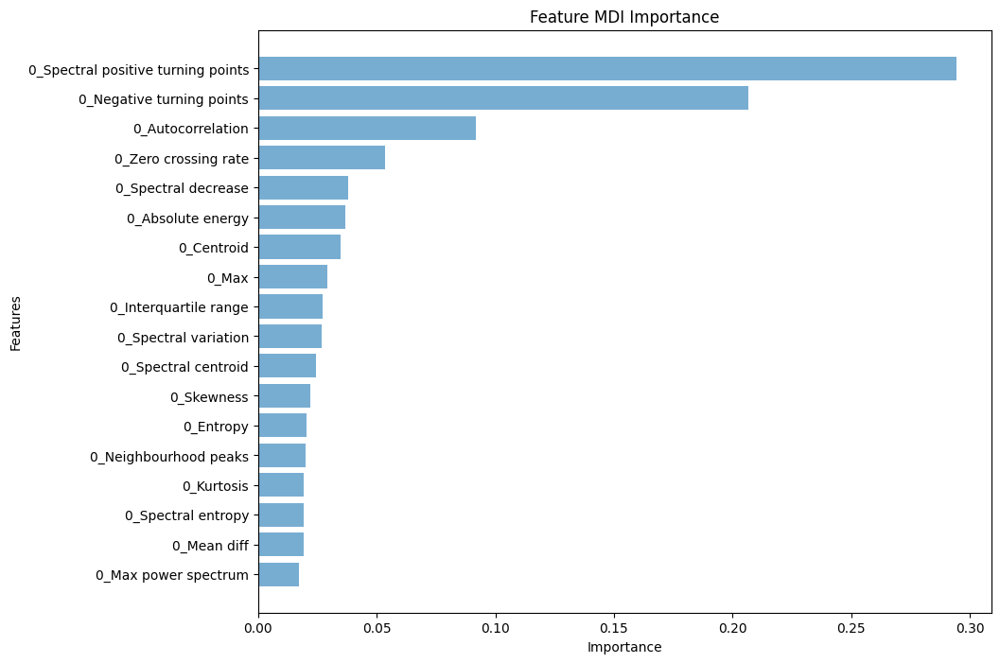

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=18, Auc: 60.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=17, Auc: 56.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=16, Auc: 57.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=15, Auc: 54.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=14, Auc: 57.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=13, Auc: 56.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=12, Auc: 57.06%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=11, Auc: 55.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=10, Auc: 54.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=9, Auc: 53.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=8, Auc: 55.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=7, Auc: 53.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=6, Auc: 57.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=5, Auc: 45.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=4, Auc: 45.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.092, n=3, Auc: 44.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.206, n=2, Auc: 45.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.294, n=1, Auc: 45.80%
    Threshold  Num Features       AUC
0    0.017333            18  0.606000
1    0.019322            17  0.563779
2    0.019330            16  0.574718
3    0.019358            15  0.547390
4    0.019847            14  0.576027
5    0.020407            13  0.566445
6    0.021893            12  0.570642
7    0.024379            11  0.557948
8    0.026640            10  0.548075
9    0.027025             9  0.538446
10   0.029171             8  0.556335
11   0.034590             7  0.535351
12   0.036858             6  0.574240
13   0.037868             5  0.454514
14   0.053594             4  0.453003
15   0.091609             3  0.449002
16   0.206493             2  0.457082
17   0.294283             1  0.458040
Processing patient 27 with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:52:41,205] A new study created in memory with name: no-name-c31311f5-3ca6-41e6-b813-f93d9a98dc26


11744
11744
11720
11720


[I 2024-07-18 18:52:41,858] Trial 0 finished with value: 0.6154911938733278 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6154911938733278.
[I 2024-07-18 18:52:42,653] Trial 1 finished with value: 0.6266162760042182 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6266162760042182.
[I 2024-07-18 18:52:43,182] Trial 2 finished with value: 0.6394349058622164 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.4017576847937738, 'alpha': 3.7222523104125202, 'max_depth': 3, 'eta': 0.032713601708651674, 'gamma': 0.1896728696280823, 'subsample': 0.758249115246263, 'colsample_bytree': 0.7185648486898134, 'grow_policy': 'depthwise', 'min_child_weight': 3}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.76      0.70      0.73     86355
         1.0       0.72      0.78      0.75     86355

    accuracy                           0.74    172710
   macro avg       0.74      0.74      0.74    172710
weighted avg       0.74      0.74      0.74    172710

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.93      0.65      0.77     10431
         1.0       0.18      0.60      0.28      1312

    accuracy                           0.65     11743
   macro avg       0.55      0.63      0.52     11743
weighted avg       0.84      0.65      0.71     

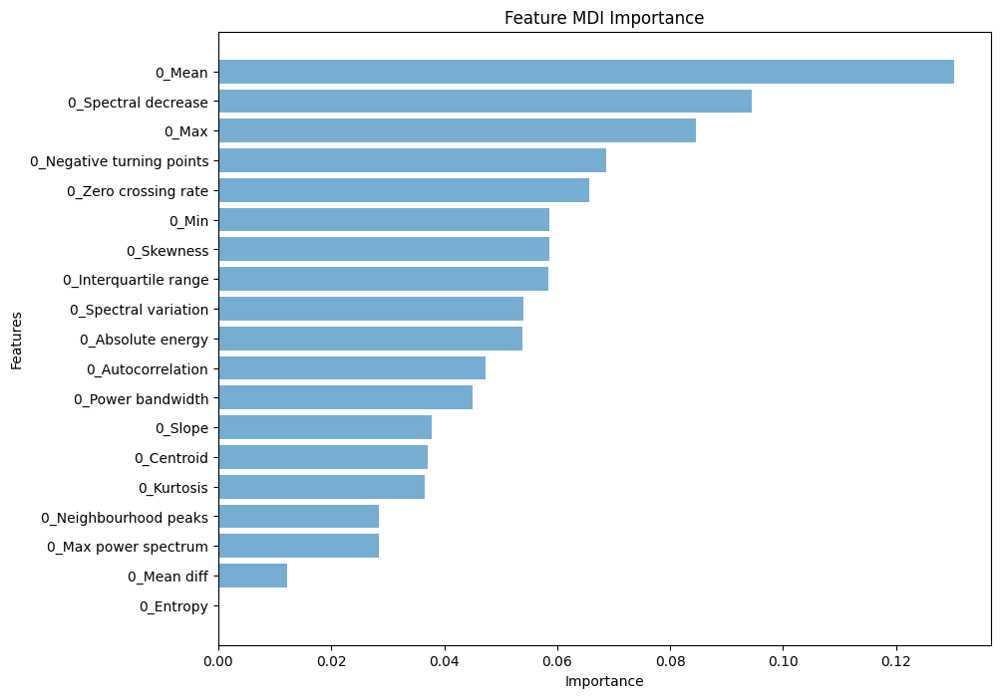

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=19, Auc: 67.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=18, Auc: 65.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=17, Auc: 66.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=16, Auc: 66.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=15, Auc: 66.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=14, Auc: 67.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=13, Auc: 66.92%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=12, Auc: 66.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=11, Auc: 67.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=10, Auc: 65.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=9, Auc: 66.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=8, Auc: 65.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=7, Auc: 65.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=6, Auc: 65.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=5, Auc: 65.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=4, Auc: 62.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.085, n=3, Auc: 62.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.094, n=2, Auc: 61.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.130, n=1, Auc: 62.99%
    Threshold  Num Features       AUC
0    0.000000            19  0.678132
1    0.012110            18  0.657911
2    0.028420            17  0.665416
3    0.028520            16  0.664612
4    0.036466            15  0.664360
5    0.037022            14  0.675474
6    0.037862            13  0.669158
7    0.045006            12  0.666798
8    0.047376            11  0.677132
9    0.053903            10  0.656808
10   0.053985             9  0.664526
11   0.058500             8  0.656765
12   0.058635             7  0.656692
13   0.058658             6  0.658522
14   0.065611             5  0.656295
15   0.068672             4  0.621475
16   0.084566             3  0.626152
17   0.094415             2  0.610512
18   0.130276             1  0.629902
Processing patient 27 with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:53:56,276] A new study created in memory with name: no-name-ce073943-0a14-4302-bf02-ae4471d1a703


11744
11744
11624
11624


[I 2024-07-18 18:53:56,951] Trial 0 finished with value: 0.5747852540270442 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5747852540270442.
[I 2024-07-18 18:53:57,904] Trial 1 finished with value: 0.5799831748587114 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5799831748587114.
[I 2024-07-18 18:53:58,562] Trial 2 finished with value: 0.5926312588999488 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.0497711338527813, 'alpha': 4.3223020429061874e-05, 'max_depth': 10, 'eta': 0.0010364092410028011, 'gamma': 0.10392869840678153, 'subsample': 0.5321195352481215, 'colsample_bytree': 0.5281404134508938, 'grow_policy': 'lossguide', 'min_child_weight': 3}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.97      0.88      0.93     86355
         1.0       0.89      0.97      0.93     86355

    accuracy                           0.93    172710
   macro avg       0.93      0.93      0.93    172710
weighted avg       0.93      0.93      0.93    172710

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.81      0.86     10431
         1.0       0.17      0.32      0.22      1312

    accuracy                           0.76     11743
   macro avg       0.54      0.56      0.54     11743
weighted avg       0.82      0.76      0

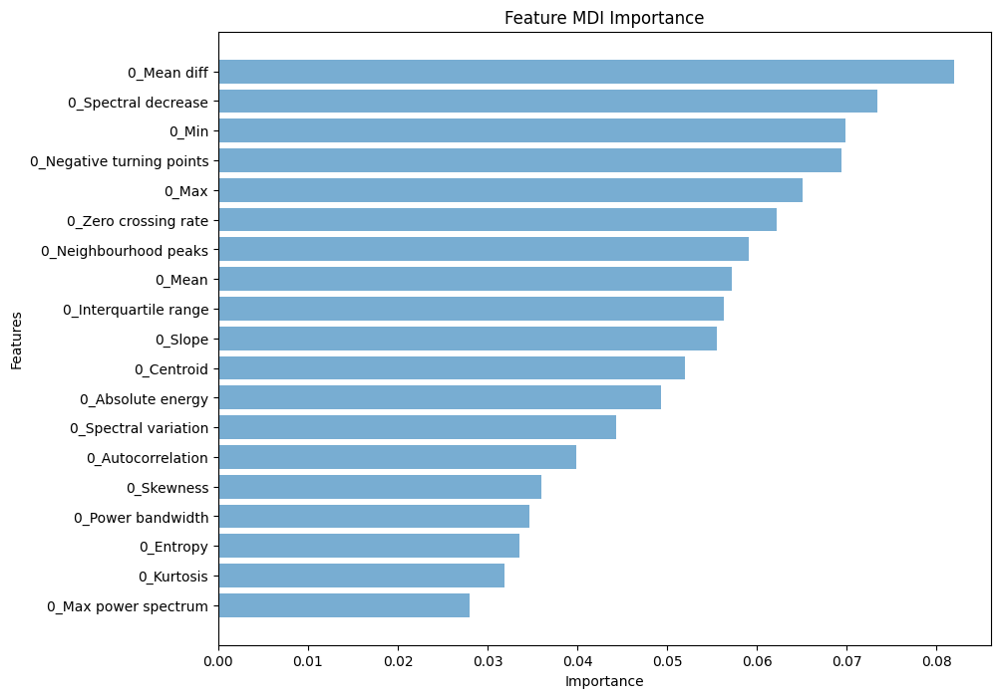

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=19, Auc: 61.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=18, Auc: 60.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=17, Auc: 62.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=16, Auc: 61.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=15, Auc: 61.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=14, Auc: 61.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=13, Auc: 61.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=12, Auc: 61.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=11, Auc: 60.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=10, Auc: 61.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=9, Auc: 60.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=8, Auc: 58.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=7, Auc: 55.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=6, Auc: 57.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=5, Auc: 57.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=4, Auc: 56.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=3, Auc: 48.92%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.073, n=2, Auc: 57.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=1, Auc: 58.96%
    Threshold  Num Features       AUC
0    0.028030            19  0.618742
1    0.031945            18  0.606213
2    0.033608            17  0.620813
3    0.034656            16  0.610399
4    0.036049            15  0.612383
5    0.039859            14  0.616108
6    0.044309            13  0.612673
7    0.049298            12  0.614650
8    0.051960            11  0.609568
9    0.055563            10  0.612095
10   0.056374             9  0.602919
11   0.057206             8  0.587551
12   0.059058             7  0.559775
13   0.062233             6  0.571929
14   0.065078             5  0.577066
15   0.069459             4  0.567908
16   0.069842             3  0.489191
17   0.073483             2  0.576165
18   0.081988             1  0.589634
Processing patient 27 with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:57:30,857] A new study created in memory with name: no-name-d6b46bbf-3dc4-4e5a-8e2d-436628debb20


11737
11737
11713
11713


[I 2024-07-18 18:57:31,513] Trial 0 finished with value: 0.5794223170874175 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5794223170874175.
[I 2024-07-18 18:57:32,288] Trial 1 finished with value: 0.5964482456969926 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.5964482456969926.
[I 2024-07-18 18:57:32,802] Trial 2 finished with value: 0.5921255721233547 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.520702011008713, 'alpha': 0.00043017354599540476, 'max_depth': 6, 'eta': 0.00018465432035809823, 'gamma': 0.1670740776178313, 'subsample': 0.6540425577434926, 'colsample_bytree': 0.8039731552008307, 'grow_policy': 'depthwise', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.79      0.75      0.77     79097
         1.0       0.76      0.80      0.78     79097

    accuracy                           0.77    158194
   macro avg       0.77      0.77      0.77    158194
weighted avg       0.77      0.77      0.77    158194

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.81      0.70      0.75      9248
         1.0       0.25      0.37      0.30      2488

    accuracy                           0.63     11736
   macro avg       0.53      0.54      0.53     11736
weighted avg       0.69      0.63      0.6

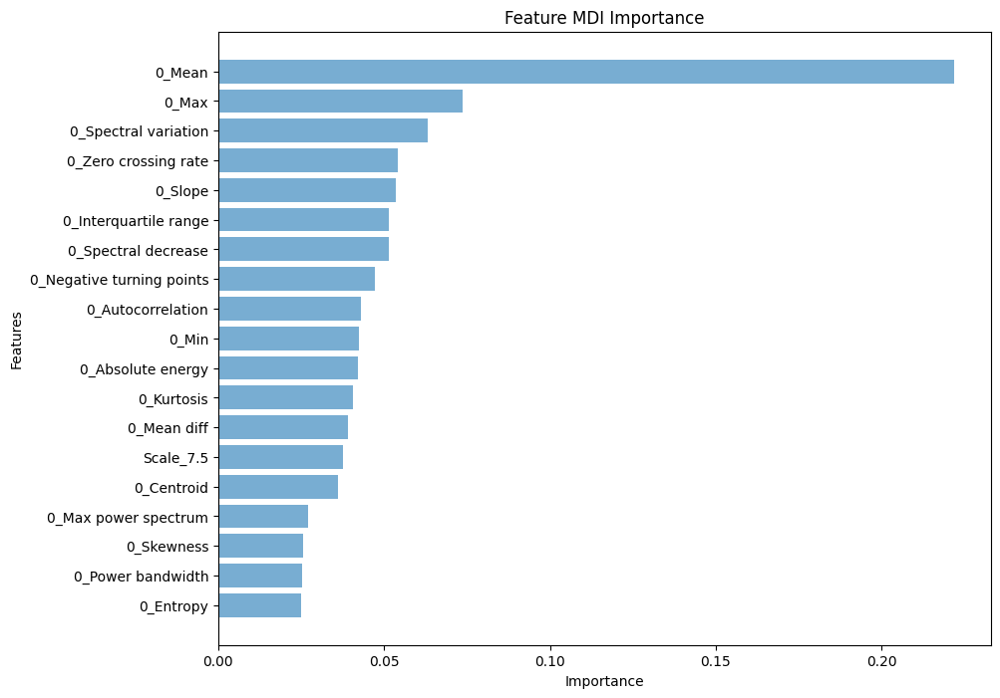

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=19, Auc: 60.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=18, Auc: 60.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=17, Auc: 60.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=16, Auc: 60.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=15, Auc: 60.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=14, Auc: 59.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=13, Auc: 60.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=12, Auc: 58.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=11, Auc: 58.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=10, Auc: 59.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=9, Auc: 58.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=8, Auc: 57.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=7, Auc: 57.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=6, Auc: 56.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=5, Auc: 58.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=4, Auc: 55.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=3, Auc: 57.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=2, Auc: 56.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.222, n=1, Auc: 57.74%
    Threshold  Num Features       AUC
0    0.024828            19  0.605839
1    0.025330            18  0.603611
2    0.025541            17  0.603748
3    0.026979            16  0.601360
4    0.036041            15  0.602834
5    0.037601            14  0.595293
6    0.039019            13  0.600203
7    0.040617            12  0.589566
8    0.042021            11  0.588699
9    0.042279            10  0.595684
10   0.043006             9  0.584195
11   0.047327             8  0.571251
12   0.051409             7  0.572072
13   0.051510             6  0.569569
14   0.053662             5  0.589933
15   0.053997             4  0.556090
16   0.063187             3  0.573530
17   0.073800             2  0.560353
18   0.221846             1  0.577352
Processing patient 27 with window size 144 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 18:58:35,878] A new study created in memory with name: no-name-9a5873c4-375e-4aa3-b0e0-bbeca0590596


11737
11737
11617
11617


[I 2024-07-18 18:58:36,638] Trial 0 finished with value: 0.6049053623482683 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6049053623482683.
[I 2024-07-18 18:58:37,511] Trial 1 finished with value: 0.632392534337832 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.632392534337832.
[I 2024-07-18 18:58:38,074] Trial 2 finished with value: 0.608178208688904 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'ga

Best parameters found by Optuna: {'lambda': 1.4649858746465867, 'alpha': 82.10211673236317, 'max_depth': 7, 'eta': 0.001869925074708732, 'gamma': 0.1809868596137819, 'subsample': 0.6144807951116824, 'colsample_bytree': 0.990342729577031, 'grow_policy': 'lossguide', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.78      0.73      0.75     79097
         1.0       0.75      0.80      0.77     79097

    accuracy                           0.76    158194
   macro avg       0.76      0.76      0.76    158194
weighted avg       0.76      0.76      0.76    158194

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.85      0.70      0.77      9248
         1.0       0.32      0.54      0.40      2488

    accuracy                           0.66     11736
   macro avg       0.59      0.62      0.58     11736
weighted avg       0.74      0.66      0.69     1

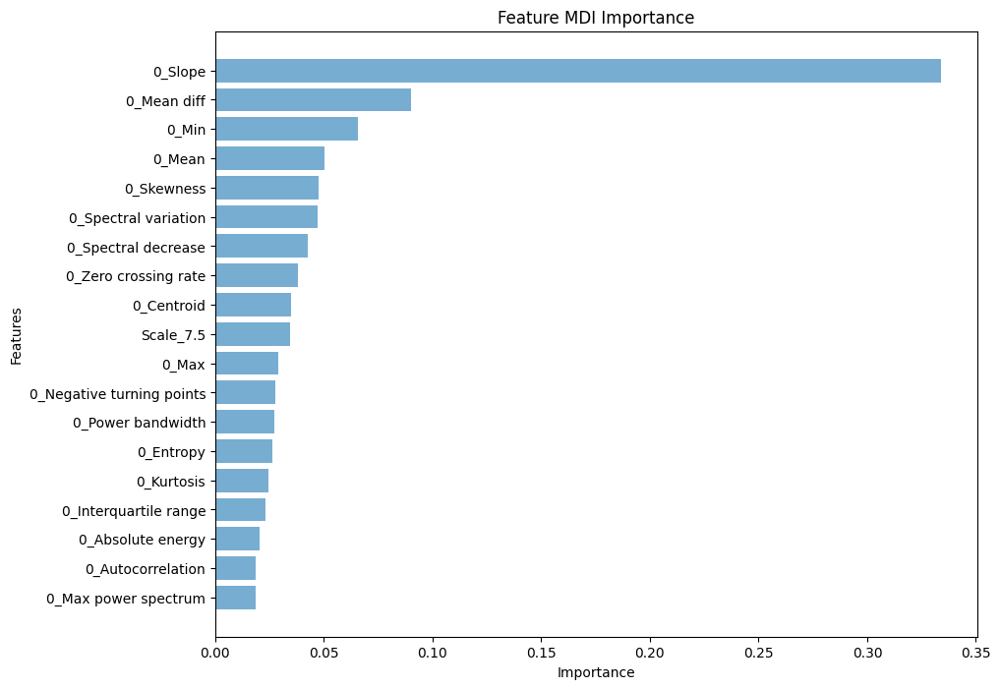

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=19, Auc: 66.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=18, Auc: 66.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=17, Auc: 66.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=16, Auc: 65.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=15, Auc: 65.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=14, Auc: 65.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=13, Auc: 65.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.028, n=12, Auc: 64.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=11, Auc: 64.39%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=10, Auc: 63.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=9, Auc: 62.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=8, Auc: 63.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=7, Auc: 65.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=6, Auc: 65.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=5, Auc: 61.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=4, Auc: 62.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=3, Auc: 61.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.090, n=2, Auc: 68.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.334, n=1, Auc: 66.53%
    Threshold  Num Features       AUC
0    0.018559            19  0.663644
1    0.018579            18  0.662969
2    0.020194            17  0.661029
3    0.022926            16  0.655051
4    0.024393            15  0.654823
5    0.026380            14  0.655055
6    0.027391            13  0.650832
7    0.027782            12  0.646048
8    0.029093            11  0.643948
9    0.034299            10  0.632616
10   0.035005             9  0.626221
11   0.038055             8  0.634467
12   0.042783             7  0.654219
13   0.047167             6  0.653366
14   0.047586             5  0.616150
15   0.050468             4  0.625483
16   0.065442             3  0.611225
17   0.089938             2  0.688883
18   0.333959             1  0.665255
Processing patient 27 with window size 288 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:00:48,178] A new study created in memory with name: no-name-4d7584c5-2089-4d2a-9664-17f2a5ba8097


11722
11722
11698
11698


[I 2024-07-18 19:00:48,716] Trial 0 finished with value: 0.5860370901764307 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5860370901764307.
[I 2024-07-18 19:00:49,321] Trial 1 finished with value: 0.5777623876672767 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5860370901764307.
[I 2024-07-18 19:00:49,793] Trial 2 finished with value: 0.5890293394645153 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.5757359259600685, 'alpha': 80.0378951195932, 'max_depth': 3, 'eta': 0.00022638106054969072, 'gamma': 0.12961871446562995, 'subsample': 0.7917647730974512, 'colsample_bytree': 0.7756205024566517, 'grow_policy': 'depthwise', 'min_child_weight': 10}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.58      0.89      0.70     64962
         1.0       0.76      0.35      0.48     64962

    accuracy                           0.62    129924
   macro avg       0.67      0.62      0.59    129924
weighted avg       0.67      0.62      0.59    129924

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.64      0.85      0.73      7054
         1.0       0.54      0.27      0.36      4668

    accuracy                           0.62     11722
   macro avg       0.59      0.56      0.54     11722
weighted avg       0.60      0.62      0.58  

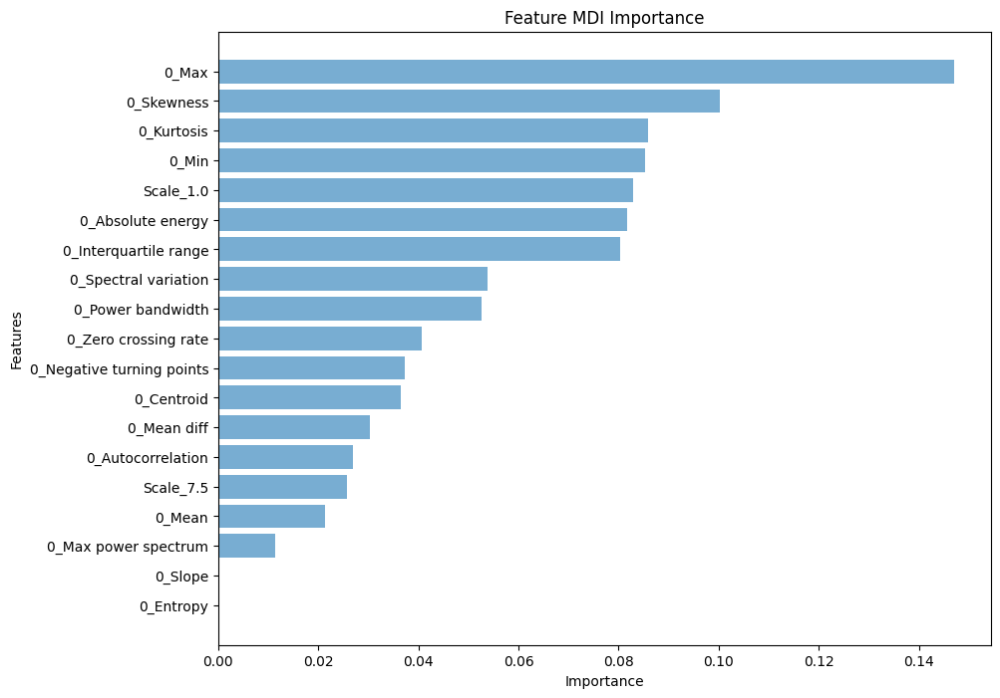

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=19, Auc: 65.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=19, Auc: 65.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=17, Auc: 64.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=16, Auc: 62.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=15, Auc: 61.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=14, Auc: 63.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=13, Auc: 62.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=12, Auc: 63.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=11, Auc: 63.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=10, Auc: 61.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=9, Auc: 62.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=8, Auc: 62.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.080, n=7, Auc: 62.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=6, Auc: 62.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.083, n=5, Auc: 54.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.085, n=4, Auc: 55.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.086, n=3, Auc: 52.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.100, n=2, Auc: 51.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.147, n=1, Auc: 55.42%
    Threshold  Num Features       AUC
0    0.000000            19  0.657647
1    0.000000            19  0.657647
2    0.011474            17  0.645064
3    0.021340            16  0.629858
4    0.025700            15  0.618392
5    0.026915            14  0.636233
6    0.030205            13  0.620123
7    0.036579            12  0.633371
8    0.037333            11  0.630704
9    0.040703            10  0.612255
10   0.052566             9  0.625822
11   0.053799             8  0.624708
12   0.080395             7  0.626222
13   0.081690             6  0.623130
14   0.082841             5  0.546263
15   0.085322             4  0.552989
16   0.085866             3  0.525196
17   0.100219             2  0.509988
18   0.147054             1  0.554150
Processing patient 27 with window size 288 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:01:41,450] A new study created in memory with name: no-name-8282e06c-8e84-4646-af4b-9bc1536c03e5


11722
11722
11602
11602


[I 2024-07-18 19:01:42,071] Trial 0 finished with value: 0.4882774794710119 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.4882774794710119.
[I 2024-07-18 19:01:42,770] Trial 1 finished with value: 0.47006466093733024 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.4882774794710119.
[I 2024-07-18 19:01:43,395] Trial 2 finished with value: 0.5084114399409719 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484,

Best parameters found by Optuna: {'lambda': 1.6583000926599953, 'alpha': 0.0631004002011032, 'max_depth': 4, 'eta': 0.0009312227645176884, 'gamma': 0.1053241255320189, 'subsample': 0.87049763384307, 'colsample_bytree': 0.969077123182559, 'grow_policy': 'lossguide', 'min_child_weight': 6}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.62      0.43      0.51     64962
         1.0       0.56      0.74      0.64     64962

    accuracy                           0.58    129924
   macro avg       0.59      0.58      0.57    129924
weighted avg       0.59      0.58      0.57    129924

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.68      0.52      0.59      7054
         1.0       0.46      0.62      0.53      4668

    accuracy                           0.56     11722
   macro avg       0.57      0.57      0.56     11722
weighted avg       0.59      0.56      0.57     1

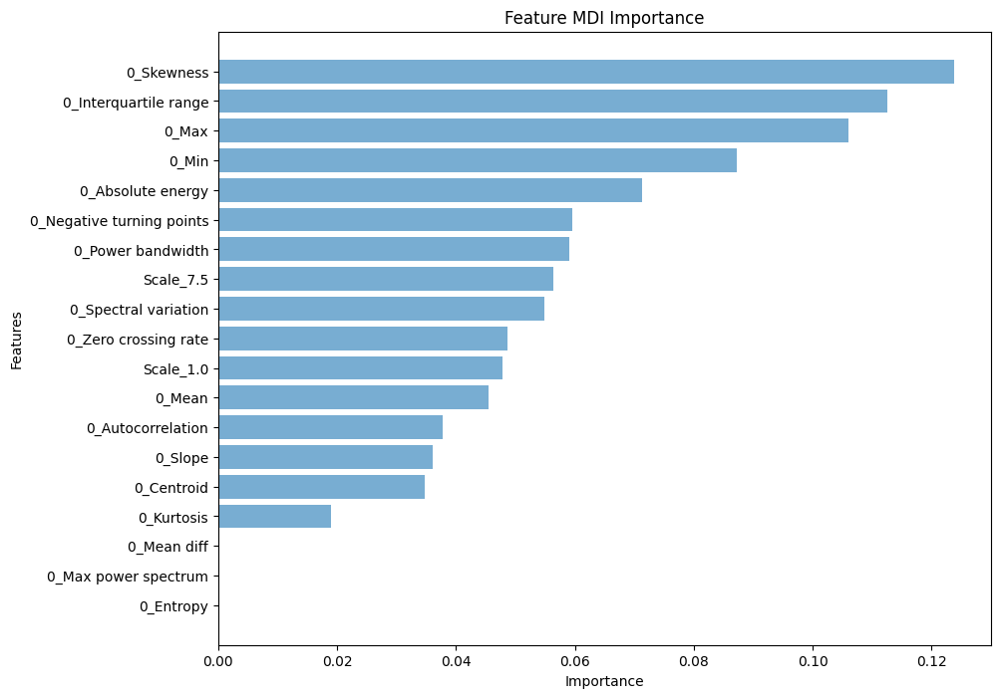

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=19, Auc: 58.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=19, Auc: 58.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=19, Auc: 58.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=16, Auc: 57.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=15, Auc: 57.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=14, Auc: 56.92%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=13, Auc: 55.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=12, Auc: 56.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=11, Auc: 55.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=10, Auc: 54.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=9, Auc: 54.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=8, Auc: 54.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=7, Auc: 54.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=6, Auc: 55.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.071, n=5, Auc: 48.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=4, Auc: 37.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.106, n=3, Auc: 40.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.113, n=2, Auc: 47.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.124, n=1, Auc: 47.18%
    Threshold  Num Features       AUC
0    0.000000            19  0.583458
1    0.000000            19  0.583458
2    0.000000            19  0.583458
3    0.018895            16  0.576377
4    0.034764            15  0.578167
5    0.036048            14  0.569171
6    0.037785            13  0.555815
7    0.045472            12  0.560259
8    0.047742            11  0.553781
9    0.048725            10  0.549879
10   0.054816             9  0.544935
11   0.056331             8  0.547067
12   0.059115             7  0.547619
13   0.059530             6  0.551832
14   0.071253             5  0.482745
15   0.087166             4  0.378626
16   0.106031             3  0.402821
17   0.112522             2  0.473003
18   0.123807             1  0.471799
Processing patient 29 with window size 24 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:02:55,928] A new study created in memory with name: no-name-f44136e6-c26c-4037-b109-3d928610a4dd


7806
7806
7782
7782


[I 2024-07-18 19:02:56,484] Trial 0 finished with value: 0.5612685256575003 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5612685256575003.
[I 2024-07-18 19:02:57,151] Trial 1 finished with value: 0.4239537822325024 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5612685256575003.
[I 2024-07-18 19:02:57,742] Trial 2 finished with value: 0.5613889959736142 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.818473291181444, 'alpha': 6.289082610865494e-05, 'max_depth': 5, 'eta': 0.04840577085674248, 'gamma': 0.1139123083274399, 'subsample': 0.804415766527376, 'colsample_bytree': 0.982447572930371, 'grow_policy': 'depthwise', 'min_child_weight': 6}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.83      0.97      0.89     57717
         1.0       0.96      0.80      0.87     57717

    accuracy                           0.88    115434
   macro avg       0.89      0.88      0.88    115434
weighted avg       0.89      0.88      0.88    115434

Validation classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      7782
         1.0       0.00      0.00      0.00        24

    accuracy                           0.99      7806
   macro avg       0.50      0.50      0.50      7806
weighted avg       0.99      0.99      0.99     

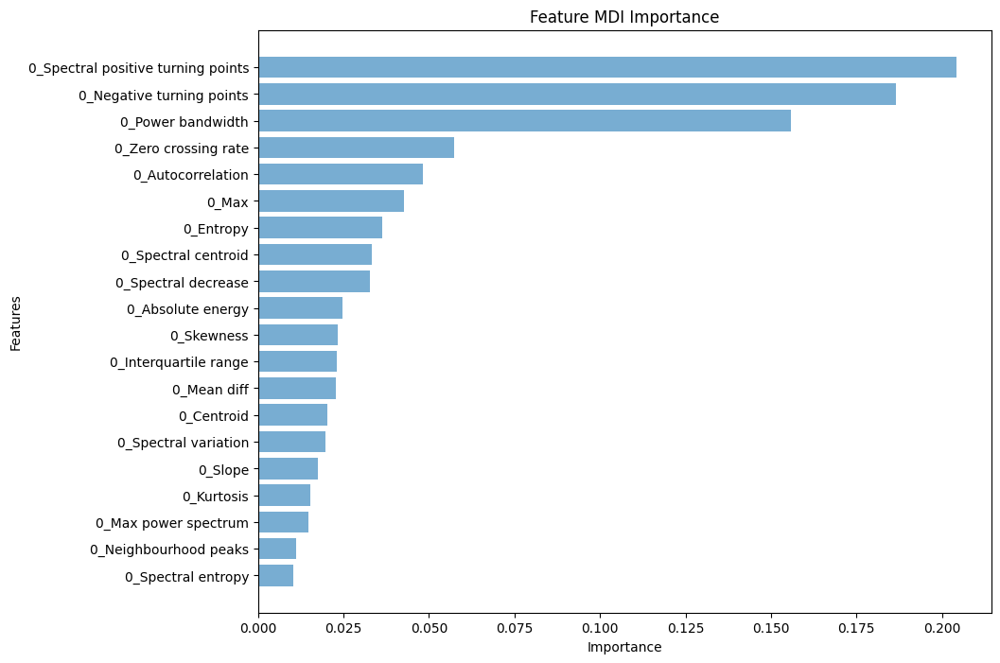

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=20, Auc: 74.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=19, Auc: 74.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=18, Auc: 74.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=17, Auc: 75.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=16, Auc: 69.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=15, Auc: 69.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=14, Auc: 71.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=13, Auc: 72.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=12, Auc: 71.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=11, Auc: 72.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=10, Auc: 73.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=9, Auc: 68.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=8, Auc: 72.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=7, Auc: 61.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=6, Auc: 66.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=5, Auc: 18.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=4, Auc: 22.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.156, n=3, Auc: 14.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.187, n=2, Auc: 17.04%
Thresh=0.204, n=1, Auc: 67.17%
    Threshold  Num Features       AUC
0    0.010165            20  0.744426
1    0.011149            19  0.746528
2    0.014853            18  0.745205
3    0.015173            17  0.752198
4    0.017561            16  0.696428
5    0.019764            15  0.694897
6    0.020349            14  0.712903
7    0.022767            13  0.720380
8    0.022905            12  0.718327
9    0.023410            11  0.724905
10   0.024713            10  0.734408
11   0.032638             9  0.684526
12   0.033336             8  0.723331
13   0.036352             7  0.616390
14   0.042575             6  0.666838
15   0.048107             5  0.188911
16   0.057349             4  0.220123
17   0.155948             3  0.146192
18   0.186643             2  0.170366
19   0.204241             1  0.671745
Processing patient 29 with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:04:10,672] A new study created in memory with name: no-name-4dfa4c0c-b1dc-4134-b47f-ffa43819c627


7806
7806
7686
7686


[I 2024-07-18 19:04:11,241] Trial 0 finished with value: 0.3307793626317142 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.3307793626317142.
[I 2024-07-18 19:04:11,962] Trial 1 finished with value: 0.3703712627430823 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.3703712627430823.
[I 2024-07-18 19:04:12,483] Trial 2 finished with value: 0.37827679259830377 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484,

Best parameters found by Optuna: {'lambda': 1.4487378593697327, 'alpha': 4.219741774697945, 'max_depth': 3, 'eta': 4.0107691194676175e-05, 'gamma': 0.10468760183795917, 'subsample': 0.9741067304092831, 'colsample_bytree': 0.8051740937668784, 'grow_policy': 'depthwise', 'min_child_weight': 10}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.62      0.48      0.55     57727
         1.0       0.58      0.71      0.64     57727

    accuracy                           0.60    115454
   macro avg       0.60      0.60      0.59    115454
weighted avg       0.60      0.60      0.59    115454

Validation classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.67      0.80      7782
         1.0       0.00      0.21      0.00        24

    accuracy                           0.66      7806
   macro avg       0.50      0.44      0.40      7806
weighted avg       0.99      0.66      0.80 

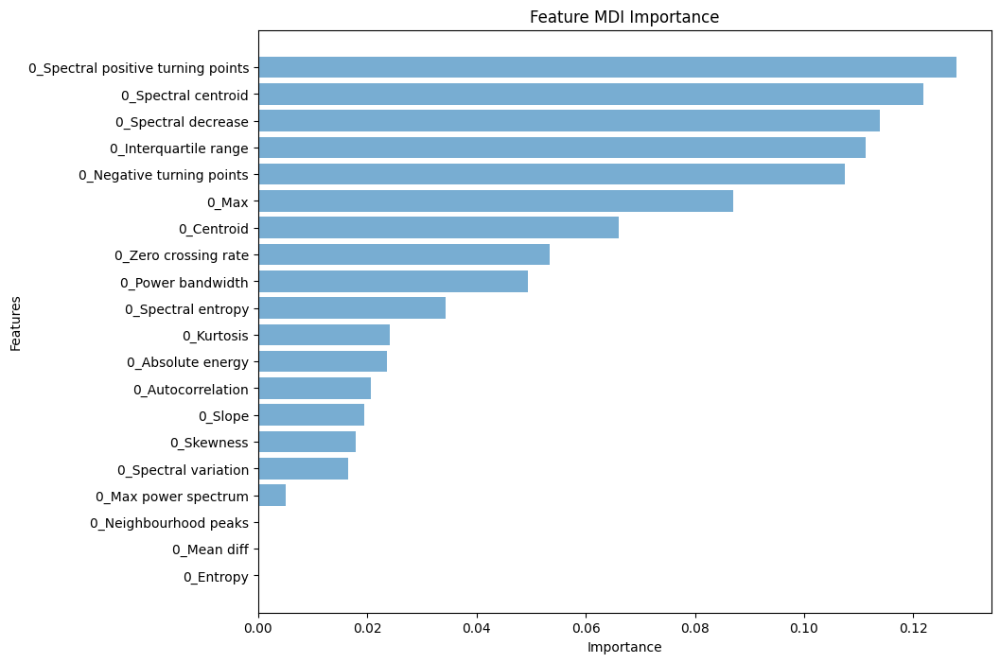

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 43.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 43.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 43.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.005, n=17, Auc: 42.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=16, Auc: 39.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=15, Auc: 42.40%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=14, Auc: 41.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=13, Auc: 42.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=12, Auc: 43.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=11, Auc: 42.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=10, Auc: 42.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=9, Auc: 43.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=8, Auc: 43.40%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=7, Auc: 43.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=6, Auc: 42.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.107, n=5, Auc: 69.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.111, n=4, Auc: 65.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.114, n=3, Auc: 69.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.122, n=2, Auc: 65.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.128, n=1, Auc: 65.17%
    Threshold  Num Features       AUC
0    0.000000            20  0.433029
1    0.000000            20  0.433029
2    0.000000            20  0.433029
3    0.005053            17  0.426382
4    0.016460            16  0.396543
5    0.017913            15  0.424018
6    0.019488            14  0.418578
7    0.020576            13  0.426184
8    0.023663            12  0.436662
9    0.024184            11  0.423560
10   0.034283            10  0.424631
11   0.049475             9  0.439106
12   0.053446             8  0.433996
13   0.066014             7  0.436199
14   0.087037             6  0.424875
15   0.107486             5  0.696396
16   0.111257             4  0.654815
17   0.113880             3  0.694447
18   0.121905             2  0.652162
19   0.127880             1  0.651672
Processing patient 29 with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:05:30,496] A new study created in memory with name: no-name-a7b289c4-d5d1-41e5-9901-1457f5c5a0af


7806
7806
7782
7782


[I 2024-07-18 19:05:31,024] Trial 0 finished with value: 0.7573422705001652 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7573422705001652.
[I 2024-07-18 19:05:31,636] Trial 1 finished with value: 0.7386911432964064 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.7573422705001652.
[I 2024-07-18 19:05:32,125] Trial 2 finished with value: 0.751890347285084 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, '

Best parameters found by Optuna: {'lambda': 1.0706168261667734, 'alpha': 7.942485951448751e-05, 'max_depth': 10, 'eta': 0.005908568126866598, 'gamma': 0.1358050078333505, 'subsample': 0.9959782326816241, 'colsample_bytree': 0.9417385035161194, 'grow_policy': 'depthwise', 'min_child_weight': 8}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.88      0.84      0.86     50759
         1.0       0.85      0.88      0.86     50759

    accuracy                           0.86    101518
   macro avg       0.86      0.86      0.86    101518
weighted avg       0.86      0.86      0.86    101518

Validation classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.81      0.90      7733
         1.0       0.03      0.61      0.06        72

    accuracy                           0.81      7805
   macro avg       0.51      0.71      0.48      7805
weighted avg       0.99      0.81      0.89

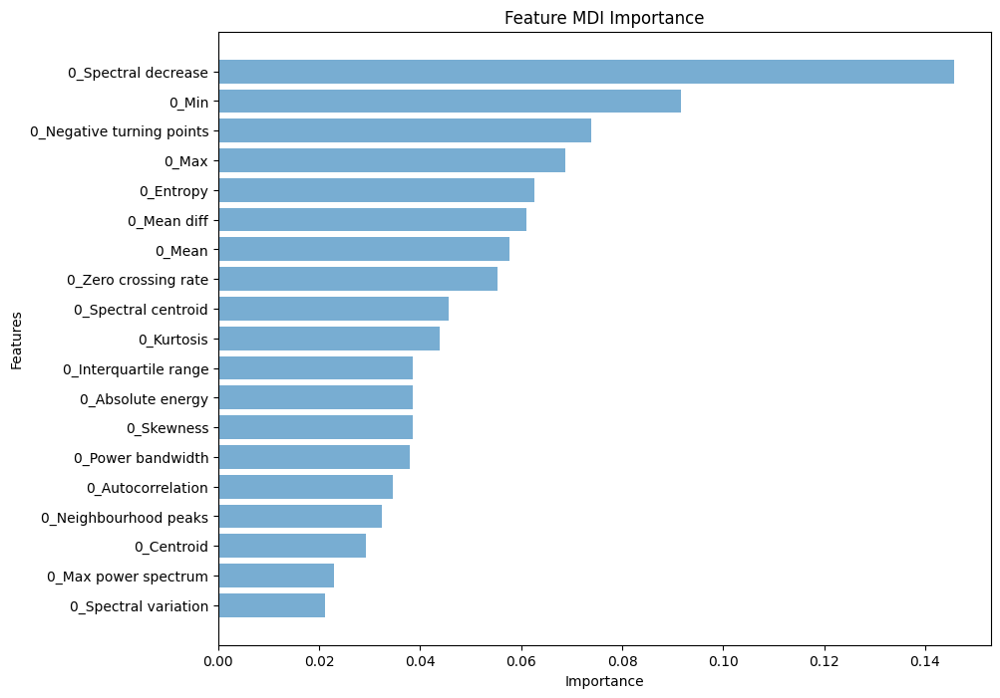

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=19, Auc: 85.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=18, Auc: 82.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=17, Auc: 84.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=16, Auc: 82.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=15, Auc: 82.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=14, Auc: 83.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=13, Auc: 83.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=12, Auc: 83.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=11, Auc: 78.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=10, Auc: 76.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=9, Auc: 83.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=8, Auc: 85.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=7, Auc: 81.92%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=6, Auc: 83.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=5, Auc: 85.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=4, Auc: 84.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=3, Auc: 72.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.092, n=2, Auc: 70.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.146, n=1, Auc: 71.69%
    Threshold  Num Features       AUC
0    0.021107            19  0.856208
1    0.022898            18  0.826015
2    0.029249            17  0.845206
3    0.032333            16  0.821609
4    0.034586            15  0.829664
5    0.037927            14  0.834650
6    0.038493            13  0.836767
7    0.038494            12  0.831922
8    0.038617            11  0.789349
9    0.043907            10  0.768214
10   0.045654             9  0.838080
11   0.055387             8  0.851139
12   0.057638             7  0.819244
13   0.061021             6  0.833676
14   0.062529             5  0.855900
15   0.068819             4  0.849672
16   0.073878             3  0.728302
17   0.091709             2  0.707996
18   0.145751             1  0.716908
Processing patient 29 with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:07:20,194] A new study created in memory with name: no-name-775abb63-0f1a-4a19-b1c5-0dd84b2ca26c


7806
7806
7686
7686


[I 2024-07-18 19:07:20,723] Trial 0 finished with value: 0.33554427633375006 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.33554427633375006.
[I 2024-07-18 19:07:21,340] Trial 1 finished with value: 0.34641399772978715 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.34641399772978715.
[I 2024-07-18 19:07:21,856] Trial 2 finished with value: 0.3638770349296665 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.00067890532716984

Best parameters found by Optuna: {'lambda': 1.5953402476832574, 'alpha': 0.0033081153079483755, 'max_depth': 3, 'eta': 0.04513947581687303, 'gamma': 0.10151352966743778, 'subsample': 0.8095839387020463, 'colsample_bytree': 0.8991265067092078, 'grow_policy': 'lossguide', 'min_child_weight': 3}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.79      0.56      0.66     50817
         1.0       0.66      0.85      0.74     50817

    accuracy                           0.71    101634
   macro avg       0.72      0.71      0.70    101634
weighted avg       0.72      0.71      0.70    101634

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.63      0.77      7733
         1.0       0.00      0.12      0.01        72

    accuracy                           0.62      7805
   macro avg       0.50      0.38      0.39      7805
weighted avg       0.98      0.62      0.76 

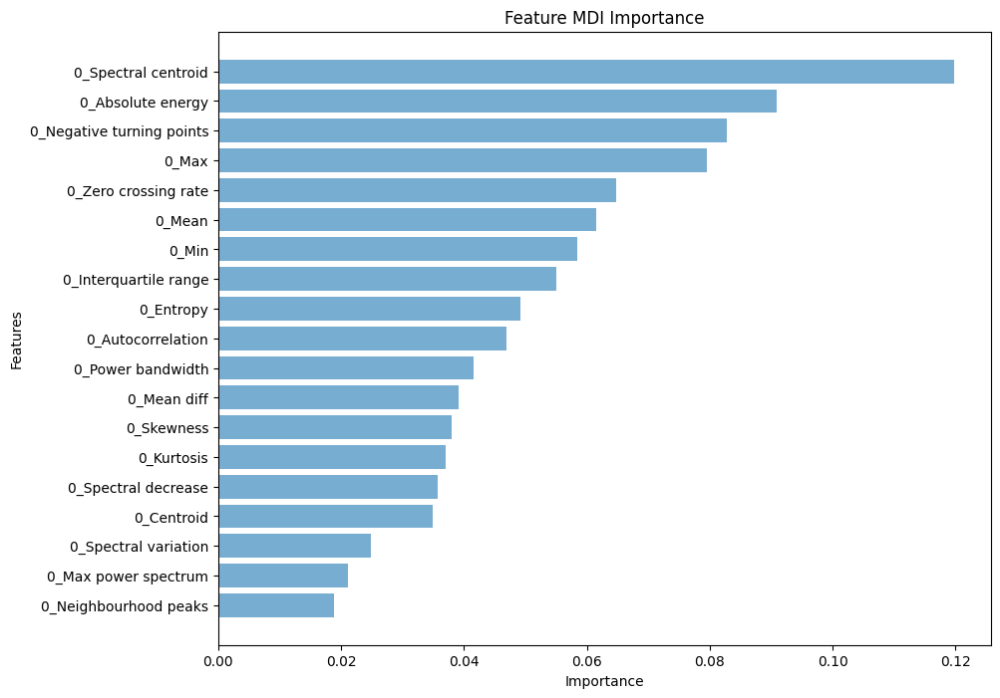

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=19, Auc: 41.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=18, Auc: 40.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=17, Auc: 41.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=16, Auc: 40.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=15, Auc: 41.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=14, Auc: 41.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=13, Auc: 41.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=12, Auc: 41.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=11, Auc: 40.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=10, Auc: 41.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=9, Auc: 41.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=8, Auc: 42.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=7, Auc: 41.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=6, Auc: 38.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=5, Auc: 37.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.080, n=4, Auc: 33.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.083, n=3, Auc: 26.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.091, n=2, Auc: 37.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.120, n=1, Auc: 66.40%
    Threshold  Num Features       AUC
0    0.018839            19  0.417701
1    0.021073            18  0.402429
2    0.024901            17  0.410009
3    0.034945            16  0.404752
4    0.035637            15  0.416823
5    0.037070            14  0.410700
6    0.038062            13  0.414260
7    0.039048            12  0.415382
8    0.041599            11  0.402210
9    0.046855            10  0.410439
10   0.049172             9  0.415972
11   0.054985             8  0.422114
12   0.058430             7  0.415948
13   0.061497             6  0.381951
14   0.064770             5  0.378839
15   0.079610             4  0.330177
16   0.082828             3  0.266957
17   0.090905             2  0.373216
18   0.119775             1  0.663977
Processing patient 29 with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:08:01,523] A new study created in memory with name: no-name-9789a0dc-24a0-4959-862a-71f38d0d09a0


7798
7798
7774
7774


[I 2024-07-18 19:08:02,043] Trial 0 finished with value: 0.6544608120663125 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6544608120663125.
[I 2024-07-18 19:08:02,658] Trial 1 finished with value: 0.6552751103272072 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6552751103272072.
[I 2024-07-18 19:08:03,112] Trial 2 finished with value: 0.7323576270940394 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.451640012320744, 'alpha': 0.047453128102715375, 'max_depth': 6, 'eta': 0.001097988452417185, 'gamma': 0.15131428221394005, 'subsample': 0.9636370441256948, 'colsample_bytree': 0.9999660544468912, 'grow_policy': 'lossguide', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.76      0.75      0.75     42648
         1.0       0.75      0.76      0.76     42648

    accuracy                           0.76     85296
   macro avg       0.76      0.76      0.76     85296
weighted avg       0.76      0.76      0.76     85296

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.75      0.85      7654
         1.0       0.04      0.54      0.07       144

    accuracy                           0.75      7798
   macro avg       0.51      0.65      0.46      7798
weighted avg       0.97      0.75      0.84  

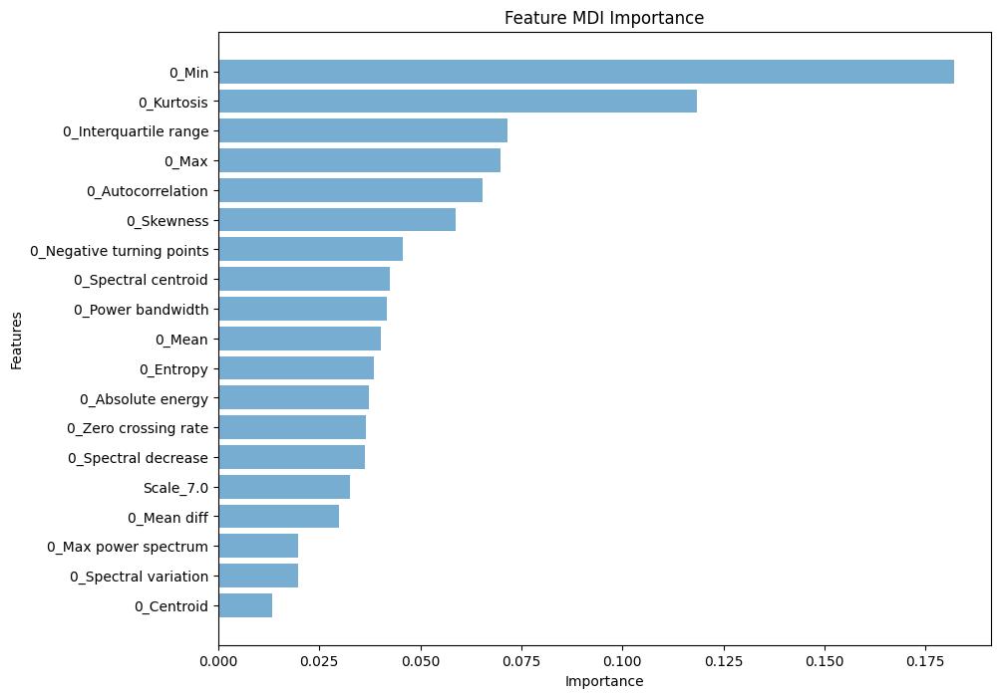

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=19, Auc: 76.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=18, Auc: 75.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=17, Auc: 76.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=16, Auc: 72.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=15, Auc: 75.05%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=14, Auc: 75.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=13, Auc: 74.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=12, Auc: 73.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=11, Auc: 73.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=10, Auc: 73.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=9, Auc: 73.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=8, Auc: 74.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=7, Auc: 67.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=6, Auc: 70.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=5, Auc: 72.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=4, Auc: 79.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.072, n=3, Auc: 76.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.118, n=2, Auc: 79.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.182, n=1, Auc: 70.68%
    Threshold  Num Features       AUC
0    0.013460            19  0.764602
1    0.019679            18  0.755083
2    0.019764            17  0.769437
3    0.029887            16  0.722116
4    0.032685            15  0.750480
5    0.036382            14  0.751277
6    0.036568            13  0.748239
7    0.037184            12  0.733846
8    0.038598            11  0.731268
9    0.040167            10  0.734991
10   0.041787             9  0.730690
11   0.042391             8  0.740151
12   0.045643             7  0.676412
13   0.058646             6  0.700268
14   0.065336             5  0.728389
15   0.069772             4  0.794089
16   0.071553             3  0.765734
17   0.118415             2  0.791283
18   0.182083             1  0.706811
Processing patient 29 with window size 144 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:10:02,612] A new study created in memory with name: no-name-f347adbd-db1c-4c12-a0bb-39a8a9318f00


7798
7798
7678
7678


[I 2024-07-18 19:10:03,142] Trial 0 finished with value: 0.6003424135528265 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6003424135528265.
[I 2024-07-18 19:10:03,732] Trial 1 finished with value: 0.6430130033678831 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6430130033678831.
[I 2024-07-18 19:10:04,196] Trial 2 finished with value: 0.49749767732195216 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484,

Best parameters found by Optuna: {'lambda': 1.7079251727479252, 'alpha': 0.00024604229580184176, 'max_depth': 3, 'eta': 0.11948328168545447, 'gamma': 0.1632244685176524, 'subsample': 0.8645035840204937, 'colsample_bytree': 0.8856351733429728, 'grow_policy': 'lossguide', 'min_child_weight': 2}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.80      0.72      0.76     42744
         1.0       0.75      0.82      0.78     42744

    accuracy                           0.77     85488
   macro avg       0.77      0.77      0.77     85488
weighted avg       0.77      0.77      0.77     85488

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.68      0.80      7654
         1.0       0.02      0.40      0.04       144

    accuracy                           0.67      7798
   macro avg       0.50      0.54      0.42      7798
weighted avg       0.97      0.67      0.79 

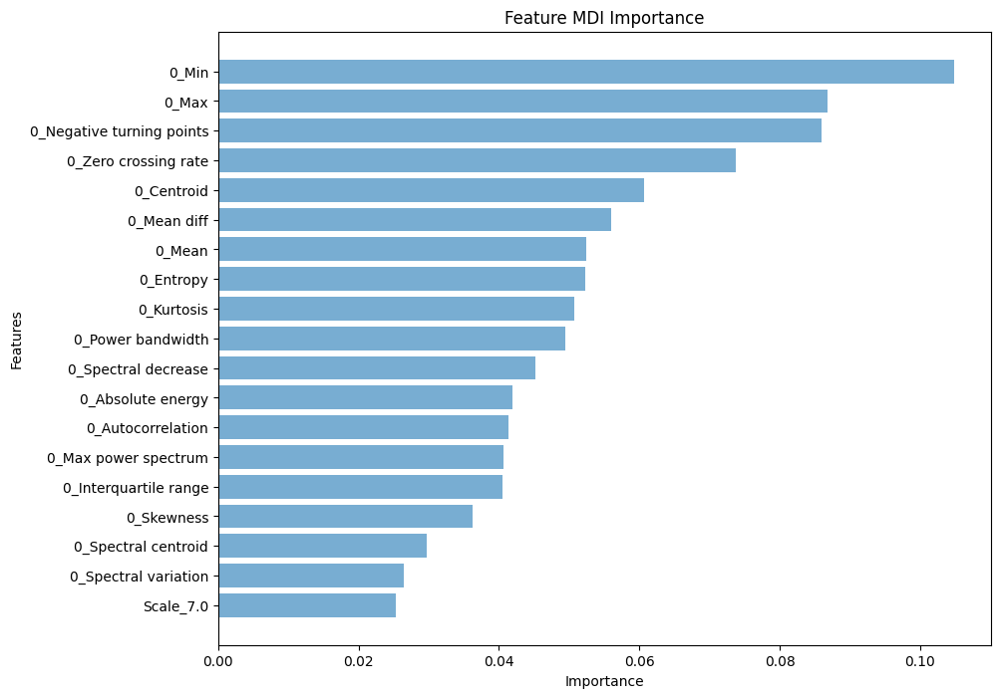

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=19, Auc: 66.22%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=18, Auc: 61.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=17, Auc: 60.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=16, Auc: 65.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=15, Auc: 65.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=14, Auc: 66.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=13, Auc: 63.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=12, Auc: 54.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=11, Auc: 61.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=10, Auc: 62.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=9, Auc: 61.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=8, Auc: 52.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=7, Auc: 59.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=6, Auc: 63.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=5, Auc: 58.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=4, Auc: 58.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.086, n=3, Auc: 50.66%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.087, n=2, Auc: 60.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.105, n=1, Auc: 85.65%
    Threshold  Num Features       AUC
0    0.025327            19  0.662215
1    0.026396            18  0.612432
2    0.029704            17  0.608910
3    0.036219            16  0.657006
4    0.040450            15  0.655456
5    0.040595            14  0.662685
6    0.041320            13  0.630895
7    0.041872            12  0.544541
8    0.045210            11  0.618291
9    0.049436            10  0.620215
10   0.050778             9  0.617063
11   0.052232             8  0.524507
12   0.052385             7  0.594879
13   0.055998             6  0.638732
14   0.060693             5  0.588935
15   0.073741             4  0.583845
16   0.086023             3  0.506619
17   0.086766             2  0.605441
18   0.104855             1  0.856454
Processing patient 29 with window size 288 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:10:40,187] A new study created in memory with name: no-name-86587fe6-3809-40d5-a1de-75c528d38e89


7784
7784
7760
7760


[I 2024-07-18 19:10:40,662] Trial 0 finished with value: 0.6097224075062255 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6097224075062255.
[I 2024-07-18 19:10:41,205] Trial 1 finished with value: 0.666396152021819 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.666396152021819.
[I 2024-07-18 19:10:41,626] Trial 2 finished with value: 0.7228049404126646 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'g

Best parameters found by Optuna: {'lambda': 1.7205257663720592, 'alpha': 0.00016222218591906344, 'max_depth': 4, 'eta': 1.7478898852662905e-05, 'gamma': 0.1047787134917806, 'subsample': 0.809880077012769, 'colsample_bytree': 0.8367897704288052, 'grow_policy': 'depthwise', 'min_child_weight': 1}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.76      0.58      0.66     32383
         1.0       0.66      0.82      0.73     32383

    accuracy                           0.70     64766
   macro avg       0.71      0.70      0.69     64766
weighted avg       0.71      0.70      0.69     64766

Validation classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.68      0.81      7496
         1.0       0.11      0.99      0.19       288

    accuracy                           0.69      7784
   macro avg       0.55      0.83      0.50      7784
weighted avg       0.97      0.69      0.7

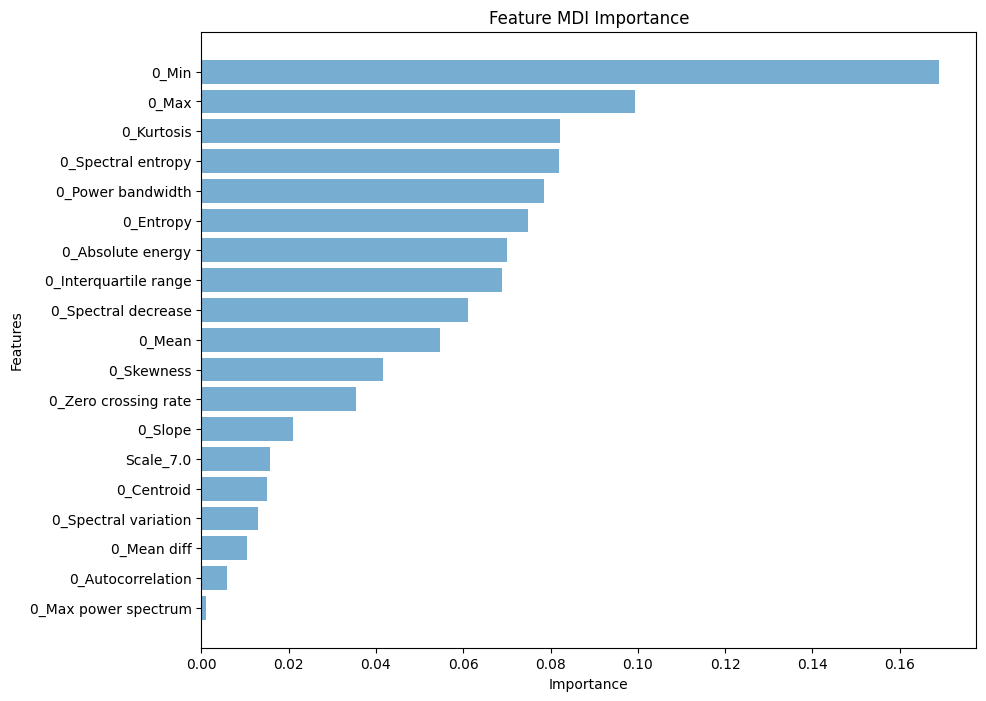

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.001, n=19, Auc: 80.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.006, n=18, Auc: 77.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=17, Auc: 78.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=16, Auc: 78.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=15, Auc: 80.06%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=14, Auc: 79.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=13, Auc: 75.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=12, Auc: 75.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=11, Auc: 74.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=10, Auc: 74.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=9, Auc: 71.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=8, Auc: 71.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=7, Auc: 69.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.075, n=6, Auc: 69.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.078, n=5, Auc: 69.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=4, Auc: 69.54%
Thresh=0.082, n=3, Auc: 77.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.099, n=2, Auc: 72.78%
Thresh=0.169, n=1, Auc: 60.23%
    Threshold  Num Features       AUC
0    0.001101            19  0.800124
1    0.006000            18  0.775944
2    0.010534            17  0.785394
3    0.013104            16  0.784532
4    0.014976            15  0.800614
5    0.015776            14  0.794862
6    0.020988            13  0.754400
7    0.035358            12  0.754103
8    0.041521            11  0.742332
9    0.054622            10  0.745764
10   0.061155             9  0.718766
11   0.068828             8  0.717320
12   0.070040             7  0.692927
13   0.074947             6  0.692441
14   0.078420             5  0.691722
15   0.082041             4  0.695368
16   0.082080             3  0.776308
17   0.099447             2  0.727789
18   0.169063             1  0.602265
Processing patient 29 with window size 288 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:11:42,151] A new study created in memory with name: no-name-1f690333-f100-40d3-9530-8a7546b020b6


7784
7784
7664
7664


[I 2024-07-18 19:11:42,631] Trial 0 finished with value: 0.7064005895736986 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7064005895736986.
[I 2024-07-18 19:11:43,188] Trial 1 finished with value: 0.7263579927813352 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.7263579927813352.
[I 2024-07-18 19:11:43,610] Trial 2 finished with value: 0.7478808142120241 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.7058694215198882, 'alpha': 8.092415184067226e-05, 'max_depth': 3, 'eta': 0.0159520368054375, 'gamma': 0.12068489027018278, 'subsample': 0.8684837155057659, 'colsample_bytree': 0.9010785702332925, 'grow_policy': 'depthwise', 'min_child_weight': 10}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.77      0.71      0.74     32479
         1.0       0.73      0.79      0.76     32479

    accuracy                           0.75     64958
   macro avg       0.75      0.75      0.75     64958
weighted avg       0.75      0.75      0.75     64958

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.63      0.77      7496
         1.0       0.07      0.69      0.12       288

    accuracy                           0.64      7784
   macro avg       0.52      0.66      0.45      7784
weighted avg       0.95      0.64      0.75 

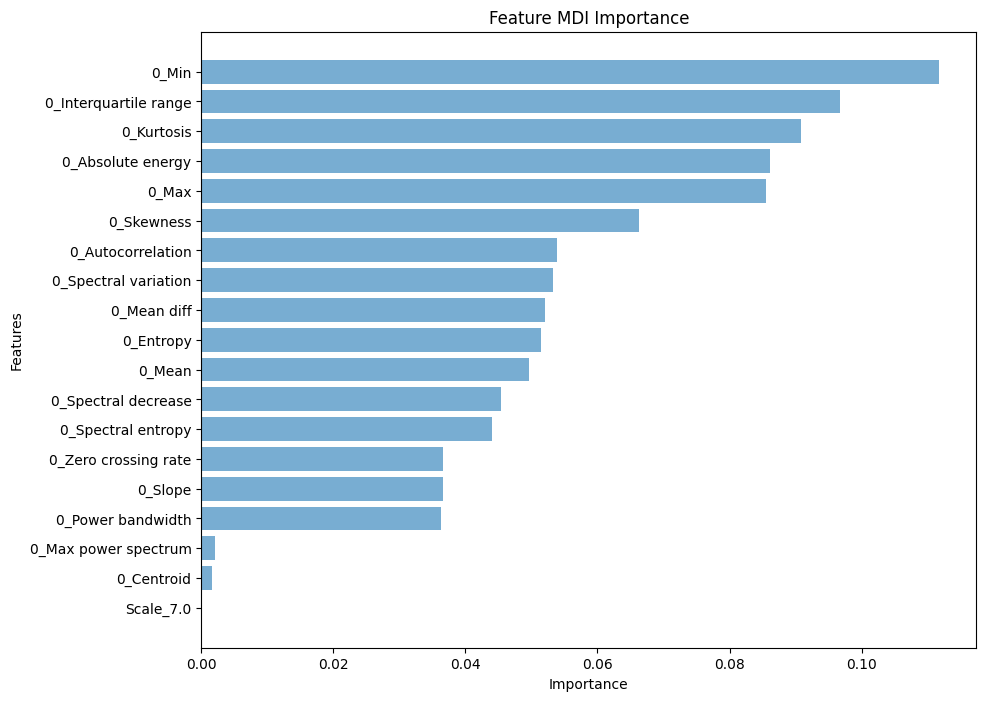

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=19, Auc: 81.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.002, n=18, Auc: 80.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.002, n=17, Auc: 80.85%
Thresh=0.036, n=16, Auc: 80.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=15, Auc: 80.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=14, Auc: 78.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=13, Auc: 79.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=12, Auc: 78.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=11, Auc: 77.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=10, Auc: 78.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=9, Auc: 80.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=8, Auc: 79.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=7, Auc: 79.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=6, Auc: 78.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.085, n=5, Auc: 76.50%
Thresh=0.086, n=4, Auc: 73.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.091, n=3, Auc: 78.55%
Thresh=0.097, n=2, Auc: 67.59%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.112, n=1, Auc: 74.86%
    Threshold  Num Features       AUC
0    0.000000            19  0.812333
1    0.001629            18  0.803077
2    0.002008            17  0.808491
3    0.036272            16  0.805377
4    0.036597            15  0.807493
5    0.036613            14  0.781205
6    0.043976            13  0.795640
7    0.045464            12  0.780867
8    0.049655            11  0.778281
9    0.051401            10  0.789450
10   0.052128             9  0.805041
11   0.053218             8  0.790666
12   0.053807             7  0.794352
13   0.066302             6  0.784791
14   0.085462             5  0.764953
15   0.086113             4  0.736403
16   0.090857             3  0.785487
17   0.096713             2  0.675878
18   0.111786             1  0.748628
Processing patient 30 with window size 24 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:12:41,023] A new study created in memory with name: no-name-eaf6dcd3-cf36-4506-af51-c8c8df722d69


13538
13538
13514
13514


[I 2024-07-18 19:12:41,673] Trial 0 finished with value: 0.75856374903048 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.75856374903048.
[I 2024-07-18 19:12:42,473] Trial 1 finished with value: 0.7553328753898707 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.75856374903048.
[I 2024-07-18 19:12:43,040] Trial 2 finished with value: 0.7296947456144693 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'gamma

Best parameters found by Optuna: {'lambda': 1.9947283540364318, 'alpha': 75.04843147446566, 'max_depth': 4, 'eta': 4.330842493189208e-05, 'gamma': 0.12036103277128593, 'subsample': 0.8013876457844251, 'colsample_bytree': 0.978993982395499, 'grow_policy': 'lossguide', 'min_child_weight': 2}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.66      0.78      0.71    107089
         1.0       0.73      0.59      0.66    107089

    accuracy                           0.69    214178
   macro avg       0.69      0.69      0.68    214178
weighted avg       0.69      0.69      0.68    214178

Validation classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.74      0.85     13466
         1.0       0.02      0.83      0.03        72

    accuracy                           0.74     13538
   macro avg       0.51      0.79      0.44     13538
weighted avg       0.99      0.74      0.85    

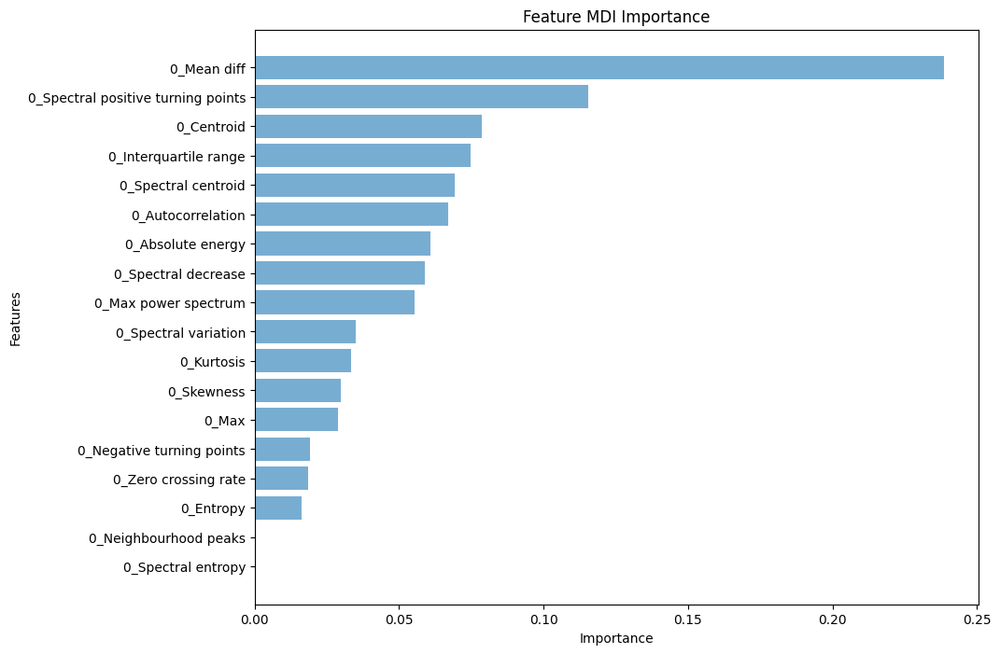

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 83.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 83.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=16, Auc: 78.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=15, Auc: 80.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=14, Auc: 80.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=13, Auc: 78.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=12, Auc: 78.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=11, Auc: 77.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=10, Auc: 77.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.055, n=9, Auc: 76.76%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=8, Auc: 77.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=7, Auc: 79.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.067, n=6, Auc: 80.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.069, n=5, Auc: 80.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.075, n=4, Auc: 81.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.078, n=3, Auc: 82.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.116, n=2, Auc: 66.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.239, n=1, Auc: 76.67%
    Threshold  Num Features       AUC
0    0.000000            18  0.833151
1    0.000000            18  0.833151
2    0.016158            16  0.787739
3    0.018581            15  0.808105
4    0.019082            14  0.807565
5    0.028838            13  0.787665
6    0.029923            12  0.781119
7    0.033436            11  0.775731
8    0.035116            10  0.771958
9    0.055412             9  0.767620
10   0.058800             8  0.774149
11   0.060852             7  0.795361
12   0.067103             6  0.808950
13   0.069354             5  0.803761
14   0.074800             4  0.810088
15   0.078493             3  0.820208
16   0.115522             2  0.666171
17   0.238531             1  0.766698
Processing patient 30 with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:14:19,984] A new study created in memory with name: no-name-d9a2a095-6b02-4154-baf0-d6643958f02a


13538
13538
13418
13418


[I 2024-07-18 19:14:20,706] Trial 0 finished with value: 0.6426205092661352 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6426205092661352.
[I 2024-07-18 19:14:21,630] Trial 1 finished with value: 0.6749607035001732 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6749607035001732.
[I 2024-07-18 19:14:22,349] Trial 2 finished with value: 0.5876296475073023 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.193487196618508, 'alpha': 0.00047243078783997693, 'max_depth': 3, 'eta': 0.9942536635358894, 'gamma': 0.14475763445393652, 'subsample': 0.9569281201999235, 'colsample_bytree': 0.8556513775113843, 'grow_policy': 'depthwise', 'min_child_weight': 6}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.87      0.89    107113
         1.0       0.88      0.91      0.89    107113

    accuracy                           0.89    214226
   macro avg       0.89      0.89      0.89    214226
weighted avg       0.89      0.89      0.89    214226

Validation classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96     13466
         1.0       0.02      0.21      0.03        72

    accuracy                           0.93     13538
   macro avg       0.51      0.57      0.50     13538
weighted avg       0.99      0.93      0.96  

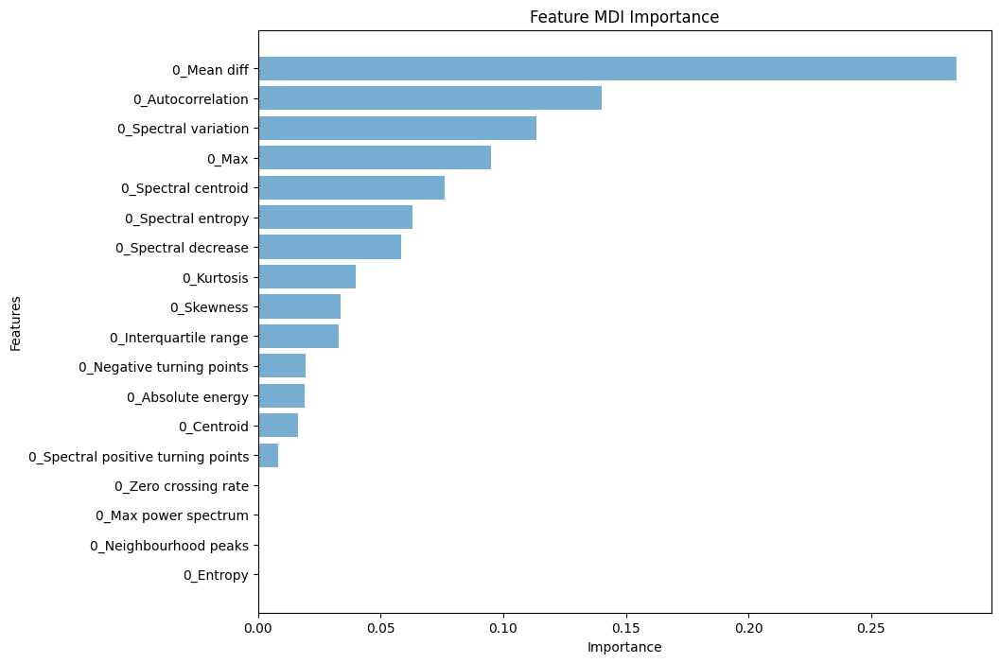

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=18, Auc: 75.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=17, Auc: 66.85%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=16, Auc: 66.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=15, Auc: 66.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.008, n=14, Auc: 70.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=13, Auc: 74.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=12, Auc: 71.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=11, Auc: 68.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=10, Auc: 74.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=9, Auc: 72.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=8, Auc: 75.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=7, Auc: 71.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=6, Auc: 71.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=5, Auc: 73.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.095, n=4, Auc: 62.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.113, n=3, Auc: 53.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.140, n=2, Auc: 44.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.285, n=1, Auc: 51.62%
    Threshold  Num Features       AUC
0    0.000020            18  0.750919
1    0.000040            17  0.668467
2    0.000116            16  0.666394
3    0.000247            15  0.669335
4    0.008366            14  0.699970
5    0.016226            13  0.745695
6    0.018807            12  0.718361
7    0.019222            11  0.681264
8    0.033053            10  0.744147
9    0.033806             9  0.720300
10   0.039801             8  0.749955
11   0.058246             7  0.717699
12   0.063013             6  0.718036
13   0.075958             5  0.738800
14   0.094869             4  0.623517
15   0.113409             3  0.535340
16   0.140063             2  0.448440
17   0.284737             1  0.516185
Processing patient 30 with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:15:25,926] A new study created in memory with name: no-name-a7b75db6-4c28-4cb1-8982-b10e9c138437


13539
13539
13515
13515


[I 2024-07-18 19:15:26,580] Trial 0 finished with value: 0.5346436832418667 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5346436832418667.
[I 2024-07-18 19:15:27,373] Trial 1 finished with value: 0.6301064237935579 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6301064237935579.
[I 2024-07-18 19:15:27,950] Trial 2 finished with value: 0.5987806649540999 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.1584339319140882, 'alpha': 0.11971966036781745, 'max_depth': 4, 'eta': 1.032826720479002e-05, 'gamma': 0.19522833756565627, 'subsample': 0.9868545193597756, 'colsample_bytree': 0.911971540633089, 'grow_policy': 'lossguide', 'min_child_weight': 9}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.76      0.64      0.69    104772
         1.0       0.69      0.80      0.74    104772

    accuracy                           0.72    209544
   macro avg       0.73      0.72      0.72    209544
weighted avg       0.73      0.72      0.72    209544

Validation classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.55      0.71     13322
         1.0       0.03      0.86      0.06       216

    accuracy                           0.56     13538
   macro avg       0.51      0.71      0.38     13538
weighted avg       0.98      0.56      0.70  

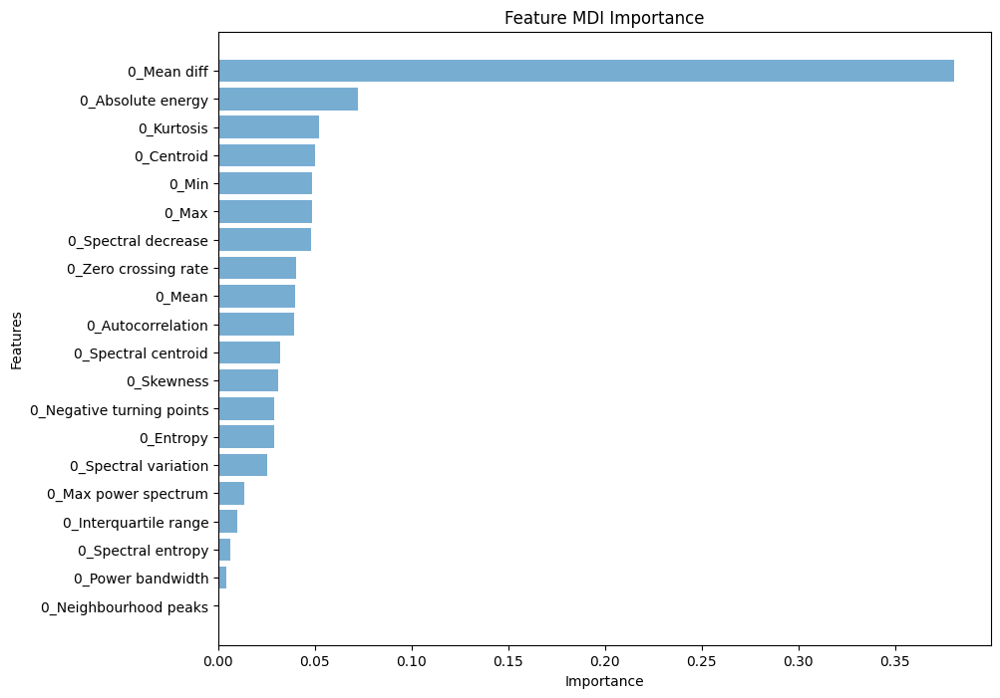

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 76.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.004, n=19, Auc: 76.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.006, n=18, Auc: 75.66%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=17, Auc: 75.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.013, n=16, Auc: 74.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=15, Auc: 75.50%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=14, Auc: 71.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=13, Auc: 75.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=12, Auc: 76.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=11, Auc: 76.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=10, Auc: 75.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=9, Auc: 74.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=8, Auc: 41.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=7, Auc: 41.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=6, Auc: 50.40%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=5, Auc: 42.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=4, Auc: 83.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=3, Auc: 76.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.072, n=2, Auc: 79.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.380, n=1, Auc: 80.99%
    Threshold  Num Features       AUC
0    0.000000            20  0.767428
1    0.004266            19  0.762963
2    0.006275            18  0.756583
3    0.010075            17  0.752400
4    0.013484            16  0.742432
5    0.025493            15  0.755039
6    0.028786            14  0.717100
7    0.028923            13  0.757867
8    0.031159            12  0.764548
9    0.032236            11  0.767949
10   0.039197            10  0.755449
11   0.039791             9  0.746783
12   0.040485             8  0.415640
13   0.048094             7  0.417811
14   0.048355             6  0.503995
15   0.048611             5  0.427898
16   0.050117             4  0.832810
17   0.052072             3  0.767402
18   0.072117             2  0.799547
19   0.380465             1  0.809949
Processing patient 30 with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:17:32,417] A new study created in memory with name: no-name-466a77e4-719c-484c-aef9-2316d62aed89


13539
13539
13419
13419


[I 2024-07-18 19:17:33,086] Trial 0 finished with value: 0.6214485437621978 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6214485437621978.
[I 2024-07-18 19:17:33,880] Trial 1 finished with value: 0.683360543962368 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.683360543962368.
[I 2024-07-18 19:17:34,434] Trial 2 finished with value: 0.686655532202372 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'ga

Best parameters found by Optuna: {'lambda': 1.014746269644107, 'alpha': 84.50737753730246, 'max_depth': 3, 'eta': 0.00013316088100666373, 'gamma': 0.18028292079224073, 'subsample': 0.6502945029896838, 'colsample_bytree': 0.5021345958158535, 'grow_policy': 'depthwise', 'min_child_weight': 10}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.69      0.70      0.69    104833
         1.0       0.69      0.68      0.69    104833

    accuracy                           0.69    209666
   macro avg       0.69      0.69      0.69    209666
weighted avg       0.69      0.69      0.69    209666

Validation classification report:
              precision    recall  f1-score   support

         0.0       1.00      0.64      0.78     13322
         1.0       0.04      0.97      0.08       216

    accuracy                           0.65     13538
   macro avg       0.52      0.80      0.43     13538
weighted avg       0.98      0.65      0.77  

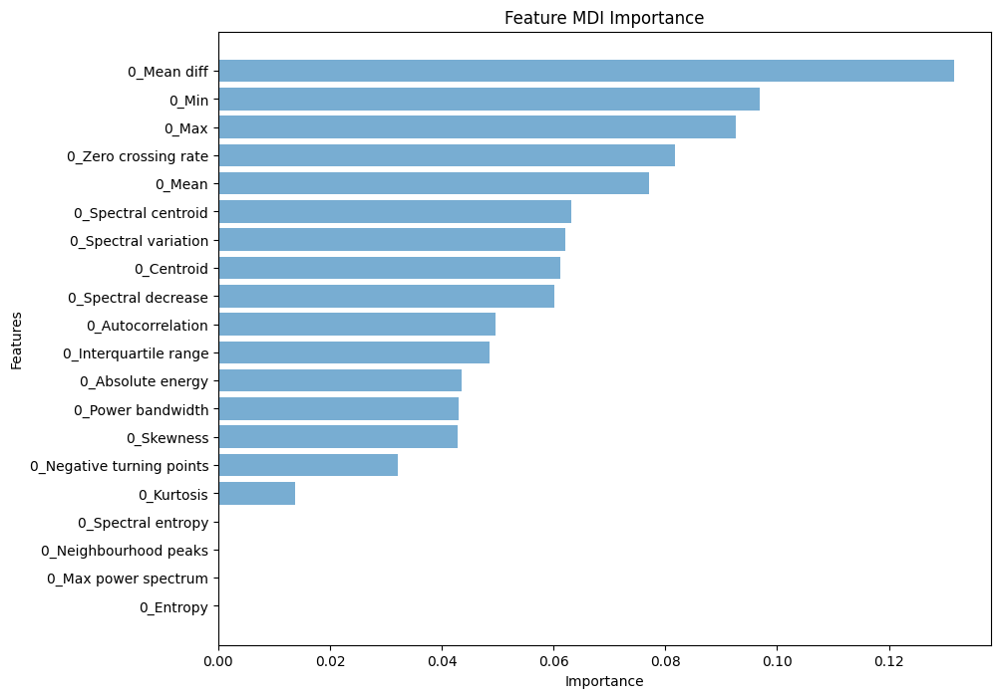

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 88.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 88.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 88.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 88.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=16, Auc: 83.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=15, Auc: 87.48%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=14, Auc: 82.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=13, Auc: 85.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=12, Auc: 81.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=11, Auc: 84.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=10, Auc: 83.02%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=9, Auc: 81.77%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=8, Auc: 87.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=7, Auc: 83.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=6, Auc: 84.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=5, Auc: 82.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=4, Auc: 82.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.093, n=3, Auc: 77.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.097, n=2, Auc: 58.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.132, n=1, Auc: 78.48%
    Threshold  Num Features       AUC
0    0.000000            20  0.883615
1    0.000000            20  0.883615
2    0.000000            20  0.883615
3    0.000000            20  0.883615
4    0.013838            16  0.835618
5    0.032158            15  0.874835
6    0.042836            14  0.822991
7    0.043095            13  0.859453
8    0.043544            12  0.814519
9    0.048468            11  0.844441
10   0.049588            10  0.830156
11   0.060054             9  0.817679
12   0.061183             8  0.878200
13   0.062042             7  0.832903
14   0.063250             6  0.842396
15   0.077054             5  0.825216
16   0.081755             4  0.820991
17   0.092615             3  0.777807
18   0.096836             2  0.585098
19   0.131683             1  0.784819
Processing patient 30 with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:18:32,141] A new study created in memory with name: no-name-ee7fce81-4be2-4b70-8869-f8b066a3f2b4


13539
13539
13515
13515


[I 2024-07-18 19:18:32,775] Trial 0 finished with value: 0.4556915019131752 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.4556915019131752.
[I 2024-07-18 19:18:33,514] Trial 1 finished with value: 0.48964894860143215 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.48964894860143215.
[I 2024-07-18 19:18:34,047] Trial 2 finished with value: 0.35739673940688743 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.000678905327169848

Best parameters found by Optuna: {'lambda': 1.9452508662447723, 'alpha': 0.07042202777973694, 'max_depth': 9, 'eta': 0.8420716720942751, 'gamma': 0.154663759075469, 'subsample': 0.901798263896001, 'colsample_bytree': 0.714614023052472, 'grow_policy': 'lossguide', 'min_child_weight': 6}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    101399
         1.0       1.00      1.00      1.00    101399

    accuracy                           1.00    202798
   macro avg       1.00      1.00      1.00    202798
weighted avg       1.00      1.00      1.00    202798

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98     13106
         1.0       0.00      0.00      0.00       432

    accuracy                           0.96     13538
   macro avg       0.48      0.50      0.49     13538
weighted avg       0.94      0.96      0.95     135

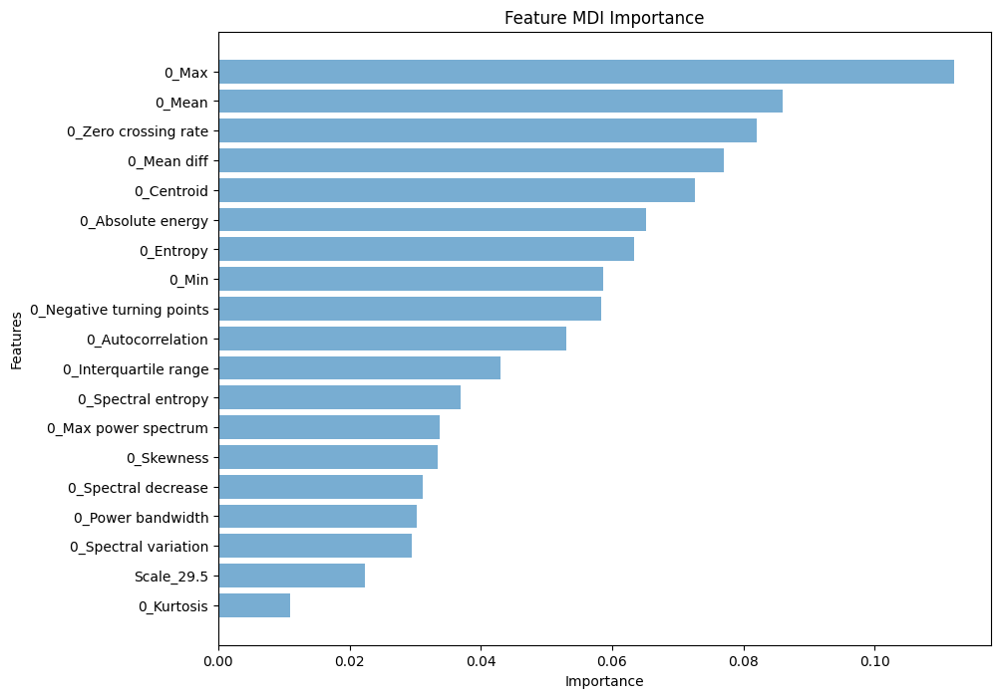

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=19, Auc: 68.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=18, Auc: 66.80%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=17, Auc: 52.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=16, Auc: 60.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=15, Auc: 61.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=14, Auc: 68.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=13, Auc: 59.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=12, Auc: 63.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=11, Auc: 57.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=10, Auc: 63.06%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=9, Auc: 60.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=8, Auc: 55.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=7, Auc: 53.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.065, n=6, Auc: 48.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.073, n=5, Auc: 52.12%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=4, Auc: 54.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=3, Auc: 47.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.086, n=2, Auc: 50.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.112, n=1, Auc: 59.38%
    Threshold  Num Features       AUC
0    0.010973            19  0.685421
1    0.022345            18  0.667986
2    0.029516            17  0.521109
3    0.030281            16  0.604232
4    0.031156            15  0.610906
5    0.033487            14  0.689030
6    0.033754            13  0.599928
7    0.036994            12  0.639807
8    0.043071            11  0.573177
9    0.053078            10  0.630629
10   0.058377             9  0.605421
11   0.058675             8  0.559453
12   0.063298             7  0.530420
13   0.065186             6  0.483250
14   0.072630             5  0.521250
15   0.077085             4  0.540857
16   0.081977             3  0.475218
17   0.085988             2  0.509445
18   0.112129             1  0.593809
Processing patient 30 with window size 144 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:21:22,521] A new study created in memory with name: no-name-4ef27ce1-5570-4ab1-a4ac-79b87fb6f2c3


13539
13539
13419
13419


[I 2024-07-18 19:21:23,201] Trial 0 finished with value: 0.5232666618625339 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5232666618625339.
[I 2024-07-18 19:21:23,913] Trial 1 finished with value: 0.5192416111365448 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5232666618625339.
[I 2024-07-18 19:21:24,480] Trial 2 finished with value: 0.5230883614233797 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.0247749562692912, 'alpha': 0.025558395398214088, 'max_depth': 10, 'eta': 0.33280022904422163, 'gamma': 0.10967669752265453, 'subsample': 0.7302440206546731, 'colsample_bytree': 0.5801035168121987, 'grow_policy': 'lossguide', 'min_child_weight': 4}
Train classification report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    101495
         1.0       1.00      1.00      1.00    101495

    accuracy                           1.00    202990
   macro avg       1.00      1.00      1.00    202990
weighted avg       1.00      1.00      1.00    202990

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98     13106
         1.0       0.00      0.00      0.00       432

    accuracy                           0.96     13538
   macro avg       0.48      0.50      0.49     13538
weighted avg       0.94      0.96      0.95 

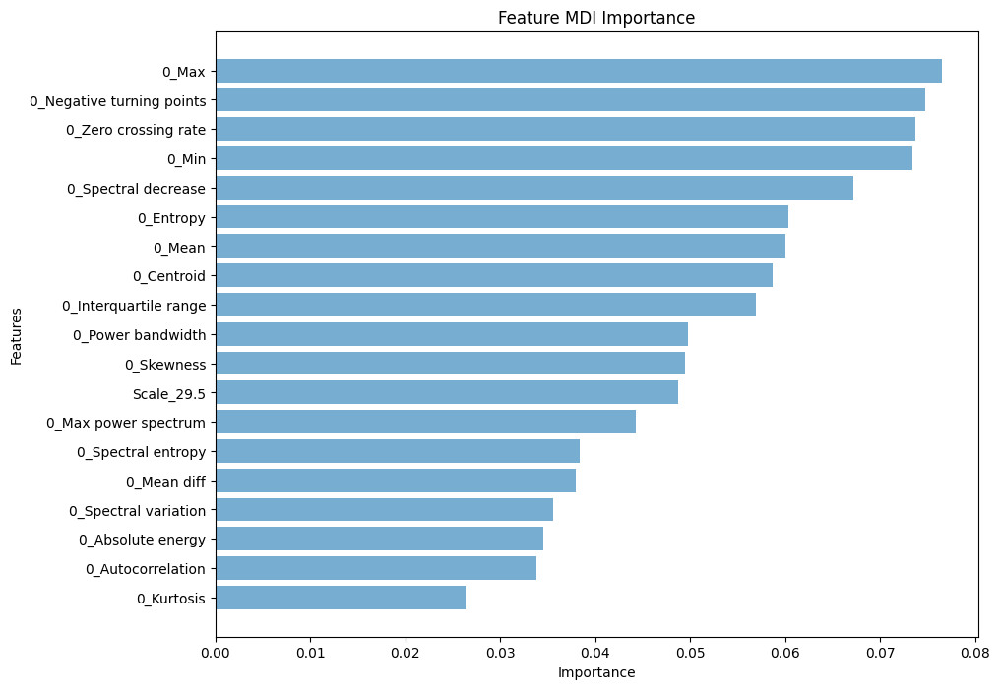

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=19, Auc: 57.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=18, Auc: 57.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=17, Auc: 51.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=16, Auc: 46.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=15, Auc: 50.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.038, n=14, Auc: 52.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=13, Auc: 49.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=12, Auc: 49.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=11, Auc: 52.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=10, Auc: 52.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=9, Auc: 51.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.059, n=8, Auc: 51.43%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=7, Auc: 46.62%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=6, Auc: 48.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.067, n=5, Auc: 44.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.073, n=4, Auc: 42.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.074, n=3, Auc: 46.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.075, n=2, Auc: 47.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=1, Auc: 48.99%
    Threshold  Num Features       AUC
0    0.026359            19  0.572427
1    0.033780            18  0.574231
2    0.034465            17  0.511718
3    0.035529            16  0.460348
4    0.037930            15  0.504307
5    0.038379            14  0.524213
6    0.044206            13  0.491906
7    0.048741            12  0.492484
8    0.049484            11  0.520377
9    0.049762            10  0.523313
10   0.056937             9  0.516897
11   0.058671             8  0.514285
12   0.059986             7  0.466231
13   0.060316             6  0.484585
14   0.067115             5  0.442288
15   0.073400             4  0.429786
16   0.073725             3  0.465495
17   0.074730             2  0.470346
18   0.076484             1  0.489927
Processing patient 30 with window size 288 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:24:10,646] A new study created in memory with name: no-name-aa1aae2b-cc4e-4f1a-8447-43b1d3d9daa1


13539
13539
13515
13515


[I 2024-07-18 19:24:11,292] Trial 0 finished with value: 0.5794175630775166 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5794175630775166.
[I 2024-07-18 19:24:12,020] Trial 1 finished with value: 0.6157659454467882 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6157659454467882.
[I 2024-07-18 19:24:12,591] Trial 2 finished with value: 0.5715527815767479 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.553392656611337, 'alpha': 1.3808461203806542e-05, 'max_depth': 7, 'eta': 0.0005806023466872183, 'gamma': 0.14768393071934388, 'subsample': 0.7152379440213525, 'colsample_bytree': 0.7954948834123547, 'grow_policy': 'lossguide', 'min_child_weight': 9}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.81      0.94      0.87     95257
         1.0       0.93      0.78      0.85     95257

    accuracy                           0.86    190514
   macro avg       0.87      0.86      0.86    190514
weighted avg       0.87      0.86      0.86    190514

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.94      0.93      0.93     12674
         1.0       0.11      0.14      0.12       864

    accuracy                           0.88     13538
   macro avg       0.53      0.53      0.53     13538
weighted avg       0.89      0.88      0.8

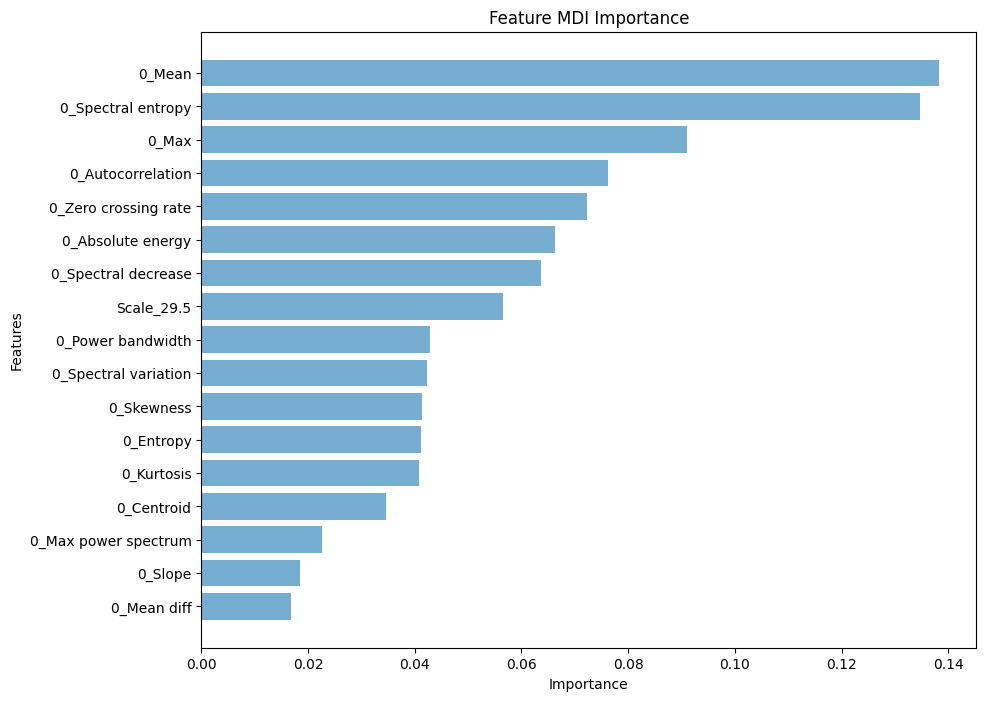

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=17, Auc: 69.35%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=16, Auc: 67.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=15, Auc: 68.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=14, Auc: 69.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=13, Auc: 67.28%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=12, Auc: 65.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=11, Auc: 65.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=10, Auc: 59.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=9, Auc: 64.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.057, n=8, Auc: 61.78%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.064, n=7, Auc: 55.09%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.066, n=6, Auc: 57.58%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.072, n=5, Auc: 61.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.076, n=4, Auc: 43.93%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.091, n=3, Auc: 54.49%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.135, n=2, Auc: 36.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.138, n=1, Auc: 39.39%
    Threshold  Num Features       AUC
0    0.016797            17  0.693514
1    0.018536            16  0.673633
2    0.022587            15  0.688860
3    0.034695            14  0.690982
4    0.040719            13  0.672802
5    0.041113            12  0.650449
6    0.041392            11  0.655622
7    0.042241            10  0.590034
8    0.042932             9  0.646967
9    0.056532             8  0.617779
10   0.063589             7  0.550938
11   0.066381             6  0.575837
12   0.072211             5  0.611317
13   0.076164             4  0.439344
14   0.091074             3  0.544882
15   0.134712             2  0.362275
16   0.138325             1  0.393904
Processing patient 30 with window size 288 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:25:20,072] A new study created in memory with name: no-name-3307eadf-2d75-400e-9395-29aef0103b17


13539
13539
13419
13419


[I 2024-07-18 19:25:20,793] Trial 0 finished with value: 0.6151343666532241 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6151343666532241.
[I 2024-07-18 19:25:21,524] Trial 1 finished with value: 0.6200764524485824 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6200764524485824.
[I 2024-07-18 19:25:22,054] Trial 2 finished with value: 0.673723482092239 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, '

Best parameters found by Optuna: {'lambda': 1.6714878152007893, 'alpha': 1.412912738185366e-05, 'max_depth': 4, 'eta': 0.00010872899678640058, 'gamma': 0.10200905001883087, 'subsample': 0.6890641999875278, 'colsample_bytree': 0.8670582385539175, 'grow_policy': 'lossguide', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.68      0.84      0.75     95353
         1.0       0.79      0.60      0.68     95353

    accuracy                           0.72    190706
   macro avg       0.73      0.72      0.71    190706
weighted avg       0.73      0.72      0.71    190706

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93     12674
         1.0       0.00      0.00      0.00       864

    accuracy                           0.87     13538
   macro avg       0.47      0.46      0.46     13538
weighted avg       0.87      0.87      0.

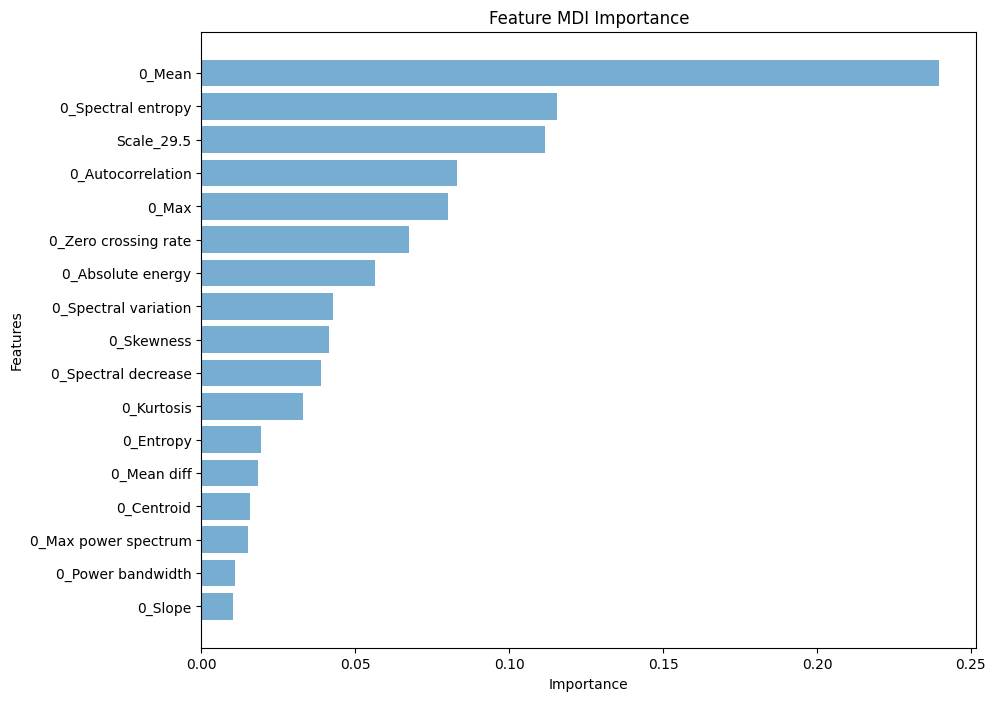

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.010, n=17, Auc: 75.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=16, Auc: 68.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.015, n=15, Auc: 70.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.016, n=14, Auc: 69.96%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=13, Auc: 70.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.019, n=12, Auc: 72.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=11, Auc: 70.60%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=10, Auc: 71.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=9, Auc: 64.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=8, Auc: 66.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=7, Auc: 68.41%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=6, Auc: 67.73%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.080, n=5, Auc: 58.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.083, n=4, Auc: 57.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.112, n=3, Auc: 53.47%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.116, n=2, Auc: 37.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.240, n=1, Auc: 47.01%
    Threshold  Num Features       AUC
0    0.010205            17  0.755343
1    0.011093            16  0.686426
2    0.015091            15  0.703368
3    0.015763            14  0.699574
4    0.018338            13  0.702465
5    0.019414            12  0.724639
6    0.032929            11  0.706028
7    0.038883            10  0.711066
8    0.041448             9  0.645299
9    0.042642             8  0.668431
10   0.056396             7  0.684058
11   0.067569             6  0.677341
12   0.080005             5  0.586991
13   0.083111             4  0.579737
14   0.111651             3  0.534736
15   0.115704             2  0.376091
16   0.239760             1  0.470122
Processing patient 31 with window size 24 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:26:09,689] A new study created in memory with name: no-name-19458621-3b3d-42cc-abb1-97eacb63e71e


14243
14243
14219
14219


[I 2024-07-18 19:26:10,376] Trial 0 finished with value: 0.6153429107311766 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6153429107311766.
[I 2024-07-18 19:26:11,237] Trial 1 finished with value: 0.624388445054407 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.624388445054407.
[I 2024-07-18 19:26:11,827] Trial 2 finished with value: 0.6052425697416297 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'g

Best parameters found by Optuna: {'lambda': 1.259682827526787, 'alpha': 60.48852903640953, 'max_depth': 10, 'eta': 1.4701188597606525e-05, 'gamma': 0.19067821109027216, 'subsample': 0.5897665222674904, 'colsample_bytree': 0.577549204772118, 'grow_policy': 'depthwise', 'min_child_weight': 3}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.86      0.95      0.90    108904
         1.0       0.94      0.85      0.89    108904

    accuracy                           0.90    217808
   macro avg       0.90      0.90      0.90    217808
weighted avg       0.90      0.90      0.90    217808

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.94      0.95     13573
         1.0       0.09      0.12      0.10       669

    accuracy                           0.90     14242
   macro avg       0.52      0.53      0.53     14242
weighted avg       0.92      0.90      0.91   

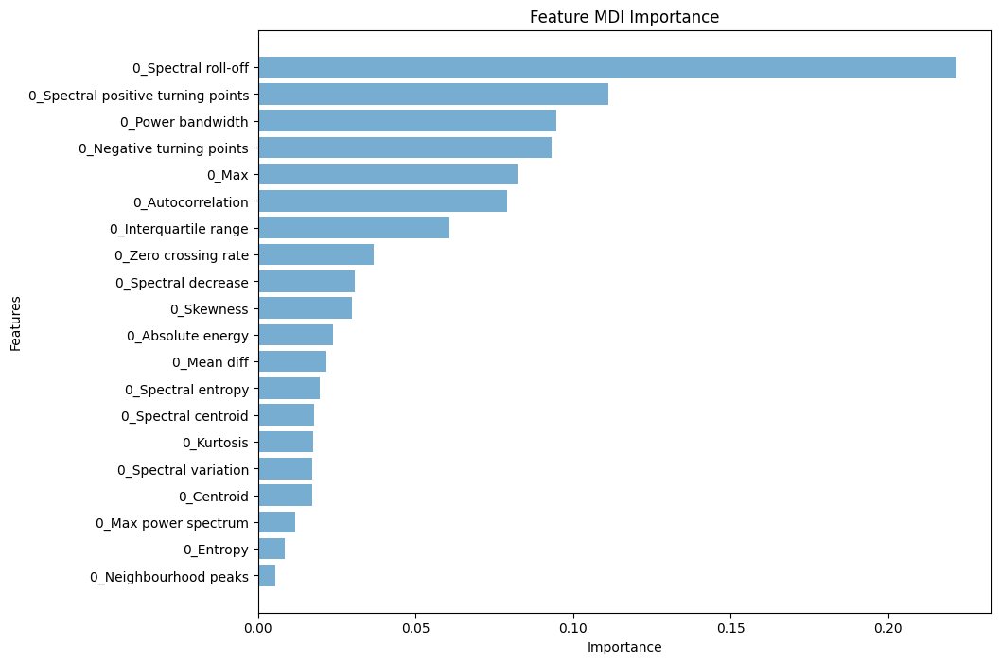

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.006, n=20, Auc: 63.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.008, n=19, Auc: 62.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.012, n=18, Auc: 62.53%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=17, Auc: 62.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=16, Auc: 62.20%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=15, Auc: 62.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.018, n=14, Auc: 62.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=13, Auc: 62.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=12, Auc: 62.90%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=11, Auc: 61.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=10, Auc: 60.04%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=9, Auc: 59.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=8, Auc: 59.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=7, Auc: 58.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.079, n=6, Auc: 56.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=5, Auc: 56.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.093, n=4, Auc: 50.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.095, n=3, Auc: 49.91%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.111, n=2, Auc: 46.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.222, n=1, Auc: 47.85%
    Threshold  Num Features       AUC
0    0.005528            20  0.635101
1    0.008355            19  0.627132
2    0.011699            18  0.625260
3    0.017040            17  0.622596
4    0.017267            16  0.622019
5    0.017461            15  0.623399
6    0.017847            14  0.625530
7    0.019502            13  0.622418
8    0.021787            12  0.628953
9    0.023875            11  0.612959
10   0.029853            10  0.600437
11   0.030565             9  0.599691
12   0.036741             8  0.592601
13   0.060586             7  0.581541
14   0.079084             6  0.566913
15   0.082318             5  0.568725
16   0.093064             4  0.503228
17   0.094584             3  0.499070
18   0.111174             2  0.462617
19   0.221672             1  0.478482
Processing patient 31 with window size 24 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:28:46,718] A new study created in memory with name: no-name-4e6e0e89-db37-4166-91cf-250e80a729ba


14243
14243
14123
14123


[I 2024-07-18 19:28:47,506] Trial 0 finished with value: 0.6574589272001427 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.6574589272001427.
[I 2024-07-18 19:28:48,281] Trial 1 finished with value: 0.6487433122184192 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.6574589272001427.
[I 2024-07-18 19:28:48,835] Trial 2 finished with value: 0.6616096778318197 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.8055703765268327, 'alpha': 3.52733122850119e-05, 'max_depth': 3, 'eta': 0.041922591046128346, 'gamma': 0.15651850249557925, 'subsample': 0.9993687691605533, 'colsample_bytree': 0.8319725275417855, 'grow_policy': 'lossguide', 'min_child_weight': 2}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.80      0.93      0.86    108904
         1.0       0.92      0.77      0.84    108904

    accuracy                           0.85    217808
   macro avg       0.86      0.85      0.85    217808
weighted avg       0.86      0.85      0.85    217808

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.91      0.93     13539
         1.0       0.12      0.23      0.15       703

    accuracy                           0.88     14242
   macro avg       0.54      0.57      0.54     14242
weighted avg       0.92      0.88      0.89 

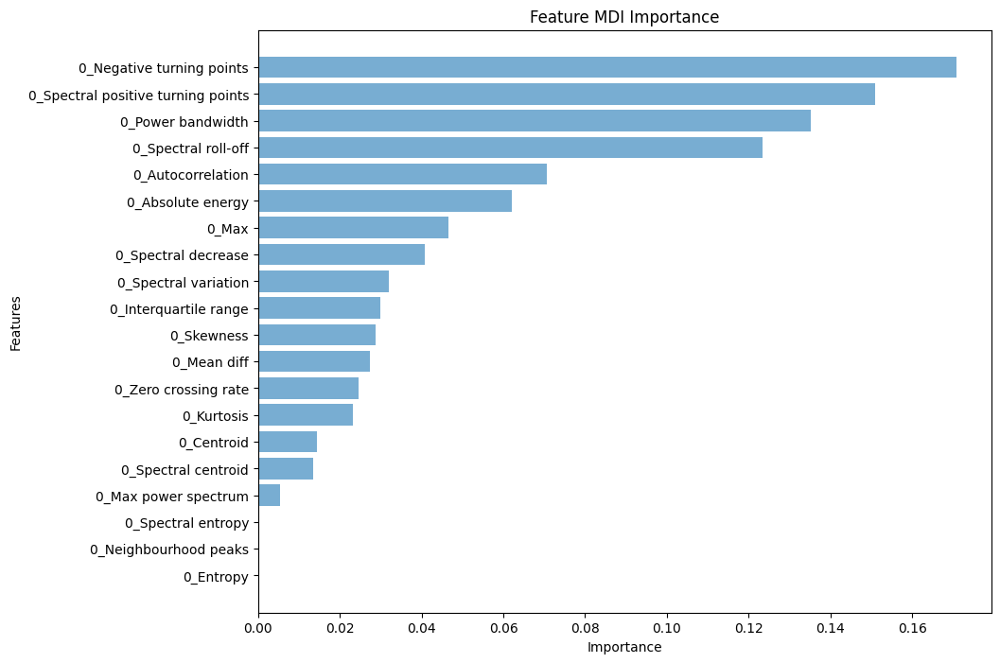

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 68.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 68.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.000, n=20, Auc: 68.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.005, n=17, Auc: 67.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=16, Auc: 68.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.014, n=15, Auc: 67.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.023, n=14, Auc: 67.46%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=13, Auc: 67.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=12, Auc: 67.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=11, Auc: 67.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=10, Auc: 67.83%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=9, Auc: 66.92%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=8, Auc: 66.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=7, Auc: 66.72%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=6, Auc: 65.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.071, n=5, Auc: 65.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.123, n=4, Auc: 65.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.135, n=3, Auc: 47.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.151, n=2, Auc: 50.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.171, n=1, Auc: 51.53%
    Threshold  Num Features       AUC
0    0.000000            20  0.681296
1    0.000000            20  0.681296
2    0.000000            20  0.681296
3    0.005425            17  0.678789
4    0.013581            16  0.680974
5    0.014436            15  0.676063
6    0.023289            14  0.674621
7    0.024587            13  0.676790
8    0.027395            12  0.675557
9    0.028861            11  0.672434
10   0.029984            10  0.678269
11   0.032062             9  0.669151
12   0.040768             8  0.667038
13   0.046658             7  0.667223
14   0.062109             6  0.652987
15   0.070521             5  0.654197
16   0.123283             4  0.650313
17   0.135235             3  0.476980
18   0.151003             2  0.501939
19   0.170802             1  0.515348
Processing patient 31 with window size 72 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:29:43,359] A new study created in memory with name: no-name-7c735795-8e26-4820-89d8-6f3e47df2f37


14243
14243
14219
14219


[I 2024-07-18 19:29:44,157] Trial 0 finished with value: 0.7158336069465 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7158336069465.
[I 2024-07-18 19:29:45,006] Trial 1 finished with value: 0.7203178368901134 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.7203178368901134.
[I 2024-07-18 19:29:45,581] Trial 2 finished with value: 0.7019548498140831 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'gamma

Best parameters found by Optuna: {'lambda': 1.9166361225842816, 'alpha': 61.89183602490043, 'max_depth': 10, 'eta': 0.005616417613725478, 'gamma': 0.11093654248907661, 'subsample': 0.5812295068338029, 'colsample_bytree': 0.5183975548542347, 'grow_policy': 'lossguide', 'min_child_weight': 1}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.86      0.86      0.86    101979
         1.0       0.86      0.86      0.86    101979

    accuracy                           0.86    203958
   macro avg       0.86      0.86      0.86    203958
weighted avg       0.86      0.86      0.86    203958

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.92      0.83      0.87     12578
         1.0       0.26      0.46      0.33      1664

    accuracy                           0.78     14242
   macro avg       0.59      0.64      0.60     14242
weighted avg       0.84      0.78      0.81   

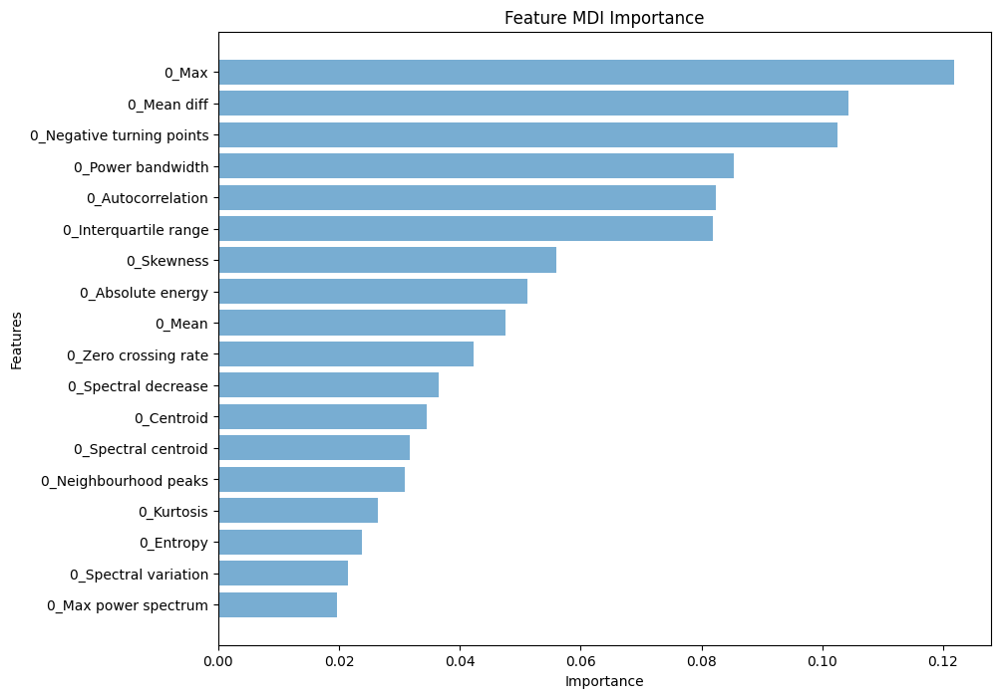

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.020, n=18, Auc: 72.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.021, n=17, Auc: 71.98%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.024, n=16, Auc: 72.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=15, Auc: 72.65%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=14, Auc: 73.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=13, Auc: 72.16%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=12, Auc: 72.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=11, Auc: 73.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=10, Auc: 72.37%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=9, Auc: 73.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=8, Auc: 73.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=7, Auc: 73.14%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=6, Auc: 73.18%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.082, n=5, Auc: 69.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.085, n=4, Auc: 69.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.103, n=3, Auc: 68.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.104, n=2, Auc: 68.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.122, n=1, Auc: 62.55%
    Threshold  Num Features       AUC
0    0.019578            18  0.727107
1    0.021468            17  0.719823
2    0.023715            16  0.720263
3    0.026371            15  0.726464
4    0.030941            14  0.730029
5    0.031684            13  0.721592
6    0.034442            12  0.725565
7    0.036471            11  0.733150
8    0.042245            10  0.723714
9    0.047603             9  0.733753
10   0.051129             8  0.732677
11   0.056041             7  0.731389
12   0.081928             6  0.731763
13   0.082304             5  0.699482
14   0.085425             4  0.691257
15   0.102508             3  0.682934
16   0.104322             2  0.680951
17   0.121826             1  0.625505
Processing patient 31 with window size 72 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:37:45,897] A new study created in memory with name: no-name-ac3cd311-9264-4122-91fe-74cbbc11cad0


14243
14243
14123
14123


[I 2024-07-18 19:37:46,596] Trial 0 finished with value: 0.675550730451191 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.675550730451191.
[I 2024-07-18 19:37:47,443] Trial 1 finished with value: 0.6762500356812337 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 1 with value: 0.6762500356812337.
[I 2024-07-18 19:37:47,999] Trial 2 finished with value: 0.6684942735375952 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'g

Best parameters found by Optuna: {'lambda': 1.376885023140192, 'alpha': 25.28677158428641, 'max_depth': 7, 'eta': 0.0039756367750149145, 'gamma': 0.10569740617975835, 'subsample': 0.5744378860746319, 'colsample_bytree': 0.5536383540151137, 'grow_policy': 'depthwise', 'min_child_weight': 5}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.77      0.78      0.77    101979
         1.0       0.77      0.77      0.77    101979

    accuracy                           0.77    203958
   macro avg       0.77      0.77      0.77    203958
weighted avg       0.77      0.77      0.77    203958

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.92      0.75      0.82     12544
         1.0       0.21      0.51      0.30      1698

    accuracy                           0.72     14242
   macro avg       0.57      0.63      0.56     14242
weighted avg       0.83      0.72      0.76    

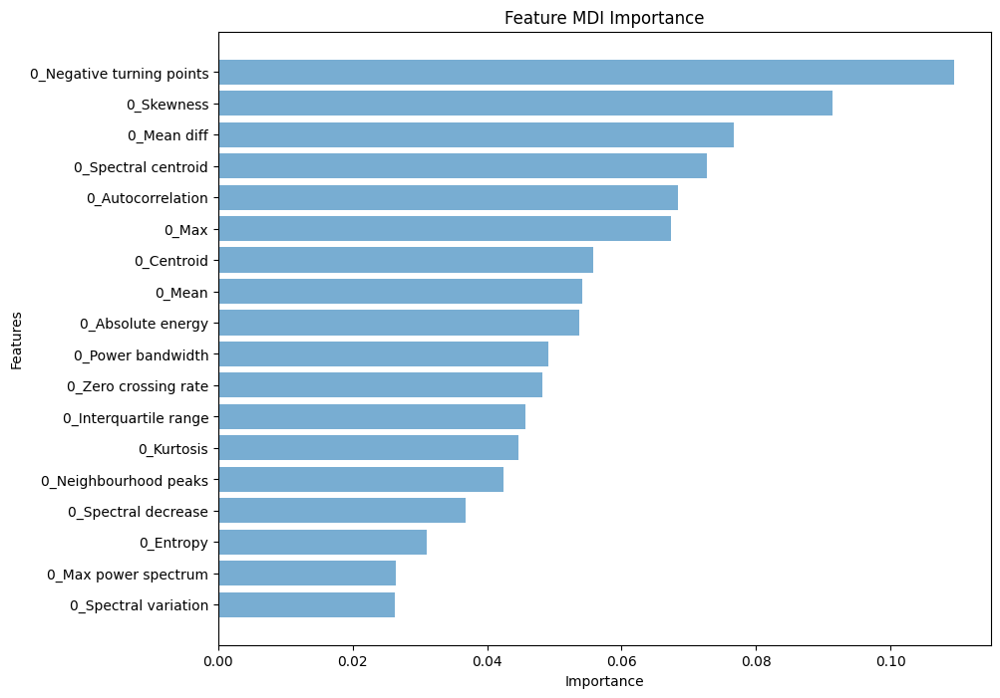

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=18, Auc: 68.42%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.026, n=17, Auc: 67.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.031, n=16, Auc: 68.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=15, Auc: 67.69%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.042, n=14, Auc: 68.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=13, Auc: 68.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.046, n=12, Auc: 68.38%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=11, Auc: 68.97%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=10, Auc: 67.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=9, Auc: 68.74%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=8, Auc: 68.00%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=7, Auc: 69.67%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.067, n=6, Auc: 68.70%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.068, n=5, Auc: 65.82%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.073, n=4, Auc: 64.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.077, n=3, Auc: 59.13%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.091, n=2, Auc: 54.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.109, n=1, Auc: 50.18%
    Threshold  Num Features       AUC
0    0.026271            18  0.684176
1    0.026388            17  0.679372
2    0.030993            16  0.682476
3    0.036854            15  0.676914
4    0.042406            14  0.681679
5    0.044582            13  0.682972
6    0.045724            12  0.683822
7    0.048186            11  0.689696
8    0.049169            10  0.672944
9    0.053680             9  0.687363
10   0.054155             8  0.679972
11   0.055732             7  0.696739
12   0.067353             6  0.686973
13   0.068386             5  0.658246
14   0.072657             4  0.646809
15   0.076689             3  0.591279
16   0.091306             2  0.549861
17   0.109466             1  0.501836
Processing patient 31 with window size 144 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:39:00,190] A new study created in memory with name: no-name-c027c35c-455b-4544-804d-beb750f7bcca


14239
14239
14215
14215


[I 2024-07-18 19:39:00,925] Trial 0 finished with value: 0.7177948116653516 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7177948116653516.
[I 2024-07-18 19:39:01,792] Trial 1 finished with value: 0.7077727169955608 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.7177948116653516.
[I 2024-07-18 19:39:02,370] Trial 2 finished with value: 0.6999069699743293 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.9559129381987654, 'alpha': 81.18316230475413, 'max_depth': 10, 'eta': 0.048073198061384444, 'gamma': 0.1903016168720214, 'subsample': 0.7403508399524615, 'colsample_bytree': 0.9633276238030628, 'grow_policy': 'depthwise', 'min_child_weight': 1}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.96      0.94      0.95     94256
         1.0       0.94      0.96      0.95     94256

    accuracy                           0.95    188512
   macro avg       0.95      0.95      0.95    188512
weighted avg       0.95      0.95      0.95    188512

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     11407
         1.0       0.52      0.46      0.49      2832

    accuracy                           0.81     14239
   macro avg       0.70      0.68      0.69     14239
weighted avg       0.80      0.81      0.80    

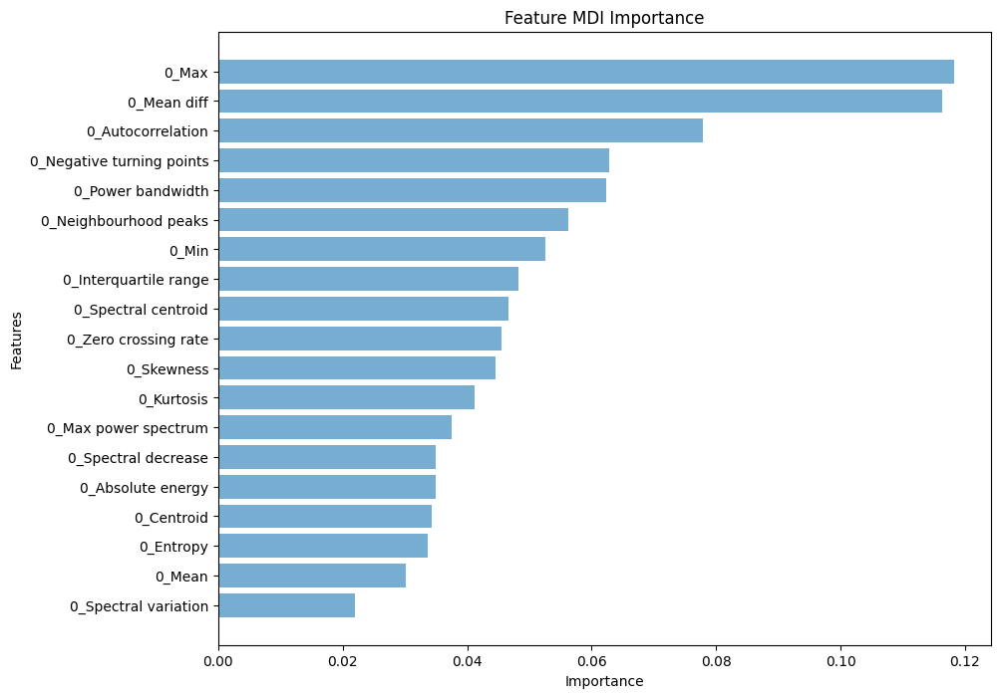

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.022, n=19, Auc: 73.45%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=18, Auc: 72.84%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=17, Auc: 72.64%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.034, n=16, Auc: 72.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=15, Auc: 72.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=14, Auc: 72.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.037, n=13, Auc: 73.15%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=12, Auc: 72.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=11, Auc: 71.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.045, n=10, Auc: 71.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=9, Auc: 72.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=8, Auc: 71.51%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=7, Auc: 69.25%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=6, Auc: 69.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=5, Auc: 67.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.063, n=4, Auc: 68.56%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.078, n=3, Auc: 67.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.116, n=2, Auc: 66.30%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.118, n=1, Auc: 64.33%
    Threshold  Num Features       AUC
0    0.022039            19  0.734467
1    0.030138            18  0.728444
2    0.033636            17  0.726430
3    0.034303            16  0.725527
4    0.034885            15  0.728758
5    0.034992            14  0.728577
6    0.037452            13  0.731478
7    0.041127            12  0.720105
8    0.044610            11  0.715506
9    0.045458            10  0.714444
10   0.046650             9  0.723091
11   0.048194             8  0.715053
12   0.052582             7  0.692494
13   0.056305             6  0.690143
14   0.062343             5  0.676290
15   0.062845             4  0.685560
16   0.077929             3  0.672376
17   0.116272             2  0.663013
18   0.118239             1  0.643316
Processing patient 31 with window size 144 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:42:36,529] A new study created in memory with name: no-name-f8d1a625-ba6f-4f9b-96b5-f69c6c4403ae


14239
14239
14119
14119


[I 2024-07-18 19:42:37,225] Trial 0 finished with value: 0.5851588600703117 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.5851588600703117.
[I 2024-07-18 19:42:38,104] Trial 1 finished with value: 0.5705101714638774 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.5851588600703117.
[I 2024-07-18 19:42:38,736] Trial 2 finished with value: 0.5763416503647212 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 

Best parameters found by Optuna: {'lambda': 1.0597717242344742, 'alpha': 0.004060293631558796, 'max_depth': 7, 'eta': 1.7495956464929862e-05, 'gamma': 0.16313167263935455, 'subsample': 0.5383618453064092, 'colsample_bytree': 0.511048774388224, 'grow_policy': 'depthwise', 'min_child_weight': 8}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.81      0.85      0.83     94256
         1.0       0.84      0.81      0.82     94256

    accuracy                           0.83    188512
   macro avg       0.83      0.83      0.83    188512
weighted avg       0.83      0.83      0.83    188512

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.83      0.77      0.80     11369
         1.0       0.28      0.36      0.31      2870

    accuracy                           0.69     14239
   macro avg       0.55      0.56      0.56     14239
weighted avg       0.72      0.69      0.70

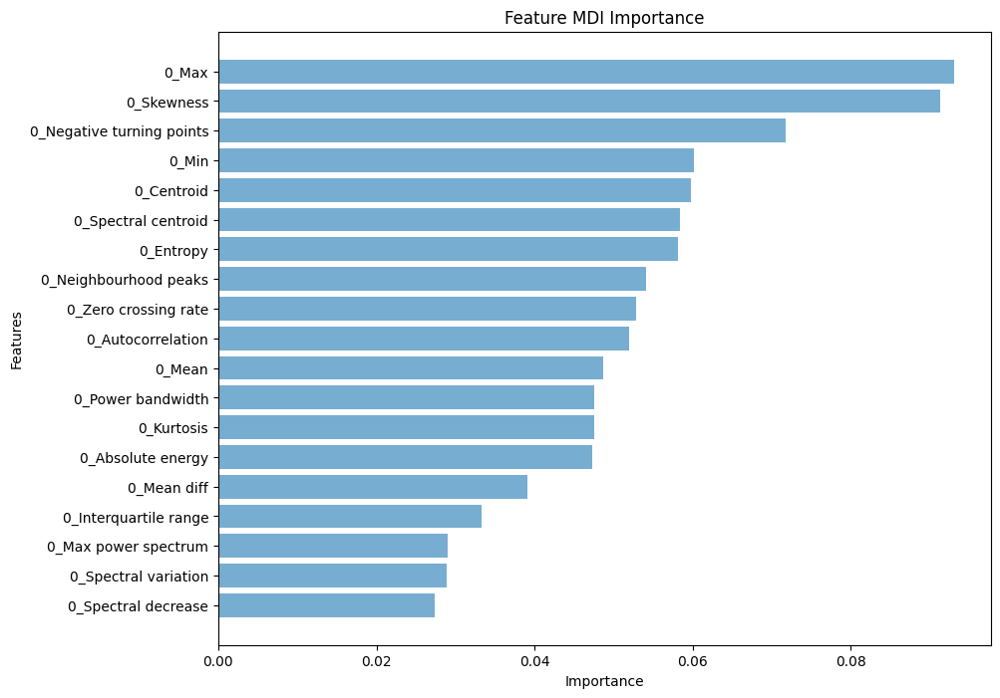

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=19, Auc: 60.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=18, Auc: 59.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=17, Auc: 60.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=16, Auc: 58.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.039, n=15, Auc: 59.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.047, n=14, Auc: 57.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=13, Auc: 57.21%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=12, Auc: 57.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=11, Auc: 59.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.052, n=10, Auc: 56.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=9, Auc: 58.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.054, n=8, Auc: 58.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=7, Auc: 60.23%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.058, n=6, Auc: 58.89%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=5, Auc: 57.36%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.060, n=4, Auc: 55.95%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.072, n=3, Auc: 52.54%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.091, n=2, Auc: 53.61%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.093, n=1, Auc: 49.54%
    Threshold  Num Features       AUC
0    0.027349            19  0.609930
1    0.028896            18  0.595192
2    0.028952            17  0.602142
3    0.033300            16  0.583202
4    0.039088            15  0.595504
5    0.047234            14  0.573304
6    0.047537            13  0.572131
7    0.047538            12  0.579356
8    0.048635            11  0.596329
9    0.051975            10  0.561655
10   0.052840             9  0.589401
11   0.054162             8  0.582923
12   0.058135             7  0.602287
13   0.058375             6  0.588851
14   0.059720             5  0.573612
15   0.060160             4  0.559464
16   0.071758             3  0.525398
17   0.091282             2  0.536149
18   0.093061             1  0.495415
Processing patient 31 with window size 288 with forecasting length 24


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:45:38,604] A new study created in memory with name: no-name-03463304-ae52-41d7-bacb-714cce261037


14225
14225
14201
14201


[I 2024-07-18 19:45:39,277] Trial 0 finished with value: 0.7265221989382149 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.7265221989382149.
[I 2024-07-18 19:45:40,084] Trial 1 finished with value: 0.7182793713254807 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.7265221989382149.
[I 2024-07-18 19:45:40,638] Trial 2 finished with value: 0.717918696527943 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, '

Best parameters found by Optuna: {'lambda': 1.7496316598082473, 'alpha': 0.0004319046828212671, 'max_depth': 9, 'eta': 0.023021864263122766, 'gamma': 0.1710310453923274, 'subsample': 0.9440913750560707, 'colsample_bytree': 0.764778477965498, 'grow_policy': 'lossguide', 'min_child_weight': 2}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98     81314
         1.0       0.98      0.98      0.98     81314

    accuracy                           0.98    162628
   macro avg       0.98      0.98      0.98    162628
weighted avg       0.98      0.98      0.98    162628

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.77      0.93      0.84      9623
         1.0       0.74      0.42      0.54      4602

    accuracy                           0.76     14225
   macro avg       0.75      0.67      0.69     14225
weighted avg       0.76      0.76      0.74  

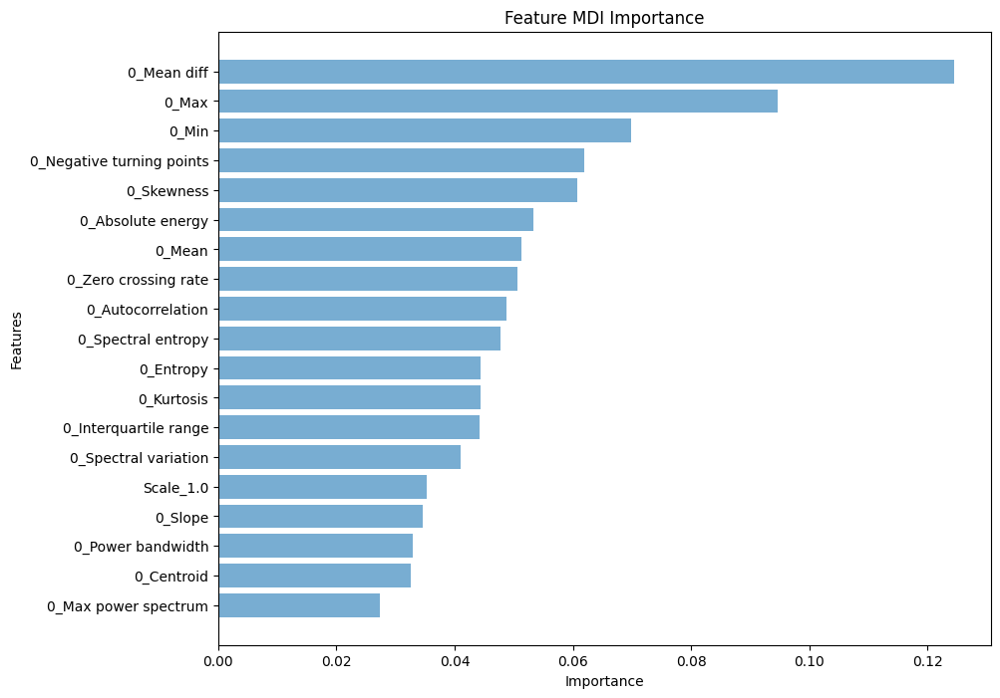

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.027, n=19, Auc: 75.33%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.032, n=18, Auc: 74.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.033, n=17, Auc: 72.94%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=16, Auc: 72.06%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.035, n=15, Auc: 70.87%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.041, n=14, Auc: 68.81%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=13, Auc: 70.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=12, Auc: 70.44%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.044, n=11, Auc: 68.11%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.048, n=10, Auc: 69.31%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.049, n=9, Auc: 68.55%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=8, Auc: 68.52%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.051, n=7, Auc: 66.57%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=6, Auc: 65.29%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=5, Auc: 67.75%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.062, n=4, Auc: 66.79%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.070, n=3, Auc: 68.24%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.095, n=2, Auc: 67.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.124, n=1, Auc: 65.88%
    Threshold  Num Features       AUC
0    0.027386            19  0.753252
1    0.032493            18  0.742634
2    0.032844            17  0.729353
3    0.034642            16  0.720596
4    0.035275            15  0.708703
5    0.041049            14  0.688107
6    0.044190            13  0.700723
7    0.044438            12  0.704356
8    0.044451            11  0.681093
9    0.047818            10  0.693053
10   0.048680             9  0.685521
11   0.050536             8  0.685175
12   0.051263             7  0.665724
13   0.053317             6  0.652941
14   0.060720             5  0.677501
15   0.061892             4  0.667914
16   0.069903             3  0.682364
17   0.094628             2  0.672615
18   0.124477             1  0.658780
Processing patient 31 with window size 288 with forecasting length 120


/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
[I 2024-07-18 19:49:05,510] A new study created in memory with name: no-name-5b1d712c-cdf5-4138-9e41-7b2abd054cee


14225
14225
14105
14105


[I 2024-07-18 19:49:06,167] Trial 0 finished with value: 0.666514137639231 and parameters: {'lambda': 1.296426233049547, 'alpha': 45.18560951024108, 'max_depth': 8, 'eta': 0.009846738873614562, 'gamma': 0.11142080469295271, 'subsample': 0.5779972601681014, 'colsample_bytree': 0.5290418060840998, 'grow_policy': 'depthwise', 'min_child_weight': 8}. Best is trial 0 with value: 0.666514137639231.
[I 2024-07-18 19:49:06,951] Trial 1 finished with value: 0.6649236899876196 and parameters: {'lambda': 1.0143703591411894, 'alpha': 61.56997328235202, 'max_depth': 9, 'eta': 0.00011526449540315612, 'gamma': 0.11343178571896925, 'subsample': 0.5917022549267169, 'colsample_bytree': 0.6521211214797689, 'grow_policy': 'depthwise', 'min_child_weight': 3}. Best is trial 0 with value: 0.666514137639231.
[I 2024-07-18 19:49:07,505] Trial 2 finished with value: 0.6482964694639394 and parameters: {'lambda': 1.5282206868683035, 'alpha': 9.472334467618546e-05, 'max_depth': 5, 'eta': 0.0006789053271698484, 'ga

Best parameters found by Optuna: {'lambda': 1.5280378249127446, 'alpha': 97.83720795822033, 'max_depth': 4, 'eta': 0.002040708204120596, 'gamma': 0.1526217197611681, 'subsample': 0.9451624394418148, 'colsample_bytree': 0.8174000445106318, 'grow_policy': 'depthwise', 'min_child_weight': 7}
Train classification report:
              precision    recall  f1-score   support

         0.0       0.68      0.77      0.72     81314
         1.0       0.73      0.64      0.68     81314

    accuracy                           0.70    162628
   macro avg       0.71      0.70      0.70    162628
weighted avg       0.71      0.70      0.70    162628

Validation classification report:
              precision    recall  f1-score   support

         0.0       0.76      0.73      0.74      9571
         1.0       0.49      0.53      0.51      4654

    accuracy                           0.66     14225
   macro avg       0.62      0.63      0.63     14225
weighted avg       0.67      0.66      0.67     

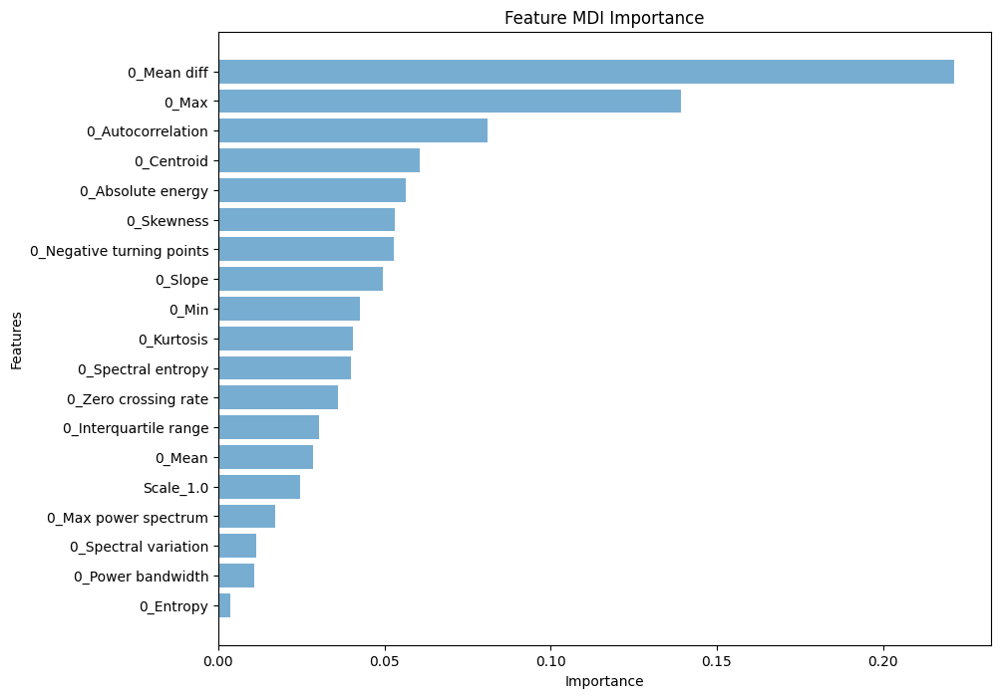

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.004, n=19, Auc: 68.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=18, Auc: 68.01%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.011, n=17, Auc: 67.99%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.017, n=16, Auc: 68.10%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.025, n=15, Auc: 68.19%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.029, n=14, Auc: 68.27%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.030, n=13, Auc: 67.68%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.036, n=12, Auc: 67.08%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=11, Auc: 68.17%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.040, n=10, Auc: 67.71%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.043, n=9, Auc: 67.07%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.050, n=8, Auc: 60.34%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=7, Auc: 59.26%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.053, n=6, Auc: 61.03%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.056, n=5, Auc: 62.86%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.061, n=4, Auc: 63.32%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.081, n=3, Auc: 60.63%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Thresh=0.139, n=2, Auc: 56.97%
Thresh=0.221, n=1, Auc: 61.16%
    Threshold  Num Features       AUC
0    0.003775            19  0.680683
1    0.010692            18  0.680093
2    0.011302            17  0.679936
3    0.017227            16  0.681036
4    0.024587            15  0.681891
5    0.028596            14  0.682690
6    0.030441            13  0.676778
7    0.035909            12  0.670846
8    0.039784            11  0.681712
9    0.040435            10  0.677069
10   0.042597             9  0.670712
11   0.049574             8  0.603436
12   0.052763             7  0.592589
13   0.053202             6  0.610264
14   0.056455             5  0.628617
15   0.060781             4  0.633204
16   0.081079             3  0.606273
17   0.139351             2  0.569679
18   0.221451             1  0.611627


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import plot_importance, plot_tree, XGBClassifier
from sklearn.model_selection import train_test_split
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.metrics import roc_auc_score, classification_report, accuracy_score
import optuna
import json
import os
from sklearn.feature_selection import SelectFromModel
from numpy import sort

def load_data(patient_id, window_size):
    data_path = f'/content/drive/My Drive/Msc Project/features_and_labels_detection/P{patient_id} features and seizure labels with window_{window_size}.csv'
    data = pd.read_csv(data_path)
    data = data.dropna()
    return data

def save_best_params(patient_id, window_size, best_params):
    if not os.path.exists(f'/content/drive/My Drive/Msc Project/Forecasting/best_params_xgb_all_features'):
        os.makedirs(f'/content/drive/My Drive/Msc Project/Forecasting/best_params_xgb_all_features')

    params_file = f'/content/drive/My Drive/Msc Project/Forecasting/best_params_xgb_all_features/params_patient_{patient_id}_window_{window_size}_forecasting_{forecasting_length}.json'
    with open(params_file, 'w') as file:
        json.dump(best_params, file)

def load_best_params(patient_id, window_size):
    params_file = f'/content/drive/My Drive/Msc Project/Forecasting/best_params_xgb_all_features/params_patient_{patient_id}_window_{window_size}_forecasting_{forecasting_length}.json'
    if os.path.exists(params_file):
        with open(params_file, 'r') as file:
            best_params = json.load(file)
        return best_params
    else:
        return None

def save_best_scores(patient_id, window_size, best_scores):
    if not os.path.exists(f'/content/drive/My Drive/Msc Project/Forecasting/best_scores_xgb_all_features'):
        os.makedirs(f'/content/drive/My Drive/Msc Project/Forecasting/best_scores_xgb_all_features')
    scores_file = f'/content/drive/My Drive/Msc Project/Forecasting/best_scores_xgb_all_features/best_scores_forecasting.csv'
    row_name = f'{patient_id}_window_{window_size}_forecasting_{forecasting_length}'
    scores_df = pd.DataFrame(best_scores, index=[row_name])
    if os.path.exists(scores_file):
        existing_df = pd.read_csv(scores_file, index_col=0)
        if row_name in existing_df.index:
            existing_df.loc[row_name] = scores_df.loc[row_name]
            existing_df.to_csv(scores_file)
        else:
            updated_df = pd.concat([existing_df, scores_df])
            updated_df.to_csv(scores_file)
    else:
        scores_df.to_csv(scores_file)

def run_optimization(patient_id, window_size,forecasting_length):
    data = load_data(patient_id, window_size)

    X = data.drop(columns=['label', 'timestamp', 'seizure_event', 'Unnamed: 0'])
    y = data['label']
    y = y.shift(-forecasting_length)

    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, shuffle=False, random_state=42)
    smote = SMOTE(random_state=42, n_jobs=-1)
    X_train, y_train = smote.fit_resample(X_train, y_train)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False, random_state=42)
    print(len(X_test))
    print(len(y_test))
    X_test = X_test.iloc[:-forecasting_length]
    y_test = y_test.iloc[:-forecasting_length]
    print(len(X_test))
    print(len(y_test))

    def objective(trial):
        params = {
            'verbosity': 1,
            'lambda': trial.suggest_float('lambda', 1.0, 2.0, log=True),
            'alpha': trial.suggest_float('alpha', 1e-5, 100.0, log=True),
            'max_depth': trial.suggest_int('max_depth', 3, 10),
            'eta': trial.suggest_float('eta', 1e-5, 1.0, log=True),
            'gamma': trial.suggest_float('gamma', 0.1, 0.2, log=True),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'grow_policy': trial.suggest_categorical('grow_policy', ['depthwise', 'lossguide']),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        }

        xgb_model = XGBClassifier(**params, use_label_encoder=False, eval_metric='auc', tree_method='hist', random_state=42, device='gpu', booster='gbtree', objective='binary:logistic')
        xgb_model.fit(X_train, y_train)
        y_pred_val_scores = xgb_model.predict_proba(X_val)[:,1]
        auc_val = roc_auc_score(y_val, y_pred_val_scores)
        return auc_val

    class EarlyStoppingCallback:
        def __init__(self, patience: int):
           self.patience = patience
           self.best_value = None
           self.no_improvement_count = 0

        def __call__(self, study, trial):
           if self.best_value is None or study.best_value > self.best_value:
            self.best_value = study.best_value
            self.no_improvement_count = 0
           else:
            self.no_improvement_count += 1
           if self.no_improvement_count >= self.patience:
            study.stop()

    study = optuna.create_study(direction='maximize',sampler=optuna.samplers.TPESampler(seed=42))

    best_params = load_best_params(patient_id, window_size)
    if best_params:
        study.enqueue_trial(best_params)
    early_stopping = EarlyStoppingCallback(patience=50)
    study.optimize(objective, n_trials=200,callbacks=[early_stopping])

    best_params = study.best_params
    print("Best parameters found by Optuna:", best_params)

    save_best_params(patient_id, window_size, best_params)

    xgb_model = XGBClassifier(**best_params, use_label_encoder=False, eval_metric='auc', tree_method='hist', random_state=42, device='gpu', booster='gbtree', objective='binary:logistic')
    xgb_model.fit(X_train, y_train)

    y_pred_train = xgb_model.predict(X_train)
    y_pred_val = xgb_model.predict(X_val)
    y_pred_test = xgb_model.predict(X_test)

    y_pred_train_scores = xgb_model.predict_proba(X_train)[:,1]
    auc_train = roc_auc_score(y_train, y_pred_train_scores)
    y_pred_val_scores = xgb_model.predict_proba(X_val)[:,1]
    auc_val = roc_auc_score(y_val, y_pred_val_scores)
    y_pred_test_scores = xgb_model.predict_proba(X_test)[:,1]
    auc_test = roc_auc_score(y_test, y_pred_test_scores)

    print("Train classification report:")
    print(classification_report(y_train, y_pred_train))

    print("Validation classification report:")
    print(classification_report(y_val, y_pred_val))

    print("Test classification report:")
    print(classification_report(y_test, y_pred_test))

    print("Train accuracy:", accuracy_score(y_train, y_pred_train))
    print("Validation accuracy:", accuracy_score(y_val, y_pred_val))
    print("Test accuracy:", accuracy_score(y_test, y_pred_test))

    print("Train AUC:", auc_train)
    print("Validation AUC:", auc_val)
    print("Test AUC:", auc_test)

    best_scores = {
        "auc": auc_test,
        "sensitivity": classification_report(y_test, y_pred_test, output_dict=True)['1.0']['recall'],
        "specificity": classification_report(y_test, y_pred_test, output_dict=True)['0.0']['recall'],
        "accuracy": accuracy_score(y_test, y_pred_test)
    }

    save_best_scores(patient_id, window_size, best_scores)
    feature_names = X.columns
    importances_MDI = xgb_model.feature_importances_
    sorted_idx = importances_MDI.argsort()
    importance_df_MDI = pd.DataFrame({'Importance': importances_MDI[sorted_idx]},index=feature_names[sorted_idx])
    importance_df_MDI.to_csv(f'/content/drive/My Drive/Msc Project/Forecasting/importance_feature/P{patient_id}MDI_importance with window_{window_size} with forecasting_{forecasting_length}.csv')
    # plot
    plt.figure(figsize=(10, 8))
    plt.barh(importance_df_MDI.index, importance_df_MDI['Importance'],align='center', alpha=0.6, ecolor='black', capsize=10)
    plt.xlabel('Importance')
    plt.ylabel('Features')
    plt.title('Feature MDI Importance')
    plt.show()

    # Fit model using each importance as a threshold
    thresholds = sort(xgb_model.feature_importances_)
    results = []
    for thresh in thresholds:
    # select features using threshold
      selection = SelectFromModel(xgb_model, threshold=thresh, prefit=True)
      select_X_train = selection.transform(X_train)
      # train model
      selection_model = XGBClassifier(**best_params,use_label_encoder=False,eval_metric='auc', tree_method='hist', random_state=42,device='gpu',booster='gbtree',objective='binary:logistic')
      selection_model.fit(select_X_train, y_train)
      # eval model
      select_X_val = selection.transform(X_val)
      predictions = selection_model.predict_proba(select_X_val)[:,1]
      auc = roc_auc_score(y_val, predictions)
      print("Thresh=%.3f, n=%d, Auc: %.2f%%" % (thresh, select_X_train.shape[1], auc*100.0))
      results.append((thresh, select_X_train.shape[1], auc))

    # Convert results to DataFrame for easier handling
    results_df = pd.DataFrame(results, columns=['Threshold', 'Num Features', 'AUC'])
    results_df.to_csv(f'/content/drive/My Drive/Msc Project/Forecasting/select_feature/P{patient_id}_selected_features_with_window_{window_size}_with_forecasting_{forecasting_length}.csv')
    print(results_df)

patient_ids = ['1_', '3_', '4_', '10', '13', '19', '23', '27', '29', '30', '31']
window_sizes = [24, 72, 144, 288]
forecasting_lengths = [24,120]# forecasting 2 hours and 10 hours

for patient_id in patient_ids:
    for window_size in window_sizes:
      for forecasting_length in forecasting_lengths:
        print(f"Processing patient {patient_id} with window size {window_size} with forecasting length {forecasting_length}")
        run_optimization(patient_id, window_size, forecasting_length)

